### List datasets that will be used for training with scBasset

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
cd ~/workspace/theislab/mubind-pipeline/notebooks/pipeline/01_train_n_predict/

/home/ilibarra/workspace/theislab/mubind-pipeline/notebooks/pipeline/01_train_n_predict


/home/ilibarra/miniconda3/envs/mubind/lib/python3.9/site-packages/IPython/core/magics/osm.py:393: UserWarning: using bookmarks requires you to install the `pickleshare` library.
  bkms = self.shell.db.get('bookmarks', {})
/home/ilibarra/miniconda3/envs/mubind/lib/python3.9/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [3]:
cd ..

/home/ilibarra/workspace/theislab/mubind-pipeline/notebooks/pipeline


In [4]:
import mubind as mb
import utils

In [5]:
cd 01_train_n_predict/

/home/ilibarra/workspace/theislab/mubind-pipeline/notebooks/pipeline/01_train_n_predict


In [6]:
path_by_dataset = utils.get_datasets()
for k in path_by_dataset:
    print(k)
    if k != 'pancreatic_endocrinogenesis':
        continue

organoids
gbm
noack_2022
pancreatic_endocrinogenesis
pbmc


In [7]:
import torch

# data_directory = '/mnt/f/workspace/theislab/mubind/data'
data_directory = '/home/ilibarra/workspace/theislab/mubind/data'

path_by_dataset = utils.get_datasets(data_directory=data_directory)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


move to relevant directory to execute scbasset

In [8]:
import scanpy as sc
# only focus on the peaks defined by scBasset during training/testing
import os
import h5py
import torch.optim as topti
import warnings
import torch.utils.data as tdata
import glob
import numpy as np

In [21]:
# prepare mubind's input based on what scBasset sees when calling its main trainer
def prepare_mubind_input(scbasset_ad_path,
                         adata,
                         k,
                         scbasset_split_file):
    species = 'hg38' if (k != 'noack_2022' and k != 'pancreatic_endocrinogenesis') else 'mm10'
    # gen_path = '/mnt/c/Users/IgnacioIbarra/Dropbox/annotations/%s/genome/%s.fa' % (species, species)

    print(k, species)
    gen_path = '/home/ilibarra/annotations/%s/genome/%s.fa' % (species, species)

    ad_scbasset = sc.read_h5ad(scbasset_ad_path)
    list(map(os.path.exists, [scbasset_split_file, scbasset_ad_path]))

    # csr matrices
    with h5py.File(scbasset_split_file, 'r') as hf:
        train_ids = hf['train_ids'][:]
        val_ids = hf['val_ids'][:]
        test_ids = hf['test_ids'][:]


    # print(adata.var)

    sep = '-' if k != 'gbm' else ':'
    adata.var['chr'] = np.where(adata.var_names.str.contains(':'),
                                adata.var_names.str.split(':').str[0],
                                adata.var_names.str.split('-').str[0])
    adata.var['chr'] = np.where(~adata.var['chr'].str.contains('chr'), 'chr', '') + adata.var['chr']

    colon_found = adata.var_names.str.contains(':').any()
    colon_found
    if colon_found:
        adata.var['start'] =   adata.var_names.str.split(':').str[1].str.split('-').str[0]
        adata.var['end'] = adata.var_names.str.split(':').str[1].str.split('-').str[1]
    else:
        adata.var['start'] = adata.var_names.str.split('-').str[1]
        adata.var['end'] = adata.var_names.str.split('-').str[2]
        
    # print(adata.var[['chr', 'start', 'end']])

    adata.var['seq_length'] = adata.var['end'].astype(int) - adata.var['start'].astype(int) + 1
    adata.var['k_summit'] = adata.var['chr'] + ':' + adata.var['start'] + '-' + adata.var['end']

    adata_train = adata[:,ad_scbasset.var_names[train_ids]].copy()
    adata_test = adata[:,ad_scbasset.var_names[test_ids]].copy()
    adata.shape, adata_train.shape, adata_test.shape


    n_seqs = None # None

    print('preparing sequences train...')
    seqs_train = mb.bindome.tl.get_sequences_from_bed(adata_train.var[['chr', 'start', 'end']].head(n_seqs),
                                                    gen_path=gen_path,
                                                    bin='/home/ilibarra/miniconda3/envs/mubind/bin/bedtools',
                                                    uppercase=True)
                                                # gen_path='../../../annotations/dm6/genome/dm6.fa')
    keys_train = set([s[0] for s in seqs_train])
    adata_train = adata_train[:,adata_train.var['k_summit'].isin(keys_train)]


    print('preparing sequences test...')
    seqs_test = mb.bindome.tl.get_sequences_from_bed(adata_test.var[['chr', 'start', 'end']].head(n_seqs),
                                                    gen_path=gen_path,
                                                    bin='/home/ilibarra/miniconda3/envs/mubind/bin/bedtools',
                                                    uppercase=True)
                                                # gen_path='../../../annotations/dm6/genome/dm6.fa')
    keys_test = set([s[0] for s in seqs_test])
    adata_test = adata_test[:,adata_test.var['k_summit'].isin(keys_test)]

    print(adata_train.shape, adata_test.shape)

    print('sum of reads', adata_train.X.sum())
    assert adata_train.X.sum() > 0

    df_train = utils.prepare_df(seqs_train, adata_train)
    df_test = utils.prepare_df(seqs_test, adata_test)

    df_train.shape, df_test.shape

    dataset_train = mb.datasets.SelexDataset(df_train,
                                            n_rounds=df_train.shape[1],
                                            enr_series=False)
    train = tdata.DataLoader(dataset=dataset_train,
                            batch_size=512,
                            shuffle=True)
    dataset_test = mb.datasets.SelexDataset(df_train,
                                            n_rounds=df_train.shape[1],
                                            enr_series=False)
    test = tdata.DataLoader(dataset=dataset_test,
                            batch_size=512,
                            shuffle=False)
    
    return adata_train, train, test

In [10]:
import bindome as bd
bd.constants.ANNOTATIONS_DIRECTORY = 'annotations'

In [11]:
import pandas as pd
ad_paths = []
for k in path_by_dataset:
    ad_paths += [ad_path for ad_path in glob.glob(path_by_dataset[k]) if 'obs' in ad_path]
n_obs = [f.split('_')[-2].replace('obs', '') for f in ad_paths]
n_obs

queries = pd.DataFrame()
queries['n_obs'] = n_obs
queries['path'] = ad_paths

queries['n_obs'] = np.where(queries['n_obs'] == 'ALL', 100000, queries['n_obs'])
queries['n_obs'] = queries['n_obs'].astype(int)



/home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/pancreas_multiome_2022_processed_atac_obs200_var600.h5ad
pancreatic_endocrinogenesis (200, 600)
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs200/pwms/fold_0/model.pt
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs200/pwms/fold_0/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/scbasset_input/obs200/fold_0/ad.h5ad
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs200/pwms/fold_1/model.pt
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs200/pwms/fold_1/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/scbasset_input/obs200/fold_1/ad.h5ad
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endoc

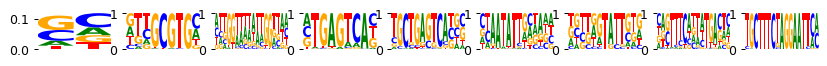

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.66it/s]


Current time: 2024-06-19 00:28:14.693592
	Loss: 281.197 , R2: 0.164
	Training time (model/function): (4.119s / 4.119s)
		per epoch (model/function): (0.294s/ 0.294s)
		per 1k samples: 0.220s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994482757078541, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.67it/s]


Current time: 2024-06-19 00:28:18.976838
	Loss: 220.859 , R2: 0.164
	Training time (model/function): (8.214s / 4.095s)
		per epoch (model/function): (0.587s/ 0.293s)
		per 1k samples: 0.218s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994482757078541, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.58it/s]


Current time: 2024-06-19 00:28:23.366339
	Loss: 193.956 , R2: 0.164
	Training time (model/function): (12.414s / 4.201s)
		per epoch (model/function): (0.887s/ 0.300s)
		per 1k samples: 0.224s
best loss 193.956
last five r2 values, by sequential filter optimization: ['0.164']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994482757078541, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.65it/s]


Current time: 2024-06-19 00:28:27.852096
	Loss: 181.224 , R2: 0.164
	Training time (model/function): (16.533s / 4.118s)
		per epoch (model/function): (1.181s/ 0.294s)
		per 1k samples: 0.220s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994482757078541, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.75it/s]


Current time: 2024-06-19 00:28:32.050726
	Loss: 166.220 , R2: 0.164
	Training time (model/function): (20.540s / 4.007s)
		per epoch (model/function): (1.467s/ 0.286s)
		per 1k samples: 0.214s
best loss 166.220
last five r2 values, by sequential filter optimization: ['0.164', '0.164']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994482757078541, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.65it/s]


Current time: 2024-06-19 00:28:36.629869
	Loss: 162.550 , R2: 0.164
	Training time (model/function): (24.663s / 4.124s)
		per epoch (model/function): (1.762s/ 0.295s)
		per 1k samples: 0.220s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994482757078541, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.76it/s]


Current time: 2024-06-19 00:28:40.822246
	Loss: 153.877 , R2: 0.164
	Training time (model/function): (28.666s / 4.003s)
		per epoch (model/function): (2.048s/ 0.286s)
		per 1k samples: 0.213s
best loss 153.877
last five r2 values, by sequential filter optimization: ['0.164', '0.164', '0.164']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994482757078541, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.63it/s]


Current time: 2024-06-19 00:28:45.417476
	Loss: 154.451 , R2: 0.164
	Training time (model/function): (32.809s / 4.143s)
		per epoch (model/function): (2.343s/ 0.296s)
		per 1k samples: 0.221s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994482757078541, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.78it/s]


Current time: 2024-06-19 00:28:49.582193
	Loss: 148.583 , R2: 0.164
	Training time (model/function): (36.784s / 3.975s)
		per epoch (model/function): (2.627s/ 0.284s)
		per 1k samples: 0.212s
best loss 148.583
last five r2 values, by sequential filter optimization: ['0.164', '0.164', '0.164', '0.164']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994482757078541, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.68it/s]


Current time: 2024-06-19 00:28:54.038002
	Loss: 150.988 , R2: 0.164
	Training time (model/function): (40.871s / 4.087s)
		per epoch (model/function): (2.919s/ 0.292s)
		per 1k samples: 0.218s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994482757078541, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.72it/s]


Current time: 2024-06-19 00:28:58.352805
	Loss: 146.327 , R2: 0.164
	Training time (model/function): (44.913s / 4.042s)
		per epoch (model/function): (3.208s/ 0.289s)
		per 1k samples: 0.215s
best loss 146.327
last five r2 values, by sequential filter optimization: ['0.164', '0.164', '0.164', '0.164', '0.164']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994482757078541, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 44.912829875946045s
Time per epoch (total): 0.010 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_1/model_1.pt
/home/ilibarra/workspace/theislab/mubind

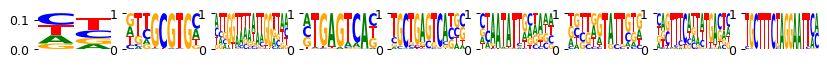

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.33it/s]


Current time: 2024-06-19 00:29:03.288241
	Loss: 249.030 , R2: 0.176
	Training time (model/function): (1.460s / 1.460s)
		per epoch (model/function): (0.104s/ 0.104s)
		per 1k samples: 0.078s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999536724382107, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.74it/s]


Current time: 2024-06-19 00:29:05.026708
	Loss: 220.752 , R2: 0.177
	Training time (model/function): (3.009s / 1.548s)
		per epoch (model/function): (0.215s/ 0.111s)
		per 1k samples: 0.082s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999536724382107, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 11.10it/s]


Current time: 2024-06-19 00:29:06.590493
	Loss: 193.952 , R2: 0.177
	Training time (model/function): (4.369s / 1.360s)
		per epoch (model/function): (0.312s/ 0.097s)
		per 1k samples: 0.072s
best loss 193.952
last five r2 values, by sequential filter optimization: ['0.177']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999536724382107, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.14it/s]


Current time: 2024-06-19 00:29:08.450720
	Loss: 181.209 , R2: 0.178
	Training time (model/function): (5.858s / 1.489s)
		per epoch (model/function): (0.418s/ 0.106s)
		per 1k samples: 0.079s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999536724382107, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.39it/s]


Current time: 2024-06-19 00:29:10.094846
	Loss: 166.210 , R2: 0.178
	Training time (model/function): (7.311s / 1.453s)
		per epoch (model/function): (0.522s/ 0.104s)
		per 1k samples: 0.077s
best loss 166.210
last five r2 values, by sequential filter optimization: ['0.177', '0.178']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999536724382107, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.23it/s]


Current time: 2024-06-19 00:29:11.938651
	Loss: 162.540 , R2: 0.180
	Training time (model/function): (8.785s / 1.475s)
		per epoch (model/function): (0.628s/ 0.105s)
		per 1k samples: 0.079s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999536724382107, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 11.06it/s]


Current time: 2024-06-19 00:29:13.494636
	Loss: 153.865 , R2: 0.180
	Training time (model/function): (10.150s / 1.365s)
		per epoch (model/function): (0.725s/ 0.098s)
		per 1k samples: 0.073s
best loss 153.865
last five r2 values, by sequential filter optimization: ['0.177', '0.178', '0.180']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999536724382107, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.32it/s]


Current time: 2024-06-19 00:29:15.409441
	Loss: 154.442 , R2: 0.181
	Training time (model/function): (11.613s / 1.463s)
		per epoch (model/function): (0.830s/ 0.104s)
		per 1k samples: 0.078s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999536724382107, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 11.22it/s]


Current time: 2024-06-19 00:29:16.944265
	Loss: 148.571 , R2: 0.181
	Training time (model/function): (12.959s / 1.345s)
		per epoch (model/function): (0.926s/ 0.096s)
		per 1k samples: 0.072s
best loss 148.571
last five r2 values, by sequential filter optimization: ['0.177', '0.178', '0.180', '0.181']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999536724382107, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.24it/s]


Current time: 2024-06-19 00:29:18.784009
	Loss: 150.988 , R2: 0.182
	Training time (model/function): (14.432s / 1.473s)
		per epoch (model/function): (1.031s/ 0.105s)
		per 1k samples: 0.078s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999536724382107, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.59it/s]


Current time: 2024-06-19 00:29:20.398915
	Loss: 146.317 , R2: 0.182
	Training time (model/function): (15.857s / 1.425s)
		per epoch (model/function): (1.133s/ 0.102s)
		per 1k samples: 0.076s
best loss 146.317
last five r2 values, by sequential filter optimization: ['0.177', '0.178', '0.180', '0.181', '0.182']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999536724382107, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 15.85734248161316s
Time per epoch (total): 0.004 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_1/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


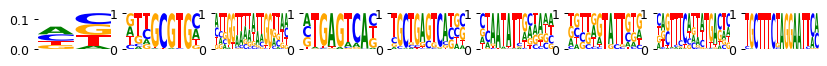

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.65it/s]


Current time: 2024-06-19 00:29:27.608857
	Loss: 281.789 , R2: 0.174
	Training time (model/function): (4.127s / 4.127s)
		per epoch (model/function): (0.295s/ 0.295s)
		per 1k samples: 0.220s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995328841385366, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.57it/s]


Current time: 2024-06-19 00:29:32.009614
	Loss: 220.866 , R2: 0.174
	Training time (model/function): (8.338s / 4.211s)
		per epoch (model/function): (0.596s/ 0.301s)
		per 1k samples: 0.224s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995328841385366, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.68it/s]


Current time: 2024-06-19 00:29:36.282245
	Loss: 193.960 , R2: 0.174
	Training time (model/function): (12.422s / 4.084s)
		per epoch (model/function): (0.887s/ 0.292s)
		per 1k samples: 0.218s
best loss 193.960
last five r2 values, by sequential filter optimization: ['0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995328841385366, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.59it/s]


Current time: 2024-06-19 00:29:40.841933
	Loss: 181.227 , R2: 0.175
	Training time (model/function): (16.613s / 4.191s)
		per epoch (model/function): (1.187s/ 0.299s)
		per 1k samples: 0.223s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995328841385366, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.73it/s]


Current time: 2024-06-19 00:29:45.062529
	Loss: 166.224 , R2: 0.174
	Training time (model/function): (20.643s / 4.030s)
		per epoch (model/function): (1.474s/ 0.288s)
		per 1k samples: 0.215s
best loss 166.224
last five r2 values, by sequential filter optimization: ['0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995328841385366, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.59it/s]


Current time: 2024-06-19 00:29:49.615669
	Loss: 162.553 , R2: 0.174
	Training time (model/function): (24.829s / 4.186s)
		per epoch (model/function): (1.773s/ 0.299s)
		per 1k samples: 0.223s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995328841385366, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.69it/s]


Current time: 2024-06-19 00:29:53.882073
	Loss: 153.877 , R2: 0.174
	Training time (model/function): (28.904s / 4.075s)
		per epoch (model/function): (2.065s/ 0.291s)
		per 1k samples: 0.217s
best loss 153.877
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995328841385366, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.66it/s]


Current time: 2024-06-19 00:29:58.356016
	Loss: 154.454 , R2: 0.174
	Training time (model/function): (33.010s / 4.106s)
		per epoch (model/function): (2.358s/ 0.293s)
		per 1k samples: 0.219s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995328841385366, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.79it/s]


Current time: 2024-06-19 00:30:02.600190
	Loss: 148.587 , R2: 0.174
	Training time (model/function): (36.978s / 3.968s)
		per epoch (model/function): (2.641s/ 0.283s)
		per 1k samples: 0.211s
best loss 148.587
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995328841385366, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.69it/s]


Current time: 2024-06-19 00:30:07.045345
	Loss: 150.992 , R2: 0.174
	Training time (model/function): (41.056s / 4.077s)
		per epoch (model/function): (2.933s/ 0.291s)
		per 1k samples: 0.217s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995328841385366, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.80it/s]


Current time: 2024-06-19 00:30:11.189386
	Loss: 146.329 , R2: 0.174
	Training time (model/function): (45.010s / 3.955s)
		per epoch (model/function): (3.215s/ 0.282s)
		per 1k samples: 0.211s
best loss 146.329
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995328841385366, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 45.01037812232971s
Time per epoch (total): 0.010 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_2/model_1.pt
/home/ilibarra/workspace/theislab/mubind/

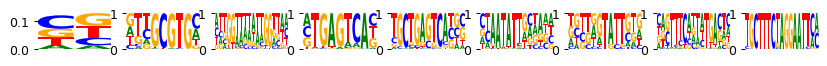

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.45it/s]


Current time: 2024-06-19 00:30:16.175758
	Loss: 249.028 , R2: 0.176
	Training time (model/function): (1.445s / 1.445s)
		per epoch (model/function): (0.103s/ 0.103s)
		per 1k samples: 0.077s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993995741275528, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.49it/s]


Current time: 2024-06-19 00:30:17.802723
	Loss: 220.752 , R2: 0.177
	Training time (model/function): (2.883s / 1.438s)
		per epoch (model/function): (0.206s/ 0.103s)
		per 1k samples: 0.077s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993995741275528, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 11.28it/s]


Current time: 2024-06-19 00:30:19.423685
	Loss: 193.951 , R2: 0.177
	Training time (model/function): (4.220s / 1.338s)
		per epoch (model/function): (0.301s/ 0.096s)
		per 1k samples: 0.071s
best loss 193.951
last five r2 values, by sequential filter optimization: ['0.177']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993995741275528, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.32it/s]


Current time: 2024-06-19 00:30:21.254115
	Loss: 181.207 , R2: 0.178
	Training time (model/function): (5.682s / 1.462s)
		per epoch (model/function): (0.406s/ 0.104s)
		per 1k samples: 0.078s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993995741275528, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 11.11it/s]


Current time: 2024-06-19 00:30:22.803711
	Loss: 166.208 , R2: 0.178
	Training time (model/function): (7.041s / 1.358s)
		per epoch (model/function): (0.503s/ 0.097s)
		per 1k samples: 0.072s
best loss 166.208
last five r2 values, by sequential filter optimization: ['0.177', '0.178']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993995741275528, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.32it/s]


Current time: 2024-06-19 00:30:24.718699
	Loss: 162.537 , R2: 0.179
	Training time (model/function): (8.502s / 1.461s)
		per epoch (model/function): (0.607s/ 0.104s)
		per 1k samples: 0.078s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993995741275528, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 11.18it/s]


Current time: 2024-06-19 00:30:26.258766
	Loss: 153.864 , R2: 0.179
	Training time (model/function): (9.852s / 1.350s)
		per epoch (model/function): (0.704s/ 0.096s)
		per 1k samples: 0.072s
best loss 153.864
last five r2 values, by sequential filter optimization: ['0.177', '0.178', '0.179']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993995741275528, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.25it/s]


Current time: 2024-06-19 00:30:28.184942
	Loss: 154.441 , R2: 0.180
	Training time (model/function): (11.324s / 1.472s)
		per epoch (model/function): (0.809s/ 0.105s)
		per 1k samples: 0.078s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993995741275528, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 11.27it/s]


Current time: 2024-06-19 00:30:29.714944
	Loss: 148.570 , R2: 0.180
	Training time (model/function): (12.663s / 1.339s)
		per epoch (model/function): (0.905s/ 0.096s)
		per 1k samples: 0.071s
best loss 148.570
last five r2 values, by sequential filter optimization: ['0.177', '0.178', '0.179', '0.180']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993995741275528, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.33it/s]


Current time: 2024-06-19 00:30:31.543718
	Loss: 150.985 , R2: 0.182
	Training time (model/function): (14.124s / 1.460s)
		per epoch (model/function): (1.009s/ 0.104s)
		per 1k samples: 0.078s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993995741275528, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 11.29it/s]


Current time: 2024-06-19 00:30:33.071643
	Loss: 146.316 , R2: 0.182
	Training time (model/function): (15.461s / 1.337s)
		per epoch (model/function): (1.104s/ 0.096s)
		per 1k samples: 0.071s
best loss 146.316
last five r2 values, by sequential filter optimization: ['0.177', '0.178', '0.179', '0.180', '0.182']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993995741275528, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 15.460772514343262s
Time per epoch (total): 0.004 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_2/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


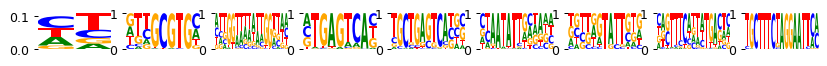

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.66it/s]


Current time: 2024-06-19 00:30:40.267638
	Loss: 282.839 , R2: 0.174
	Training time (model/function): (4.106s / 4.106s)
		per epoch (model/function): (0.293s/ 0.293s)
		per 1k samples: 0.219s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994051905420132, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.67it/s]


Current time: 2024-06-19 00:30:44.551305
	Loss: 220.865 , R2: 0.174
	Training time (model/function): (8.202s / 4.096s)
		per epoch (model/function): (0.586s/ 0.293s)
		per 1k samples: 0.218s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994051905420132, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.67it/s]


Current time: 2024-06-19 00:30:48.840824
	Loss: 193.957 , R2: 0.174
	Training time (model/function): (12.302s / 4.100s)
		per epoch (model/function): (0.879s/ 0.293s)
		per 1k samples: 0.219s
best loss 193.957
last five r2 values, by sequential filter optimization: ['0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994051905420132, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.67it/s]


Current time: 2024-06-19 00:30:53.305199
	Loss: 181.225 , R2: 0.174
	Training time (model/function): (16.398s / 4.096s)
		per epoch (model/function): (1.171s/ 0.293s)
		per 1k samples: 0.218s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994051905420132, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.70it/s]


Current time: 2024-06-19 00:30:57.690718
	Loss: 166.219 , R2: 0.174
	Training time (model/function): (20.463s / 4.065s)
		per epoch (model/function): (1.462s/ 0.290s)
		per 1k samples: 0.217s
best loss 166.219
last five r2 values, by sequential filter optimization: ['0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994051905420132, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.67it/s]


Current time: 2024-06-19 00:31:02.165586
	Loss: 162.551 , R2: 0.174
	Training time (model/function): (24.561s / 4.098s)
		per epoch (model/function): (1.754s/ 0.293s)
		per 1k samples: 0.218s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994051905420132, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.70it/s]


Current time: 2024-06-19 00:31:06.432129
	Loss: 153.877 , R2: 0.174
	Training time (model/function): (28.623s / 4.062s)
		per epoch (model/function): (2.044s/ 0.290s)
		per 1k samples: 0.217s
best loss 153.877
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994051905420132, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.44it/s]


Current time: 2024-06-19 00:31:11.179962
	Loss: 154.451 , R2: 0.174
	Training time (model/function): (32.994s / 4.371s)
		per epoch (model/function): (2.357s/ 0.312s)
		per 1k samples: 0.233s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994051905420132, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.78it/s]


Current time: 2024-06-19 00:31:15.349495
	Loss: 148.586 , R2: 0.174
	Training time (model/function): (36.972s / 3.979s)
		per epoch (model/function): (2.641s/ 0.284s)
		per 1k samples: 0.212s
best loss 148.586
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994051905420132, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.36it/s]


Current time: 2024-06-19 00:31:20.206680
	Loss: 150.993 , R2: 0.174
	Training time (model/function): (41.449s / 4.477s)
		per epoch (model/function): (2.961s/ 0.320s)
		per 1k samples: 0.239s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994051905420132, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.67it/s]


Current time: 2024-06-19 00:31:26.034459
	Loss: 146.332 , R2: 0.174
	Training time (model/function): (47.077s / 5.628s)
		per epoch (model/function): (3.363s/ 0.402s)
		per 1k samples: 0.300s
best loss 146.332
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994051905420132, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 47.07739973068237s
Time per epoch (total): 0.011 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_3/model_1.pt
/home/ilibarra/workspace/theislab/mubind/

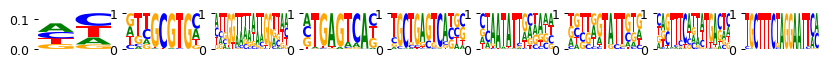

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.74it/s]


Current time: 2024-06-19 00:31:31.281397
	Loss: 249.027 , R2: 0.176
	Training time (model/function): (1.548s / 1.548s)
		per epoch (model/function): (0.111s/ 0.111s)
		per 1k samples: 0.082s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994229568434964, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.67it/s]


Current time: 2024-06-19 00:31:33.034098
	Loss: 220.747 , R2: 0.177
	Training time (model/function): (3.107s / 1.559s)
		per epoch (model/function): (0.222s/ 0.111s)
		per 1k samples: 0.083s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994229568434964, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.28it/s]


Current time: 2024-06-19 00:31:34.696012
	Loss: 193.947 , R2: 0.177
	Training time (model/function): (4.575s / 1.468s)
		per epoch (model/function): (0.327s/ 0.105s)
		per 1k samples: 0.078s
best loss 193.947
last five r2 values, by sequential filter optimization: ['0.177']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994229568434964, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.49it/s]


Current time: 2024-06-19 00:31:36.666933
	Loss: 181.206 , R2: 0.178
	Training time (model/function): (6.165s / 1.590s)
		per epoch (model/function): (0.440s/ 0.114s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994229568434964, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.81it/s]


Current time: 2024-06-19 00:31:38.492912
	Loss: 166.205 , R2: 0.179
	Training time (model/function): (7.704s / 1.538s)
		per epoch (model/function): (0.550s/ 0.110s)
		per 1k samples: 0.082s
best loss 166.205
last five r2 values, by sequential filter optimization: ['0.177', '0.179']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994229568434964, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.40it/s]


Current time: 2024-06-19 00:31:40.475625
	Loss: 162.538 , R2: 0.180
	Training time (model/function): (9.308s / 1.605s)
		per epoch (model/function): (0.665s/ 0.115s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994229568434964, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.94it/s]


Current time: 2024-06-19 00:31:42.189625
	Loss: 153.861 , R2: 0.180
	Training time (model/function): (10.826s / 1.518s)
		per epoch (model/function): (0.773s/ 0.108s)
		per 1k samples: 0.081s
best loss 153.861
last five r2 values, by sequential filter optimization: ['0.177', '0.179', '0.180']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994229568434964, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.62it/s]


Current time: 2024-06-19 00:31:44.242187
	Loss: 154.433 , R2: 0.181
	Training time (model/function): (12.395s / 1.569s)
		per epoch (model/function): (0.885s/ 0.112s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994229568434964, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.70it/s]


Current time: 2024-06-19 00:31:45.847356
	Loss: 148.570 , R2: 0.181
	Training time (model/function): (13.806s / 1.411s)
		per epoch (model/function): (0.986s/ 0.101s)
		per 1k samples: 0.075s
best loss 148.570
last five r2 values, by sequential filter optimization: ['0.177', '0.179', '0.180', '0.181']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994229568434964, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.45it/s]


Current time: 2024-06-19 00:31:47.822941
	Loss: 150.978 , R2: 0.182
	Training time (model/function): (15.401s / 1.595s)
		per epoch (model/function): (1.100s/ 0.114s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994229568434964, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.50it/s]


Current time: 2024-06-19 00:31:49.544890
	Loss: 146.315 , R2: 0.182
	Training time (model/function): (16.839s / 1.437s)
		per epoch (model/function): (1.203s/ 0.103s)
		per 1k samples: 0.077s
best loss 146.315
last five r2 values, by sequential filter optimization: ['0.177', '0.179', '0.180', '0.181', '0.182']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994229568434964, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 16.83853793144226s
Time per epoch (total): 0.004 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_3/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


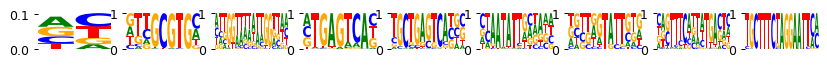

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.72it/s]


Current time: 2024-06-19 00:31:58.148501
	Loss: 282.091 , R2: 0.174
	Training time (model/function): (5.518s / 5.518s)
		per epoch (model/function): (0.394s/ 0.394s)
		per 1k samples: 0.294s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995313477859147, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.62it/s]


Current time: 2024-06-19 00:32:04.085061
	Loss: 220.859 , R2: 0.174
	Training time (model/function): (11.261s / 5.743s)
		per epoch (model/function): (0.804s/ 0.410s)
		per 1k samples: 0.306s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995313477859147, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.02it/s]


Current time: 2024-06-19 00:32:09.258551
	Loss: 193.956 , R2: 0.174
	Training time (model/function): (16.238s / 4.977s)
		per epoch (model/function): (1.160s/ 0.356s)
		per 1k samples: 0.265s
best loss 193.956
last five r2 values, by sequential filter optimization: ['0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995313477859147, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.97it/s]


Current time: 2024-06-19 00:32:14.725695
	Loss: 181.225 , R2: 0.174
	Training time (model/function): (21.292s / 5.055s)
		per epoch (model/function): (1.521s/ 0.361s)
		per 1k samples: 0.269s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995313477859147, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.15it/s]


Current time: 2024-06-19 00:32:19.804408
	Loss: 166.220 , R2: 0.174
	Training time (model/function): (26.153s / 4.861s)
		per epoch (model/function): (1.868s/ 0.347s)
		per 1k samples: 0.259s
best loss 166.220
last five r2 values, by sequential filter optimization: ['0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995313477859147, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.02it/s]


Current time: 2024-06-19 00:32:25.158410
	Loss: 162.550 , R2: 0.174
	Training time (model/function): (31.124s / 4.971s)
		per epoch (model/function): (2.223s/ 0.355s)
		per 1k samples: 0.265s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995313477859147, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.98it/s]


Current time: 2024-06-19 00:32:30.491893
	Loss: 153.876 , R2: 0.174
	Training time (model/function): (36.171s / 5.048s)
		per epoch (model/function): (2.584s/ 0.361s)
		per 1k samples: 0.269s
best loss 153.876
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995313477859147, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.94it/s]


Current time: 2024-06-19 00:32:36.004075
	Loss: 154.449 , R2: 0.174
	Training time (model/function): (41.281s / 5.110s)
		per epoch (model/function): (2.949s/ 0.365s)
		per 1k samples: 0.272s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995313477859147, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.87it/s]


Current time: 2024-06-19 00:32:41.442246
	Loss: 148.585 , R2: 0.174
	Training time (model/function): (46.526s / 5.245s)
		per epoch (model/function): (3.323s/ 0.375s)
		per 1k samples: 0.279s
best loss 148.585
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995313477859147, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.65it/s]


Current time: 2024-06-19 00:32:47.522393
	Loss: 150.989 , R2: 0.174
	Training time (model/function): (52.196s / 5.670s)
		per epoch (model/function): (3.728s/ 0.405s)
		per 1k samples: 0.302s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995313477859147, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.60it/s]


Current time: 2024-06-19 00:32:53.501772
	Loss: 146.328 , R2: 0.174
	Training time (model/function): (57.970s / 5.773s)
		per epoch (model/function): (4.141s/ 0.412s)
		per 1k samples: 0.308s
best loss 146.328
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995313477859147, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 57.96973896026611s
Time per epoch (total): 0.013 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_4/model_1.pt
/home/ilibarra/workspace/theislab/mubind/

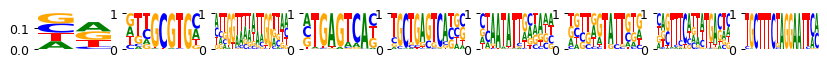

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.61it/s]


Current time: 2024-06-19 00:32:58.794129
	Loss: 249.031 , R2: 0.178
	Training time (model/function): (1.571s / 1.571s)
		per epoch (model/function): (0.112s/ 0.112s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993308619666572, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.48it/s]


Current time: 2024-06-19 00:33:00.580909
	Loss: 220.753 , R2: 0.180
	Training time (model/function): (3.161s / 1.590s)
		per epoch (model/function): (0.226s/ 0.114s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993308619666572, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.34it/s]


Current time: 2024-06-19 00:33:02.246094
	Loss: 193.954 , R2: 0.180
	Training time (model/function): (4.619s / 1.458s)
		per epoch (model/function): (0.330s/ 0.104s)
		per 1k samples: 0.078s
best loss 193.954
last five r2 values, by sequential filter optimization: ['0.180']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993308619666572, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.08it/s]


Current time: 2024-06-19 00:33:04.285064
	Loss: 181.208 , R2: 0.181
	Training time (model/function): (6.279s / 1.660s)
		per epoch (model/function): (0.449s/ 0.119s)
		per 1k samples: 0.089s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993308619666572, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.13it/s]


Current time: 2024-06-19 00:33:05.969171
	Loss: 166.211 , R2: 0.181
	Training time (model/function): (7.769s / 1.489s)
		per epoch (model/function): (0.555s/ 0.106s)
		per 1k samples: 0.079s
best loss 166.211
last five r2 values, by sequential filter optimization: ['0.180', '0.181']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993308619666572, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.19it/s]


Current time: 2024-06-19 00:33:07.994779
	Loss: 162.539 , R2: 0.182
	Training time (model/function): (9.410s / 1.641s)
		per epoch (model/function): (0.672s/ 0.117s)
		per 1k samples: 0.087s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993308619666572, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.73it/s]


Current time: 2024-06-19 00:33:09.744394
	Loss: 153.867 , R2: 0.182
	Training time (model/function): (10.961s / 1.551s)
		per epoch (model/function): (0.783s/ 0.111s)
		per 1k samples: 0.083s
best loss 153.867
last five r2 values, by sequential filter optimization: ['0.180', '0.181', '0.182']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993308619666572, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  9.57it/s]


Current time: 2024-06-19 00:33:11.697501
	Loss: 154.444 , R2: 0.183
	Training time (model/function): (12.538s / 1.577s)
		per epoch (model/function): (0.896s/ 0.113s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993308619666572, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.09it/s]


Current time: 2024-06-19 00:33:13.388607
	Loss: 148.572 , R2: 0.183
	Training time (model/function): (14.033s / 1.496s)
		per epoch (model/function): (1.002s/ 0.107s)
		per 1k samples: 0.080s
best loss 148.572
last five r2 values, by sequential filter optimization: ['0.180', '0.181', '0.182', '0.183']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993308619666572, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.68it/s]


Current time: 2024-06-19 00:33:15.499835
	Loss: 150.988 , R2: 0.184
	Training time (model/function): (15.770s / 1.737s)
		per epoch (model/function): (1.126s/ 0.124s)
		per 1k samples: 0.093s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993308619666572, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 10.47it/s]


Current time: 2024-06-19 00:33:17.141411
	Loss: 146.317 , R2: 0.184
	Training time (model/function): (17.212s / 1.442s)
		per epoch (model/function): (1.229s/ 0.103s)
		per 1k samples: 0.077s
best loss 146.317
last five r2 values, by sequential filter optimization: ['0.180', '0.181', '0.182', '0.183', '0.184']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993308619666572, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 17.211655616760254s
Time per epoch (total): 0.004 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_4/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


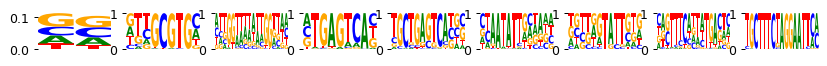

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.85it/s]


Current time: 2024-06-19 00:33:25.635284
	Loss: 284.123 , R2: 0.177
	Training time (model/function): (5.269s / 5.269s)
		per epoch (model/function): (0.376s/ 0.376s)
		per 1k samples: 0.281s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999470119109989, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.93it/s]


Current time: 2024-06-19 00:33:30.955724
	Loss: 220.873 , R2: 0.177
	Training time (model/function): (10.392s / 5.123s)
		per epoch (model/function): (0.742s/ 0.366s)
		per 1k samples: 0.273s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999470119109989, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.07it/s]


Current time: 2024-06-19 00:33:36.047372
	Loss: 193.963 , R2: 0.177
	Training time (model/function): (15.284s / 4.892s)
		per epoch (model/function): (1.092s/ 0.349s)
		per 1k samples: 0.261s
best loss 193.963
last five r2 values, by sequential filter optimization: ['0.177']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999470119109989, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.70it/s]


Current time: 2024-06-19 00:33:42.087738
	Loss: 181.226 , R2: 0.177
	Training time (model/function): (20.840s / 5.556s)
		per epoch (model/function): (1.489s/ 0.397s)
		per 1k samples: 0.296s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999470119109989, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.87it/s]


Current time: 2024-06-19 00:33:47.539591
	Loss: 166.224 , R2: 0.177
	Training time (model/function): (26.082s / 5.242s)
		per epoch (model/function): (1.863s/ 0.374s)
		per 1k samples: 0.279s
best loss 166.224
last five r2 values, by sequential filter optimization: ['0.177', '0.177']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999470119109989, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.33it/s]


Current time: 2024-06-19 00:33:52.514956
	Loss: 162.551 , R2: 0.177
	Training time (model/function): (30.594s / 4.512s)
		per epoch (model/function): (2.185s/ 0.322s)
		per 1k samples: 0.241s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999470119109989, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.69it/s]


Current time: 2024-06-19 00:33:56.783206
	Loss: 153.879 , R2: 0.177
	Training time (model/function): (34.671s / 4.077s)
		per epoch (model/function): (2.477s/ 0.291s)
		per 1k samples: 0.217s
best loss 153.879
last five r2 values, by sequential filter optimization: ['0.177', '0.177', '0.177']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999470119109989, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.63it/s]


Current time: 2024-06-19 00:34:01.291376
	Loss: 154.455 , R2: 0.177
	Training time (model/function): (38.810s / 4.138s)
		per epoch (model/function): (2.772s/ 0.296s)
		per 1k samples: 0.221s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999470119109989, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.78it/s]


Current time: 2024-06-19 00:34:05.550482
	Loss: 148.586 , R2: 0.177
	Training time (model/function): (42.788s / 3.978s)
		per epoch (model/function): (3.056s/ 0.284s)
		per 1k samples: 0.212s
best loss 148.586
last five r2 values, by sequential filter optimization: ['0.177', '0.177', '0.177', '0.177']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999470119109989, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.62it/s]


Current time: 2024-06-19 00:34:10.082372
	Loss: 150.993 , R2: 0.177
	Training time (model/function): (46.946s / 4.158s)
		per epoch (model/function): (3.353s/ 0.297s)
		per 1k samples: 0.222s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999470119109989, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.66it/s]


Current time: 2024-06-19 00:34:14.380790
	Loss: 146.331 , R2: 0.176
	Training time (model/function): (51.054s / 4.108s)
		per epoch (model/function): (3.647s/ 0.293s)
		per 1k samples: 0.219s
best loss 146.331
last five r2 values, by sequential filter optimization: ['0.177', '0.177', '0.177', '0.177', '0.176']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999470119109989, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 51.05394434928894s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs500/pwms/fold_4/running_time_1.pkl
5

/home/ilibarra/workspace/theislab/mubind/data/pbmc/random/processed_laura_2023_obs500_var1500.h5ad
pbmc (500, 1500)
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_0/model.pt
False /home/ilibarra/workspace/theislab/mub

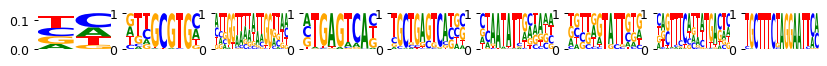

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.65it/s]


Current time: 2024-06-19 00:34:20.692607
	Loss: 249.016 , R2: 0.321
	Training time (model/function): (1.972s / 1.972s)
		per epoch (model/function): (0.141s/ 0.141s)
		per 1k samples: 0.105s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999145010313188, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.70it/s]


Current time: 2024-06-19 00:34:22.879971
	Loss: 220.736 , R2: 0.324
	Training time (model/function): (3.928s / 1.957s)
		per epoch (model/function): (0.281s/ 0.140s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999145010313188, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.20it/s]


Current time: 2024-06-19 00:34:25.050059
	Loss: 193.938 , R2: 0.324
	Training time (model/function): (5.767s / 1.839s)
		per epoch (model/function): (0.412s/ 0.131s)
		per 1k samples: 0.098s
best loss 193.938
last five r2 values, by sequential filter optimization: ['0.324']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999145010313188, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.68it/s]


Current time: 2024-06-19 00:34:27.449883
	Loss: 181.194 , R2: 0.326
	Training time (model/function): (7.730s / 1.963s)
		per epoch (model/function): (0.552s/ 0.140s)
		per 1k samples: 0.105s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999145010313188, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.08it/s]


Current time: 2024-06-19 00:34:29.540290
	Loss: 166.194 , R2: 0.326
	Training time (model/function): (9.596s / 1.866s)
		per epoch (model/function): (0.685s/ 0.133s)
		per 1k samples: 0.099s
best loss 166.194
last five r2 values, by sequential filter optimization: ['0.324', '0.326']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999145010313188, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.31it/s]


Current time: 2024-06-19 00:34:32.130240
	Loss: 162.521 , R2: 0.327
	Training time (model/function): (11.658s / 2.062s)
		per epoch (model/function): (0.833s/ 0.147s)
		per 1k samples: 0.110s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999145010313188, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.12it/s]


Current time: 2024-06-19 00:34:34.213627
	Loss: 153.850 , R2: 0.327
	Training time (model/function): (13.516s / 1.858s)
		per epoch (model/function): (0.965s/ 0.133s)
		per 1k samples: 0.099s
best loss 153.850
last five r2 values, by sequential filter optimization: ['0.324', '0.326', '0.327']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999145010313188, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.66it/s]


Current time: 2024-06-19 00:34:36.618203
	Loss: 154.414 , R2: 0.328
	Training time (model/function): (15.485s / 1.968s)
		per epoch (model/function): (1.106s/ 0.141s)
		per 1k samples: 0.105s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999145010313188, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.24it/s]


Current time: 2024-06-19 00:34:38.677050
	Loss: 148.556 , R2: 0.327
	Training time (model/function): (17.316s / 1.832s)
		per epoch (model/function): (1.237s/ 0.131s)
		per 1k samples: 0.098s
best loss 148.556
last five r2 values, by sequential filter optimization: ['0.324', '0.326', '0.327', '0.327']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999145010313188, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.40it/s]


Current time: 2024-06-19 00:34:41.150744
	Loss: 150.968 , R2: 0.330
	Training time (model/function): (19.352s / 2.036s)
		per epoch (model/function): (1.382s/ 0.145s)
		per 1k samples: 0.109s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999145010313188, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.20it/s]


Current time: 2024-06-19 00:34:43.213572
	Loss: 146.302 , R2: 0.330
	Training time (model/function): (21.191s / 1.839s)
		per epoch (model/function): (1.514s/ 0.131s)
		per 1k samples: 0.098s
best loss 146.302
last five r2 values, by sequential filter optimization: ['0.324', '0.326', '0.327', '0.327', '0.330']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999145010313188, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 21.190995931625366s
Time per epoch (total): 0.005 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_0/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


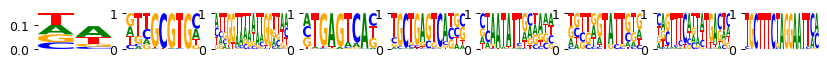

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.29it/s]


Current time: 2024-06-19 00:34:51.072581
	Loss: 283.698 , R2: 0.091
	Training time (model/function): (4.572s / 4.572s)
		per epoch (model/function): (0.327s/ 0.327s)
		per 1k samples: 0.244s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995491945765997, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.29it/s]


Current time: 2024-06-19 00:34:55.869382
	Loss: 220.842 , R2: 0.091
	Training time (model/function): (9.147s / 4.574s)
		per epoch (model/function): (0.653s/ 0.327s)
		per 1k samples: 0.244s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995491945765997, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.36it/s]


Current time: 2024-06-19 00:35:00.570047
	Loss: 193.935 , R2: 0.090
	Training time (model/function): (13.622s / 4.475s)
		per epoch (model/function): (0.973s/ 0.320s)
		per 1k samples: 0.239s
best loss 193.935
last five r2 values, by sequential filter optimization: ['0.090']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995491945765997, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.19it/s]


Current time: 2024-06-19 00:35:05.823065
	Loss: 181.201 , R2: 0.089
	Training time (model/function): (18.332s / 4.709s)
		per epoch (model/function): (1.309s/ 0.336s)
		per 1k samples: 0.251s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995491945765997, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.88it/s]


Current time: 2024-06-19 00:35:11.275732
	Loss: 166.197 , R2: 0.086
	Training time (model/function): (23.549s / 5.217s)
		per epoch (model/function): (1.682s/ 0.373s)
		per 1k samples: 0.278s
best loss 166.197
last five r2 values, by sequential filter optimization: ['0.090', '0.086']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995491945765997, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.79it/s]


Current time: 2024-06-19 00:35:17.227980
	Loss: 162.525 , R2: 0.084
	Training time (model/function): (28.944s / 5.395s)
		per epoch (model/function): (2.067s/ 0.385s)
		per 1k samples: 0.288s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995491945765997, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.91it/s]


Current time: 2024-06-19 00:35:22.627931
	Loss: 153.855 , R2: 0.084
	Training time (model/function): (34.112s / 5.168s)
		per epoch (model/function): (2.437s/ 0.369s)
		per 1k samples: 0.276s
best loss 153.855
last five r2 values, by sequential filter optimization: ['0.090', '0.086', '0.084']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995491945765997, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.87it/s]


Current time: 2024-06-19 00:35:28.341389
	Loss: 154.426 , R2: 0.083
	Training time (model/function): (39.357s / 5.244s)
		per epoch (model/function): (2.811s/ 0.375s)
		per 1k samples: 0.280s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995491945765997, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.94it/s]


Current time: 2024-06-19 00:35:33.790716
	Loss: 148.563 , R2: 0.083
	Training time (model/function): (44.474s / 5.118s)
		per epoch (model/function): (3.177s/ 0.366s)
		per 1k samples: 0.273s
best loss 148.563
last five r2 values, by sequential filter optimization: ['0.090', '0.086', '0.084', '0.083']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995491945765997, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.04it/s]


Current time: 2024-06-19 00:35:39.182008
	Loss: 150.965 , R2: 0.083
	Training time (model/function): (49.420s / 4.946s)
		per epoch (model/function): (3.530s/ 0.353s)
		per 1k samples: 0.264s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995491945765997, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.39it/s]


Current time: 2024-06-19 00:35:43.849725
	Loss: 146.307 , R2: 0.082
	Training time (model/function): (53.861s / 4.440s)
		per epoch (model/function): (3.847s/ 0.317s)
		per 1k samples: 0.237s
best loss 146.307
last five r2 values, by sequential filter optimization: ['0.090', '0.086', '0.084', '0.083', '0.082']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995491945765997, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 53.8607017993927s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_1/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pbmc/random/sc

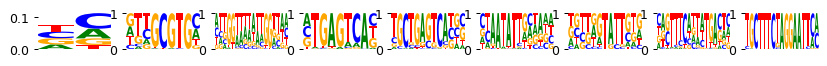

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.69it/s]


Current time: 2024-06-19 00:35:49.832904
	Loss: 249.021 , R2: 0.331
	Training time (model/function): (1.960s / 1.960s)
		per epoch (model/function): (0.140s/ 0.140s)
		per 1k samples: 0.105s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993636403767128, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.77it/s]


Current time: 2024-06-19 00:35:51.995950
	Loss: 220.743 , R2: 0.335
	Training time (model/function): (3.899s / 1.939s)
		per epoch (model/function): (0.279s/ 0.139s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993636403767128, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.05it/s]


Current time: 2024-06-19 00:35:54.196591
	Loss: 193.940 , R2: 0.335
	Training time (model/function): (5.772s / 1.872s)
		per epoch (model/function): (0.412s/ 0.134s)
		per 1k samples: 0.100s
best loss 193.940
last five r2 values, by sequential filter optimization: ['0.335']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993636403767128, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.52it/s]


Current time: 2024-06-19 00:35:56.654175
	Loss: 181.198 , R2: 0.337
	Training time (model/function): (7.778s / 2.006s)
		per epoch (model/function): (0.556s/ 0.143s)
		per 1k samples: 0.107s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993636403767128, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.92it/s]


Current time: 2024-06-19 00:35:58.792873
	Loss: 166.201 , R2: 0.337
	Training time (model/function): (9.685s / 1.907s)
		per epoch (model/function): (0.692s/ 0.136s)
		per 1k samples: 0.102s
best loss 166.201
last five r2 values, by sequential filter optimization: ['0.335', '0.337']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993636403767128, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.22it/s]


Current time: 2024-06-19 00:36:01.332078
	Loss: 162.529 , R2: 0.338
	Training time (model/function): (11.773s / 2.088s)
		per epoch (model/function): (0.841s/ 0.149s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993636403767128, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.06it/s]


Current time: 2024-06-19 00:36:03.429342
	Loss: 153.855 , R2: 0.338
	Training time (model/function): (13.644s / 1.871s)
		per epoch (model/function): (0.975s/ 0.134s)
		per 1k samples: 0.100s
best loss 153.855
last five r2 values, by sequential filter optimization: ['0.335', '0.337', '0.338']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993636403767128, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.72it/s]


Current time: 2024-06-19 00:36:05.822729
	Loss: 154.420 , R2: 0.339
	Training time (model/function): (15.598s / 1.954s)
		per epoch (model/function): (1.114s/ 0.140s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993636403767128, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.22it/s]


Current time: 2024-06-19 00:36:07.968516
	Loss: 148.563 , R2: 0.338
	Training time (model/function): (17.433s / 1.836s)
		per epoch (model/function): (1.245s/ 0.131s)
		per 1k samples: 0.098s
best loss 148.563
last five r2 values, by sequential filter optimization: ['0.335', '0.337', '0.338', '0.338']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993636403767128, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.72it/s]


Current time: 2024-06-19 00:36:10.359725
	Loss: 150.972 , R2: 0.341
	Training time (model/function): (19.385s / 1.952s)
		per epoch (model/function): (1.385s/ 0.139s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993636403767128, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.21it/s]


Current time: 2024-06-19 00:36:12.423610
	Loss: 146.307 , R2: 0.341
	Training time (model/function): (21.223s / 1.837s)
		per epoch (model/function): (1.516s/ 0.131s)
		per 1k samples: 0.098s
best loss 146.307
last five r2 values, by sequential filter optimization: ['0.335', '0.337', '0.338', '0.338', '0.341']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993636403767128, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 21.22265124320984s
Time per epoch (total): 0.005 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_1/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


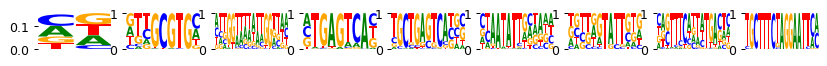

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.30it/s]


Current time: 2024-06-19 00:36:20.257061
	Loss: 283.526 , R2: 0.093
	Training time (model/function): (4.561s / 4.561s)
		per epoch (model/function): (0.326s/ 0.326s)
		per 1k samples: 0.243s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999545237741318, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.31it/s]


Current time: 2024-06-19 00:36:25.029759
	Loss: 220.848 , R2: 0.093
	Training time (model/function): (9.108s / 4.547s)
		per epoch (model/function): (0.651s/ 0.325s)
		per 1k samples: 0.243s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999545237741318, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.29it/s]


Current time: 2024-06-19 00:36:29.818970
	Loss: 193.942 , R2: 0.092
	Training time (model/function): (13.671s / 4.563s)
		per epoch (model/function): (0.977s/ 0.326s)
		per 1k samples: 0.244s
best loss 193.942
last five r2 values, by sequential filter optimization: ['0.092']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999545237741318, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.28it/s]


Current time: 2024-06-19 00:36:34.844421
	Loss: 181.208 , R2: 0.091
	Training time (model/function): (18.258s / 4.586s)
		per epoch (model/function): (1.304s/ 0.328s)
		per 1k samples: 0.245s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999545237741318, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.35it/s]


Current time: 2024-06-19 00:36:39.562521
	Loss: 166.202 , R2: 0.089
	Training time (model/function): (22.749s / 4.491s)
		per epoch (model/function): (1.625s/ 0.321s)
		per 1k samples: 0.240s
best loss 166.202
last five r2 values, by sequential filter optimization: ['0.092', '0.089']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999545237741318, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.27it/s]


Current time: 2024-06-19 00:36:44.678095
	Loss: 162.532 , R2: 0.087
	Training time (model/function): (27.340s / 4.591s)
		per epoch (model/function): (1.953s/ 0.328s)
		per 1k samples: 0.245s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999545237741318, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.35it/s]


Current time: 2024-06-19 00:36:49.390142
	Loss: 153.857 , R2: 0.086
	Training time (model/function): (31.825s / 4.485s)
		per epoch (model/function): (2.273s/ 0.320s)
		per 1k samples: 0.239s
best loss 153.857
last five r2 values, by sequential filter optimization: ['0.092', '0.089', '0.086']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999545237741318, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.27it/s]


Current time: 2024-06-19 00:36:54.511594
	Loss: 154.433 , R2: 0.086
	Training time (model/function): (36.422s / 4.597s)
		per epoch (model/function): (2.602s/ 0.328s)
		per 1k samples: 0.245s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999545237741318, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.37it/s]


Current time: 2024-06-19 00:36:59.195725
	Loss: 148.568 , R2: 0.085
	Training time (model/function): (40.880s / 4.458s)
		per epoch (model/function): (2.920s/ 0.318s)
		per 1k samples: 0.238s
best loss 148.568
last five r2 values, by sequential filter optimization: ['0.092', '0.089', '0.086', '0.085']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999545237741318, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.29it/s]


Current time: 2024-06-19 00:37:04.200967
	Loss: 150.971 , R2: 0.085
	Training time (model/function): (45.447s / 4.567s)
		per epoch (model/function): (3.246s/ 0.326s)
		per 1k samples: 0.244s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999545237741318, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.39it/s]


Current time: 2024-06-19 00:37:08.947692
	Loss: 146.310 , R2: 0.084
	Training time (model/function): (49.878s / 4.432s)
		per epoch (model/function): (3.563s/ 0.317s)
		per 1k samples: 0.237s
best loss 146.310
last five r2 values, by sequential filter optimization: ['0.092', '0.089', '0.086', '0.085', '0.084']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999545237741318, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 49.87840461730957s
Time per epoch (total): 0.011 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_2/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pbmc/random/sc

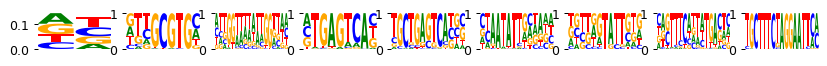

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.73it/s]


Current time: 2024-06-19 00:37:14.836477
	Loss: 249.018 , R2: 0.325
	Training time (model/function): (1.951s / 1.951s)
		per epoch (model/function): (0.139s/ 0.139s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993688718884666, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.77it/s]


Current time: 2024-06-19 00:37:17.001690
	Loss: 220.741 , R2: 0.328
	Training time (model/function): (3.892s / 1.941s)
		per epoch (model/function): (0.278s/ 0.139s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993688718884666, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.74it/s]


Current time: 2024-06-19 00:37:19.173846
	Loss: 193.942 , R2: 0.328
	Training time (model/function): (5.838s / 1.947s)
		per epoch (model/function): (0.417s/ 0.139s)
		per 1k samples: 0.104s
best loss 193.942
last five r2 values, by sequential filter optimization: ['0.328']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993688718884666, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.67it/s]


Current time: 2024-06-19 00:37:21.578951
	Loss: 181.197 , R2: 0.330
	Training time (model/function): (7.805s / 1.967s)
		per epoch (model/function): (0.558s/ 0.141s)
		per 1k samples: 0.105s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993688718884666, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.12it/s]


Current time: 2024-06-19 00:37:23.660725
	Loss: 166.198 , R2: 0.329
	Training time (model/function): (9.663s / 1.857s)
		per epoch (model/function): (0.690s/ 0.133s)
		per 1k samples: 0.099s
best loss 166.198
last five r2 values, by sequential filter optimization: ['0.328', '0.329']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993688718884666, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.72it/s]


Current time: 2024-06-19 00:37:26.134839
	Loss: 162.532 , R2: 0.332
	Training time (model/function): (11.615s / 1.953s)
		per epoch (model/function): (0.830s/ 0.139s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993688718884666, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.12it/s]


Current time: 2024-06-19 00:37:28.216121
	Loss: 153.857 , R2: 0.332
	Training time (model/function): (13.472s / 1.857s)
		per epoch (model/function): (0.962s/ 0.133s)
		per 1k samples: 0.099s
best loss 153.857
last five r2 values, by sequential filter optimization: ['0.328', '0.329', '0.332']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993688718884666, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.72it/s]


Current time: 2024-06-19 00:37:30.606066
	Loss: 154.425 , R2: 0.333
	Training time (model/function): (15.425s / 1.953s)
		per epoch (model/function): (1.102s/ 0.139s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993688718884666, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.23it/s]


Current time: 2024-06-19 00:37:32.746178
	Loss: 148.562 , R2: 0.333
	Training time (model/function): (17.259s / 1.834s)
		per epoch (model/function): (1.233s/ 0.131s)
		per 1k samples: 0.098s
best loss 148.562
last five r2 values, by sequential filter optimization: ['0.328', '0.329', '0.332', '0.333']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993688718884666, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.72it/s]


Current time: 2024-06-19 00:37:35.137594
	Loss: 150.975 , R2: 0.334
	Training time (model/function): (19.212s / 1.954s)
		per epoch (model/function): (1.372s/ 0.140s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993688718884666, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.21it/s]


Current time: 2024-06-19 00:37:37.198836
	Loss: 146.306 , R2: 0.334
	Training time (model/function): (21.049s / 1.836s)
		per epoch (model/function): (1.503s/ 0.131s)
		per 1k samples: 0.098s
best loss 146.306
last five r2 values, by sequential filter optimization: ['0.328', '0.329', '0.332', '0.333', '0.334']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993688718884666, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 21.048702001571655s
Time per epoch (total): 0.005 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_2/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


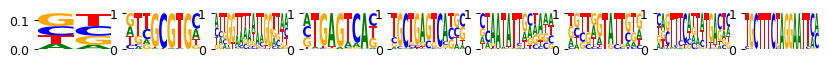

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.28it/s]


Current time: 2024-06-19 00:37:45.047621
	Loss: 283.343 , R2: 0.089
	Training time (model/function): (4.581s / 4.581s)
		per epoch (model/function): (0.327s/ 0.327s)
		per 1k samples: 0.245s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996153457640164, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.29it/s]


Current time: 2024-06-19 00:37:49.835723
	Loss: 220.850 , R2: 0.089
	Training time (model/function): (9.146s / 4.565s)
		per epoch (model/function): (0.653s/ 0.326s)
		per 1k samples: 0.244s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996153457640164, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.29it/s]


Current time: 2024-06-19 00:37:54.633769
	Loss: 193.940 , R2: 0.088
	Training time (model/function): (13.717s / 4.571s)
		per epoch (model/function): (0.980s/ 0.326s)
		per 1k samples: 0.244s
best loss 193.940
last five r2 values, by sequential filter optimization: ['0.088']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996153457640164, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.27it/s]


Current time: 2024-06-19 00:37:59.675560
	Loss: 181.207 , R2: 0.087
	Training time (model/function): (18.316s / 4.599s)
		per epoch (model/function): (1.308s/ 0.329s)
		per 1k samples: 0.246s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996153457640164, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.35it/s]


Current time: 2024-06-19 00:38:04.482605
	Loss: 166.202 , R2: 0.085
	Training time (model/function): (22.810s / 4.494s)
		per epoch (model/function): (1.629s/ 0.321s)
		per 1k samples: 0.240s
best loss 166.202
last five r2 values, by sequential filter optimization: ['0.088', '0.085']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996153457640164, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.25it/s]


Current time: 2024-06-19 00:38:09.549233
	Loss: 162.529 , R2: 0.083
	Training time (model/function): (27.435s / 4.625s)
		per epoch (model/function): (1.960s/ 0.330s)
		per 1k samples: 0.247s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996153457640164, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.35it/s]


Current time: 2024-06-19 00:38:14.266052
	Loss: 153.858 , R2: 0.081
	Training time (model/function): (31.925s / 4.490s)
		per epoch (model/function): (2.280s/ 0.321s)
		per 1k samples: 0.240s
best loss 153.858
last five r2 values, by sequential filter optimization: ['0.088', '0.085', '0.081']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996153457640164, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.21it/s]


Current time: 2024-06-19 00:38:19.384131
	Loss: 154.427 , R2: 0.081
	Training time (model/function): (36.602s / 4.677s)
		per epoch (model/function): (2.614s/ 0.334s)
		per 1k samples: 0.250s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996153457640164, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.36it/s]


Current time: 2024-06-19 00:38:24.082679
	Loss: 148.566 , R2: 0.081
	Training time (model/function): (41.074s / 4.472s)
		per epoch (model/function): (2.934s/ 0.319s)
		per 1k samples: 0.239s
best loss 148.566
last five r2 values, by sequential filter optimization: ['0.088', '0.085', '0.081', '0.081']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996153457640164, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.28it/s]


Current time: 2024-06-19 00:38:29.102253
	Loss: 150.970 , R2: 0.080
	Training time (model/function): (45.651s / 4.577s)
		per epoch (model/function): (3.261s/ 0.327s)
		per 1k samples: 0.244s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996153457640164, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.33it/s]


Current time: 2024-06-19 00:38:33.848373
	Loss: 146.311 , R2: 0.080
	Training time (model/function): (50.172s / 4.521s)
		per epoch (model/function): (3.584s/ 0.323s)
		per 1k samples: 0.241s
best loss 146.311
last five r2 values, by sequential filter optimization: ['0.088', '0.085', '0.081', '0.081', '0.080']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996153457640164, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 50.171690464019775s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_3/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pbmc/random/

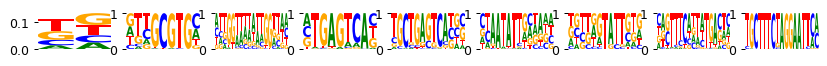

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.72it/s]


Current time: 2024-06-19 00:38:39.846049
	Loss: 249.015 , R2: 0.324
	Training time (model/function): (1.954s / 1.954s)
		per epoch (model/function): (0.140s/ 0.140s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991781520889418, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.70it/s]


Current time: 2024-06-19 00:38:42.028909
	Loss: 220.738 , R2: 0.327
	Training time (model/function): (3.913s / 1.959s)
		per epoch (model/function): (0.279s/ 0.140s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991781520889418, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.12it/s]


Current time: 2024-06-19 00:38:44.114270
	Loss: 193.936 , R2: 0.327
	Training time (model/function): (5.773s / 1.860s)
		per epoch (model/function): (0.412s/ 0.133s)
		per 1k samples: 0.099s
best loss 193.936
last five r2 values, by sequential filter optimization: ['0.327']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991781520889418, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.67it/s]


Current time: 2024-06-19 00:38:46.517369
	Loss: 181.195 , R2: 0.329
	Training time (model/function): (7.739s / 1.966s)
		per epoch (model/function): (0.553s/ 0.140s)
		per 1k samples: 0.105s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991781520889418, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.11it/s]


Current time: 2024-06-19 00:38:48.686814
	Loss: 166.195 , R2: 0.328
	Training time (model/function): (9.599s / 1.860s)
		per epoch (model/function): (0.686s/ 0.133s)
		per 1k samples: 0.099s
best loss 166.195
last five r2 values, by sequential filter optimization: ['0.327', '0.328']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991781520889418, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.69it/s]


Current time: 2024-06-19 00:38:51.086268
	Loss: 162.526 , R2: 0.331
	Training time (model/function): (11.559s / 1.960s)
		per epoch (model/function): (0.826s/ 0.140s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991781520889418, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.12it/s]


Current time: 2024-06-19 00:38:53.169554
	Loss: 153.852 , R2: 0.331
	Training time (model/function): (13.417s / 1.858s)
		per epoch (model/function): (0.958s/ 0.133s)
		per 1k samples: 0.099s
best loss 153.852
last five r2 values, by sequential filter optimization: ['0.327', '0.328', '0.331']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991781520889418, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.70it/s]


Current time: 2024-06-19 00:38:55.651641
	Loss: 154.420 , R2: 0.332
	Training time (model/function): (15.377s / 1.959s)
		per epoch (model/function): (1.098s/ 0.140s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991781520889418, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.06it/s]


Current time: 2024-06-19 00:38:57.760012
	Loss: 148.558 , R2: 0.331
	Training time (model/function): (17.249s / 1.872s)
		per epoch (model/function): (1.232s/ 0.134s)
		per 1k samples: 0.100s
best loss 148.558
last five r2 values, by sequential filter optimization: ['0.327', '0.328', '0.331', '0.331']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991781520889418, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.62it/s]


Current time: 2024-06-19 00:39:00.176546
	Loss: 150.972 , R2: 0.333
	Training time (model/function): (19.227s / 1.979s)
		per epoch (model/function): (1.373s/ 0.141s)
		per 1k samples: 0.105s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991781520889418, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.21it/s]


Current time: 2024-06-19 00:39:02.238828
	Loss: 146.301 , R2: 0.333
	Training time (model/function): (21.066s / 1.838s)
		per epoch (model/function): (1.505s/ 0.131s)
		per 1k samples: 0.098s
best loss 146.301
last five r2 values, by sequential filter optimization: ['0.327', '0.328', '0.331', '0.331', '0.333']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991781520889418, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 21.065539121627808s
Time per epoch (total): 0.005 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_3/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


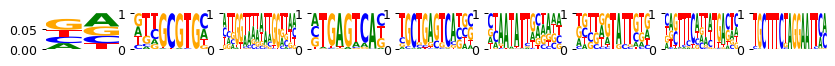

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.29it/s]


Current time: 2024-06-19 00:39:10.073716
	Loss: 283.831 , R2: 0.089
	Training time (model/function): (4.572s / 4.572s)
		per epoch (model/function): (0.327s/ 0.327s)
		per 1k samples: 0.244s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995534191701928, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.30it/s]


Current time: 2024-06-19 00:39:14.955936
	Loss: 220.849 , R2: 0.088
	Training time (model/function): (9.131s / 4.559s)
		per epoch (model/function): (0.652s/ 0.326s)
		per 1k samples: 0.243s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995534191701928, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.35it/s]


Current time: 2024-06-19 00:39:19.663912
	Loss: 193.938 , R2: 0.088
	Training time (model/function): (13.613s / 4.482s)
		per epoch (model/function): (0.972s/ 0.320s)
		per 1k samples: 0.239s
best loss 193.938
last five r2 values, by sequential filter optimization: ['0.088']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995534191701928, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.27it/s]


Current time: 2024-06-19 00:39:24.699000
	Loss: 181.204 , R2: 0.087
	Training time (model/function): (18.209s / 4.596s)
		per epoch (model/function): (1.301s/ 0.328s)
		per 1k samples: 0.245s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995534191701928, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.34it/s]


Current time: 2024-06-19 00:39:29.516027
	Loss: 166.197 , R2: 0.085
	Training time (model/function): (22.712s / 4.503s)
		per epoch (model/function): (1.622s/ 0.322s)
		per 1k samples: 0.240s
best loss 166.197
last five r2 values, by sequential filter optimization: ['0.088', '0.085']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995534191701928, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.28it/s]


Current time: 2024-06-19 00:39:34.539749
	Loss: 162.526 , R2: 0.083
	Training time (model/function): (27.295s / 4.583s)
		per epoch (model/function): (1.950s/ 0.327s)
		per 1k samples: 0.244s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995534191701928, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.35it/s]


Current time: 2024-06-19 00:39:39.255318
	Loss: 153.854 , R2: 0.083
	Training time (model/function): (31.786s / 4.491s)
		per epoch (model/function): (2.270s/ 0.321s)
		per 1k samples: 0.239s
best loss 153.854
last five r2 values, by sequential filter optimization: ['0.088', '0.085', '0.083']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995534191701928, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.21it/s]


Current time: 2024-06-19 00:39:44.382257
	Loss: 154.426 , R2: 0.082
	Training time (model/function): (36.472s / 4.686s)
		per epoch (model/function): (2.605s/ 0.335s)
		per 1k samples: 0.250s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995534191701928, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.38it/s]


Current time: 2024-06-19 00:39:49.062347
	Loss: 148.560 , R2: 0.081
	Training time (model/function): (40.926s / 4.454s)
		per epoch (model/function): (2.923s/ 0.318s)
		per 1k samples: 0.237s
best loss 148.560
last five r2 values, by sequential filter optimization: ['0.088', '0.085', '0.083', '0.081']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995534191701928, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.30it/s]


Current time: 2024-06-19 00:39:54.060291
	Loss: 150.968 , R2: 0.080
	Training time (model/function): (45.485s / 4.558s)
		per epoch (model/function): (3.249s/ 0.326s)
		per 1k samples: 0.243s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995534191701928, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.33it/s]


Current time: 2024-06-19 00:39:58.800084
	Loss: 146.307 , R2: 0.080
	Training time (model/function): (49.999s / 4.514s)
		per epoch (model/function): (3.571s/ 0.322s)
		per 1k samples: 0.241s
best loss 146.307
last five r2 values, by sequential filter optimization: ['0.088', '0.085', '0.083', '0.081', '0.080']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995534191701928, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 49.99901056289673s
Time per epoch (total): 0.011 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_4/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pbmc/random/s

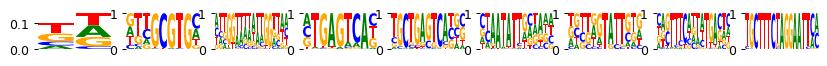

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.73it/s]


Current time: 2024-06-19 00:40:04.777447
	Loss: 249.019 , R2: 0.327
	Training time (model/function): (1.951s / 1.951s)
		per epoch (model/function): (0.139s/ 0.139s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999358550147769, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.72it/s]


Current time: 2024-06-19 00:40:06.953706
	Loss: 220.740 , R2: 0.331
	Training time (model/function): (3.903s / 1.952s)
		per epoch (model/function): (0.279s/ 0.139s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999358550147769, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.14it/s]


Current time: 2024-06-19 00:40:09.030157
	Loss: 193.942 , R2: 0.331
	Training time (model/function): (5.758s / 1.854s)
		per epoch (model/function): (0.411s/ 0.132s)
		per 1k samples: 0.099s
best loss 193.942
last five r2 values, by sequential filter optimization: ['0.331']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999358550147769, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.73it/s]


Current time: 2024-06-19 00:40:11.416287
	Loss: 181.196 , R2: 0.332
	Training time (model/function): (7.708s / 1.951s)
		per epoch (model/function): (0.551s/ 0.139s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999358550147769, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.76it/s]


Current time: 2024-06-19 00:40:13.583498
	Loss: 166.200 , R2: 0.332
	Training time (model/function): (9.653s / 1.944s)
		per epoch (model/function): (0.689s/ 0.139s)
		per 1k samples: 0.104s
best loss 166.200
last five r2 values, by sequential filter optimization: ['0.331', '0.332']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999358550147769, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.68it/s]


Current time: 2024-06-19 00:40:15.984215
	Loss: 162.522 , R2: 0.334
	Training time (model/function): (11.616s / 1.963s)
		per epoch (model/function): (0.830s/ 0.140s)
		per 1k samples: 0.105s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999358550147769, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.13it/s]


Current time: 2024-06-19 00:40:18.150764
	Loss: 153.852 , R2: 0.334
	Training time (model/function): (13.471s / 1.855s)
		per epoch (model/function): (0.962s/ 0.133s)
		per 1k samples: 0.099s
best loss 153.852
last five r2 values, by sequential filter optimization: ['0.331', '0.332', '0.334']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999358550147769, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.68it/s]


Current time: 2024-06-19 00:40:20.550670
	Loss: 154.417 , R2: 0.335
	Training time (model/function): (15.436s / 1.965s)
		per epoch (model/function): (1.103s/ 0.140s)
		per 1k samples: 0.105s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999358550147769, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.22it/s]


Current time: 2024-06-19 00:40:22.611020
	Loss: 148.558 , R2: 0.333
	Training time (model/function): (17.272s / 1.836s)
		per epoch (model/function): (1.234s/ 0.131s)
		per 1k samples: 0.098s
best loss 148.558
last five r2 values, by sequential filter optimization: ['0.331', '0.332', '0.334', '0.333']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999358550147769, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.65it/s]


Current time: 2024-06-19 00:40:25.100222
	Loss: 150.970 , R2: 0.336
	Training time (model/function): (19.243s / 1.971s)
		per epoch (model/function): (1.375s/ 0.141s)
		per 1k samples: 0.105s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999358550147769, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.18it/s]


Current time: 2024-06-19 00:40:27.168533
	Loss: 146.307 , R2: 0.336
	Training time (model/function): (21.089s / 1.845s)
		per epoch (model/function): (1.506s/ 0.132s)
		per 1k samples: 0.098s
best loss 146.307
last five r2 values, by sequential filter optimization: ['0.331', '0.332', '0.334', '0.333', '0.336']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999358550147769, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 21.08853030204773s
Time per epoch (total): 0.005 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_4/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


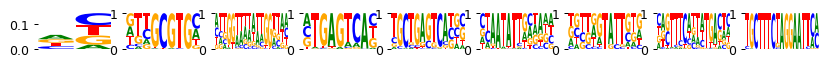

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.29it/s]


Current time: 2024-06-19 00:40:35.012881
	Loss: 286.489 , R2: 0.092
	Training time (model/function): (4.572s / 4.572s)
		per epoch (model/function): (0.327s/ 0.327s)
		per 1k samples: 0.244s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995650618855761, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.28it/s]


Current time: 2024-06-19 00:40:39.824848
	Loss: 220.860 , R2: 0.092
	Training time (model/function): (9.160s / 4.588s)
		per epoch (model/function): (0.654s/ 0.328s)
		per 1k samples: 0.245s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995650618855761, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.35it/s]


Current time: 2024-06-19 00:40:44.539765
	Loss: 193.941 , R2: 0.092
	Training time (model/function): (13.650s / 4.490s)
		per epoch (model/function): (0.975s/ 0.321s)
		per 1k samples: 0.239s
best loss 193.941
last five r2 values, by sequential filter optimization: ['0.092']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995650618855761, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.21it/s]


Current time: 2024-06-19 00:40:49.663318
	Loss: 181.205 , R2: 0.090
	Training time (model/function): (18.331s / 4.681s)
		per epoch (model/function): (1.309s/ 0.334s)
		per 1k samples: 0.250s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995650618855761, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.35it/s]


Current time: 2024-06-19 00:40:54.372694
	Loss: 166.201 , R2: 0.088
	Training time (model/function): (22.815s / 4.484s)
		per epoch (model/function): (1.630s/ 0.320s)
		per 1k samples: 0.239s
best loss 166.201
last five r2 values, by sequential filter optimization: ['0.092', '0.088']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995650618855761, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.27it/s]


Current time: 2024-06-19 00:40:59.406121
	Loss: 162.533 , R2: 0.086
	Training time (model/function): (27.410s / 4.595s)
		per epoch (model/function): (1.958s/ 0.328s)
		per 1k samples: 0.245s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995650618855761, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.35it/s]


Current time: 2024-06-19 00:41:04.204933
	Loss: 153.857 , R2: 0.085
	Training time (model/function): (31.983s / 4.573s)
		per epoch (model/function): (2.284s/ 0.327s)
		per 1k samples: 0.244s
best loss 153.857
last five r2 values, by sequential filter optimization: ['0.092', '0.088', '0.085']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995650618855761, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.26it/s]


Current time: 2024-06-19 00:41:09.259315
	Loss: 154.426 , R2: 0.085
	Training time (model/function): (36.600s / 4.617s)
		per epoch (model/function): (2.614s/ 0.330s)
		per 1k samples: 0.246s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995650618855761, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.38it/s]


Current time: 2024-06-19 00:41:14.021635
	Loss: 148.565 , R2: 0.085
	Training time (model/function): (41.053s / 4.452s)
		per epoch (model/function): (2.932s/ 0.318s)
		per 1k samples: 0.237s
best loss 148.565
last five r2 values, by sequential filter optimization: ['0.092', '0.088', '0.085', '0.085']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995650618855761, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.28it/s]


Current time: 2024-06-19 00:41:19.046639
	Loss: 150.969 , R2: 0.084
	Training time (model/function): (45.641s / 4.588s)
		per epoch (model/function): (3.260s/ 0.328s)
		per 1k samples: 0.245s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995650618855761, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.39it/s]


Current time: 2024-06-19 00:41:23.707881
	Loss: 146.308 , R2: 0.084
	Training time (model/function): (50.077s / 4.436s)
		per epoch (model/function): (3.577s/ 0.317s)
		per 1k samples: 0.236s
best loss 146.308
last five r2 values, by sequential filter optimization: ['0.092', '0.088', '0.085', '0.085', '0.084']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995650618855761, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 50.07696509361267s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs500/pwms/fold_4/running_time_1.pkl
10

/home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/pancreas_multiome_2022_processed_atac_obs500_var1500.h5ad
pancreatic_endocrinogenesis (500, 1500)
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcan

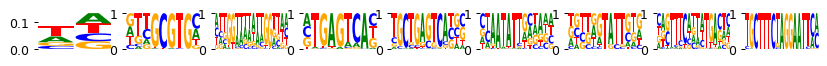

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.81it/s]


Current time: 2024-06-19 00:41:28.498193
	Loss: 266.993 , R2: 0.001
	Training time (model/function): (0.953s / 0.953s)
		per epoch (model/function): (0.068s/ 0.068s)
		per 1k samples: 0.144s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9832905004980911, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.12it/s]


Current time: 2024-06-19 00:41:29.601032
	Loss: 258.425 , R2: 0.001
	Training time (model/function): (1.887s / 0.934s)
		per epoch (model/function): (0.135s/ 0.067s)
		per 1k samples: 0.141s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9832905004980911, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.71it/s]


Current time: 2024-06-19 00:41:30.766040
	Loss: 245.342 , R2: 0.001
	Training time (model/function): (2.789s / 0.902s)
		per epoch (model/function): (0.199s/ 0.064s)
		per 1k samples: 0.136s
best loss 245.342
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9832905004980911, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.98it/s]


Current time: 2024-06-19 00:41:32.036246
	Loss: 239.507 , R2: 0.002
	Training time (model/function): (3.733s / 0.944s)
		per epoch (model/function): (0.267s/ 0.067s)
		per 1k samples: 0.143s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9832905004980911, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.54it/s]


Current time: 2024-06-19 00:41:33.118074
	Loss: 226.191 , R2: 0.002
	Training time (model/function): (4.645s / 0.912s)
		per epoch (model/function): (0.332s/ 0.065s)
		per 1k samples: 0.138s
best loss 226.191
last five r2 values, by sequential filter optimization: ['0.001', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9832905004980911, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.93it/s]


Current time: 2024-06-19 00:41:34.475337
	Loss: 220.805 , R2: 0.002
	Training time (model/function): (5.591s / 0.946s)
		per epoch (model/function): (0.399s/ 0.068s)
		per 1k samples: 0.143s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9832905004980911, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.55it/s]


Current time: 2024-06-19 00:41:35.554619
	Loss: 208.449 , R2: 0.002
	Training time (model/function): (6.502s / 0.911s)
		per epoch (model/function): (0.464s/ 0.065s)
		per 1k samples: 0.138s
best loss 208.449
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9832905004980911, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.86it/s]


Current time: 2024-06-19 00:41:36.828730
	Loss: 204.350 , R2: 0.002
	Training time (model/function): (7.452s / 0.950s)
		per epoch (model/function): (0.532s/ 0.068s)
		per 1k samples: 0.144s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9832905004980911, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.65it/s]


Current time: 2024-06-19 00:41:37.903981
	Loss: 193.463 , R2: 0.002
	Training time (model/function): (8.358s / 0.906s)
		per epoch (model/function): (0.597s/ 0.065s)
		per 1k samples: 0.137s
best loss 193.463
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9832905004980911, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 14.65it/s]


Current time: 2024-06-19 00:41:39.257458
	Loss: 190.881 , R2: 0.003
	Training time (model/function): (9.386s / 1.028s)
		per epoch (model/function): (0.670s/ 0.073s)
		per 1k samples: 0.156s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9832905004980911, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.63it/s]


Current time: 2024-06-19 00:41:40.332483
	Loss: 181.488 , R2: 0.003
	Training time (model/function): (10.292s / 0.906s)
		per epoch (model/function): (0.735s/ 0.065s)
		per 1k samples: 0.137s
best loss 181.488
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002', '0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9832905004980911, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 10.29191255569458s
Time per epoch (total): 0.002 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_0/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None


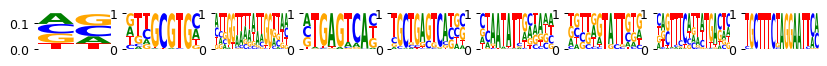

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.85it/s]


Current time: 2024-06-19 00:41:44.812451
	Loss: 588.079 , R2: 0.000
	Training time (model/function): (1.916s / 1.916s)
		per epoch (model/function): (0.137s/ 0.137s)
		per 1k samples: 0.290s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9381765255921404, pvalue=1.3767094262778395e-231))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.28it/s]


Current time: 2024-06-19 00:41:46.798313
	Loss: 327.152 , R2: 0.000
	Training time (model/function): (3.732s / 1.816s)
		per epoch (model/function): (0.267s/ 0.130s)
		per 1k samples: 0.275s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9381765255921404, pvalue=1.3767094262778395e-231))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.43it/s]


Current time: 2024-06-19 00:41:48.752363
	Loss: 248.925 , R2: 0.000
	Training time (model/function): (5.516s / 1.784s)
		per epoch (model/function): (0.394s/ 0.127s)
		per 1k samples: 0.270s
best loss 248.925
last five r2 values, by sequential filter optimization: ['0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9381765255921404, pvalue=1.3767094262778395e-231))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.90it/s]


Current time: 2024-06-19 00:41:50.984684
	Loss: 239.769 , R2: 0.000
	Training time (model/function): (7.419s / 1.903s)
		per epoch (model/function): (0.530s/ 0.136s)
		per 1k samples: 0.288s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9381765255921404, pvalue=1.3767094262778395e-231))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.43it/s]


Current time: 2024-06-19 00:41:52.938117
	Loss: 226.270 , R2: 0.000
	Training time (model/function): (9.203s / 1.784s)
		per epoch (model/function): (0.657s/ 0.127s)
		per 1k samples: 0.270s
best loss 226.270
last five r2 values, by sequential filter optimization: ['0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9381765255921404, pvalue=1.3767094262778395e-231))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.30it/s]


Current time: 2024-06-19 00:41:55.076355
	Loss: 220.899 , R2: 0.000
	Training time (model/function): (11.015s / 1.812s)
		per epoch (model/function): (0.787s/ 0.129s)
		per 1k samples: 0.274s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9381765255921404, pvalue=1.3767094262778395e-231))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.44it/s]


Current time: 2024-06-19 00:41:57.115164
	Loss: 208.540 , R2: 0.000
	Training time (model/function): (12.797s / 1.782s)
		per epoch (model/function): (0.914s/ 0.127s)
		per 1k samples: 0.270s
best loss 208.540
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9381765255921404, pvalue=1.3767094262778395e-231))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir w

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.35it/s]


Current time: 2024-06-19 00:41:59.243736
	Loss: 204.454 , R2: 0.000
	Training time (model/function): (14.598s / 1.801s)
		per epoch (model/function): (1.043s/ 0.129s)
		per 1k samples: 0.272s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9381765255921404, pvalue=1.3767094262778395e-231))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.53it/s]


Current time: 2024-06-19 00:42:01.176695
	Loss: 193.557 , R2: 0.000
	Training time (model/function): (16.361s / 1.763s)
		per epoch (model/function): (1.169s/ 0.126s)
		per 1k samples: 0.267s
best loss 193.557
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9381765255921404, pvalue=1.3767094262778395e-231))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay=

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.34it/s]


Current time: 2024-06-19 00:42:03.391073
	Loss: 190.990 , R2: 0.000
	Training time (model/function): (18.164s / 1.803s)
		per epoch (model/function): (1.297s/ 0.129s)
		per 1k samples: 0.273s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9381765255921404, pvalue=1.3767094262778395e-231))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.40it/s]


Current time: 2024-06-19 00:42:05.351897
	Loss: 181.583 , R2: 0.000
	Training time (model/function): (19.955s / 1.791s)
		per epoch (model/function): (1.425s/ 0.128s)
		per 1k samples: 0.271s
best loss 181.583
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9381765255921404, pvalue=1.3767094262778395e-231))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 19.95478367805481s
Time per epoch (total): 0.005 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubin

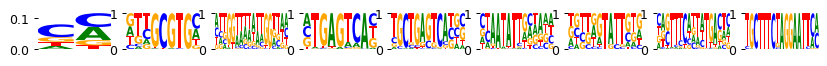

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 14.24it/s]


Current time: 2024-06-19 00:42:09.276654
	Loss: 266.993 , R2: 0.001
	Training time (model/function): (1.058s / 1.058s)
		per epoch (model/function): (0.076s/ 0.076s)
		per 1k samples: 0.159s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833930652756218, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.88it/s]


Current time: 2024-06-19 00:42:10.395565
	Loss: 258.425 , R2: 0.001
	Training time (model/function): (2.006s / 0.949s)
		per epoch (model/function): (0.143s/ 0.068s)
		per 1k samples: 0.143s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833930652756218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.49it/s]


Current time: 2024-06-19 00:42:11.478548
	Loss: 245.341 , R2: 0.001
	Training time (model/function): (2.920s / 0.914s)
		per epoch (model/function): (0.209s/ 0.065s)
		per 1k samples: 0.137s
best loss 245.341
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833930652756218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.81it/s]


Current time: 2024-06-19 00:42:12.842967
	Loss: 239.507 , R2: 0.002
	Training time (model/function): (3.873s / 0.953s)
		per epoch (model/function): (0.277s/ 0.068s)
		per 1k samples: 0.143s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833930652756218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.43it/s]


Current time: 2024-06-19 00:42:13.927963
	Loss: 226.191 , R2: 0.002
	Training time (model/function): (4.791s / 0.917s)
		per epoch (model/function): (0.342s/ 0.066s)
		per 1k samples: 0.138s
best loss 226.191
last five r2 values, by sequential filter optimization: ['0.001', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833930652756218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.87it/s]


Current time: 2024-06-19 00:42:15.202664
	Loss: 220.804 , R2: 0.002
	Training time (model/function): (5.740s / 0.950s)
		per epoch (model/function): (0.410s/ 0.068s)
		per 1k samples: 0.143s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833930652756218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.48it/s]


Current time: 2024-06-19 00:42:16.286769
	Loss: 208.449 , R2: 0.002
	Training time (model/function): (6.654s / 0.914s)
		per epoch (model/function): (0.475s/ 0.065s)
		per 1k samples: 0.137s
best loss 208.449
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833930652756218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 14.62it/s]


Current time: 2024-06-19 00:42:17.642405
	Loss: 204.349 , R2: 0.002
	Training time (model/function): (7.685s / 1.031s)
		per epoch (model/function): (0.549s/ 0.074s)
		per 1k samples: 0.155s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833930652756218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.61it/s]


Current time: 2024-06-19 00:42:18.719029
	Loss: 193.463 , R2: 0.002
	Training time (model/function): (8.592s / 0.907s)
		per epoch (model/function): (0.614s/ 0.065s)
		per 1k samples: 0.136s
best loss 193.463
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833930652756218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.94it/s]


Current time: 2024-06-19 00:42:19.991333
	Loss: 190.879 , R2: 0.002
	Training time (model/function): (9.538s / 0.946s)
		per epoch (model/function): (0.681s/ 0.068s)
		per 1k samples: 0.142s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833930652756218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.61it/s]


Current time: 2024-06-19 00:42:21.151351
	Loss: 181.488 , R2: 0.003
	Training time (model/function): (10.445s / 0.908s)
		per epoch (model/function): (0.746s/ 0.065s)
		per 1k samples: 0.136s
best loss 181.488
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002', '0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833930652756218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 10.44532322883606s
Time per epoch (total): 0.002 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_1/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None


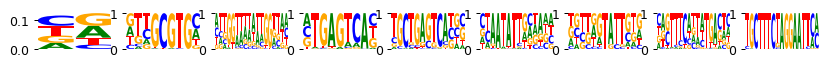

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.18it/s]


Current time: 2024-06-19 00:42:25.543605
	Loss: 581.754 , R2: 0.000
	Training time (model/function): (1.838s / 1.838s)
		per epoch (model/function): (0.131s/ 0.131s)
		per 1k samples: 0.276s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.939562336659664, pvalue=5.806399856350392e-234))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.22it/s]


Current time: 2024-06-19 00:42:27.541856
	Loss: 324.559 , R2: 0.000
	Training time (model/function): (3.667s / 1.829s)
		per epoch (model/function): (0.262s/ 0.131s)
		per 1k samples: 0.275s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.939562336659664, pvalue=5.806399856350392e-234))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.00it/s]


Current time: 2024-06-19 00:42:29.589289
	Loss: 248.796 , R2: 0.000
	Training time (model/function): (5.545s / 1.878s)
		per epoch (model/function): (0.396s/ 0.134s)
		per 1k samples: 0.282s
best loss 248.796
last five r2 values, by sequential filter optimization: ['0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.939562336659664, pvalue=5.806399856350392e-234))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.27it/s]


Current time: 2024-06-19 00:42:31.734066
	Loss: 239.754 , R2: 0.000
	Training time (model/function): (7.363s / 1.818s)
		per epoch (model/function): (0.526s/ 0.130s)
		per 1k samples: 0.273s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.939562336659664, pvalue=5.806399856350392e-234))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.41it/s]


Current time: 2024-06-19 00:42:33.691161
	Loss: 226.269 , R2: 0.000
	Training time (model/function): (9.151s / 1.787s)
		per epoch (model/function): (0.654s/ 0.128s)
		per 1k samples: 0.269s
best loss 226.269
last five r2 values, by sequential filter optimization: ['0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.939562336659664, pvalue=5.806399856350392e-234))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.29it/s]


Current time: 2024-06-19 00:42:35.916354
	Loss: 220.899 , R2: 0.000
	Training time (model/function): (11.049s / 1.899s)
		per epoch (model/function): (0.789s/ 0.136s)
		per 1k samples: 0.286s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.939562336659664, pvalue=5.806399856350392e-234))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.47it/s]


Current time: 2024-06-19 00:42:37.861266
	Loss: 208.541 , R2: 0.000
	Training time (model/function): (12.825s / 1.775s)
		per epoch (model/function): (0.916s/ 0.127s)
		per 1k samples: 0.267s
best loss 208.541
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.939562336659664, pvalue=5.806399856350392e-234))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir wei

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.33it/s]


Current time: 2024-06-19 00:42:39.994396
	Loss: 204.453 , R2: 0.000
	Training time (model/function): (14.629s / 1.804s)
		per epoch (model/function): (1.045s/ 0.129s)
		per 1k samples: 0.271s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.939562336659664, pvalue=5.806399856350392e-234))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.12it/s]


Current time: 2024-06-19 00:42:42.017403
	Loss: 193.558 , R2: 0.000
	Training time (model/function): (16.482s / 1.853s)
		per epoch (model/function): (1.177s/ 0.132s)
		per 1k samples: 0.279s
best loss 193.558
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.939562336659664, pvalue=5.806399856350392e-234))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.33it/s]


Current time: 2024-06-19 00:42:44.152747
	Loss: 190.989 , R2: 0.000
	Training time (model/function): (18.288s / 1.806s)
		per epoch (model/function): (1.306s/ 0.129s)
		per 1k samples: 0.272s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.939562336659664, pvalue=5.806399856350392e-234))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.46it/s]


Current time: 2024-06-19 00:42:46.098851
	Loss: 181.585 , R2: 0.000
	Training time (model/function): (20.064s / 1.776s)
		per epoch (model/function): (1.433s/ 0.127s)
		per 1k samples: 0.267s
best loss 181.585
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.939562336659664, pvalue=5.806399856350392e-234))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 20.063704252243042s
Time per epoch (total): 0.005 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind

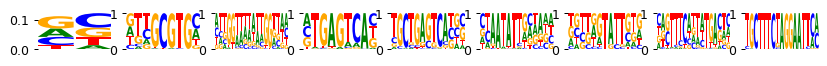

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.70it/s]


Current time: 2024-06-19 00:42:50.000255
	Loss: 266.993 , R2: 0.001
	Training time (model/function): (0.959s / 0.959s)
		per epoch (model/function): (0.069s/ 0.069s)
		per 1k samples: 0.146s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9813405388673515, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.09it/s]


Current time: 2024-06-19 00:42:51.105187
	Loss: 258.425 , R2: 0.001
	Training time (model/function): (1.896s / 0.936s)
		per epoch (model/function): (0.135s/ 0.067s)
		per 1k samples: 0.142s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9813405388673515, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.69it/s]


Current time: 2024-06-19 00:42:52.174951
	Loss: 245.341 , R2: 0.001
	Training time (model/function): (2.799s / 0.903s)
		per epoch (model/function): (0.200s/ 0.064s)
		per 1k samples: 0.137s
best loss 245.341
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9813405388673515, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.95it/s]


Current time: 2024-06-19 00:42:53.541965
	Loss: 239.507 , R2: 0.002
	Training time (model/function): (3.744s / 0.945s)
		per epoch (model/function): (0.267s/ 0.067s)
		per 1k samples: 0.144s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9813405388673515, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.53it/s]


Current time: 2024-06-19 00:42:54.623497
	Loss: 226.191 , R2: 0.002
	Training time (model/function): (4.656s / 0.912s)
		per epoch (model/function): (0.333s/ 0.065s)
		per 1k samples: 0.139s
best loss 226.191
last five r2 values, by sequential filter optimization: ['0.001', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9813405388673515, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.92it/s]


Current time: 2024-06-19 00:42:55.982035
	Loss: 220.805 , R2: 0.002
	Training time (model/function): (5.602s / 0.946s)
		per epoch (model/function): (0.400s/ 0.068s)
		per 1k samples: 0.144s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9813405388673515, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.55it/s]


Current time: 2024-06-19 00:42:57.065128
	Loss: 208.449 , R2: 0.002
	Training time (model/function): (6.513s / 0.911s)
		per epoch (model/function): (0.465s/ 0.065s)
		per 1k samples: 0.138s
best loss 208.449
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9813405388673515, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.92it/s]


Current time: 2024-06-19 00:42:58.337640
	Loss: 204.350 , R2: 0.002
	Training time (model/function): (7.459s / 0.946s)
		per epoch (model/function): (0.533s/ 0.068s)
		per 1k samples: 0.144s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9813405388673515, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.70it/s]


Current time: 2024-06-19 00:42:59.408591
	Loss: 193.463 , R2: 0.002
	Training time (model/function): (8.362s / 0.902s)
		per epoch (model/function): (0.597s/ 0.064s)
		per 1k samples: 0.137s
best loss 193.463
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9813405388673515, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.92it/s]


Current time: 2024-06-19 00:43:00.766336
	Loss: 190.881 , R2: 0.003
	Training time (model/function): (9.308s / 0.947s)
		per epoch (model/function): (0.665s/ 0.068s)
		per 1k samples: 0.144s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9813405388673515, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.63it/s]


Current time: 2024-06-19 00:43:01.841949
	Loss: 181.488 , R2: 0.003
	Training time (model/function): (10.215s / 0.907s)
		per epoch (model/function): (0.730s/ 0.065s)
		per 1k samples: 0.138s
best loss 181.488
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002', '0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9813405388673515, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 10.21496295928955s
Time per epoch (total): 0.002 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_2/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None


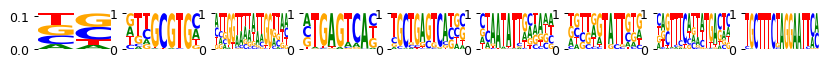

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.84it/s]


Current time: 2024-06-19 00:43:06.319494
	Loss: 601.647 , R2: 0.000
	Training time (model/function): (1.918s / 1.918s)
		per epoch (model/function): (0.137s/ 0.137s)
		per 1k samples: 0.292s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9368946986812927, pvalue=1.9368129580198313e-229))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.29it/s]


Current time: 2024-06-19 00:43:08.303945
	Loss: 330.506 , R2: 0.000
	Training time (model/function): (3.733s / 1.814s)
		per epoch (model/function): (0.267s/ 0.130s)
		per 1k samples: 0.276s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9368946986812927, pvalue=1.9368129580198313e-229))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.43it/s]


Current time: 2024-06-19 00:43:10.258101
	Loss: 249.055 , R2: 0.000
	Training time (model/function): (5.517s / 1.784s)
		per epoch (model/function): (0.394s/ 0.127s)
		per 1k samples: 0.271s
best loss 249.055
last five r2 values, by sequential filter optimization: ['0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9368946986812927, pvalue=1.9368129580198313e-229))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.79it/s]


Current time: 2024-06-19 00:43:12.513807
	Loss: 239.784 , R2: 0.000
	Training time (model/function): (7.447s / 1.930s)
		per epoch (model/function): (0.532s/ 0.138s)
		per 1k samples: 0.293s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9368946986812927, pvalue=1.9368129580198313e-229))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.94it/s]


Current time: 2024-06-19 00:43:14.576468
	Loss: 226.267 , R2: 0.000
	Training time (model/function): (9.339s / 1.893s)
		per epoch (model/function): (0.667s/ 0.135s)
		per 1k samples: 0.288s
best loss 226.267
last five r2 values, by sequential filter optimization: ['0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9368946986812927, pvalue=1.9368129580198313e-229))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.78it/s]


Current time: 2024-06-19 00:43:16.835932
	Loss: 220.901 , R2: 0.000
	Training time (model/function): (11.272s / 1.933s)
		per epoch (model/function): (0.805s/ 0.138s)
		per 1k samples: 0.294s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9368946986812927, pvalue=1.9368129580198313e-229))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.66it/s]


Current time: 2024-06-19 00:43:18.969742
	Loss: 208.539 , R2: 0.000
	Training time (model/function): (13.235s / 1.963s)
		per epoch (model/function): (0.945s/ 0.140s)
		per 1k samples: 0.298s
best loss 208.539
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9368946986812927, pvalue=1.9368129580198313e-229))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir w

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.96it/s]


Current time: 2024-06-19 00:43:21.183255
	Loss: 204.457 , R2: 0.000
	Training time (model/function): (15.124s / 1.889s)
		per epoch (model/function): (1.080s/ 0.135s)
		per 1k samples: 0.287s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9368946986812927, pvalue=1.9368129580198313e-229))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.52it/s]


Current time: 2024-06-19 00:43:23.119734
	Loss: 193.555 , R2: 0.000
	Training time (model/function): (16.889s / 1.765s)
		per epoch (model/function): (1.206s/ 0.126s)
		per 1k samples: 0.268s
best loss 193.555
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9368946986812927, pvalue=1.9368129580198313e-229))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay=

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.36it/s]


Current time: 2024-06-19 00:43:25.331475
	Loss: 190.993 , R2: 0.000
	Training time (model/function): (18.688s / 1.799s)
		per epoch (model/function): (1.335s/ 0.128s)
		per 1k samples: 0.273s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9368946986812927, pvalue=1.9368129580198313e-229))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.53it/s]


Current time: 2024-06-19 00:43:27.263772
	Loss: 181.581 , R2: 0.000
	Training time (model/function): (20.450s / 1.762s)
		per epoch (model/function): (1.461s/ 0.126s)
		per 1k samples: 0.268s
best loss 181.581
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9368946986812927, pvalue=1.9368129580198313e-229))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 20.450358629226685s
Time per epoch (total): 0.005 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubi

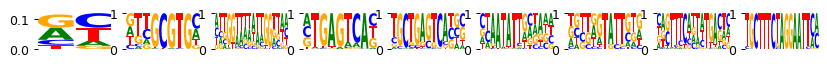

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00, 14.27it/s]


Current time: 2024-06-19 00:43:31.179781
	Loss: 266.993 , R2: 0.001
	Training time (model/function): (1.055s / 1.055s)
		per epoch (model/function): (0.075s/ 0.075s)
		per 1k samples: 0.161s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9819974776488596, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.96it/s]


Current time: 2024-06-19 00:43:32.292072
	Loss: 258.425 , R2: 0.001
	Training time (model/function): (1.999s / 0.944s)
		per epoch (model/function): (0.143s/ 0.067s)
		per 1k samples: 0.144s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9819974776488596, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.56it/s]


Current time: 2024-06-19 00:43:33.370159
	Loss: 245.341 , R2: 0.001
	Training time (model/function): (2.909s / 0.910s)
		per epoch (model/function): (0.208s/ 0.065s)
		per 1k samples: 0.139s
best loss 245.341
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9819974776488596, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.96it/s]


Current time: 2024-06-19 00:43:34.722783
	Loss: 239.507 , R2: 0.002
	Training time (model/function): (3.853s / 0.944s)
		per epoch (model/function): (0.275s/ 0.067s)
		per 1k samples: 0.144s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9819974776488596, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.52it/s]


Current time: 2024-06-19 00:43:35.804103
	Loss: 226.191 , R2: 0.002
	Training time (model/function): (4.766s / 0.912s)
		per epoch (model/function): (0.340s/ 0.065s)
		per 1k samples: 0.139s
best loss 226.191
last five r2 values, by sequential filter optimization: ['0.001', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9819974776488596, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.96it/s]


Current time: 2024-06-19 00:43:37.074316
	Loss: 220.805 , R2: 0.002
	Training time (model/function): (5.710s / 0.944s)
		per epoch (model/function): (0.408s/ 0.067s)
		per 1k samples: 0.144s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9819974776488596, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.56it/s]


Current time: 2024-06-19 00:43:38.153088
	Loss: 208.449 , R2: 0.002
	Training time (model/function): (6.620s / 0.910s)
		per epoch (model/function): (0.473s/ 0.065s)
		per 1k samples: 0.139s
best loss 208.449
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9819974776488596, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.98it/s]


Current time: 2024-06-19 00:43:39.506885
	Loss: 204.350 , R2: 0.002
	Training time (model/function): (7.563s / 0.943s)
		per epoch (model/function): (0.540s/ 0.067s)
		per 1k samples: 0.144s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9819974776488596, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.67it/s]


Current time: 2024-06-19 00:43:40.579175
	Loss: 193.463 , R2: 0.002
	Training time (model/function): (8.467s / 0.904s)
		per epoch (model/function): (0.605s/ 0.065s)
		per 1k samples: 0.138s
best loss 193.463
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9819974776488596, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.94it/s]


Current time: 2024-06-19 00:43:41.855814
	Loss: 190.880 , R2: 0.003
	Training time (model/function): (9.412s / 0.945s)
		per epoch (model/function): (0.672s/ 0.068s)
		per 1k samples: 0.144s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9819974776488596, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.27it/s]


Current time: 2024-06-19 00:43:43.013180
	Loss: 181.488 , R2: 0.003
	Training time (model/function): (10.399s / 0.987s)
		per epoch (model/function): (0.743s/ 0.070s)
		per 1k samples: 0.150s
best loss 181.488
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002', '0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9819974776488596, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 10.399205684661865s
Time per epoch (total): 0.002 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_3/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None

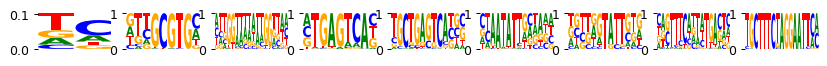

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.30it/s]


Current time: 2024-06-19 00:43:47.381303
	Loss: 584.576 , R2: 0.000
	Training time (model/function): (1.811s / 1.811s)
		per epoch (model/function): (0.129s/ 0.129s)
		per 1k samples: 0.276s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9374599676678671, pvalue=2.214898979993402e-230))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.91it/s]


Current time: 2024-06-19 00:43:49.451520
	Loss: 325.301 , R2: 0.000
	Training time (model/function): (3.711s / 1.900s)
		per epoch (model/function): (0.265s/ 0.136s)
		per 1k samples: 0.289s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9374599676678671, pvalue=2.214898979993402e-230))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.44it/s]


Current time: 2024-06-19 00:43:51.402179
	Loss: 249.008 , R2: 0.000
	Training time (model/function): (5.491s / 1.781s)
		per epoch (model/function): (0.392s/ 0.127s)
		per 1k samples: 0.271s
best loss 249.008
last five r2 values, by sequential filter optimization: ['0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9374599676678671, pvalue=2.214898979993402e-230))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.30it/s]


Current time: 2024-06-19 00:43:53.625454
	Loss: 239.781 , R2: 0.000
	Training time (model/function): (7.302s / 1.810s)
		per epoch (model/function): (0.522s/ 0.129s)
		per 1k samples: 0.276s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9374599676678671, pvalue=2.214898979993402e-230))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.42it/s]


Current time: 2024-06-19 00:43:55.579778
	Loss: 226.268 , R2: 0.000
	Training time (model/function): (9.086s / 1.785s)
		per epoch (model/function): (0.649s/ 0.127s)
		per 1k samples: 0.272s
best loss 226.268
last five r2 values, by sequential filter optimization: ['0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9374599676678671, pvalue=2.214898979993402e-230))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.33it/s]


Current time: 2024-06-19 00:43:57.711594
	Loss: 220.901 , R2: 0.000
	Training time (model/function): (10.892s / 1.806s)
		per epoch (model/function): (0.778s/ 0.129s)
		per 1k samples: 0.275s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9374599676678671, pvalue=2.214898979993402e-230))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.44it/s]


Current time: 2024-06-19 00:43:59.662086
	Loss: 208.538 , R2: 0.000
	Training time (model/function): (12.673s / 1.781s)
		per epoch (model/function): (0.905s/ 0.127s)
		per 1k samples: 0.271s
best loss 208.538
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9374599676678671, pvalue=2.214898979993402e-230))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir we

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.33it/s]


Current time: 2024-06-19 00:44:01.883000
	Loss: 204.456 , R2: 0.000
	Training time (model/function): (14.479s / 1.805s)
		per epoch (model/function): (1.034s/ 0.129s)
		per 1k samples: 0.275s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9374599676678671, pvalue=2.214898979993402e-230))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.54it/s]


Current time: 2024-06-19 00:44:03.814146
	Loss: 193.555 , R2: 0.000
	Training time (model/function): (16.239s / 1.761s)
		per epoch (model/function): (1.160s/ 0.126s)
		per 1k samples: 0.268s
best loss 193.555
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9374599676678671, pvalue=2.214898979993402e-230))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.36it/s]


Current time: 2024-06-19 00:44:05.943159
	Loss: 190.991 , R2: 0.000
	Training time (model/function): (18.039s / 1.799s)
		per epoch (model/function): (1.288s/ 0.129s)
		per 1k samples: 0.274s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9374599676678671, pvalue=2.214898979993402e-230))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.43it/s]


Current time: 2024-06-19 00:44:07.983066
	Loss: 181.581 , R2: 0.000
	Training time (model/function): (19.822s / 1.783s)
		per epoch (model/function): (1.416s/ 0.127s)
		per 1k samples: 0.272s
best loss 181.581
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9374599676678671, pvalue=2.214898979993402e-230))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 19.82196044921875s
Time per epoch (total): 0.005 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind

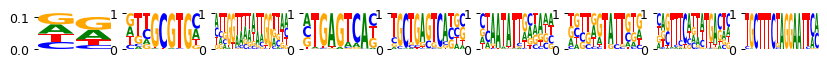

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.70it/s]


Current time: 2024-06-19 00:44:11.800325
	Loss: 266.993 , R2: 0.001
	Training time (model/function): (0.960s / 0.960s)
		per epoch (model/function): (0.069s/ 0.069s)
		per 1k samples: 0.144s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9843741166801373, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.01it/s]


Current time: 2024-06-19 00:44:13.007968
	Loss: 258.425 , R2: 0.001
	Training time (model/function): (1.901s / 0.941s)
		per epoch (model/function): (0.136s/ 0.067s)
		per 1k samples: 0.141s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9843741166801373, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.51it/s]


Current time: 2024-06-19 00:44:14.090326
	Loss: 245.341 , R2: 0.001
	Training time (model/function): (2.814s / 0.913s)
		per epoch (model/function): (0.201s/ 0.065s)
		per 1k samples: 0.137s
best loss 245.341
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9843741166801373, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.88it/s]


Current time: 2024-06-19 00:44:15.365668
	Loss: 239.507 , R2: 0.002
	Training time (model/function): (3.763s / 0.949s)
		per epoch (model/function): (0.269s/ 0.068s)
		per 1k samples: 0.142s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9843741166801373, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.44it/s]


Current time: 2024-06-19 00:44:16.452952
	Loss: 226.191 , R2: 0.002
	Training time (model/function): (4.680s / 0.917s)
		per epoch (model/function): (0.334s/ 0.066s)
		per 1k samples: 0.137s
best loss 226.191
last five r2 values, by sequential filter optimization: ['0.001', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9843741166801373, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.84it/s]


Current time: 2024-06-19 00:44:17.814760
	Loss: 220.805 , R2: 0.002
	Training time (model/function): (5.631s / 0.951s)
		per epoch (model/function): (0.402s/ 0.068s)
		per 1k samples: 0.142s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9843741166801373, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.47it/s]


Current time: 2024-06-19 00:44:18.900292
	Loss: 208.449 , R2: 0.002
	Training time (model/function): (6.546s / 0.915s)
		per epoch (model/function): (0.468s/ 0.065s)
		per 1k samples: 0.137s
best loss 208.449
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9843741166801373, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.87it/s]


Current time: 2024-06-19 00:44:20.178301
	Loss: 204.350 , R2: 0.002
	Training time (model/function): (7.496s / 0.950s)
		per epoch (model/function): (0.535s/ 0.068s)
		per 1k samples: 0.142s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9843741166801373, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.17it/s]


Current time: 2024-06-19 00:44:21.341698
	Loss: 193.463 , R2: 0.002
	Training time (model/function): (8.489s / 0.993s)
		per epoch (model/function): (0.606s/ 0.071s)
		per 1k samples: 0.149s
best loss 193.463
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9843741166801373, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 15.87it/s]


Current time: 2024-06-19 00:44:22.619828
	Loss: 190.880 , R2: 0.003
	Training time (model/function): (9.439s / 0.949s)
		per epoch (model/function): (0.674s/ 0.068s)
		per 1k samples: 0.142s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9843741166801373, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:00<00:00, 16.51it/s]


Current time: 2024-06-19 00:44:23.703883
	Loss: 181.488 , R2: 0.003
	Training time (model/function): (10.352s / 0.913s)
		per epoch (model/function): (0.739s/ 0.065s)
		per 1k samples: 0.137s
best loss 181.488
last five r2 values, by sequential filter optimization: ['0.001', '0.002', '0.002', '0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9843741166801373, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 10.352097272872925s
Time per epoch (total): 0.002 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_4/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None

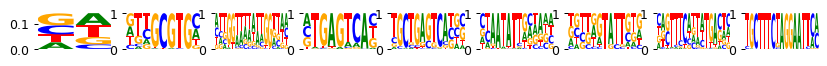

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.83it/s]


Current time: 2024-06-19 00:44:28.305462
	Loss: 569.369 , R2: 0.000
	Training time (model/function): (1.919s / 1.919s)
		per epoch (model/function): (0.137s/ 0.137s)
		per 1k samples: 0.287s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9372832352109005, pvalue=4.372518029236277e-230))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.83it/s]


Current time: 2024-06-19 00:44:30.396629
	Loss: 321.473 , R2: 0.000
	Training time (model/function): (3.841s / 1.921s)
		per epoch (model/function): (0.274s/ 0.137s)
		per 1k samples: 0.288s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9372832352109005, pvalue=4.372518029236277e-230))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.26it/s]


Current time: 2024-06-19 00:44:32.484692
	Loss: 248.695 , R2: 0.000
	Training time (model/function): (5.661s / 1.821s)
		per epoch (model/function): (0.404s/ 0.130s)
		per 1k samples: 0.273s
best loss 248.695
last five r2 values, by sequential filter optimization: ['0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9372832352109005, pvalue=4.372518029236277e-230))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.27it/s]


Current time: 2024-06-19 00:44:34.627978
	Loss: 239.770 , R2: 0.000
	Training time (model/function): (7.480s / 1.818s)
		per epoch (model/function): (0.534s/ 0.130s)
		per 1k samples: 0.272s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9372832352109005, pvalue=4.372518029236277e-230))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.30it/s]


Current time: 2024-06-19 00:44:36.610768
	Loss: 226.267 , R2: 0.000
	Training time (model/function): (9.291s / 1.811s)
		per epoch (model/function): (0.664s/ 0.129s)
		per 1k samples: 0.271s
best loss 226.267
last five r2 values, by sequential filter optimization: ['0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9372832352109005, pvalue=4.372518029236277e-230))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.79it/s]


Current time: 2024-06-19 00:44:38.867247
	Loss: 220.901 , R2: 0.000
	Training time (model/function): (11.220s / 1.929s)
		per epoch (model/function): (0.801s/ 0.138s)
		per 1k samples: 0.289s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9372832352109005, pvalue=4.372518029236277e-230))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.31it/s]


Current time: 2024-06-19 00:44:40.847655
	Loss: 208.538 , R2: 0.000
	Training time (model/function): (13.030s / 1.810s)
		per epoch (model/function): (0.931s/ 0.129s)
		per 1k samples: 0.271s
best loss 208.538
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9372832352109005, pvalue=4.372518029236277e-230))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir we

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.26it/s]


Current time: 2024-06-19 00:44:42.996564
	Loss: 204.456 , R2: 0.000
	Training time (model/function): (14.850s / 1.820s)
		per epoch (model/function): (1.061s/ 0.130s)
		per 1k samples: 0.273s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9372832352109005, pvalue=4.372518029236277e-230))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.46it/s]


Current time: 2024-06-19 00:44:45.031131
	Loss: 193.555 , R2: 0.000
	Training time (model/function): (16.627s / 1.776s)
		per epoch (model/function): (1.188s/ 0.127s)
		per 1k samples: 0.266s
best loss 193.555
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9372832352109005, pvalue=4.372518029236277e-230))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.18it/s]


Current time: 2024-06-19 00:44:47.197573
	Loss: 190.992 , R2: 0.000
	Training time (model/function): (18.464s / 1.837s)
		per epoch (model/function): (1.319s/ 0.131s)
		per 1k samples: 0.275s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9372832352109005, pvalue=4.372518029236277e-230))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  8.03it/s]


Current time: 2024-06-19 00:44:49.240249
	Loss: 181.580 , R2: 0.000
	Training time (model/function): (20.336s / 1.872s)
		per epoch (model/function): (1.453s/ 0.134s)
		per 1k samples: 0.280s
best loss 181.580
last five r2 values, by sequential filter optimization: ['0.000', '0.000', '0.000', '0.000', '0.000']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9372832352109005, pvalue=4.372518029236277e-230))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 20.33617901802063s
Time per epoch (total): 0.005 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs500/pwms/fold_4/running_time_1.pkl
15

/home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/pancreas_multiome_2022_processed_atac_obs500_var1500.h5ad
pancreatic_endocrinogenesis (500, 1500)
False /home/ilibarra/workspace/theislab/mubin

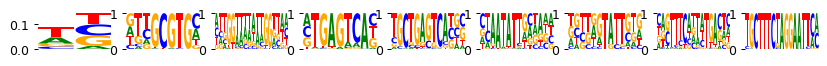

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.30it/s]


Current time: 2024-06-19 00:44:55.527577
	Loss: 249.000 , R2: 0.316
	Training time (model/function): (2.393s / 2.393s)
		per epoch (model/function): (0.171s/ 0.171s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996321123506844, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.35it/s]


Current time: 2024-06-19 00:44:58.151423
	Loss: 220.723 , R2: 0.319
	Training time (model/function): (4.766s / 2.372s)
		per epoch (model/function): (0.340s/ 0.169s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996321123506844, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.65it/s]


Current time: 2024-06-19 00:45:00.670232
	Loss: 193.922 , R2: 0.319
	Training time (model/function): (7.033s / 2.268s)
		per epoch (model/function): (0.502s/ 0.162s)
		per 1k samples: 0.120s
best loss 193.922
last five r2 values, by sequential filter optimization: ['0.319']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996321123506844, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.31it/s]


Current time: 2024-06-19 00:45:03.649986
	Loss: 181.178 , R2: 0.320
	Training time (model/function): (9.421s / 2.387s)
		per epoch (model/function): (0.673s/ 0.171s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996321123506844, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.55it/s]


Current time: 2024-06-19 00:45:06.204085
	Loss: 166.182 , R2: 0.320
	Training time (model/function): (11.721s / 2.301s)
		per epoch (model/function): (0.837s/ 0.164s)
		per 1k samples: 0.122s
best loss 166.182
last five r2 values, by sequential filter optimization: ['0.319', '0.320']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996321123506844, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.31it/s]


Current time: 2024-06-19 00:45:09.090228
	Loss: 162.497 , R2: 0.321
	Training time (model/function): (14.111s / 2.390s)
		per epoch (model/function): (1.008s/ 0.171s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996321123506844, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.57it/s]


Current time: 2024-06-19 00:45:11.722396
	Loss: 153.838 , R2: 0.321
	Training time (model/function): (16.406s / 2.295s)
		per epoch (model/function): (1.172s/ 0.164s)
		per 1k samples: 0.122s
best loss 153.838
last five r2 values, by sequential filter optimization: ['0.319', '0.320', '0.321']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996321123506844, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.31it/s]


Current time: 2024-06-19 00:45:14.610253
	Loss: 154.391 , R2: 0.321
	Training time (model/function): (18.794s / 2.388s)
		per epoch (model/function): (1.342s/ 0.171s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996321123506844, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.65it/s]


Current time: 2024-06-19 00:45:17.130160
	Loss: 148.543 , R2: 0.321
	Training time (model/function): (21.060s / 2.266s)
		per epoch (model/function): (1.504s/ 0.162s)
		per 1k samples: 0.120s
best loss 148.543
last five r2 values, by sequential filter optimization: ['0.319', '0.320', '0.321', '0.321']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996321123506844, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.31it/s]


Current time: 2024-06-19 00:45:20.098219
	Loss: 150.942 , R2: 0.322
	Training time (model/function): (23.449s / 2.389s)
		per epoch (model/function): (1.675s/ 0.171s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996321123506844, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.62it/s]


Current time: 2024-06-19 00:45:22.631006
	Loss: 146.288 , R2: 0.322
	Training time (model/function): (25.726s / 2.278s)
		per epoch (model/function): (1.838s/ 0.163s)
		per 1k samples: 0.121s
best loss 146.288
last five r2 values, by sequential filter optimization: ['0.319', '0.320', '0.321', '0.321', '0.322']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996321123506844, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 25.726499557495117s
Time per epoch (total): 0.006 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_0/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out

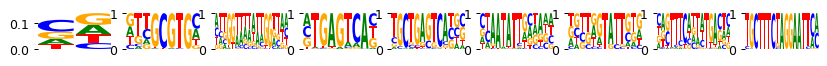

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.91it/s]


Current time: 2024-06-19 00:45:31.190094
	Loss: 269.259 , R2: 0.103
	Training time (model/function): (5.169s / 5.169s)
		per epoch (model/function): (0.369s/ 0.369s)
		per 1k samples: 0.274s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995620362321126, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.02it/s]


Current time: 2024-06-19 00:45:36.423874
	Loss: 220.782 , R2: 0.103
	Training time (model/function): (10.148s / 4.980s)
		per epoch (model/function): (0.725s/ 0.356s)
		per 1k samples: 0.264s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995620362321126, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.09it/s]


Current time: 2024-06-19 00:45:41.550837
	Loss: 193.921 , R2: 0.102
	Training time (model/function): (15.021s / 4.873s)
		per epoch (model/function): (1.073s/ 0.348s)
		per 1k samples: 0.259s
best loss 193.921
last five r2 values, by sequential filter optimization: ['0.102']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995620362321126, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.02it/s]


Current time: 2024-06-19 00:45:47.107406
	Loss: 181.186 , R2: 0.102
	Training time (model/function): (19.992s / 4.971s)
		per epoch (model/function): (1.428s/ 0.355s)
		per 1k samples: 0.264s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995620362321126, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.08it/s]


Current time: 2024-06-19 00:45:52.244728
	Loss: 166.180 , R2: 0.102
	Training time (model/function): (24.876s / 4.884s)
		per epoch (model/function): (1.777s/ 0.349s)
		per 1k samples: 0.259s
best loss 166.180
last five r2 values, by sequential filter optimization: ['0.102', '0.102']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995620362321126, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.02it/s]


Current time: 2024-06-19 00:45:57.808059
	Loss: 162.511 , R2: 0.101
	Training time (model/function): (29.856s / 4.979s)
		per epoch (model/function): (2.133s/ 0.356s)
		per 1k samples: 0.264s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995620362321126, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.08it/s]


Current time: 2024-06-19 00:46:02.935448
	Loss: 153.839 , R2: 0.100
	Training time (model/function): (34.730s / 4.874s)
		per epoch (model/function): (2.481s/ 0.348s)
		per 1k samples: 0.259s
best loss 153.839
last five r2 values, by sequential filter optimization: ['0.102', '0.102', '0.100']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995620362321126, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.03it/s]


Current time: 2024-06-19 00:46:08.400891
	Loss: 154.410 , R2: 0.100
	Training time (model/function): (39.698s / 4.969s)
		per epoch (model/function): (2.836s/ 0.355s)
		per 1k samples: 0.264s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995620362321126, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.09it/s]


Current time: 2024-06-19 00:46:13.602000
	Loss: 148.544 , R2: 0.099
	Training time (model/function): (44.558s / 4.860s)
		per epoch (model/function): (3.183s/ 0.347s)
		per 1k samples: 0.258s
best loss 148.544
last five r2 values, by sequential filter optimization: ['0.102', '0.102', '0.100', '0.099']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995620362321126, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.03it/s]


Current time: 2024-06-19 00:46:19.057587
	Loss: 150.947 , R2: 0.097
	Training time (model/function): (49.517s / 4.959s)
		per epoch (model/function): (3.537s/ 0.354s)
		per 1k samples: 0.263s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995620362321126, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.10it/s]


Current time: 2024-06-19 00:46:24.170793
	Loss: 146.290 , R2: 0.097
	Training time (model/function): (54.374s / 4.857s)
		per epoch (model/function): (3.884s/ 0.347s)
		per 1k samples: 0.258s
best loss 146.290
last five r2 values, by sequential filter optimization: ['0.102', '0.102', '0.100', '0.099', '0.097']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995620362321126, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 54.37377595901489s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_1/m

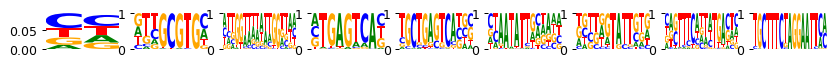

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.56it/s]


Current time: 2024-06-19 00:46:30.706419
	Loss: 248.999 , R2: 0.321
	Training time (model/function): (2.301s / 2.301s)
		per epoch (model/function): (0.164s/ 0.164s)
		per 1k samples: 0.122s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996306013529379, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.60it/s]


Current time: 2024-06-19 00:46:33.233929
	Loss: 220.722 , R2: 0.324
	Training time (model/function): (4.585s / 2.284s)
		per epoch (model/function): (0.328s/ 0.163s)
		per 1k samples: 0.121s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996306013529379, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.64it/s]


Current time: 2024-06-19 00:46:35.747386
	Loss: 193.923 , R2: 0.324
	Training time (model/function): (6.853s / 2.268s)
		per epoch (model/function): (0.489s/ 0.162s)
		per 1k samples: 0.120s
best loss 193.923
last five r2 values, by sequential filter optimization: ['0.324']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996306013529379, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.45it/s]


Current time: 2024-06-19 00:46:38.568278
	Loss: 181.178 , R2: 0.325
	Training time (model/function): (9.191s / 2.338s)
		per epoch (model/function): (0.656s/ 0.167s)
		per 1k samples: 0.124s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996306013529379, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.82it/s]


Current time: 2024-06-19 00:46:41.026950
	Loss: 166.181 , R2: 0.325
	Training time (model/function): (11.400s / 2.209s)
		per epoch (model/function): (0.814s/ 0.158s)
		per 1k samples: 0.117s
best loss 166.181
last five r2 values, by sequential filter optimization: ['0.324', '0.325']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996306013529379, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.33it/s]


Current time: 2024-06-19 00:46:43.891564
	Loss: 162.496 , R2: 0.326
	Training time (model/function): (13.781s / 2.382s)
		per epoch (model/function): (0.984s/ 0.170s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996306013529379, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.87it/s]


Current time: 2024-06-19 00:46:46.332956
	Loss: 153.837 , R2: 0.326
	Training time (model/function): (15.976s / 2.195s)
		per epoch (model/function): (1.141s/ 0.157s)
		per 1k samples: 0.116s
best loss 153.837
last five r2 values, by sequential filter optimization: ['0.324', '0.325', '0.326']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996306013529379, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.58it/s]


Current time: 2024-06-19 00:46:49.102138
	Loss: 154.393 , R2: 0.327
	Training time (model/function): (18.266s / 2.290s)
		per epoch (model/function): (1.305s/ 0.164s)
		per 1k samples: 0.121s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996306013529379, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.95it/s]


Current time: 2024-06-19 00:46:51.600465
	Loss: 148.540 , R2: 0.326
	Training time (model/function): (20.435s / 2.169s)
		per epoch (model/function): (1.460s/ 0.155s)
		per 1k samples: 0.115s
best loss 148.540
last five r2 values, by sequential filter optimization: ['0.324', '0.325', '0.326', '0.326']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996306013529379, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.58it/s]


Current time: 2024-06-19 00:46:54.368852
	Loss: 150.940 , R2: 0.328
	Training time (model/function): (22.724s / 2.289s)
		per epoch (model/function): (1.623s/ 0.163s)
		per 1k samples: 0.121s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996306013529379, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.93it/s]


Current time: 2024-06-19 00:46:56.789414
	Loss: 146.288 , R2: 0.328
	Training time (model/function): (24.898s / 2.174s)
		per epoch (model/function): (1.778s/ 0.155s)
		per 1k samples: 0.115s
best loss 146.288
last five r2 values, by sequential filter optimization: ['0.324', '0.325', '0.326', '0.326', '0.328']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996306013529379, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 24.897818565368652s
Time per epoch (total): 0.006 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_1/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out

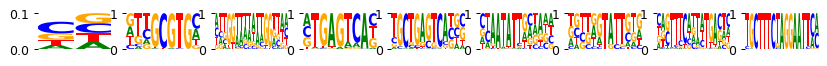

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.00it/s]


Current time: 2024-06-19 00:47:05.220735
	Loss: 268.803 , R2: 0.105
	Training time (model/function): (5.007s / 5.007s)
		per epoch (model/function): (0.358s/ 0.358s)
		per 1k samples: 0.266s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995263717197559, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.89it/s]


Current time: 2024-06-19 00:47:10.662475
	Loss: 220.781 , R2: 0.105
	Training time (model/function): (10.200s / 5.194s)
		per epoch (model/function): (0.729s/ 0.371s)
		per 1k samples: 0.276s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995263717197559, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.08it/s]


Current time: 2024-06-19 00:47:15.893522
	Loss: 193.920 , R2: 0.104
	Training time (model/function): (15.087s / 4.886s)
		per epoch (model/function): (1.078s/ 0.349s)
		per 1k samples: 0.259s
best loss 193.920
last five r2 values, by sequential filter optimization: ['0.104']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995263717197559, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.06it/s]


Current time: 2024-06-19 00:47:21.294785
	Loss: 181.184 , R2: 0.104
	Training time (model/function): (20.005s / 4.918s)
		per epoch (model/function): (1.429s/ 0.351s)
		per 1k samples: 0.261s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995263717197559, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.14it/s]


Current time: 2024-06-19 00:47:26.326439
	Loss: 166.179 , R2: 0.104
	Training time (model/function): (24.789s / 4.784s)
		per epoch (model/function): (1.771s/ 0.342s)
		per 1k samples: 0.254s
best loss 166.179
last five r2 values, by sequential filter optimization: ['0.104', '0.104']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995263717197559, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.03it/s]


Current time: 2024-06-19 00:47:31.767118
	Loss: 162.508 , R2: 0.103
	Training time (model/function): (29.749s / 4.960s)
		per epoch (model/function): (2.125s/ 0.354s)
		per 1k samples: 0.263s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995263717197559, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.10it/s]


Current time: 2024-06-19 00:47:36.863297
	Loss: 153.836 , R2: 0.102
	Training time (model/function): (34.597s / 4.848s)
		per epoch (model/function): (2.471s/ 0.346s)
		per 1k samples: 0.257s
best loss 153.836
last five r2 values, by sequential filter optimization: ['0.104', '0.104', '0.102']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995263717197559, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.05it/s]


Current time: 2024-06-19 00:47:42.359917
	Loss: 154.412 , R2: 0.102
	Training time (model/function): (39.525s / 4.928s)
		per epoch (model/function): (2.823s/ 0.352s)
		per 1k samples: 0.262s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995263717197559, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.17it/s]


Current time: 2024-06-19 00:47:47.346292
	Loss: 148.544 , R2: 0.101
	Training time (model/function): (44.262s / 4.737s)
		per epoch (model/function): (3.162s/ 0.338s)
		per 1k samples: 0.251s
best loss 148.544
last five r2 values, by sequential filter optimization: ['0.104', '0.104', '0.102', '0.101']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995263717197559, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.09it/s]


Current time: 2024-06-19 00:47:52.692622
	Loss: 150.950 , R2: 0.100
	Training time (model/function): (49.123s / 4.861s)
		per epoch (model/function): (3.509s/ 0.347s)
		per 1k samples: 0.258s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995263717197559, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.11it/s]


Current time: 2024-06-19 00:47:57.779817
	Loss: 146.289 , R2: 0.100
	Training time (model/function): (53.963s / 4.840s)
		per epoch (model/function): (3.854s/ 0.346s)
		per 1k samples: 0.257s
best loss 146.289
last five r2 values, by sequential filter optimization: ['0.104', '0.104', '0.102', '0.101', '0.100']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995263717197559, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 53.96274375915527s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_2/m

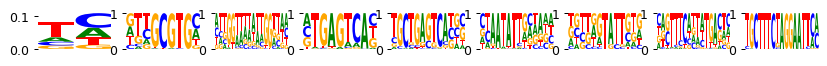

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.13it/s]


Current time: 2024-06-19 00:48:03.980884
	Loss: 248.999 , R2: 0.297
	Training time (model/function): (2.114s / 2.114s)
		per epoch (model/function): (0.151s/ 0.151s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996649224230318, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.86it/s]


Current time: 2024-06-19 00:48:06.413825
	Loss: 220.721 , R2: 0.300
	Training time (model/function): (4.312s / 2.198s)
		per epoch (model/function): (0.308s/ 0.157s)
		per 1k samples: 0.117s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996649224230318, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.48it/s]


Current time: 2024-06-19 00:48:08.665221
	Loss: 193.921 , R2: 0.300
	Training time (model/function): (6.329s / 2.017s)
		per epoch (model/function): (0.452s/ 0.144s)
		per 1k samples: 0.107s
best loss 193.921
last five r2 values, by sequential filter optimization: ['0.300']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996649224230318, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.12it/s]


Current time: 2024-06-19 00:48:11.238992
	Loss: 181.177 , R2: 0.301
	Training time (model/function): (8.446s / 2.117s)
		per epoch (model/function): (0.603s/ 0.151s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996649224230318, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.42it/s]


Current time: 2024-06-19 00:48:13.590165
	Loss: 166.177 , R2: 0.301
	Training time (model/function): (10.477s / 2.032s)
		per epoch (model/function): (0.748s/ 0.145s)
		per 1k samples: 0.108s
best loss 166.177
last five r2 values, by sequential filter optimization: ['0.300', '0.301']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996649224230318, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.13it/s]


Current time: 2024-06-19 00:48:16.161018
	Loss: 162.496 , R2: 0.302
	Training time (model/function): (12.591s / 2.114s)
		per epoch (model/function): (0.899s/ 0.151s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996649224230318, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.46it/s]


Current time: 2024-06-19 00:48:18.417797
	Loss: 153.835 , R2: 0.302
	Training time (model/function): (14.613s / 2.022s)
		per epoch (model/function): (1.044s/ 0.144s)
		per 1k samples: 0.107s
best loss 153.835
last five r2 values, by sequential filter optimization: ['0.300', '0.301', '0.302']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996649224230318, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.13it/s]


Current time: 2024-06-19 00:48:20.992621
	Loss: 154.390 , R2: 0.302
	Training time (model/function): (16.728s / 2.115s)
		per epoch (model/function): (1.195s/ 0.151s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996649224230318, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.25it/s]


Current time: 2024-06-19 00:48:23.307775
	Loss: 148.542 , R2: 0.302
	Training time (model/function): (18.808s / 2.080s)
		per epoch (model/function): (1.343s/ 0.149s)
		per 1k samples: 0.110s
best loss 148.542
last five r2 values, by sequential filter optimization: ['0.300', '0.301', '0.302', '0.302']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996649224230318, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.13it/s]


Current time: 2024-06-19 00:48:25.883475
	Loss: 150.941 , R2: 0.303
	Training time (model/function): (20.922s / 2.115s)
		per epoch (model/function): (1.494s/ 0.151s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996649224230318, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.51it/s]


Current time: 2024-06-19 00:48:28.127201
	Loss: 146.285 , R2: 0.304
	Training time (model/function): (22.931s / 2.009s)
		per epoch (model/function): (1.638s/ 0.143s)
		per 1k samples: 0.107s
best loss 146.285
last five r2 values, by sequential filter optimization: ['0.300', '0.301', '0.302', '0.302', '0.304']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996649224230318, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 22.931191444396973s
Time per epoch (total): 0.005 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_2/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out

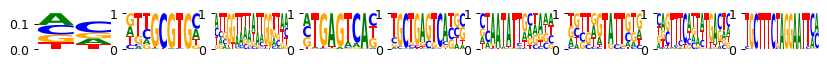

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.20it/s]


Current time: 2024-06-19 00:48:36.150992
	Loss: 269.296 , R2: 0.111
	Training time (model/function): (4.698s / 4.698s)
		per epoch (model/function): (0.336s/ 0.336s)
		per 1k samples: 0.249s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994335562406926, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.22it/s]


Current time: 2024-06-19 00:48:41.148858
	Loss: 220.780 , R2: 0.111
	Training time (model/function): (9.363s / 4.665s)
		per epoch (model/function): (0.669s/ 0.333s)
		per 1k samples: 0.248s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994335562406926, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.28it/s]


Current time: 2024-06-19 00:48:45.974182
	Loss: 193.918 , R2: 0.111
	Training time (model/function): (13.950s / 4.587s)
		per epoch (model/function): (0.996s/ 0.328s)
		per 1k samples: 0.244s
best loss 193.918
last five r2 values, by sequential filter optimization: ['0.111']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994335562406926, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.21it/s]


Current time: 2024-06-19 00:48:51.117477
	Loss: 181.182 , R2: 0.111
	Training time (model/function): (18.634s / 4.683s)
		per epoch (model/function): (1.331s/ 0.335s)
		per 1k samples: 0.249s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994335562406926, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.18it/s]


Current time: 2024-06-19 00:48:56.165847
	Loss: 166.178 , R2: 0.110
	Training time (model/function): (23.357s / 4.724s)
		per epoch (model/function): (1.668s/ 0.337s)
		per 1k samples: 0.251s
best loss 166.178
last five r2 values, by sequential filter optimization: ['0.111', '0.110']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994335562406926, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.20it/s]


Current time: 2024-06-19 00:49:01.327035
	Loss: 162.508 , R2: 0.109
	Training time (model/function): (28.060s / 4.703s)
		per epoch (model/function): (2.004s/ 0.336s)
		per 1k samples: 0.250s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994335562406926, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.27it/s]


Current time: 2024-06-19 00:49:06.160613
	Loss: 153.835 , R2: 0.109
	Training time (model/function): (32.657s / 4.597s)
		per epoch (model/function): (2.333s/ 0.328s)
		per 1k samples: 0.244s
best loss 153.835
last five r2 values, by sequential filter optimization: ['0.111', '0.110', '0.109']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994335562406926, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.14it/s]


Current time: 2024-06-19 00:49:11.404544
	Loss: 154.406 , R2: 0.109
	Training time (model/function): (37.441s / 4.783s)
		per epoch (model/function): (2.674s/ 0.342s)
		per 1k samples: 0.254s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994335562406926, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.29it/s]


Current time: 2024-06-19 00:49:16.216851
	Loss: 148.541 , R2: 0.108
	Training time (model/function): (42.017s / 4.576s)
		per epoch (model/function): (3.001s/ 0.327s)
		per 1k samples: 0.243s
best loss 148.541
last five r2 values, by sequential filter optimization: ['0.111', '0.110', '0.109', '0.108']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994335562406926, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.21it/s]


Current time: 2024-06-19 00:49:21.364905
	Loss: 150.947 , R2: 0.107
	Training time (model/function): (46.701s / 4.684s)
		per epoch (model/function): (3.336s/ 0.335s)
		per 1k samples: 0.249s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994335562406926, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.23it/s]


Current time: 2024-06-19 00:49:26.260892
	Loss: 146.286 , R2: 0.106
	Training time (model/function): (51.361s / 4.660s)
		per epoch (model/function): (3.669s/ 0.333s)
		per 1k samples: 0.247s
best loss 146.286
last five r2 values, by sequential filter optimization: ['0.111', '0.110', '0.109', '0.108', '0.106']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994335562406926, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 51.361268043518066s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_3/

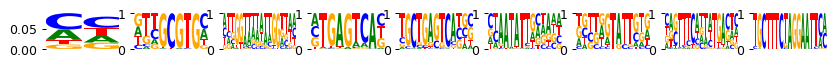

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.37it/s]


Current time: 2024-06-19 00:49:32.751561
	Loss: 248.996 , R2: 0.310
	Training time (model/function): (2.371s / 2.371s)
		per epoch (model/function): (0.169s/ 0.169s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996638409677624, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.35it/s]


Current time: 2024-06-19 00:49:35.378276
	Loss: 220.720 , R2: 0.314
	Training time (model/function): (4.744s / 2.374s)
		per epoch (model/function): (0.339s/ 0.170s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996638409677624, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.58it/s]


Current time: 2024-06-19 00:49:37.923789
	Loss: 193.918 , R2: 0.314
	Training time (model/function): (7.035s / 2.291s)
		per epoch (model/function): (0.503s/ 0.164s)
		per 1k samples: 0.122s
best loss 193.918
last five r2 values, by sequential filter optimization: ['0.314']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996638409677624, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.34it/s]


Current time: 2024-06-19 00:49:40.793342
	Loss: 181.175 , R2: 0.315
	Training time (model/function): (9.410s / 2.375s)
		per epoch (model/function): (0.672s/ 0.170s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996638409677624, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.58it/s]


Current time: 2024-06-19 00:49:43.423968
	Loss: 166.175 , R2: 0.315
	Training time (model/function): (11.702s / 2.292s)
		per epoch (model/function): (0.836s/ 0.164s)
		per 1k samples: 0.122s
best loss 166.175
last five r2 values, by sequential filter optimization: ['0.314', '0.315']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996638409677624, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.34it/s]


Current time: 2024-06-19 00:49:46.328925
	Loss: 162.495 , R2: 0.316
	Training time (model/function): (14.078s / 2.376s)
		per epoch (model/function): (1.006s/ 0.170s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996638409677624, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.42it/s]


Current time: 2024-06-19 00:49:48.936817
	Loss: 153.831 , R2: 0.316
	Training time (model/function): (16.430s / 2.351s)
		per epoch (model/function): (1.174s/ 0.168s)
		per 1k samples: 0.125s
best loss 153.831
last five r2 values, by sequential filter optimization: ['0.314', '0.315', '0.316']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996638409677624, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.30it/s]


Current time: 2024-06-19 00:49:51.908859
	Loss: 154.388 , R2: 0.317
	Training time (model/function): (18.822s / 2.392s)
		per epoch (model/function): (1.344s/ 0.171s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996638409677624, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.66it/s]


Current time: 2024-06-19 00:49:54.426881
	Loss: 148.538 , R2: 0.316
	Training time (model/function): (21.086s / 2.264s)
		per epoch (model/function): (1.506s/ 0.162s)
		per 1k samples: 0.120s
best loss 148.538
last five r2 values, by sequential filter optimization: ['0.314', '0.315', '0.316', '0.316']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996638409677624, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.29it/s]


Current time: 2024-06-19 00:49:57.317273
	Loss: 150.939 , R2: 0.318
	Training time (model/function): (23.482s / 2.396s)
		per epoch (model/function): (1.677s/ 0.171s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996638409677624, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.62it/s]


Current time: 2024-06-19 00:49:59.850671
	Loss: 146.282 , R2: 0.318
	Training time (model/function): (25.760s / 2.278s)
		per epoch (model/function): (1.840s/ 0.163s)
		per 1k samples: 0.121s
best loss 146.282
last five r2 values, by sequential filter optimization: ['0.314', '0.315', '0.316', '0.316', '0.318']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996638409677624, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 25.76010036468506s
Time per epoch (total): 0.006 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_3/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out 

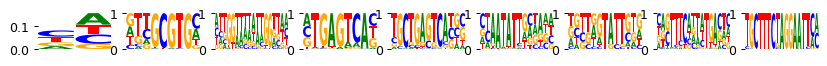

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.03it/s]


Current time: 2024-06-19 00:50:08.248099
	Loss: 269.594 , R2: 0.095
	Training time (model/function): (4.954s / 4.954s)
		per epoch (model/function): (0.354s/ 0.354s)
		per 1k samples: 0.263s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995364042045748, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.04it/s]


Current time: 2024-06-19 00:50:13.450740
	Loss: 220.780 , R2: 0.095
	Training time (model/function): (9.904s / 4.949s)
		per epoch (model/function): (0.707s/ 0.354s)
		per 1k samples: 0.263s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995364042045748, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.04it/s]


Current time: 2024-06-19 00:50:18.668650
	Loss: 193.916 , R2: 0.095
	Training time (model/function): (14.855s / 4.952s)
		per epoch (model/function): (1.061s/ 0.354s)
		per 1k samples: 0.263s
best loss 193.916
last five r2 values, by sequential filter optimization: ['0.095']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995364042045748, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.97it/s]


Current time: 2024-06-19 00:50:24.224614
	Loss: 181.182 , R2: 0.095
	Training time (model/function): (19.916s / 5.061s)
		per epoch (model/function): (1.423s/ 0.361s)
		per 1k samples: 0.269s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995364042045748, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.07it/s]


Current time: 2024-06-19 00:50:29.377375
	Loss: 166.175 , R2: 0.094
	Training time (model/function): (24.815s / 4.898s)
		per epoch (model/function): (1.772s/ 0.350s)
		per 1k samples: 0.260s
best loss 166.175
last five r2 values, by sequential filter optimization: ['0.095', '0.094']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995364042045748, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.03it/s]


Current time: 2024-06-19 00:50:34.924328
	Loss: 162.505 , R2: 0.093
	Training time (model/function): (29.781s / 4.966s)
		per epoch (model/function): (2.127s/ 0.355s)
		per 1k samples: 0.264s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995364042045748, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.07it/s]


Current time: 2024-06-19 00:50:40.074477
	Loss: 153.830 , R2: 0.093
	Training time (model/function): (34.675s / 4.895s)
		per epoch (model/function): (2.477s/ 0.350s)
		per 1k samples: 0.260s
best loss 153.830
last five r2 values, by sequential filter optimization: ['0.095', '0.094', '0.093']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995364042045748, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.97it/s]


Current time: 2024-06-19 00:50:45.634310
	Loss: 154.405 , R2: 0.092
	Training time (model/function): (39.739s / 5.063s)
		per epoch (model/function): (2.838s/ 0.362s)
		per 1k samples: 0.269s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995364042045748, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.10it/s]


Current time: 2024-06-19 00:50:50.742933
	Loss: 148.539 , R2: 0.092
	Training time (model/function): (44.593s / 4.854s)
		per epoch (model/function): (3.185s/ 0.347s)
		per 1k samples: 0.258s
best loss 148.539
last five r2 values, by sequential filter optimization: ['0.095', '0.094', '0.093', '0.092']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995364042045748, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.03it/s]


Current time: 2024-06-19 00:50:56.195839
	Loss: 150.944 , R2: 0.090
	Training time (model/function): (49.550s / 4.957s)
		per epoch (model/function): (3.539s/ 0.354s)
		per 1k samples: 0.263s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995364042045748, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.04it/s]


Current time: 2024-06-19 00:51:01.392611
	Loss: 146.283 , R2: 0.090
	Training time (model/function): (54.491s / 4.941s)
		per epoch (model/function): (3.892s/ 0.353s)
		per 1k samples: 0.262s
best loss 146.283
last five r2 values, by sequential filter optimization: ['0.095', '0.094', '0.093', '0.092', '0.090']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995364042045748, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 54.4908492565155s
Time per epoch (total): 0.013 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_4/mo

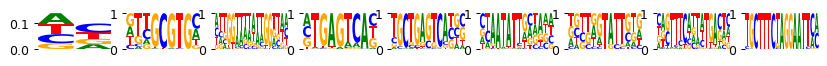

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.17it/s]


Current time: 2024-06-19 00:51:07.689522
	Loss: 248.999 , R2: 0.318
	Training time (model/function): (2.107s / 2.107s)
		per epoch (model/function): (0.150s/ 0.150s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996668910031448, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.15it/s]


Current time: 2024-06-19 00:51:10.035520
	Loss: 220.725 , R2: 0.322
	Training time (model/function): (4.215s / 2.109s)
		per epoch (model/function): (0.301s/ 0.151s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996668910031448, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.47it/s]


Current time: 2024-06-19 00:51:12.290376
	Loss: 193.923 , R2: 0.322
	Training time (model/function): (6.234s / 2.018s)
		per epoch (model/function): (0.445s/ 0.144s)
		per 1k samples: 0.107s
best loss 193.923
last five r2 values, by sequential filter optimization: ['0.322']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996668910031448, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.14it/s]


Current time: 2024-06-19 00:51:14.862097
	Loss: 181.177 , R2: 0.323
	Training time (model/function): (8.345s / 2.112s)
		per epoch (model/function): (0.596s/ 0.151s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996668910031448, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.45it/s]


Current time: 2024-06-19 00:51:17.207344
	Loss: 166.182 , R2: 0.323
	Training time (model/function): (10.371s / 2.026s)
		per epoch (model/function): (0.741s/ 0.145s)
		per 1k samples: 0.108s
best loss 166.182
last five r2 values, by sequential filter optimization: ['0.322', '0.323']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996668910031448, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.14it/s]


Current time: 2024-06-19 00:51:19.777439
	Loss: 162.499 , R2: 0.324
	Training time (model/function): (12.482s / 2.111s)
		per epoch (model/function): (0.892s/ 0.151s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996668910031448, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.47it/s]


Current time: 2024-06-19 00:51:22.033700
	Loss: 153.838 , R2: 0.324
	Training time (model/function): (14.501s / 2.019s)
		per epoch (model/function): (1.036s/ 0.144s)
		per 1k samples: 0.107s
best loss 153.838
last five r2 values, by sequential filter optimization: ['0.322', '0.323', '0.324']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996668910031448, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.15it/s]


Current time: 2024-06-19 00:51:24.687099
	Loss: 154.394 , R2: 0.324
	Training time (model/function): (16.611s / 2.110s)
		per epoch (model/function): (1.187s/ 0.151s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996668910031448, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.57it/s]


Current time: 2024-06-19 00:51:26.915022
	Loss: 148.543 , R2: 0.324
	Training time (model/function): (18.603s / 1.992s)
		per epoch (model/function): (1.329s/ 0.142s)
		per 1k samples: 0.106s
best loss 148.543
last five r2 values, by sequential filter optimization: ['0.322', '0.323', '0.324', '0.324']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996668910031448, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  7.14it/s]


Current time: 2024-06-19 00:51:29.488648
	Loss: 150.941 , R2: 0.325
	Training time (model/function): (20.714s / 2.111s)
		per epoch (model/function): (1.480s/ 0.151s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996668910031448, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:01<00:00,  7.54it/s]


Current time: 2024-06-19 00:51:31.728247
	Loss: 146.289 , R2: 0.325
	Training time (model/function): (22.715s / 2.001s)
		per epoch (model/function): (1.623s/ 0.143s)
		per 1k samples: 0.106s
best loss 146.289
last five r2 values, by sequential filter optimization: ['0.322', '0.323', '0.324', '0.324', '0.325']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996668910031448, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 22.71522855758667s
Time per epoch (total): 0.005 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_4/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out 

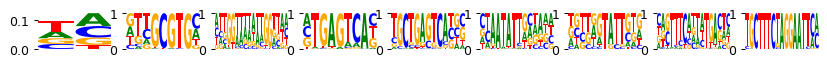

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.20it/s]


Current time: 2024-06-19 00:51:39.762441
	Loss: 269.382 , R2: 0.101
	Training time (model/function): (4.699s / 4.699s)
		per epoch (model/function): (0.336s/ 0.336s)
		per 1k samples: 0.250s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995552688674727, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.21it/s]


Current time: 2024-06-19 00:51:44.674666
	Loss: 220.784 , R2: 0.101
	Training time (model/function): (9.377s / 4.677s)
		per epoch (model/function): (0.670s/ 0.334s)
		per 1k samples: 0.248s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995552688674727, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.20it/s]


Current time: 2024-06-19 00:51:49.604398
	Loss: 193.920 , R2: 0.101
	Training time (model/function): (14.070s / 4.693s)
		per epoch (model/function): (1.005s/ 0.335s)
		per 1k samples: 0.249s
best loss 193.920
last five r2 values, by sequential filter optimization: ['0.101']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995552688674727, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.20it/s]


Current time: 2024-06-19 00:51:54.758817
	Loss: 181.187 , R2: 0.101
	Training time (model/function): (18.766s / 4.695s)
		per epoch (model/function): (1.340s/ 0.335s)
		per 1k samples: 0.249s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995552688674727, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.26it/s]


Current time: 2024-06-19 00:51:59.693646
	Loss: 166.181 , R2: 0.101
	Training time (model/function): (23.377s / 4.611s)
		per epoch (model/function): (1.670s/ 0.329s)
		per 1k samples: 0.245s
best loss 166.181
last five r2 values, by sequential filter optimization: ['0.101', '0.101']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995552688674727, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.18it/s]


Current time: 2024-06-19 00:52:04.881910
	Loss: 162.511 , R2: 0.100
	Training time (model/function): (28.105s / 4.727s)
		per epoch (model/function): (2.007s/ 0.338s)
		per 1k samples: 0.251s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995552688674727, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.27it/s]


Current time: 2024-06-19 00:52:09.722443
	Loss: 153.837 , R2: 0.099
	Training time (model/function): (32.710s / 4.605s)
		per epoch (model/function): (2.336s/ 0.329s)
		per 1k samples: 0.245s
best loss 153.837
last five r2 values, by sequential filter optimization: ['0.101', '0.101', '0.099']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995552688674727, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.14it/s]


Current time: 2024-06-19 00:52:14.967331
	Loss: 154.410 , R2: 0.098
	Training time (model/function): (37.494s / 4.784s)
		per epoch (model/function): (2.678s/ 0.342s)
		per 1k samples: 0.254s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995552688674727, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.29it/s]


Current time: 2024-06-19 00:52:19.774238
	Loss: 148.546 , R2: 0.097
	Training time (model/function): (42.064s / 4.571s)
		per epoch (model/function): (3.005s/ 0.326s)
		per 1k samples: 0.243s
best loss 148.546
last five r2 values, by sequential filter optimization: ['0.101', '0.101', '0.099', '0.097']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995552688674727, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.21it/s]


Current time: 2024-06-19 00:52:24.912832
	Loss: 150.951 , R2: 0.096
	Training time (model/function): (46.742s / 4.677s)
		per epoch (model/function): (3.339s/ 0.334s)
		per 1k samples: 0.248s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995552688674727, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.23it/s]


Current time: 2024-06-19 00:52:29.804443
	Loss: 146.291 , R2: 0.096
	Training time (model/function): (51.397s / 4.655s)
		per epoch (model/function): (3.671s/ 0.333s)
		per 1k samples: 0.247s
best loss 146.291
last five r2 values, by sequential filter optimization: ['0.101', '0.101', '0.099', '0.097', '0.096']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995552688674727, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 51.39687705039978s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs500/pwms/fold_4/running_time_1.pkl
20

/home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/processed_laura_2023_obs500_var1500.h5ad
pbmc (500, 1495)
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs500/pwms/fold_0/model.pt
True /home/ilibarr

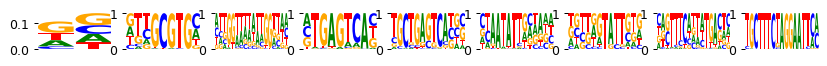

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.09it/s]


Current time: 2024-06-19 00:52:37.812861
	Loss: 219.813 , R2: 0.190
	Training time (model/function): (2.966s / 2.966s)
		per epoch (model/function): (0.212s/ 0.212s)
		per 1k samples: 0.079s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980762952321333, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.23it/s]


Current time: 2024-06-19 00:52:41.118945
	Loss: 182.262 , R2: 0.192
	Training time (model/function): (5.855s / 2.889s)
		per epoch (model/function): (0.418s/ 0.206s)
		per 1k samples: 0.077s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980762952321333, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.25it/s]


Current time: 2024-06-19 00:52:44.411772
	Loss: 160.252 , R2: 0.192
	Training time (model/function): (8.731s / 2.876s)
		per epoch (model/function): (0.624s/ 0.205s)
		per 1k samples: 0.076s
best loss 160.252
last five r2 values, by sequential filter optimization: ['0.192']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980762952321333, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.22it/s]


Current time: 2024-06-19 00:52:48.218455
	Loss: 155.578 , R2: 0.192
	Training time (model/function): (11.626s / 2.895s)
		per epoch (model/function): (0.830s/ 0.207s)
		per 1k samples: 0.077s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980762952321333, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.38it/s]


Current time: 2024-06-19 00:52:51.441267
	Loss: 147.925 , R2: 0.192
	Training time (model/function): (14.433s / 2.807s)
		per epoch (model/function): (1.031s/ 0.201s)
		per 1k samples: 0.074s
best loss 147.925
last five r2 values, by sequential filter optimization: ['0.192', '0.192']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980762952321333, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.08it/s]


Current time: 2024-06-19 00:52:55.237311
	Loss: 149.921 , R2: 0.193
	Training time (model/function): (17.407s / 2.974s)
		per epoch (model/function): (1.243s/ 0.212s)
		per 1k samples: 0.079s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980762952321333, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.41it/s]


Current time: 2024-06-19 00:52:58.442933
	Loss: 145.332 , R2: 0.193
	Training time (model/function): (20.197s / 2.790s)
		per epoch (model/function): (1.443s/ 0.199s)
		per 1k samples: 0.074s
best loss 145.332
last five r2 values, by sequential filter optimization: ['0.192', '0.192', '0.193']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980762952321333, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.22it/s]


Current time: 2024-06-19 00:53:02.248088
	Loss: 148.729 , R2: 0.194
	Training time (model/function): (23.092s / 2.894s)
		per epoch (model/function): (1.649s/ 0.207s)
		per 1k samples: 0.077s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980762952321333, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.47it/s]


Current time: 2024-06-19 00:53:05.513081
	Loss: 144.788 , R2: 0.194
	Training time (model/function): (25.851s / 2.759s)
		per epoch (model/function): (1.846s/ 0.197s)
		per 1k samples: 0.073s
best loss 144.788
last five r2 values, by sequential filter optimization: ['0.192', '0.192', '0.193', '0.194']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980762952321333, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.16it/s]


Current time: 2024-06-19 00:53:09.265960
	Loss: 148.469 , R2: 0.194
	Training time (model/function): (28.778s / 2.927s)
		per epoch (model/function): (2.056s/ 0.209s)
		per 1k samples: 0.078s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980762952321333, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.53it/s]


Current time: 2024-06-19 00:53:12.503548
	Loss: 144.676 , R2: 0.194
	Training time (model/function): (31.510s / 2.732s)
		per epoch (model/function): (2.251s/ 0.195s)
		per 1k samples: 0.072s
best loss 144.676
last five r2 values, by sequential filter optimization: ['0.192', '0.192', '0.193', '0.194', '0.194']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980762952321333, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 31.509820699691772s
Time per epoch (total): 0.007 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_0/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


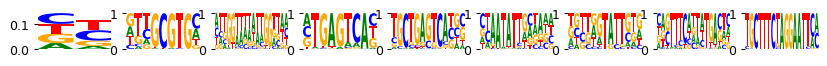

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 00:53:31.853371
	Loss: 220.691 , R2: 0.189
	Training time (model/function): (13.257s / 13.257s)
		per epoch (model/function): (0.947s/ 0.947s)
		per 1k samples: 0.351s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991281055658069, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 00:53:45.624871
	Loss: 182.266 , R2: 0.189
	Training time (model/function): (26.610s / 13.353s)
		per epoch (model/function): (1.901s/ 0.954s)
		per 1k samples: 0.354s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991281055658069, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 00:53:59.318419
	Loss: 160.257 , R2: 0.189
	Training time (model/function): (39.886s / 13.275s)
		per epoch (model/function): (2.849s/ 0.948s)
		per 1k samples: 0.352s
best loss 160.257
last five r2 values, by sequential filter optimization: ['0.189']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991281055658069, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 00:54:13.531284
	Loss: 155.587 , R2: 0.189
	Training time (model/function): (53.273s / 13.388s)
		per epoch (model/function): (3.805s/ 0.956s)
		per 1k samples: 0.355s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991281055658069, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Current time: 2024-06-19 00:54:27.206867
	Loss: 147.926 , R2: 0.189
	Training time (model/function): (66.437s / 13.163s)
		per epoch (model/function): (4.745s/ 0.940s)
		per 1k samples: 0.349s
best loss 147.926
last five r2 values, by sequential filter optimization: ['0.189', '0.189']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991281055658069, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 00:54:41.355941
	Loss: 149.927 , R2: 0.189
	Training time (model/function): (79.756s / 13.320s)
		per epoch (model/function): (5.697s/ 0.951s)
		per 1k samples: 0.353s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991281055658069, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Current time: 2024-06-19 00:54:54.964085
	Loss: 145.335 , R2: 0.189
	Training time (model/function): (92.946s / 13.190s)
		per epoch (model/function): (6.639s/ 0.942s)
		per 1k samples: 0.349s
best loss 145.335
last five r2 values, by sequential filter optimization: ['0.189', '0.189', '0.189']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991281055658069, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 00:55:09.175106
	Loss: 148.739 , R2: 0.189
	Training time (model/function): (106.329s / 13.383s)
		per epoch (model/function): (7.595s/ 0.956s)
		per 1k samples: 0.355s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991281055658069, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.15it/s]


Current time: 2024-06-19 00:55:22.755536
	Loss: 144.789 , R2: 0.189
	Training time (model/function): (119.401s / 13.072s)
		per epoch (model/function): (8.529s/ 0.934s)
		per 1k samples: 0.346s
best loss 144.789
last five r2 values, by sequential filter optimization: ['0.189', '0.189', '0.189', '0.189']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991281055658069, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 00:55:36.965474
	Loss: 148.490 , R2: 0.189
	Training time (model/function): (132.696s / 13.295s)
		per epoch (model/function): (9.478s/ 0.950s)
		per 1k samples: 0.352s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991281055658069, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.15it/s]


Current time: 2024-06-19 00:55:50.456854
	Loss: 144.674 , R2: 0.189
	Training time (model/function): (145.767s / 13.072s)
		per epoch (model/function): (10.412s/ 0.934s)
		per 1k samples: 0.346s
best loss 144.674
last five r2 values, by sequential filter optimization: ['0.189', '0.189', '0.189', '0.189', '0.189']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991281055658069, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 145.7672474384308s
Time per epoch (total): 0.034 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_1/model_1.pt
/home/ilibarra/workspace/theislab/m

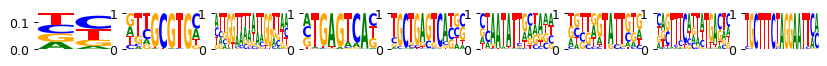

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.29it/s]


Current time: 2024-06-19 00:56:00.282032
	Loss: 219.817 , R2: 0.188
	Training time (model/function): (2.855s / 2.855s)
		per epoch (model/function): (0.204s/ 0.204s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983007666113218, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.23it/s]


Current time: 2024-06-19 00:56:03.587779
	Loss: 182.267 , R2: 0.189
	Training time (model/function): (5.742s / 2.888s)
		per epoch (model/function): (0.410s/ 0.206s)
		per 1k samples: 0.077s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983007666113218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.42it/s]


Current time: 2024-06-19 00:56:06.894663
	Loss: 160.257 , R2: 0.189
	Training time (model/function): (8.531s / 2.788s)
		per epoch (model/function): (0.609s/ 0.199s)
		per 1k samples: 0.074s
best loss 160.257
last five r2 values, by sequential filter optimization: ['0.189']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983007666113218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.23it/s]


Current time: 2024-06-19 00:56:10.693849
	Loss: 155.580 , R2: 0.190
	Training time (model/function): (11.420s / 2.889s)
		per epoch (model/function): (0.816s/ 0.206s)
		per 1k samples: 0.077s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983007666113218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.41it/s]


Current time: 2024-06-19 00:56:13.901574
	Loss: 147.923 , R2: 0.190
	Training time (model/function): (14.211s / 2.792s)
		per epoch (model/function): (1.015s/ 0.199s)
		per 1k samples: 0.074s
best loss 147.923
last five r2 values, by sequential filter optimization: ['0.189', '0.190']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983007666113218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.24it/s]


Current time: 2024-06-19 00:56:17.693616
	Loss: 149.916 , R2: 0.191
	Training time (model/function): (17.094s / 2.882s)
		per epoch (model/function): (1.221s/ 0.206s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983007666113218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.43it/s]


Current time: 2024-06-19 00:56:20.891427
	Loss: 145.330 , R2: 0.191
	Training time (model/function): (19.874s / 2.781s)
		per epoch (model/function): (1.420s/ 0.199s)
		per 1k samples: 0.074s
best loss 145.330
last five r2 values, by sequential filter optimization: ['0.189', '0.190', '0.191']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983007666113218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.23it/s]


Current time: 2024-06-19 00:56:24.691512
	Loss: 148.719 , R2: 0.191
	Training time (model/function): (22.763s / 2.888s)
		per epoch (model/function): (1.626s/ 0.206s)
		per 1k samples: 0.077s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983007666113218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.48it/s]


Current time: 2024-06-19 00:56:27.865694
	Loss: 144.790 , R2: 0.191
	Training time (model/function): (25.518s / 2.755s)
		per epoch (model/function): (1.823s/ 0.197s)
		per 1k samples: 0.073s
best loss 144.790
last five r2 values, by sequential filter optimization: ['0.189', '0.190', '0.191', '0.191']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983007666113218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.26it/s]


Current time: 2024-06-19 00:56:31.644730
	Loss: 148.466 , R2: 0.192
	Training time (model/function): (28.388s / 2.870s)
		per epoch (model/function): (2.028s/ 0.205s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983007666113218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.56it/s]


Current time: 2024-06-19 00:56:34.865732
	Loss: 144.677 , R2: 0.192
	Training time (model/function): (31.106s / 2.718s)
		per epoch (model/function): (2.222s/ 0.194s)
		per 1k samples: 0.072s
best loss 144.677
last five r2 values, by sequential filter optimization: ['0.189', '0.190', '0.191', '0.191', '0.192']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983007666113218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 31.105621099472046s
Time per epoch (total): 0.007 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_1/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


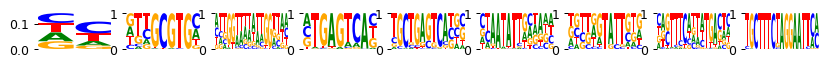

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 00:56:54.172556
	Loss: 220.732 , R2: 0.187
	Training time (model/function): (13.340s / 13.340s)
		per epoch (model/function): (0.953s/ 0.953s)
		per 1k samples: 0.353s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990659589968139, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 00:57:08.060844
	Loss: 182.267 , R2: 0.187
	Training time (model/function): (26.806s / 13.467s)
		per epoch (model/function): (1.915s/ 0.962s)
		per 1k samples: 0.357s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990659589968139, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.15it/s]


Current time: 2024-06-19 00:57:21.670895
	Loss: 160.257 , R2: 0.187
	Training time (model/function): (39.908s / 13.102s)
		per epoch (model/function): (2.851s/ 0.936s)
		per 1k samples: 0.347s
best loss 160.257
last five r2 values, by sequential filter optimization: ['0.187']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990659589968139, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 00:57:35.783461
	Loss: 155.589 , R2: 0.187
	Training time (model/function): (53.192s / 13.285s)
		per epoch (model/function): (3.799s/ 0.949s)
		per 1k samples: 0.352s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990659589968139, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Current time: 2024-06-19 00:57:49.409326
	Loss: 147.922 , R2: 0.187
	Training time (model/function): (66.399s / 13.207s)
		per epoch (model/function): (4.743s/ 0.943s)
		per 1k samples: 0.350s
best loss 147.922
last five r2 values, by sequential filter optimization: ['0.187', '0.187']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990659589968139, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 00:58:03.596812
	Loss: 149.928 , R2: 0.187
	Training time (model/function): (79.758s / 13.358s)
		per epoch (model/function): (5.697s/ 0.954s)
		per 1k samples: 0.354s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990659589968139, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.15it/s]


Current time: 2024-06-19 00:58:17.201335
	Loss: 145.334 , R2: 0.187
	Training time (model/function): (92.852s / 13.095s)
		per epoch (model/function): (6.632s/ 0.935s)
		per 1k samples: 0.347s
best loss 145.334
last five r2 values, by sequential filter optimization: ['0.187', '0.187', '0.187']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990659589968139, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 00:58:31.368474
	Loss: 148.743 , R2: 0.187
	Training time (model/function): (106.195s / 13.342s)
		per epoch (model/function): (7.585s/ 0.953s)
		per 1k samples: 0.353s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990659589968139, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.11it/s]


Current time: 2024-06-19 00:58:45.368185
	Loss: 144.789 , R2: 0.187
	Training time (model/function): (119.776s / 13.581s)
		per epoch (model/function): (8.555s/ 0.970s)
		per 1k samples: 0.360s
best loss 144.789
last five r2 values, by sequential filter optimization: ['0.187', '0.187', '0.187', '0.187']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990659589968139, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 00:58:59.559814
	Loss: 148.489 , R2: 0.187
	Training time (model/function): (133.143s / 13.367s)
		per epoch (model/function): (9.510s/ 0.955s)
		per 1k samples: 0.354s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990659589968139, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 00:59:13.488955
	Loss: 144.676 , R2: 0.187
	Training time (model/function): (146.560s / 13.417s)
		per epoch (model/function): (10.469s/ 0.958s)
		per 1k samples: 0.355s
best loss 144.675
last five r2 values, by sequential filter optimization: ['0.187', '0.187', '0.187', '0.187', '0.187']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990659589968139, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 146.5595247745514s
Time per epoch (total): 0.034 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_2/model_1.pt
/home/ilibarra/workspace/theislab/m

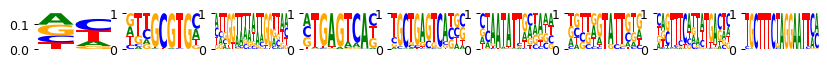

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.27it/s]


Current time: 2024-06-19 00:59:23.265414
	Loss: 219.814 , R2: 0.189
	Training time (model/function): (2.865s / 2.865s)
		per epoch (model/function): (0.205s/ 0.205s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980697427238282, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.24it/s]


Current time: 2024-06-19 00:59:26.562922
	Loss: 182.269 , R2: 0.191
	Training time (model/function): (5.747s / 2.882s)
		per epoch (model/function): (0.410s/ 0.206s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980697427238282, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.40it/s]


Current time: 2024-06-19 00:59:29.778811
	Loss: 160.255 , R2: 0.191
	Training time (model/function): (8.544s / 2.797s)
		per epoch (model/function): (0.610s/ 0.200s)
		per 1k samples: 0.074s
best loss 160.255
last five r2 values, by sequential filter optimization: ['0.191']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980697427238282, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.18it/s]


Current time: 2024-06-19 00:59:33.601422
	Loss: 155.581 , R2: 0.191
	Training time (model/function): (11.456s / 2.912s)
		per epoch (model/function): (0.818s/ 0.208s)
		per 1k samples: 0.077s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980697427238282, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.42it/s]


Current time: 2024-06-19 00:59:36.895465
	Loss: 147.924 , R2: 0.191
	Training time (model/function): (14.243s / 2.787s)
		per epoch (model/function): (1.017s/ 0.199s)
		per 1k samples: 0.074s
best loss 147.924
last five r2 values, by sequential filter optimization: ['0.191', '0.191']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980697427238282, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.23it/s]


Current time: 2024-06-19 00:59:40.607903
	Loss: 149.913 , R2: 0.192
	Training time (model/function): (17.132s / 2.889s)
		per epoch (model/function): (1.224s/ 0.206s)
		per 1k samples: 0.077s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980697427238282, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.26it/s]


Current time: 2024-06-19 00:59:43.896682
	Loss: 145.332 , R2: 0.192
	Training time (model/function): (20.003s / 2.872s)
		per epoch (model/function): (1.429s/ 0.205s)
		per 1k samples: 0.076s
best loss 145.332
last five r2 values, by sequential filter optimization: ['0.191', '0.191', '0.192']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980697427238282, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.23it/s]


Current time: 2024-06-19 00:59:47.690779
	Loss: 148.725 , R2: 0.192
	Training time (model/function): (22.888s / 2.884s)
		per epoch (model/function): (1.635s/ 0.206s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980697427238282, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.43it/s]


Current time: 2024-06-19 00:59:50.891981
	Loss: 144.792 , R2: 0.192
	Training time (model/function): (25.669s / 2.782s)
		per epoch (model/function): (1.834s/ 0.199s)
		per 1k samples: 0.074s
best loss 144.792
last five r2 values, by sequential filter optimization: ['0.191', '0.191', '0.192', '0.192']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980697427238282, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.24it/s]


Current time: 2024-06-19 00:59:54.689450
	Loss: 148.474 , R2: 0.193
	Training time (model/function): (28.552s / 2.882s)
		per epoch (model/function): (2.039s/ 0.206s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980697427238282, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.57it/s]


Current time: 2024-06-19 00:59:57.819188
	Loss: 144.679 , R2: 0.193
	Training time (model/function): (31.264s / 2.712s)
		per epoch (model/function): (2.233s/ 0.194s)
		per 1k samples: 0.072s
best loss 144.679
last five r2 values, by sequential filter optimization: ['0.191', '0.191', '0.192', '0.192', '0.193']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9980697427238282, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 31.263606071472168s
Time per epoch (total): 0.007 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_2/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


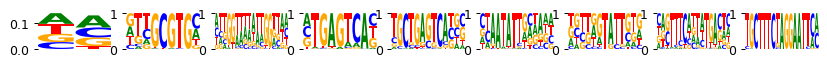

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.11it/s]


Current time: 2024-06-19 01:00:17.439133
	Loss: 220.721 , R2: 0.188
	Training time (model/function): (13.557s / 13.557s)
		per epoch (model/function): (0.968s/ 0.968s)
		per 1k samples: 0.359s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991033026128202, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Current time: 2024-06-19 01:00:31.187448
	Loss: 182.266 , R2: 0.188
	Training time (model/function): (26.790s / 13.233s)
		per epoch (model/function): (1.914s/ 0.945s)
		per 1k samples: 0.351s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991033026128202, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.15it/s]


Current time: 2024-06-19 01:00:44.689469
	Loss: 160.258 , R2: 0.188
	Training time (model/function): (39.873s / 13.083s)
		per epoch (model/function): (2.848s/ 0.935s)
		per 1k samples: 0.347s
best loss 160.258
last five r2 values, by sequential filter optimization: ['0.188']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991033026128202, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 01:00:58.996972
	Loss: 155.589 , R2: 0.188
	Training time (model/function): (53.262s / 13.389s)
		per epoch (model/function): (3.804s/ 0.956s)
		per 1k samples: 0.355s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991033026128202, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Current time: 2024-06-19 01:01:12.717638
	Loss: 147.924 , R2: 0.188
	Training time (model/function): (66.472s / 13.210s)
		per epoch (model/function): (4.748s/ 0.944s)
		per 1k samples: 0.350s
best loss 147.924
last five r2 values, by sequential filter optimization: ['0.188', '0.188']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991033026128202, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 01:01:26.959482
	Loss: 149.928 , R2: 0.188
	Training time (model/function): (79.791s / 13.319s)
		per epoch (model/function): (5.699s/ 0.951s)
		per 1k samples: 0.353s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991033026128202, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Current time: 2024-06-19 01:01:40.607405
	Loss: 145.334 , R2: 0.188
	Training time (model/function): (93.020s / 13.228s)
		per epoch (model/function): (6.644s/ 0.945s)
		per 1k samples: 0.351s
best loss 145.334
last five r2 values, by sequential filter optimization: ['0.188', '0.188', '0.188']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991033026128202, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 01:01:54.796069
	Loss: 148.743 , R2: 0.188
	Training time (model/function): (106.380s / 13.360s)
		per epoch (model/function): (7.599s/ 0.954s)
		per 1k samples: 0.354s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991033026128202, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.15it/s]


Current time: 2024-06-19 01:02:08.409531
	Loss: 144.793 , R2: 0.188
	Training time (model/function): (119.482s / 13.102s)
		per epoch (model/function): (8.534s/ 0.936s)
		per 1k samples: 0.347s
best loss 144.793
last five r2 values, by sequential filter optimization: ['0.188', '0.188', '0.188', '0.188']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991033026128202, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 01:02:22.650301
	Loss: 148.491 , R2: 0.188
	Training time (model/function): (132.804s / 13.322s)
		per epoch (model/function): (9.486s/ 0.952s)
		per 1k samples: 0.353s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991033026128202, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.15it/s]


Current time: 2024-06-19 01:02:36.156592
	Loss: 144.677 , R2: 0.188
	Training time (model/function): (145.888s / 13.083s)
		per epoch (model/function): (10.421s/ 0.935s)
		per 1k samples: 0.347s
best loss 144.677
last five r2 values, by sequential filter optimization: ['0.188', '0.188', '0.188', '0.188', '0.188']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991033026128202, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 145.88753414154053s
Time per epoch (total): 0.034 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_3/model_1.pt
/home/ilibarra/workspace/theislab/

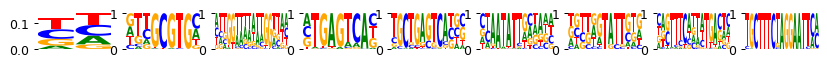

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.23it/s]


Current time: 2024-06-19 01:02:45.946625
	Loss: 219.817 , R2: 0.187
	Training time (model/function): (2.987s / 2.987s)
		per epoch (model/function): (0.213s/ 0.213s)
		per 1k samples: 0.079s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9978743026138415, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.25it/s]


Current time: 2024-06-19 01:02:49.324801
	Loss: 182.269 , R2: 0.188
	Training time (model/function): (5.864s / 2.877s)
		per epoch (model/function): (0.419s/ 0.206s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9978743026138415, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.42it/s]


Current time: 2024-06-19 01:02:52.520497
	Loss: 160.256 , R2: 0.188
	Training time (model/function): (8.649s / 2.785s)
		per epoch (model/function): (0.618s/ 0.199s)
		per 1k samples: 0.074s
best loss 160.256
last five r2 values, by sequential filter optimization: ['0.188']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9978743026138415, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.21it/s]


Current time: 2024-06-19 01:02:56.317552
	Loss: 155.579 , R2: 0.188
	Training time (model/function): (11.548s / 2.899s)
		per epoch (model/function): (0.825s/ 0.207s)
		per 1k samples: 0.077s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9978743026138415, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.42it/s]


Current time: 2024-06-19 01:02:59.515809
	Loss: 147.926 , R2: 0.189
	Training time (model/function): (14.336s / 2.788s)
		per epoch (model/function): (1.024s/ 0.199s)
		per 1k samples: 0.074s
best loss 147.926
last five r2 values, by sequential filter optimization: ['0.188', '0.189']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9978743026138415, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.13it/s]


Current time: 2024-06-19 01:03:03.270401
	Loss: 149.922 , R2: 0.189
	Training time (model/function): (17.281s / 2.945s)
		per epoch (model/function): (1.234s/ 0.210s)
		per 1k samples: 0.078s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9978743026138415, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.45it/s]


Current time: 2024-06-19 01:03:06.453780
	Loss: 145.334 , R2: 0.189
	Training time (model/function): (20.054s / 2.773s)
		per epoch (model/function): (1.432s/ 0.198s)
		per 1k samples: 0.073s
best loss 145.334
last five r2 values, by sequential filter optimization: ['0.188', '0.189', '0.189']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9978743026138415, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.24it/s]


Current time: 2024-06-19 01:03:10.234991
	Loss: 148.725 , R2: 0.190
	Training time (model/function): (22.937s / 2.883s)
		per epoch (model/function): (1.638s/ 0.206s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9978743026138415, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.48it/s]


Current time: 2024-06-19 01:03:13.401068
	Loss: 144.790 , R2: 0.190
	Training time (model/function): (25.693s / 2.756s)
		per epoch (model/function): (1.835s/ 0.197s)
		per 1k samples: 0.073s
best loss 144.790
last five r2 values, by sequential filter optimization: ['0.188', '0.189', '0.189', '0.190']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9978743026138415, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.24it/s]


Current time: 2024-06-19 01:03:17.178686
	Loss: 148.472 , R2: 0.191
	Training time (model/function): (28.575s / 2.882s)
		per epoch (model/function): (2.041s/ 0.206s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9978743026138415, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.56it/s]


Current time: 2024-06-19 01:03:20.390632
	Loss: 144.678 , R2: 0.191
	Training time (model/function): (31.289s / 2.714s)
		per epoch (model/function): (2.235s/ 0.194s)
		per 1k samples: 0.072s
best loss 144.677
last five r2 values, by sequential filter optimization: ['0.188', '0.189', '0.189', '0.190', '0.191']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9978743026138415, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 31.289255380630493s
Time per epoch (total): 0.007 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_3/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


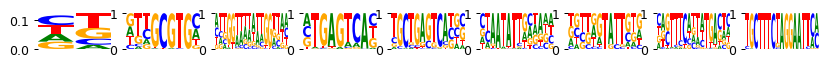

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 01:03:39.724761
	Loss: 220.693 , R2: 0.185
	Training time (model/function): (13.278s / 13.278s)
		per epoch (model/function): (0.948s/ 0.948s)
		per 1k samples: 0.352s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992480695163155, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 01:03:53.510570
	Loss: 182.265 , R2: 0.185
	Training time (model/function): (26.639s / 13.361s)
		per epoch (model/function): (1.903s/ 0.954s)
		per 1k samples: 0.354s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992480695163155, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Current time: 2024-06-19 01:04:07.117033
	Loss: 160.258 , R2: 0.185
	Training time (model/function): (39.830s / 13.191s)
		per epoch (model/function): (2.845s/ 0.942s)
		per 1k samples: 0.349s
best loss 160.258
last five r2 values, by sequential filter optimization: ['0.185']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992480695163155, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 01:04:21.284093
	Loss: 155.586 , R2: 0.185
	Training time (model/function): (53.181s / 13.351s)
		per epoch (model/function): (3.799s/ 0.954s)
		per 1k samples: 0.354s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992480695163155, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 01:04:35.490292
	Loss: 147.926 , R2: 0.185
	Training time (model/function): (66.975s / 13.794s)
		per epoch (model/function): (4.784s/ 0.985s)
		per 1k samples: 0.365s
best loss 147.926
last five r2 values, by sequential filter optimization: ['0.185', '0.185']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992480695163155, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 01:04:49.852766
	Loss: 149.930 , R2: 0.185
	Training time (model/function): (80.433s / 13.458s)
		per epoch (model/function): (5.745s/ 0.961s)
		per 1k samples: 0.357s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992480695163155, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 01:05:03.624677
	Loss: 145.335 , R2: 0.185
	Training time (model/function): (93.793s / 13.360s)
		per epoch (model/function): (6.700s/ 0.954s)
		per 1k samples: 0.354s
best loss 145.335
last five r2 values, by sequential filter optimization: ['0.185', '0.185', '0.185']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992480695163155, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 01:05:17.829470
	Loss: 148.742 , R2: 0.185
	Training time (model/function): (107.184s / 13.390s)
		per epoch (model/function): (7.656s/ 0.956s)
		per 1k samples: 0.355s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992480695163155, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.15it/s]


Current time: 2024-06-19 01:05:31.292653
	Loss: 144.790 , R2: 0.185
	Training time (model/function): (120.233s / 13.049s)
		per epoch (model/function): (8.588s/ 0.932s)
		per 1k samples: 0.346s
best loss 144.790
last five r2 values, by sequential filter optimization: ['0.185', '0.185', '0.185', '0.185']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992480695163155, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 01:05:45.457863
	Loss: 148.492 , R2: 0.185
	Training time (model/function): (133.499s / 13.266s)
		per epoch (model/function): (9.536s/ 0.948s)
		per 1k samples: 0.351s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992480695163155, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Current time: 2024-06-19 01:05:59.038547
	Loss: 144.677 , R2: 0.185
	Training time (model/function): (146.666s / 13.167s)
		per epoch (model/function): (10.476s/ 0.941s)
		per 1k samples: 0.349s
best loss 144.677
last five r2 values, by sequential filter optimization: ['0.185', '0.185', '0.185', '0.185', '0.185']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992480695163155, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 146.66636109352112s
Time per epoch (total): 0.034 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_4/model_1.pt
/home/ilibarra/workspace/theislab/

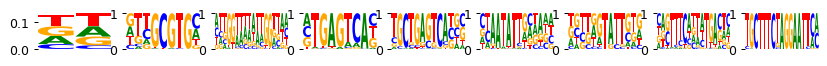

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.31it/s]


Current time: 2024-06-19 01:06:08.787130
	Loss: 219.813 , R2: 0.185
	Training time (model/function): (2.844s / 2.844s)
		per epoch (model/function): (0.203s/ 0.203s)
		per 1k samples: 0.075s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998134537359266, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.25it/s]


Current time: 2024-06-19 01:06:12.083353
	Loss: 182.265 , R2: 0.186
	Training time (model/function): (5.721s / 2.876s)
		per epoch (model/function): (0.409s/ 0.205s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998134537359266, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.40it/s]


Current time: 2024-06-19 01:06:15.383151
	Loss: 160.254 , R2: 0.186
	Training time (model/function): (8.515s / 2.795s)
		per epoch (model/function): (0.608s/ 0.200s)
		per 1k samples: 0.074s
best loss 160.254
last five r2 values, by sequential filter optimization: ['0.186']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998134537359266, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.23it/s]


Current time: 2024-06-19 01:06:19.096261
	Loss: 155.574 , R2: 0.187
	Training time (model/function): (11.401s / 2.886s)
		per epoch (model/function): (0.814s/ 0.206s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998134537359266, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.24it/s]


Current time: 2024-06-19 01:06:22.393371
	Loss: 147.919 , R2: 0.187
	Training time (model/function): (14.279s / 2.878s)
		per epoch (model/function): (1.020s/ 0.206s)
		per 1k samples: 0.076s
best loss 147.919
last five r2 values, by sequential filter optimization: ['0.186', '0.187']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998134537359266, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.23it/s]


Current time: 2024-06-19 01:06:26.191413
	Loss: 149.914 , R2: 0.187
	Training time (model/function): (17.165s / 2.886s)
		per epoch (model/function): (1.226s/ 0.206s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998134537359266, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.42it/s]


Current time: 2024-06-19 01:06:29.394123
	Loss: 145.332 , R2: 0.187
	Training time (model/function): (19.949s / 2.784s)
		per epoch (model/function): (1.425s/ 0.199s)
		per 1k samples: 0.074s
best loss 145.332
last five r2 values, by sequential filter optimization: ['0.186', '0.187', '0.187']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998134537359266, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.09it/s]


Current time: 2024-06-19 01:06:33.180731
	Loss: 148.720 , R2: 0.188
	Training time (model/function): (22.914s / 2.965s)
		per epoch (model/function): (1.637s/ 0.212s)
		per 1k samples: 0.079s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998134537359266, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.50it/s]


Current time: 2024-06-19 01:06:36.344016
	Loss: 144.789 , R2: 0.188
	Training time (model/function): (25.660s / 2.746s)
		per epoch (model/function): (1.833s/ 0.196s)
		per 1k samples: 0.073s
best loss 144.789
last five r2 values, by sequential filter optimization: ['0.186', '0.187', '0.187', '0.188']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998134537359266, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.24it/s]


Current time: 2024-06-19 01:06:40.134783
	Loss: 148.466 , R2: 0.188
	Training time (model/function): (28.542s / 2.882s)
		per epoch (model/function): (2.039s/ 0.206s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998134537359266, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.63it/s]


Current time: 2024-06-19 01:06:43.323371
	Loss: 144.674 , R2: 0.188
	Training time (model/function): (31.227s / 2.685s)
		per epoch (model/function): (2.230s/ 0.192s)
		per 1k samples: 0.071s
best loss 144.673
last five r2 values, by sequential filter optimization: ['0.186', '0.187', '0.187', '0.188', '0.188']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998134537359266, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 31.226806163787842s
Time per epoch (total): 0.007 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_4/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


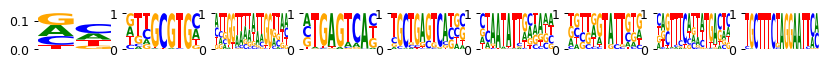

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 01:07:02.644624
	Loss: 220.686 , R2: 0.184
	Training time (model/function): (13.235s / 13.235s)
		per epoch (model/function): (0.945s/ 0.945s)
		per 1k samples: 0.351s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990373537583856, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Current time: 2024-06-19 01:07:16.285594
	Loss: 182.267 , R2: 0.184
	Training time (model/function): (26.462s / 13.227s)
		per epoch (model/function): (1.890s/ 0.945s)
		per 1k samples: 0.351s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990373537583856, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.15it/s]


Current time: 2024-06-19 01:07:29.831154
	Loss: 160.253 , R2: 0.184
	Training time (model/function): (39.507s / 13.045s)
		per epoch (model/function): (2.822s/ 0.932s)
		per 1k samples: 0.346s
best loss 160.253
last five r2 values, by sequential filter optimization: ['0.184']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990373537583856, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Current time: 2024-06-19 01:07:43.966113
	Loss: 155.583 , R2: 0.184
	Training time (model/function): (52.734s / 13.227s)
		per epoch (model/function): (3.767s/ 0.945s)
		per 1k samples: 0.351s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990373537583856, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.15it/s]


Current time: 2024-06-19 01:07:57.438460
	Loss: 147.924 , R2: 0.184
	Training time (model/function): (65.792s / 13.058s)
		per epoch (model/function): (4.699s/ 0.933s)
		per 1k samples: 0.346s
best loss 147.924
last five r2 values, by sequential filter optimization: ['0.184', '0.184']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990373537583856, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Current time: 2024-06-19 01:08:11.564588
	Loss: 149.928 , R2: 0.184
	Training time (model/function): (79.024s / 13.232s)
		per epoch (model/function): (5.645s/ 0.945s)
		per 1k samples: 0.351s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990373537583856, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Current time: 2024-06-19 01:08:25.094538
	Loss: 145.334 , R2: 0.184
	Training time (model/function): (92.148s / 13.124s)
		per epoch (model/function): (6.582s/ 0.937s)
		per 1k samples: 0.348s
best loss 145.334
last five r2 values, by sequential filter optimization: ['0.184', '0.184', '0.184']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990373537583856, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.13it/s]


Current time: 2024-06-19 01:08:39.240059
	Loss: 148.739 , R2: 0.184
	Training time (model/function): (105.493s / 13.345s)
		per epoch (model/function): (7.535s/ 0.953s)
		per 1k samples: 0.354s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990373537583856, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.15it/s]


Current time: 2024-06-19 01:08:52.759834
	Loss: 144.788 , R2: 0.184
	Training time (model/function): (118.517s / 13.024s)
		per epoch (model/function): (8.465s/ 0.930s)
		per 1k samples: 0.345s
best loss 144.788
last five r2 values, by sequential filter optimization: ['0.184', '0.184', '0.184', '0.184']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990373537583856, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.12it/s]


Current time: 2024-06-19 01:09:06.933930
	Loss: 148.488 , R2: 0.184
	Training time (model/function): (131.887s / 13.370s)
		per epoch (model/function): (9.420s/ 0.955s)
		per 1k samples: 0.354s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990373537583856, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.14it/s]


Current time: 2024-06-19 01:09:20.467188
	Loss: 144.676 , R2: 0.184
	Training time (model/function): (145.012s / 13.125s)
		per epoch (model/function): (10.358s/ 0.938s)
		per 1k samples: 0.348s
best loss 144.676
last five r2 values, by sequential filter optimization: ['0.184', '0.184', '0.184', '0.184', '0.184']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990373537583856, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 145.01188349723816s
Time per epoch (total): 0.033 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs1000/pwms/fold_4/running_time_1.pkl
25

/home/ilibarra/workspace/theislab/mubind/data/pbmc/random/processed_laura_2023_obs1000_var3000.h5ad
pbmc (1000, 3000)
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_0/model.pt
False /home/ilibarra/workspace/th

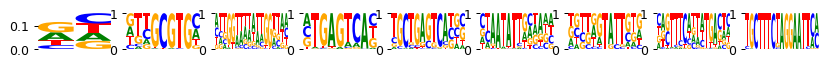

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.67it/s]


Current time: 2024-06-19 01:09:32.776041
	Loss: 219.817 , R2: 0.332
	Training time (model/function): (4.110s / 4.110s)
		per epoch (model/function): (0.294s/ 0.294s)
		per 1k samples: 0.109s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9979085219637577, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.76it/s]


Current time: 2024-06-19 01:09:37.285469
	Loss: 182.263 , R2: 0.335
	Training time (model/function): (8.133s / 4.023s)
		per epoch (model/function): (0.581s/ 0.287s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9979085219637577, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.76it/s]


Current time: 2024-06-19 01:09:41.788690
	Loss: 160.253 , R2: 0.335
	Training time (model/function): (12.150s / 4.017s)
		per epoch (model/function): (0.868s/ 0.287s)
		per 1k samples: 0.106s
best loss 160.253
last five r2 values, by sequential filter optimization: ['0.335']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9979085219637577, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.75it/s]


Current time: 2024-06-19 01:09:46.861297
	Loss: 155.578 , R2: 0.336
	Training time (model/function): (16.174s / 4.024s)
		per epoch (model/function): (1.155s/ 0.287s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9979085219637577, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.82it/s]


Current time: 2024-06-19 01:09:51.299561
	Loss: 147.920 , R2: 0.336
	Training time (model/function): (20.127s / 3.953s)
		per epoch (model/function): (1.438s/ 0.282s)
		per 1k samples: 0.105s
best loss 147.920
last five r2 values, by sequential filter optimization: ['0.335', '0.336']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9979085219637577, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.68it/s]


Current time: 2024-06-19 01:09:56.367671
	Loss: 149.911 , R2: 0.337
	Training time (model/function): (24.235s / 4.108s)
		per epoch (model/function): (1.731s/ 0.293s)
		per 1k samples: 0.109s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9979085219637577, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.83it/s]


Current time: 2024-06-19 01:10:00.795413
	Loss: 145.334 , R2: 0.337
	Training time (model/function): (28.175s / 3.941s)
		per epoch (model/function): (2.013s/ 0.281s)
		per 1k samples: 0.104s
best loss 145.334
last five r2 values, by sequential filter optimization: ['0.335', '0.336', '0.337']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9979085219637577, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.74it/s]


Current time: 2024-06-19 01:10:05.879310
	Loss: 148.718 , R2: 0.338
	Training time (model/function): (32.213s / 4.038s)
		per epoch (model/function): (2.301s/ 0.288s)
		per 1k samples: 0.107s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9979085219637577, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.88it/s]


Current time: 2024-06-19 01:10:10.349053
	Loss: 144.789 , R2: 0.337
	Training time (model/function): (36.110s / 3.897s)
		per epoch (model/function): (2.579s/ 0.278s)
		per 1k samples: 0.103s
best loss 144.789
last five r2 values, by sequential filter optimization: ['0.335', '0.336', '0.337', '0.337']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9979085219637577, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.75it/s]


Current time: 2024-06-19 01:10:15.339113
	Loss: 148.470 , R2: 0.339
	Training time (model/function): (40.140s / 4.031s)
		per epoch (model/function): (2.867s/ 0.288s)
		per 1k samples: 0.107s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9979085219637577, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.84it/s]


Current time: 2024-06-19 01:10:19.757803
	Loss: 144.677 , R2: 0.339
	Training time (model/function): (44.071s / 3.931s)
		per epoch (model/function): (3.148s/ 0.281s)
		per 1k samples: 0.104s
best loss 144.676
last five r2 values, by sequential filter optimization: ['0.335', '0.336', '0.337', '0.337', '0.339']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9979085219637577, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 44.071492433547974s
Time per epoch (total): 0.010 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_0/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


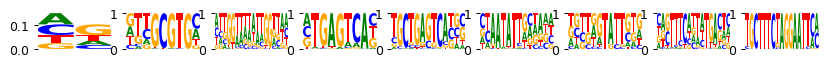

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:10:40.584383
	Loss: 220.795 , R2: 0.058
	Training time (model/function): (14.461s / 14.461s)
		per epoch (model/function): (1.033s/ 1.033s)
		per 1k samples: 0.383s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989628260825734, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:10:55.562348
	Loss: 182.258 , R2: 0.058
	Training time (model/function): (28.951s / 14.490s)
		per epoch (model/function): (2.068s/ 1.035s)
		per 1k samples: 0.383s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989628260825734, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.05it/s]


Current time: 2024-06-19 01:11:10.357670
	Loss: 160.245 , R2: 0.058
	Training time (model/function): (43.258s / 14.307s)
		per epoch (model/function): (3.090s/ 1.022s)
		per 1k samples: 0.379s
best loss 160.245
last five r2 values, by sequential filter optimization: ['0.058']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989628260825734, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:11:25.835670
	Loss: 155.575 , R2: 0.057
	Training time (model/function): (57.774s / 14.516s)
		per epoch (model/function): (4.127s/ 1.037s)
		per 1k samples: 0.384s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989628260825734, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:11:40.652402
	Loss: 147.917 , R2: 0.057
	Training time (model/function): (72.016s / 14.242s)
		per epoch (model/function): (5.144s/ 1.017s)
		per 1k samples: 0.377s
best loss 147.917
last five r2 values, by sequential filter optimization: ['0.058', '0.057']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989628260825734, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:11:56.017050
	Loss: 149.917 , R2: 0.056
	Training time (model/function): (86.415s / 14.399s)
		per epoch (model/function): (6.172s/ 1.028s)
		per 1k samples: 0.381s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989628260825734, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.05it/s]


Current time: 2024-06-19 01:12:10.801821
	Loss: 145.328 , R2: 0.055
	Training time (model/function): (100.713s / 14.298s)
		per epoch (model/function): (7.194s/ 1.021s)
		per 1k samples: 0.378s
best loss 145.328
last five r2 values, by sequential filter optimization: ['0.058', '0.057', '0.055']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989628260825734, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:12:26.222426
	Loss: 148.723 , R2: 0.055
	Training time (model/function): (115.170s / 14.457s)
		per epoch (model/function): (8.226s/ 1.033s)
		per 1k samples: 0.383s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989628260825734, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:12:40.964239
	Loss: 144.777 , R2: 0.055
	Training time (model/function): (129.337s / 14.167s)
		per epoch (model/function): (9.238s/ 1.012s)
		per 1k samples: 0.375s
best loss 144.777
last five r2 values, by sequential filter optimization: ['0.058', '0.057', '0.055', '0.055']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989628260825734, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.05it/s]


Current time: 2024-06-19 01:12:56.390053
	Loss: 148.471 , R2: 0.055
	Training time (model/function): (143.709s / 14.372s)
		per epoch (model/function): (10.265s/ 1.027s)
		per 1k samples: 0.380s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989628260825734, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:13:11.059687
	Loss: 144.665 , R2: 0.056
	Training time (model/function): (157.888s / 14.180s)
		per epoch (model/function): (11.278s/ 1.013s)
		per 1k samples: 0.375s
best loss 144.665
last five r2 values, by sequential filter optimization: ['0.058', '0.057', '0.055', '0.055', '0.056']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989628260825734, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 157.88838005065918s
Time per epoch (total): 0.036 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_1/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pbmc/r

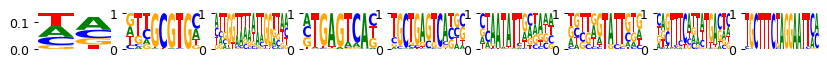

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.78it/s]


Current time: 2024-06-19 01:13:23.058088
	Loss: 219.820 , R2: 0.334
	Training time (model/function): (3.992s / 3.992s)
		per epoch (model/function): (0.285s/ 0.285s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9981869237595028, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.79it/s]


Current time: 2024-06-19 01:13:27.523201
	Loss: 182.267 , R2: 0.336
	Training time (model/function): (7.972s / 3.980s)
		per epoch (model/function): (0.569s/ 0.284s)
		per 1k samples: 0.105s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9981869237595028, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.85it/s]


Current time: 2024-06-19 01:13:32.030347
	Loss: 160.254 , R2: 0.336
	Training time (model/function): (11.989s / 4.017s)
		per epoch (model/function): (0.856s/ 0.287s)
		per 1k samples: 0.106s
best loss 160.254
last five r2 values, by sequential filter optimization: ['0.336']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9981869237595028, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.76it/s]


Current time: 2024-06-19 01:13:37.094417
	Loss: 155.580 , R2: 0.337
	Training time (model/function): (16.006s / 4.018s)
		per epoch (model/function): (1.143s/ 0.287s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9981869237595028, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.83it/s]


Current time: 2024-06-19 01:13:41.529445
	Loss: 147.925 , R2: 0.337
	Training time (model/function): (19.953s / 3.947s)
		per epoch (model/function): (1.425s/ 0.282s)
		per 1k samples: 0.104s
best loss 147.925
last five r2 values, by sequential filter optimization: ['0.336', '0.337']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9981869237595028, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.75it/s]


Current time: 2024-06-19 01:13:46.611186
	Loss: 149.913 , R2: 0.339
	Training time (model/function): (23.978s / 4.025s)
		per epoch (model/function): (1.713s/ 0.288s)
		per 1k samples: 0.107s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9981869237595028, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.84it/s]


Current time: 2024-06-19 01:13:51.031159
	Loss: 145.334 , R2: 0.339
	Training time (model/function): (27.909s / 3.931s)
		per epoch (model/function): (1.994s/ 0.281s)
		per 1k samples: 0.104s
best loss 145.334
last five r2 values, by sequential filter optimization: ['0.336', '0.337', '0.339']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9981869237595028, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.78it/s]


Current time: 2024-06-19 01:13:56.083167
	Loss: 148.714 , R2: 0.339
	Training time (model/function): (31.910s / 4.001s)
		per epoch (model/function): (2.279s/ 0.286s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9981869237595028, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.89it/s]


Current time: 2024-06-19 01:14:00.538061
	Loss: 144.788 , R2: 0.338
	Training time (model/function): (35.791s / 3.881s)
		per epoch (model/function): (2.556s/ 0.277s)
		per 1k samples: 0.103s
best loss 144.788
last five r2 values, by sequential filter optimization: ['0.336', '0.337', '0.339', '0.338']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9981869237595028, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.78it/s]


Current time: 2024-06-19 01:14:05.582709
	Loss: 148.468 , R2: 0.340
	Training time (model/function): (39.783s / 3.992s)
		per epoch (model/function): (2.842s/ 0.285s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9981869237595028, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.90it/s]


Current time: 2024-06-19 01:14:09.952484
	Loss: 144.675 , R2: 0.340
	Training time (model/function): (43.660s / 3.877s)
		per epoch (model/function): (3.119s/ 0.277s)
		per 1k samples: 0.103s
best loss 144.675
last five r2 values, by sequential filter optimization: ['0.336', '0.337', '0.339', '0.338', '0.340']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9981869237595028, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 43.66006946563721s
Time per epoch (total): 0.010 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_1/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


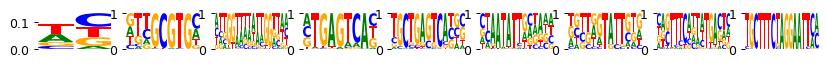

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:14:30.845641
	Loss: 220.775 , R2: 0.058
	Training time (model/function): (14.494s / 14.494s)
		per epoch (model/function): (1.035s/ 1.035s)
		per 1k samples: 0.384s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989461914207657, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.05it/s]


Current time: 2024-06-19 01:14:45.792750
	Loss: 182.252 , R2: 0.058
	Training time (model/function): (28.864s / 14.370s)
		per epoch (model/function): (2.062s/ 1.026s)
		per 1k samples: 0.380s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989461914207657, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:15:00.471343
	Loss: 160.250 , R2: 0.058
	Training time (model/function): (43.054s / 14.190s)
		per epoch (model/function): (3.075s/ 1.014s)
		per 1k samples: 0.376s
best loss 160.250
last five r2 values, by sequential filter optimization: ['0.058']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989461914207657, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:15:15.931031
	Loss: 155.579 , R2: 0.057
	Training time (model/function): (57.457s / 14.402s)
		per epoch (model/function): (4.104s/ 1.029s)
		per 1k samples: 0.381s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989461914207657, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:15:30.695352
	Loss: 147.920 , R2: 0.057
	Training time (model/function): (71.644s / 14.187s)
		per epoch (model/function): (5.117s/ 1.013s)
		per 1k samples: 0.375s
best loss 147.920
last five r2 values, by sequential filter optimization: ['0.058', '0.057']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989461914207657, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.05it/s]


Current time: 2024-06-19 01:15:46.105221
	Loss: 149.914 , R2: 0.055
	Training time (model/function): (85.996s / 14.352s)
		per epoch (model/function): (6.143s/ 1.025s)
		per 1k samples: 0.380s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989461914207657, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:16:00.776244
	Loss: 145.325 , R2: 0.055
	Training time (model/function): (100.179s / 14.182s)
		per epoch (model/function): (7.156s/ 1.013s)
		per 1k samples: 0.375s
best loss 145.325
last five r2 values, by sequential filter optimization: ['0.058', '0.057', '0.055']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989461914207657, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:16:16.219769
	Loss: 148.723 , R2: 0.055
	Training time (model/function): (114.652s / 14.473s)
		per epoch (model/function): (8.189s/ 1.034s)
		per 1k samples: 0.383s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989461914207657, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:16:30.925578
	Loss: 144.779 , R2: 0.054
	Training time (model/function): (128.778s / 14.126s)
		per epoch (model/function): (9.198s/ 1.009s)
		per 1k samples: 0.374s
best loss 144.779
last five r2 values, by sequential filter optimization: ['0.058', '0.057', '0.055', '0.054']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989461914207657, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:16:46.385656
	Loss: 148.473 , R2: 0.054
	Training time (model/function): (143.181s / 14.403s)
		per epoch (model/function): (10.227s/ 1.029s)
		per 1k samples: 0.381s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989461914207657, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:17:01.019063
	Loss: 144.665 , R2: 0.056
	Training time (model/function): (157.323s / 14.141s)
		per epoch (model/function): (11.237s/ 1.010s)
		per 1k samples: 0.374s
best loss 144.665
last five r2 values, by sequential filter optimization: ['0.058', '0.057', '0.055', '0.054', '0.056']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989461914207657, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 157.3227241039276s
Time per epoch (total): 0.036 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_2/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pbmc/ra

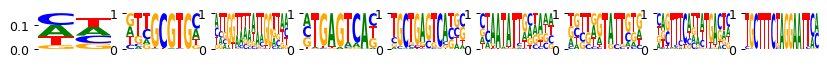

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.80it/s]


Current time: 2024-06-19 01:17:13.022396
	Loss: 219.814 , R2: 0.327
	Training time (model/function): (3.976s / 3.976s)
		per epoch (model/function): (0.284s/ 0.284s)
		per 1k samples: 0.105s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9982955451281326, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.79it/s]


Current time: 2024-06-19 01:17:17.504811
	Loss: 182.259 , R2: 0.330
	Training time (model/function): (7.968s / 3.991s)
		per epoch (model/function): (0.569s/ 0.285s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9982955451281326, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.87it/s]


Current time: 2024-06-19 01:17:21.982961
	Loss: 160.249 , R2: 0.330
	Training time (model/function): (11.871s / 3.903s)
		per epoch (model/function): (0.848s/ 0.279s)
		per 1k samples: 0.103s
best loss 160.249
last five r2 values, by sequential filter optimization: ['0.330']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9982955451281326, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.77it/s]


Current time: 2024-06-19 01:17:26.962472
	Loss: 155.572 , R2: 0.331
	Training time (model/function): (15.880s / 4.010s)
		per epoch (model/function): (1.134s/ 0.286s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9982955451281326, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.75it/s]


Current time: 2024-06-19 01:17:31.474039
	Loss: 147.924 , R2: 0.331
	Training time (model/function): (19.903s / 4.022s)
		per epoch (model/function): (1.422s/ 0.287s)
		per 1k samples: 0.106s
best loss 147.924
last five r2 values, by sequential filter optimization: ['0.330', '0.331']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9982955451281326, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.77it/s]


Current time: 2024-06-19 01:17:36.533302
	Loss: 149.910 , R2: 0.332
	Training time (model/function): (23.909s / 4.006s)
		per epoch (model/function): (1.708s/ 0.286s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9982955451281326, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.85it/s]


Current time: 2024-06-19 01:17:40.948574
	Loss: 145.329 , R2: 0.332
	Training time (model/function): (27.835s / 3.926s)
		per epoch (model/function): (1.988s/ 0.280s)
		per 1k samples: 0.104s
best loss 145.329
last five r2 values, by sequential filter optimization: ['0.330', '0.331', '0.332']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9982955451281326, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.68it/s]


Current time: 2024-06-19 01:17:46.015003
	Loss: 148.710 , R2: 0.333
	Training time (model/function): (31.934s / 4.098s)
		per epoch (model/function): (2.281s/ 0.293s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9982955451281326, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.88it/s]


Current time: 2024-06-19 01:17:50.394542
	Loss: 144.784 , R2: 0.332
	Training time (model/function): (35.823s / 3.889s)
		per epoch (model/function): (2.559s/ 0.278s)
		per 1k samples: 0.103s
best loss 144.784
last five r2 values, by sequential filter optimization: ['0.330', '0.331', '0.332', '0.332']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9982955451281326, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.78it/s]


Current time: 2024-06-19 01:17:55.441684
	Loss: 148.461 , R2: 0.334
	Training time (model/function): (39.818s / 3.995s)
		per epoch (model/function): (2.844s/ 0.285s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9982955451281326, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.91it/s]


Current time: 2024-06-19 01:17:59.878650
	Loss: 144.668 , R2: 0.334
	Training time (model/function): (43.680s / 3.862s)
		per epoch (model/function): (3.120s/ 0.276s)
		per 1k samples: 0.102s
best loss 144.668
last five r2 values, by sequential filter optimization: ['0.330', '0.331', '0.332', '0.332', '0.334']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9982955451281326, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 43.680161237716675s
Time per epoch (total): 0.010 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_2/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


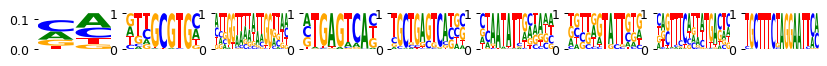

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.05it/s]


Current time: 2024-06-19 01:18:20.729635
	Loss: 220.785 , R2: 0.060
	Training time (model/function): (14.357s / 14.357s)
		per epoch (model/function): (1.026s/ 1.026s)
		per 1k samples: 0.380s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989333687605694, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:18:35.618486
	Loss: 182.247 , R2: 0.059
	Training time (model/function): (28.756s / 14.398s)
		per epoch (model/function): (2.054s/ 1.028s)
		per 1k samples: 0.381s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989333687605694, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:18:50.424670
	Loss: 160.243 , R2: 0.059
	Training time (model/function): (42.985s / 14.229s)
		per epoch (model/function): (3.070s/ 1.016s)
		per 1k samples: 0.377s
best loss 160.243
last five r2 values, by sequential filter optimization: ['0.059']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989333687605694, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:19:05.987194
	Loss: 155.577 , R2: 0.059
	Training time (model/function): (57.490s / 14.505s)
		per epoch (model/function): (4.106s/ 1.036s)
		per 1k samples: 0.384s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989333687605694, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:19:20.683977
	Loss: 147.911 , R2: 0.058
	Training time (model/function): (71.696s / 14.206s)
		per epoch (model/function): (5.121s/ 1.015s)
		per 1k samples: 0.376s
best loss 147.911
last five r2 values, by sequential filter optimization: ['0.059', '0.058']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989333687605694, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.05it/s]


Current time: 2024-06-19 01:19:36.112829
	Loss: 149.913 , R2: 0.057
	Training time (model/function): (86.070s / 14.374s)
		per epoch (model/function): (6.148s/ 1.027s)
		per 1k samples: 0.380s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989333687605694, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.05it/s]


Current time: 2024-06-19 01:19:50.881561
	Loss: 145.321 , R2: 0.057
	Training time (model/function): (100.349s / 14.279s)
		per epoch (model/function): (7.168s/ 1.020s)
		per 1k samples: 0.378s
best loss 145.321
last five r2 values, by sequential filter optimization: ['0.059', '0.058', '0.057']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989333687605694, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:20:06.330457
	Loss: 148.720 , R2: 0.056
	Training time (model/function): (114.743s / 14.393s)
		per epoch (model/function): (8.196s/ 1.028s)
		per 1k samples: 0.381s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989333687605694, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:20:21.015320
	Loss: 144.772 , R2: 0.056
	Training time (model/function): (128.935s / 14.193s)
		per epoch (model/function): (9.210s/ 1.014s)
		per 1k samples: 0.376s
best loss 144.772
last five r2 values, by sequential filter optimization: ['0.059', '0.058', '0.057', '0.056']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989333687605694, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.05it/s]


Current time: 2024-06-19 01:20:36.449524
	Loss: 148.466 , R2: 0.056
	Training time (model/function): (143.313s / 14.378s)
		per epoch (model/function): (10.237s/ 1.027s)
		per 1k samples: 0.381s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989333687605694, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:20:51.188605
	Loss: 144.661 , R2: 0.058
	Training time (model/function): (157.476s / 14.163s)
		per epoch (model/function): (11.248s/ 1.012s)
		per 1k samples: 0.375s
best loss 144.661
last five r2 values, by sequential filter optimization: ['0.059', '0.058', '0.057', '0.056', '0.058']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989333687605694, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 157.47601509094238s
Time per epoch (total): 0.036 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_3/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pbmc/r

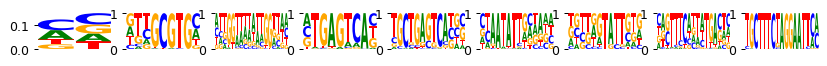

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.78it/s]


Current time: 2024-06-19 01:21:03.195760
	Loss: 219.812 , R2: 0.327
	Training time (model/function): (4.005s / 4.005s)
		per epoch (model/function): (0.286s/ 0.286s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983284950087628, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.78it/s]


Current time: 2024-06-19 01:21:07.713555
	Loss: 182.264 , R2: 0.329
	Training time (model/function): (8.012s / 4.007s)
		per epoch (model/function): (0.572s/ 0.286s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983284950087628, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.86it/s]


Current time: 2024-06-19 01:21:12.151359
	Loss: 160.251 , R2: 0.329
	Training time (model/function): (11.935s / 3.923s)
		per epoch (model/function): (0.853s/ 0.280s)
		per 1k samples: 0.104s
best loss 160.251
last five r2 values, by sequential filter optimization: ['0.329']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983284950087628, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.78it/s]


Current time: 2024-06-19 01:21:17.257695
	Loss: 155.575 , R2: 0.331
	Training time (model/function): (15.947s / 4.012s)
		per epoch (model/function): (1.139s/ 0.287s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983284950087628, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.83it/s]


Current time: 2024-06-19 01:21:21.812275
	Loss: 147.922 , R2: 0.331
	Training time (model/function): (19.907s / 3.960s)
		per epoch (model/function): (1.422s/ 0.283s)
		per 1k samples: 0.105s
best loss 147.922
last five r2 values, by sequential filter optimization: ['0.329', '0.331']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983284950087628, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.76it/s]


Current time: 2024-06-19 01:21:26.941384
	Loss: 149.912 , R2: 0.332
	Training time (model/function): (23.933s / 4.026s)
		per epoch (model/function): (1.709s/ 0.288s)
		per 1k samples: 0.107s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983284950087628, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.84it/s]


Current time: 2024-06-19 01:21:31.394551
	Loss: 145.327 , R2: 0.332
	Training time (model/function): (27.875s / 3.943s)
		per epoch (model/function): (1.991s/ 0.282s)
		per 1k samples: 0.104s
best loss 145.327
last five r2 values, by sequential filter optimization: ['0.329', '0.331', '0.332']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983284950087628, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.77it/s]


Current time: 2024-06-19 01:21:36.507637
	Loss: 148.712 , R2: 0.332
	Training time (model/function): (31.889s / 4.014s)
		per epoch (model/function): (2.278s/ 0.287s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983284950087628, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.89it/s]


Current time: 2024-06-19 01:21:40.906484
	Loss: 144.789 , R2: 0.331
	Training time (model/function): (35.780s / 3.890s)
		per epoch (model/function): (2.556s/ 0.278s)
		per 1k samples: 0.103s
best loss 144.789
last five r2 values, by sequential filter optimization: ['0.329', '0.331', '0.332', '0.331']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983284950087628, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.75it/s]


Current time: 2024-06-19 01:21:46.039496
	Loss: 148.467 , R2: 0.333
	Training time (model/function): (39.897s / 4.117s)
		per epoch (model/function): (2.850s/ 0.294s)
		per 1k samples: 0.109s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983284950087628, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.90it/s]


Current time: 2024-06-19 01:21:50.437427
	Loss: 144.672 , R2: 0.333
	Training time (model/function): (43.783s / 3.886s)
		per epoch (model/function): (3.127s/ 0.278s)
		per 1k samples: 0.103s
best loss 144.672
last five r2 values, by sequential filter optimization: ['0.329', '0.331', '0.332', '0.331', '0.333']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9983284950087628, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 43.78272032737732s
Time per epoch (total): 0.010 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_3/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


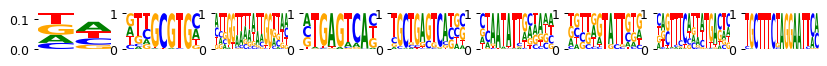

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.05it/s]


Current time: 2024-06-19 01:22:11.437147
	Loss: 220.809 , R2: 0.060
	Training time (model/function): (14.348s / 14.348s)
		per epoch (model/function): (1.025s/ 1.025s)
		per 1k samples: 0.380s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991309010058246, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.02it/s]


Current time: 2024-06-19 01:22:26.658764
	Loss: 182.255 , R2: 0.060
	Training time (model/function): (29.056s / 14.709s)
		per epoch (model/function): (2.075s/ 1.051s)
		per 1k samples: 0.389s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991309010058246, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:22:41.452514
	Loss: 160.246 , R2: 0.059
	Training time (model/function): (43.252s / 14.196s)
		per epoch (model/function): (3.089s/ 1.014s)
		per 1k samples: 0.376s
best loss 160.246
last five r2 values, by sequential filter optimization: ['0.059']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991309010058246, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:22:57.012000
	Loss: 155.571 , R2: 0.059
	Training time (model/function): (57.704s / 14.452s)
		per epoch (model/function): (4.122s/ 1.032s)
		per 1k samples: 0.382s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991309010058246, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:23:11.754915
	Loss: 147.913 , R2: 0.058
	Training time (model/function): (71.931s / 14.227s)
		per epoch (model/function): (5.138s/ 1.016s)
		per 1k samples: 0.377s
best loss 147.913
last five r2 values, by sequential filter optimization: ['0.059', '0.058']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991309010058246, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:23:27.273654
	Loss: 149.913 , R2: 0.057
	Training time (model/function): (86.420s / 14.489s)
		per epoch (model/function): (6.173s/ 1.035s)
		per 1k samples: 0.383s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991309010058246, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:23:42.083440
	Loss: 145.322 , R2: 0.057
	Training time (model/function): (100.626s / 14.206s)
		per epoch (model/function): (7.188s/ 1.015s)
		per 1k samples: 0.376s
best loss 145.322
last five r2 values, by sequential filter optimization: ['0.059', '0.058', '0.057']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991309010058246, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:23:57.594330
	Loss: 148.719 , R2: 0.057
	Training time (model/function): (115.021s / 14.395s)
		per epoch (model/function): (8.216s/ 1.028s)
		per 1k samples: 0.381s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991309010058246, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:24:12.283634
	Loss: 144.779 , R2: 0.057
	Training time (model/function): (129.193s / 14.172s)
		per epoch (model/function): (9.228s/ 1.012s)
		per 1k samples: 0.375s
best loss 144.779
last five r2 values, by sequential filter optimization: ['0.059', '0.058', '0.057', '0.057']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991309010058246, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:24:27.819540
	Loss: 148.472 , R2: 0.057
	Training time (model/function): (143.707s / 14.513s)
		per epoch (model/function): (10.265s/ 1.037s)
		per 1k samples: 0.384s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991309010058246, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:24:42.491991
	Loss: 144.662 , R2: 0.058
	Training time (model/function): (157.864s / 14.158s)
		per epoch (model/function): (11.276s/ 1.011s)
		per 1k samples: 0.375s
best loss 144.662
last five r2 values, by sequential filter optimization: ['0.059', '0.058', '0.057', '0.057', '0.058']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991309010058246, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 157.8641860485077s
Time per epoch (total): 0.036 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_4/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pbmc/ra

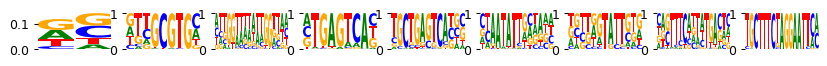

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.76it/s]


Current time: 2024-06-19 01:24:54.635921
	Loss: 219.814 , R2: 0.332
	Training time (model/function): (4.016s / 4.016s)
		per epoch (model/function): (0.287s/ 0.287s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998024743179032, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.68it/s]


Current time: 2024-06-19 01:24:59.224171
	Loss: 182.263 , R2: 0.335
	Training time (model/function): (8.114s / 4.098s)
		per epoch (model/function): (0.580s/ 0.293s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998024743179032, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.83it/s]


Current time: 2024-06-19 01:25:03.658303
	Loss: 160.256 , R2: 0.335
	Training time (model/function): (12.060s / 3.945s)
		per epoch (model/function): (0.861s/ 0.282s)
		per 1k samples: 0.104s
best loss 160.256
last five r2 values, by sequential filter optimization: ['0.335']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998024743179032, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.74it/s]


Current time: 2024-06-19 01:25:08.757764
	Loss: 155.574 , R2: 0.336
	Training time (model/function): (16.104s / 4.044s)
		per epoch (model/function): (1.150s/ 0.289s)
		per 1k samples: 0.107s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998024743179032, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.81it/s]


Current time: 2024-06-19 01:25:13.300231
	Loss: 147.920 , R2: 0.336
	Training time (model/function): (20.068s / 3.965s)
		per epoch (model/function): (1.433s/ 0.283s)
		per 1k samples: 0.105s
best loss 147.920
last five r2 values, by sequential filter optimization: ['0.335', '0.336']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998024743179032, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.76it/s]


Current time: 2024-06-19 01:25:18.293076
	Loss: 149.910 , R2: 0.337
	Training time (model/function): (24.092s / 4.023s)
		per epoch (model/function): (1.721s/ 0.287s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998024743179032, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.84it/s]


Current time: 2024-06-19 01:25:22.807486
	Loss: 145.330 , R2: 0.337
	Training time (model/function): (28.027s / 3.936s)
		per epoch (model/function): (2.002s/ 0.281s)
		per 1k samples: 0.104s
best loss 145.330
last five r2 values, by sequential filter optimization: ['0.335', '0.336', '0.337']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998024743179032, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.74it/s]


Current time: 2024-06-19 01:25:27.902244
	Loss: 148.713 , R2: 0.337
	Training time (model/function): (32.066s / 4.039s)
		per epoch (model/function): (2.290s/ 0.288s)
		per 1k samples: 0.107s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998024743179032, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.87it/s]


Current time: 2024-06-19 01:25:32.297543
	Loss: 144.786 , R2: 0.337
	Training time (model/function): (35.971s / 3.905s)
		per epoch (model/function): (2.569s/ 0.279s)
		per 1k samples: 0.103s
best loss 144.786
last five r2 values, by sequential filter optimization: ['0.335', '0.336', '0.337', '0.337']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998024743179032, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.77it/s]


Current time: 2024-06-19 01:25:37.357422
	Loss: 148.466 , R2: 0.338
	Training time (model/function): (39.974s / 4.003s)
		per epoch (model/function): (2.855s/ 0.286s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998024743179032, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.89it/s]


Current time: 2024-06-19 01:25:41.732116
	Loss: 144.674 , R2: 0.339
	Training time (model/function): (43.858s / 3.884s)
		per epoch (model/function): (3.133s/ 0.277s)
		per 1k samples: 0.103s
best loss 144.673
last five r2 values, by sequential filter optimization: ['0.335', '0.336', '0.337', '0.337', '0.338']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998024743179032, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 43.85778331756592s
Time per epoch (total): 0.010 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_4/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


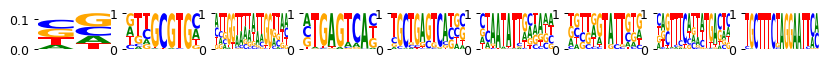

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.03it/s]


Current time: 2024-06-19 01:26:02.708915
	Loss: 220.807 , R2: 0.061
	Training time (model/function): (14.525s / 14.525s)
		per epoch (model/function): (1.037s/ 1.037s)
		per 1k samples: 0.384s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988775579477579, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:26:17.697123
	Loss: 182.254 , R2: 0.061
	Training time (model/function): (28.935s / 14.411s)
		per epoch (model/function): (2.067s/ 1.029s)
		per 1k samples: 0.381s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988775579477579, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:26:32.423724
	Loss: 160.244 , R2: 0.061
	Training time (model/function): (43.170s / 14.235s)
		per epoch (model/function): (3.084s/ 1.017s)
		per 1k samples: 0.377s
best loss 160.244
last five r2 values, by sequential filter optimization: ['0.061']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988775579477579, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:26:47.916167
	Loss: 155.577 , R2: 0.060
	Training time (model/function): (57.598s / 14.428s)
		per epoch (model/function): (4.114s/ 1.031s)
		per 1k samples: 0.382s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988775579477579, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:27:02.719129
	Loss: 147.912 , R2: 0.059
	Training time (model/function): (71.823s / 14.225s)
		per epoch (model/function): (5.130s/ 1.016s)
		per 1k samples: 0.376s
best loss 147.912
last five r2 values, by sequential filter optimization: ['0.061', '0.059']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988775579477579, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:27:18.214658
	Loss: 149.912 , R2: 0.058
	Training time (model/function): (86.258s / 14.435s)
		per epoch (model/function): (6.161s/ 1.031s)
		per 1k samples: 0.382s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988775579477579, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:27:32.930264
	Loss: 145.319 , R2: 0.058
	Training time (model/function): (100.482s / 14.224s)
		per epoch (model/function): (7.177s/ 1.016s)
		per 1k samples: 0.376s
best loss 145.319
last five r2 values, by sequential filter optimization: ['0.061', '0.059', '0.058']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988775579477579, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:27:48.415695
	Loss: 148.719 , R2: 0.058
	Training time (model/function): (114.907s / 14.424s)
		per epoch (model/function): (8.208s/ 1.030s)
		per 1k samples: 0.382s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988775579477579, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.05it/s]


Current time: 2024-06-19 01:28:03.186165
	Loss: 144.780 , R2: 0.058
	Training time (model/function): (129.186s / 14.279s)
		per epoch (model/function): (9.228s/ 1.020s)
		per 1k samples: 0.378s
best loss 144.780
last five r2 values, by sequential filter optimization: ['0.061', '0.059', '0.058', '0.058']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988775579477579, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.04it/s]


Current time: 2024-06-19 01:28:18.630172
	Loss: 148.467 , R2: 0.057
	Training time (model/function): (143.653s / 14.468s)
		per epoch (model/function): (10.261s/ 1.033s)
		per 1k samples: 0.383s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988775579477579, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:28:33.431784
	Loss: 144.664 , R2: 0.059
	Training time (model/function): (157.871s / 14.218s)
		per epoch (model/function): (11.277s/ 1.016s)
		per 1k samples: 0.376s
best loss 144.664
last five r2 values, by sequential filter optimization: ['0.061', '0.059', '0.058', '0.058', '0.059']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988775579477579, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 157.87114715576172s
Time per epoch (total): 0.036 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs1000/pwms/fold_4/running_time_1.pkl
30

/home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/processed_laura_2023_obs1000_var3000.h5ad
pbmc (1000, 2995)
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_0/model.pt
False /home/ilibarra/workspace/th

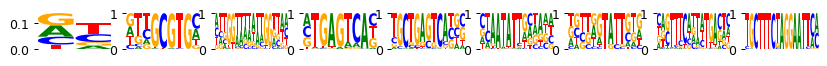

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.05it/s]


Current time: 2024-06-19 01:28:45.567930
	Loss: 219.625 , R2: 0.003
	Training time (model/function): (3.725s / 3.725s)
		per epoch (model/function): (0.266s/ 0.266s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9856499751655023, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.11it/s]


Current time: 2024-06-19 01:28:49.796529
	Loss: 182.075 , R2: 0.004
	Training time (model/function): (7.400s / 3.675s)
		per epoch (model/function): (0.529s/ 0.262s)
		per 1k samples: 0.100s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9856499751655023, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.18it/s]


Current time: 2024-06-19 01:28:53.870988
	Loss: 160.064 , R2: 0.004
	Training time (model/function): (11.014s / 3.614s)
		per epoch (model/function): (0.787s/ 0.258s)
		per 1k samples: 0.098s
best loss 160.064
last five r2 values, by sequential filter optimization: ['0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9856499751655023, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.08it/s]


Current time: 2024-06-19 01:28:58.571538
	Loss: 155.388 , R2: 0.005
	Training time (model/function): (14.719s / 3.704s)
		per epoch (model/function): (1.051s/ 0.265s)
		per 1k samples: 0.100s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9856499751655023, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.17it/s]


Current time: 2024-06-19 01:29:02.744670
	Loss: 147.734 , R2: 0.005
	Training time (model/function): (18.344s / 3.625s)
		per epoch (model/function): (1.310s/ 0.259s)
		per 1k samples: 0.098s
best loss 147.734
last five r2 values, by sequential filter optimization: ['0.004', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9856499751655023, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.06it/s]


Current time: 2024-06-19 01:29:07.402363
	Loss: 149.722 , R2: 0.005
	Training time (model/function): (22.061s / 3.716s)
		per epoch (model/function): (1.576s/ 0.265s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9856499751655023, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.13it/s]


Current time: 2024-06-19 01:29:11.610505
	Loss: 145.143 , R2: 0.005
	Training time (model/function): (25.722s / 3.661s)
		per epoch (model/function): (1.837s/ 0.262s)
		per 1k samples: 0.099s
best loss 145.143
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9856499751655023, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.06it/s]


Current time: 2024-06-19 01:29:16.326041
	Loss: 148.526 , R2: 0.005
	Training time (model/function): (29.437s / 3.715s)
		per epoch (model/function): (2.103s/ 0.265s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9856499751655023, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.20it/s]


Current time: 2024-06-19 01:29:20.380832
	Loss: 144.599 , R2: 0.005
	Training time (model/function): (33.031s / 3.594s)
		per epoch (model/function): (2.359s/ 0.257s)
		per 1k samples: 0.097s
best loss 144.599
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9856499751655023, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.96it/s]


Current time: 2024-06-19 01:29:25.099746
	Loss: 148.270 , R2: 0.005
	Training time (model/function): (36.839s / 3.809s)
		per epoch (model/function): (2.631s/ 0.272s)
		per 1k samples: 0.103s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9856499751655023, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.19it/s]


Current time: 2024-06-19 01:29:29.167064
	Loss: 144.485 , R2: 0.005
	Training time (model/function): (40.445s / 3.605s)
		per epoch (model/function): (2.889s/ 0.258s)
		per 1k samples: 0.098s
best loss 144.485
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9856499751655023, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 40.444857597351074s
Time per epoch (total): 0.009 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_0/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


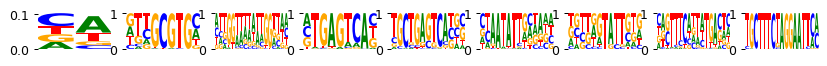

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.07it/s]


Current time: 2024-06-19 01:29:49.466201
	Loss: 220.589 , R2: 0.002
	Training time (model/function): (14.033s / 14.033s)
		per epoch (model/function): (1.002s/ 1.002s)
		per 1k samples: 0.381s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836588596983227, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:30:04.079596
	Loss: 182.075 , R2: 0.002
	Training time (model/function): (28.184s / 14.150s)
		per epoch (model/function): (2.013s/ 1.011s)
		per 1k samples: 0.384s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836588596983227, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:30:18.513831
	Loss: 160.063 , R2: 0.002
	Training time (model/function): (42.066s / 13.883s)
		per epoch (model/function): (3.005s/ 0.992s)
		per 1k samples: 0.376s
best loss 160.063
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836588596983227, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:30:33.657530
	Loss: 155.394 , R2: 0.003
	Training time (model/function): (56.203s / 14.136s)
		per epoch (model/function): (4.014s/ 1.010s)
		per 1k samples: 0.383s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836588596983227, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:30:48.018976
	Loss: 147.734 , R2: 0.003
	Training time (model/function): (70.101s / 13.899s)
		per epoch (model/function): (5.007s/ 0.993s)
		per 1k samples: 0.377s
best loss 147.734
last five r2 values, by sequential filter optimization: ['0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836588596983227, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:31:03.166025
	Loss: 149.733 , R2: 0.003
	Training time (model/function): (84.333s / 14.232s)
		per epoch (model/function): (6.024s/ 1.017s)
		per 1k samples: 0.386s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836588596983227, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:31:17.600548
	Loss: 145.142 , R2: 0.003
	Training time (model/function): (98.220s / 13.886s)
		per epoch (model/function): (7.016s/ 0.992s)
		per 1k samples: 0.377s
best loss 145.142
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836588596983227, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.07it/s]


Current time: 2024-06-19 01:31:32.662016
	Loss: 148.545 , R2: 0.003
	Training time (model/function): (112.280s / 14.060s)
		per epoch (model/function): (8.020s/ 1.004s)
		per 1k samples: 0.381s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836588596983227, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:31:47.045604
	Loss: 144.599 , R2: 0.003
	Training time (model/function): (126.202s / 13.922s)
		per epoch (model/function): (9.014s/ 0.994s)
		per 1k samples: 0.378s
best loss 144.599
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836588596983227, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:32:02.119750
	Loss: 148.294 , R2: 0.003
	Training time (model/function): (140.360s / 14.158s)
		per epoch (model/function): (10.026s/ 1.011s)
		per 1k samples: 0.384s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836588596983227, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:32:16.539209
	Loss: 144.485 , R2: 0.003
	Training time (model/function): (154.230s / 13.870s)
		per epoch (model/function): (11.016s/ 0.991s)
		per 1k samples: 0.376s
best loss 144.485
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836588596983227, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 154.22953939437866s
Time per epoch (total): 0.035 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_1/model_1.pt
/home/ilibarra/workspace/theislab/mubind/da

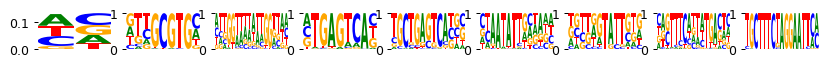

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.06it/s]


Current time: 2024-06-19 01:32:27.805913
	Loss: 219.625 , R2: 0.003
	Training time (model/function): (3.722s / 3.722s)
		per epoch (model/function): (0.266s/ 0.266s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9851126884373871, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.97it/s]


Current time: 2024-06-19 01:32:32.069116
	Loss: 182.075 , R2: 0.004
	Training time (model/function): (7.521s / 3.799s)
		per epoch (model/function): (0.537s/ 0.271s)
		per 1k samples: 0.103s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9851126884373871, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.14it/s]


Current time: 2024-06-19 01:32:36.179152
	Loss: 160.064 , R2: 0.004
	Training time (model/function): (11.167s / 3.646s)
		per epoch (model/function): (0.798s/ 0.260s)
		per 1k samples: 0.099s
best loss 160.064
last five r2 values, by sequential filter optimization: ['0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9851126884373871, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.05it/s]


Current time: 2024-06-19 01:32:40.908855
	Loss: 155.388 , R2: 0.005
	Training time (model/function): (14.892s / 3.725s)
		per epoch (model/function): (1.064s/ 0.266s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9851126884373871, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.14it/s]


Current time: 2024-06-19 01:32:45.108060
	Loss: 147.734 , R2: 0.005
	Training time (model/function): (18.540s / 3.648s)
		per epoch (model/function): (1.324s/ 0.261s)
		per 1k samples: 0.099s
best loss 147.734
last five r2 values, by sequential filter optimization: ['0.004', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9851126884373871, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.05it/s]


Current time: 2024-06-19 01:32:49.753751
	Loss: 149.722 , R2: 0.005
	Training time (model/function): (22.270s / 3.730s)
		per epoch (model/function): (1.591s/ 0.266s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9851126884373871, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.16it/s]


Current time: 2024-06-19 01:32:53.938232
	Loss: 145.143 , R2: 0.005
	Training time (model/function): (25.903s / 3.633s)
		per epoch (model/function): (1.850s/ 0.260s)
		per 1k samples: 0.099s
best loss 145.143
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9851126884373871, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.05it/s]


Current time: 2024-06-19 01:32:58.677895
	Loss: 148.526 , R2: 0.005
	Training time (model/function): (29.636s / 3.733s)
		per epoch (model/function): (2.117s/ 0.267s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9851126884373871, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.20it/s]


Current time: 2024-06-19 01:33:02.743308
	Loss: 144.599 , R2: 0.005
	Training time (model/function): (33.236s / 3.600s)
		per epoch (model/function): (2.374s/ 0.257s)
		per 1k samples: 0.098s
best loss 144.599
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9851126884373871, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.05it/s]


Current time: 2024-06-19 01:33:07.480173
	Loss: 148.269 , R2: 0.005
	Training time (model/function): (36.969s / 3.733s)
		per epoch (model/function): (2.641s/ 0.267s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9851126884373871, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.20it/s]


Current time: 2024-06-19 01:33:11.545409
	Loss: 144.485 , R2: 0.005
	Training time (model/function): (40.569s / 3.600s)
		per epoch (model/function): (2.898s/ 0.257s)
		per 1k samples: 0.098s
best loss 144.485
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9851126884373871, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 40.56904315948486s
Time per epoch (total): 0.009 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_1/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


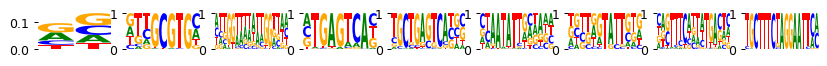

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.07it/s]


Current time: 2024-06-19 01:33:31.876380
	Loss: 220.579 , R2: 0.002
	Training time (model/function): (14.071s / 14.071s)
		per epoch (model/function): (1.005s/ 1.005s)
		per 1k samples: 0.382s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9834805839362152, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:33:46.467585
	Loss: 182.075 , R2: 0.002
	Training time (model/function): (28.196s / 14.125s)
		per epoch (model/function): (2.014s/ 1.009s)
		per 1k samples: 0.383s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9834805839362152, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:34:00.875310
	Loss: 160.063 , R2: 0.002
	Training time (model/function): (42.140s / 13.944s)
		per epoch (model/function): (3.010s/ 0.996s)
		per 1k samples: 0.379s
best loss 160.063
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9834805839362152, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.07it/s]


Current time: 2024-06-19 01:34:15.976646
	Loss: 155.394 , R2: 0.002
	Training time (model/function): (56.236s / 14.096s)
		per epoch (model/function): (4.017s/ 1.007s)
		per 1k samples: 0.383s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9834805839362152, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.07it/s]


Current time: 2024-06-19 01:34:30.443229
	Loss: 147.734 , R2: 0.003
	Training time (model/function): (70.239s / 14.003s)
		per epoch (model/function): (5.017s/ 1.000s)
		per 1k samples: 0.380s
best loss 147.734
last five r2 values, by sequential filter optimization: ['0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9834805839362152, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:34:45.580342
	Loss: 149.734 , R2: 0.003
	Training time (model/function): (84.459s / 14.220s)
		per epoch (model/function): (6.033s/ 1.016s)
		per 1k samples: 0.386s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9834805839362152, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:34:59.999584
	Loss: 145.142 , R2: 0.003
	Training time (model/function): (98.323s / 13.864s)
		per epoch (model/function): (7.023s/ 0.990s)
		per 1k samples: 0.376s
best loss 145.142
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9834805839362152, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.07it/s]


Current time: 2024-06-19 01:35:15.009351
	Loss: 148.544 , R2: 0.003
	Training time (model/function): (112.416s / 14.094s)
		per epoch (model/function): (8.030s/ 1.007s)
		per 1k samples: 0.383s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9834805839362152, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:35:29.417649
	Loss: 144.599 , R2: 0.003
	Training time (model/function): (126.361s / 13.944s)
		per epoch (model/function): (9.026s/ 0.996s)
		per 1k samples: 0.379s
best loss 144.599
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9834805839362152, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:35:44.521340
	Loss: 148.293 , R2: 0.003
	Training time (model/function): (140.548s / 14.187s)
		per epoch (model/function): (10.039s/ 1.013s)
		per 1k samples: 0.385s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9834805839362152, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:35:58.848320
	Loss: 144.485 , R2: 0.003
	Training time (model/function): (154.408s / 13.860s)
		per epoch (model/function): (11.029s/ 0.990s)
		per 1k samples: 0.376s
best loss 144.485
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9834805839362152, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 154.40847325325012s
Time per epoch (total): 0.035 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_2/model_1.pt
/home/ilibarra/workspace/theislab/mubind/da

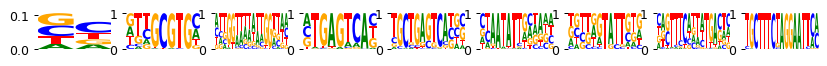

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.07it/s]


Current time: 2024-06-19 01:36:10.158150
	Loss: 219.625 , R2: 0.003
	Training time (model/function): (3.712s / 3.712s)
		per epoch (model/function): (0.265s/ 0.265s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9848873941499403, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.10it/s]


Current time: 2024-06-19 01:36:14.404287
	Loss: 182.075 , R2: 0.004
	Training time (model/function): (7.391s / 3.679s)
		per epoch (model/function): (0.528s/ 0.263s)
		per 1k samples: 0.100s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9848873941499403, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.18it/s]


Current time: 2024-06-19 01:36:18.491592
	Loss: 160.064 , R2: 0.004
	Training time (model/function): (11.009s / 3.618s)
		per epoch (model/function): (0.786s/ 0.258s)
		per 1k samples: 0.098s
best loss 160.064
last five r2 values, by sequential filter optimization: ['0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9848873941499403, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.07it/s]


Current time: 2024-06-19 01:36:23.218920
	Loss: 155.388 , R2: 0.005
	Training time (model/function): (14.720s / 3.711s)
		per epoch (model/function): (1.051s/ 0.265s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9848873941499403, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.15it/s]


Current time: 2024-06-19 01:36:27.421659
	Loss: 147.734 , R2: 0.005
	Training time (model/function): (18.360s / 3.639s)
		per epoch (model/function): (1.311s/ 0.260s)
		per 1k samples: 0.099s
best loss 147.734
last five r2 values, by sequential filter optimization: ['0.004', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9848873941499403, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.06it/s]


Current time: 2024-06-19 01:36:32.076305
	Loss: 149.722 , R2: 0.005
	Training time (model/function): (22.084s / 3.724s)
		per epoch (model/function): (1.577s/ 0.266s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9848873941499403, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.17it/s]


Current time: 2024-06-19 01:36:36.257450
	Loss: 145.142 , R2: 0.005
	Training time (model/function): (25.709s / 3.625s)
		per epoch (model/function): (1.836s/ 0.259s)
		per 1k samples: 0.098s
best loss 145.142
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9848873941499403, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.06it/s]


Current time: 2024-06-19 01:36:40.989292
	Loss: 148.526 , R2: 0.005
	Training time (model/function): (29.425s / 3.716s)
		per epoch (model/function): (2.102s/ 0.265s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9848873941499403, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.21it/s]


Current time: 2024-06-19 01:36:45.052170
	Loss: 144.599 , R2: 0.005
	Training time (model/function): (33.014s / 3.590s)
		per epoch (model/function): (2.358s/ 0.256s)
		per 1k samples: 0.098s
best loss 144.599
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9848873941499403, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.99it/s]


Current time: 2024-06-19 01:36:49.769227
	Loss: 148.271 , R2: 0.005
	Training time (model/function): (36.801s / 3.787s)
		per epoch (model/function): (2.629s/ 0.270s)
		per 1k samples: 0.103s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9848873941499403, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.21it/s]


Current time: 2024-06-19 01:36:53.829380
	Loss: 144.485 , R2: 0.005
	Training time (model/function): (40.391s / 3.590s)
		per epoch (model/function): (2.885s/ 0.256s)
		per 1k samples: 0.098s
best loss 144.485
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9848873941499403, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 40.39122557640076s
Time per epoch (total): 0.009 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_2/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


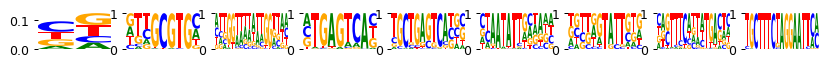

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.07it/s]


Current time: 2024-06-19 01:37:14.170035
	Loss: 220.669 , R2: 0.002
	Training time (model/function): (14.037s / 14.037s)
		per epoch (model/function): (1.003s/ 1.003s)
		per 1k samples: 0.381s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9815442144652591, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:37:28.790623
	Loss: 182.074 , R2: 0.002
	Training time (model/function): (28.182s / 14.144s)
		per epoch (model/function): (2.013s/ 1.010s)
		per 1k samples: 0.384s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9815442144652591, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:37:43.229064
	Loss: 160.063 , R2: 0.002
	Training time (model/function): (42.060s / 13.878s)
		per epoch (model/function): (3.004s/ 0.991s)
		per 1k samples: 0.377s
best loss 160.063
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9815442144652591, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.07it/s]


Current time: 2024-06-19 01:37:58.324747
	Loss: 155.394 , R2: 0.003
	Training time (model/function): (56.132s / 14.072s)
		per epoch (model/function): (4.009s/ 1.005s)
		per 1k samples: 0.382s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9815442144652591, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:38:12.699012
	Loss: 147.734 , R2: 0.003
	Training time (model/function): (70.035s / 13.903s)
		per epoch (model/function): (5.002s/ 0.993s)
		per 1k samples: 0.378s
best loss 147.734
last five r2 values, by sequential filter optimization: ['0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9815442144652591, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:38:27.803934
	Loss: 149.735 , R2: 0.003
	Training time (model/function): (84.207s / 14.172s)
		per epoch (model/function): (6.015s/ 1.012s)
		per 1k samples: 0.385s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9815442144652591, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:38:42.253690
	Loss: 145.142 , R2: 0.003
	Training time (model/function): (98.094s / 13.887s)
		per epoch (model/function): (7.007s/ 0.992s)
		per 1k samples: 0.377s
best loss 145.142
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9815442144652591, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.07it/s]


Current time: 2024-06-19 01:38:57.368332
	Loss: 148.546 , R2: 0.003
	Training time (model/function): (112.174s / 14.080s)
		per epoch (model/function): (8.012s/ 1.006s)
		per 1k samples: 0.383s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9815442144652591, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:39:11.825670
	Loss: 144.599 , R2: 0.003
	Training time (model/function): (126.151s / 13.977s)
		per epoch (model/function): (9.011s/ 0.998s)
		per 1k samples: 0.380s
best loss 144.599
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9815442144652591, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:39:26.915975
	Loss: 148.294 , R2: 0.003
	Training time (model/function): (140.307s / 14.156s)
		per epoch (model/function): (10.022s/ 1.011s)
		per 1k samples: 0.385s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9815442144652591, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:39:41.341433
	Loss: 144.485 , R2: 0.003
	Training time (model/function): (154.171s / 13.864s)
		per epoch (model/function): (11.012s/ 0.990s)
		per 1k samples: 0.377s
best loss 144.485
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9815442144652591, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 154.170893907547s
Time per epoch (total): 0.035 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_3/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data

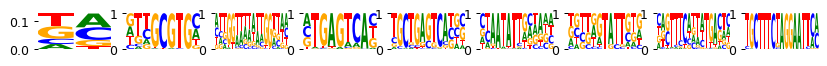

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.06it/s]


Current time: 2024-06-19 01:39:52.626665
	Loss: 219.625 , R2: 0.003
	Training time (model/function): (3.718s / 3.718s)
		per epoch (model/function): (0.266s/ 0.266s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833776253538172, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.99it/s]


Current time: 2024-06-19 01:39:56.870282
	Loss: 182.075 , R2: 0.004
	Training time (model/function): (7.501s / 3.783s)
		per epoch (model/function): (0.536s/ 0.270s)
		per 1k samples: 0.103s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833776253538172, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.15it/s]


Current time: 2024-06-19 01:40:00.972559
	Loss: 160.064 , R2: 0.004
	Training time (model/function): (11.143s / 3.643s)
		per epoch (model/function): (0.796s/ 0.260s)
		per 1k samples: 0.099s
best loss 160.064
last five r2 values, by sequential filter optimization: ['0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833776253538172, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.05it/s]


Current time: 2024-06-19 01:40:05.691978
	Loss: 155.388 , R2: 0.005
	Training time (model/function): (14.871s / 3.727s)
		per epoch (model/function): (1.062s/ 0.266s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833776253538172, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.15it/s]


Current time: 2024-06-19 01:40:09.874806
	Loss: 147.734 , R2: 0.005
	Training time (model/function): (18.506s / 3.636s)
		per epoch (model/function): (1.322s/ 0.260s)
		per 1k samples: 0.099s
best loss 147.734
last five r2 values, by sequential filter optimization: ['0.004', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833776253538172, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.05it/s]


Current time: 2024-06-19 01:40:14.510596
	Loss: 149.722 , R2: 0.005
	Training time (model/function): (22.235s / 3.728s)
		per epoch (model/function): (1.588s/ 0.266s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833776253538172, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.16it/s]


Current time: 2024-06-19 01:40:18.685236
	Loss: 145.143 , R2: 0.005
	Training time (model/function): (25.868s / 3.633s)
		per epoch (model/function): (1.848s/ 0.260s)
		per 1k samples: 0.099s
best loss 145.143
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833776253538172, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.05it/s]


Current time: 2024-06-19 01:40:23.407098
	Loss: 148.526 , R2: 0.005
	Training time (model/function): (29.594s / 3.726s)
		per epoch (model/function): (2.114s/ 0.266s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833776253538172, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.20it/s]


Current time: 2024-06-19 01:40:27.473145
	Loss: 144.599 , R2: 0.005
	Training time (model/function): (33.195s / 3.601s)
		per epoch (model/function): (2.371s/ 0.257s)
		per 1k samples: 0.098s
best loss 144.599
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833776253538172, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.07it/s]


Current time: 2024-06-19 01:40:32.178018
	Loss: 148.270 , R2: 0.005
	Training time (model/function): (36.904s / 3.709s)
		per epoch (model/function): (2.636s/ 0.265s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833776253538172, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.20it/s]


Current time: 2024-06-19 01:40:36.234470
	Loss: 144.485 , R2: 0.005
	Training time (model/function): (40.500s / 3.596s)
		per epoch (model/function): (2.893s/ 0.257s)
		per 1k samples: 0.098s
best loss 144.485
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9833776253538172, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 40.5003547668457s
Time per epoch (total): 0.009 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_3/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


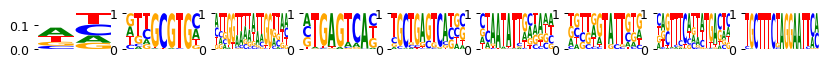

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.07it/s]


Current time: 2024-06-19 01:40:56.484916
	Loss: 220.691 , R2: 0.002
	Training time (model/function): (14.040s / 14.040s)
		per epoch (model/function): (1.003s/ 1.003s)
		per 1k samples: 0.381s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836486808776558, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:41:11.106963
	Loss: 182.074 , R2: 0.002
	Training time (model/function): (28.200s / 14.160s)
		per epoch (model/function): (2.014s/ 1.011s)
		per 1k samples: 0.384s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836486808776558, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:41:25.470532
	Loss: 160.063 , R2: 0.002
	Training time (model/function): (42.098s / 13.898s)
		per epoch (model/function): (3.007s/ 0.993s)
		per 1k samples: 0.377s
best loss 160.063
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836486808776558, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.07it/s]


Current time: 2024-06-19 01:41:40.562093
	Loss: 155.394 , R2: 0.003
	Training time (model/function): (56.190s / 14.092s)
		per epoch (model/function): (4.014s/ 1.007s)
		per 1k samples: 0.382s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836486808776558, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.07it/s]


Current time: 2024-06-19 01:41:55.022910
	Loss: 147.733 , R2: 0.003
	Training time (model/function): (70.188s / 13.998s)
		per epoch (model/function): (5.013s/ 1.000s)
		per 1k samples: 0.380s
best loss 147.733
last five r2 values, by sequential filter optimization: ['0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836486808776558, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:42:10.131786
	Loss: 149.734 , R2: 0.003
	Training time (model/function): (84.386s / 14.198s)
		per epoch (model/function): (6.028s/ 1.014s)
		per 1k samples: 0.385s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836486808776558, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:42:24.578755
	Loss: 145.142 , R2: 0.003
	Training time (model/function): (98.281s / 13.895s)
		per epoch (model/function): (7.020s/ 0.992s)
		per 1k samples: 0.377s
best loss 145.142
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836486808776558, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.07it/s]


Current time: 2024-06-19 01:42:39.580099
	Loss: 148.545 , R2: 0.003
	Training time (model/function): (112.372s / 14.091s)
		per epoch (model/function): (8.027s/ 1.006s)
		per 1k samples: 0.382s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836486808776558, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.07it/s]


Current time: 2024-06-19 01:42:54.078235
	Loss: 144.599 , R2: 0.003
	Training time (model/function): (126.406s / 14.034s)
		per epoch (model/function): (9.029s/ 1.002s)
		per 1k samples: 0.381s
best loss 144.599
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836486808776558, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:43:09.154606
	Loss: 148.295 , R2: 0.003
	Training time (model/function): (140.571s / 14.165s)
		per epoch (model/function): (10.041s/ 1.012s)
		per 1k samples: 0.384s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836486808776558, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:43:23.482286
	Loss: 144.485 , R2: 0.003
	Training time (model/function): (154.436s / 13.865s)
		per epoch (model/function): (11.031s/ 0.990s)
		per 1k samples: 0.376s
best loss 144.485
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9836486808776558, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 154.43605017662048s
Time per epoch (total): 0.036 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_4/model_1.pt
/home/ilibarra/workspace/theislab/mubind/da

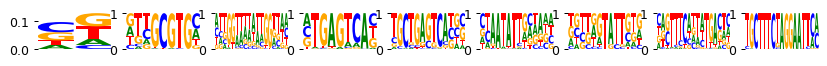

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.05it/s]


Current time: 2024-06-19 01:43:34.770519
	Loss: 219.625 , R2: 0.003
	Training time (model/function): (3.730s / 3.730s)
		per epoch (model/function): (0.266s/ 0.266s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9860308306805601, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.96it/s]


Current time: 2024-06-19 01:43:39.050223
	Loss: 182.075 , R2: 0.004
	Training time (model/function): (7.545s / 3.815s)
		per epoch (model/function): (0.539s/ 0.273s)
		per 1k samples: 0.103s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9860308306805601, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.13it/s]


Current time: 2024-06-19 01:43:43.174913
	Loss: 160.064 , R2: 0.004
	Training time (model/function): (11.204s / 3.659s)
		per epoch (model/function): (0.800s/ 0.261s)
		per 1k samples: 0.099s
best loss 160.064
last five r2 values, by sequential filter optimization: ['0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9860308306805601, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.03it/s]


Current time: 2024-06-19 01:43:47.927265
	Loss: 155.388 , R2: 0.005
	Training time (model/function): (14.954s / 3.750s)
		per epoch (model/function): (1.068s/ 0.268s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9860308306805601, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.10it/s]


Current time: 2024-06-19 01:43:52.165606
	Loss: 147.734 , R2: 0.005
	Training time (model/function): (18.640s / 3.687s)
		per epoch (model/function): (1.331s/ 0.263s)
		per 1k samples: 0.100s
best loss 147.734
last five r2 values, by sequential filter optimization: ['0.004', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9860308306805601, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.03it/s]


Current time: 2024-06-19 01:43:56.842117
	Loss: 149.722 , R2: 0.005
	Training time (model/function): (22.391s / 3.751s)
		per epoch (model/function): (1.599s/ 0.268s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9860308306805601, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.14it/s]


Current time: 2024-06-19 01:44:01.048954
	Loss: 145.143 , R2: 0.005
	Training time (model/function): (26.046s / 3.655s)
		per epoch (model/function): (1.860s/ 0.261s)
		per 1k samples: 0.099s
best loss 145.143
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9860308306805601, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.03it/s]


Current time: 2024-06-19 01:44:05.804295
	Loss: 148.526 , R2: 0.005
	Training time (model/function): (29.797s / 3.751s)
		per epoch (model/function): (2.128s/ 0.268s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9860308306805601, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.15it/s]


Current time: 2024-06-19 01:44:09.917371
	Loss: 144.599 , R2: 0.005
	Training time (model/function): (33.442s / 3.646s)
		per epoch (model/function): (2.389s/ 0.260s)
		per 1k samples: 0.099s
best loss 144.599
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9860308306805601, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.02it/s]


Current time: 2024-06-19 01:44:14.678659
	Loss: 148.271 , R2: 0.005
	Training time (model/function): (37.201s / 3.758s)
		per epoch (model/function): (2.657s/ 0.268s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9860308306805601, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.19it/s]


Current time: 2024-06-19 01:44:18.752074
	Loss: 144.485 , R2: 0.005
	Training time (model/function): (40.808s / 3.607s)
		per epoch (model/function): (2.915s/ 0.258s)
		per 1k samples: 0.098s
best loss 144.485
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9860308306805601, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 40.80766558647156s
Time per epoch (total): 0.009 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_4/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


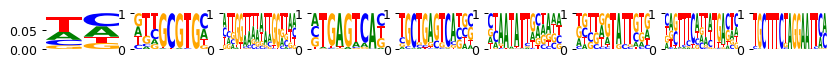

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:44:39.133723
	Loss: 220.647 , R2: 0.002
	Training time (model/function): (14.227s / 14.227s)
		per epoch (model/function): (1.016s/ 1.016s)
		per 1k samples: 0.386s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.983893353105045, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:44:53.872393
	Loss: 182.075 , R2: 0.002
	Training time (model/function): (28.411s / 14.185s)
		per epoch (model/function): (2.029s/ 1.013s)
		per 1k samples: 0.385s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.983893353105045, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.07it/s]


Current time: 2024-06-19 01:45:08.332500
	Loss: 160.063 , R2: 0.002
	Training time (model/function): (42.404s / 13.992s)
		per epoch (model/function): (3.029s/ 0.999s)
		per 1k samples: 0.379s
best loss 160.063
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.983893353105045, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:45:23.457105
	Loss: 155.394 , R2: 0.003
	Training time (model/function): (56.518s / 14.114s)
		per epoch (model/function): (4.037s/ 1.008s)
		per 1k samples: 0.383s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.983893353105045, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.07it/s]


Current time: 2024-06-19 01:45:37.906429
	Loss: 147.733 , R2: 0.003
	Training time (model/function): (70.499s / 13.981s)
		per epoch (model/function): (5.036s/ 0.999s)
		per 1k samples: 0.379s
best loss 147.733
last five r2 values, by sequential filter optimization: ['0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.983893353105045, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:45:52.993585
	Loss: 149.734 , R2: 0.003
	Training time (model/function): (84.664s / 14.165s)
		per epoch (model/function): (6.047s/ 1.012s)
		per 1k samples: 0.384s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.983893353105045, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:46:07.477638
	Loss: 145.142 , R2: 0.003
	Training time (model/function): (98.591s / 13.927s)
		per epoch (model/function): (7.042s/ 0.995s)
		per 1k samples: 0.378s
best loss 145.142
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.983893353105045, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:46:22.609091
	Loss: 148.544 , R2: 0.003
	Training time (model/function): (112.799s / 14.208s)
		per epoch (model/function): (8.057s/ 1.015s)
		per 1k samples: 0.385s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.983893353105045, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:46:37.045752
	Loss: 144.599 , R2: 0.003
	Training time (model/function): (126.768s / 13.969s)
		per epoch (model/function): (9.055s/ 0.998s)
		per 1k samples: 0.379s
best loss 144.599
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.983893353105045, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.06it/s]


Current time: 2024-06-19 01:46:52.170882
	Loss: 148.292 , R2: 0.003
	Training time (model/function): (140.968s / 14.200s)
		per epoch (model/function): (10.069s/ 1.014s)
		per 1k samples: 0.385s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.983893353105045, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 01:47:06.671692
	Loss: 144.485 , R2: 0.003
	Training time (model/function): (154.889s / 13.921s)
		per epoch (model/function): (11.064s/ 0.994s)
		per 1k samples: 0.378s
best loss 144.485
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.983893353105045, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 154.88910627365112s
Time per epoch (total): 0.036 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs1000/pwms/fold_4/running_time_1.pkl
35

/home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/merged_scATAC_integrated_cicero_faye_chong_obs1000_var3000.h5ad
noack_2022 (1000, 3000)
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_0/

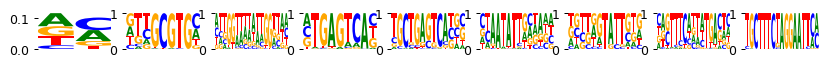

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.04it/s]


Current time: 2024-06-19 01:47:16.775469
	Loss: 228.820 , R2: 0.002
	Training time (model/function): (2.499s / 2.499s)
		per epoch (model/function): (0.179s/ 0.179s)
		per 1k samples: 0.072s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992612691674298, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.07it/s]


Current time: 2024-06-19 01:47:19.756180
	Loss: 191.698 , R2: 0.003
	Training time (model/function): (4.988s / 2.488s)
		per epoch (model/function): (0.356s/ 0.178s)
		per 1k samples: 0.072s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992612691674298, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.12it/s]


Current time: 2024-06-19 01:47:22.627558
	Loss: 166.984 , R2: 0.003
	Training time (model/function): (7.459s / 2.471s)
		per epoch (model/function): (0.533s/ 0.176s)
		per 1k samples: 0.072s
best loss 166.984
last five r2 values, by sequential filter optimization: ['0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992612691674298, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.00it/s]


Current time: 2024-06-19 01:47:26.020670
	Loss: 159.786 , R2: 0.004
	Training time (model/function): (9.975s / 2.517s)
		per epoch (model/function): (0.713s/ 0.180s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992612691674298, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.12it/s]


Current time: 2024-06-19 01:47:28.887861
	Loss: 150.365 , R2: 0.004
	Training time (model/function): (12.443s / 2.467s)
		per epoch (model/function): (0.889s/ 0.176s)
		per 1k samples: 0.071s
best loss 150.365
last five r2 values, by sequential filter optimization: ['0.003', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992612691674298, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.00it/s]


Current time: 2024-06-19 01:47:32.279185
	Loss: 151.242 , R2: 0.004
	Training time (model/function): (14.960s / 2.517s)
		per epoch (model/function): (1.069s/ 0.180s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992612691674298, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.16it/s]


Current time: 2024-06-19 01:47:35.214477
	Loss: 145.996 , R2: 0.004
	Training time (model/function): (17.410s / 2.450s)
		per epoch (model/function): (1.244s/ 0.175s)
		per 1k samples: 0.071s
best loss 145.996
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992612691674298, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.98it/s]


Current time: 2024-06-19 01:47:38.526711
	Loss: 148.999 , R2: 0.004
	Training time (model/function): (19.934s / 2.524s)
		per epoch (model/function): (1.424s/ 0.180s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992612691674298, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.01it/s]


Current time: 2024-06-19 01:47:41.438663
	Loss: 144.854 , R2: 0.004
	Training time (model/function): (22.447s / 2.513s)
		per epoch (model/function): (1.603s/ 0.180s)
		per 1k samples: 0.073s
best loss 144.854
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992612691674298, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.00it/s]


Current time: 2024-06-19 01:47:44.833514
	Loss: 148.417 , R2: 0.005
	Training time (model/function): (24.964s / 2.516s)
		per epoch (model/function): (1.783s/ 0.180s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992612691674298, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.25it/s]


Current time: 2024-06-19 01:47:47.652768
	Loss: 144.555 , R2: 0.005
	Training time (model/function): (27.382s / 2.418s)
		per epoch (model/function): (1.956s/ 0.173s)
		per 1k samples: 0.070s
best loss 144.555
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004', '0.004', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992612691674298, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 27.38150429725647s
Time per epoch (total): 0.006 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_0/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


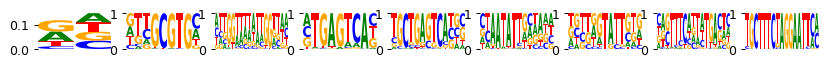

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:48:04.486179
	Loss: 230.982 , R2: 0.001
	Training time (model/function): (11.124s / 11.124s)
		per epoch (model/function): (0.795s/ 0.795s)
		per 1k samples: 0.322s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923128207704979, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:48:16.130068
	Loss: 191.699 , R2: 0.001
	Training time (model/function): (22.267s / 11.143s)
		per epoch (model/function): (1.591s/ 0.796s)
		per 1k samples: 0.323s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923128207704979, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 01:48:27.563036
	Loss: 166.984 , R2: 0.001
	Training time (model/function): (33.297s / 11.030s)
		per epoch (model/function): (2.378s/ 0.788s)
		per 1k samples: 0.319s
best loss 166.984
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923128207704979, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:48:39.593331
	Loss: 159.793 , R2: 0.002
	Training time (model/function): (44.447s / 11.149s)
		per epoch (model/function): (3.175s/ 0.796s)
		per 1k samples: 0.323s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923128207704979, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 01:48:51.096937
	Loss: 150.366 , R2: 0.003
	Training time (model/function): (55.463s / 11.016s)
		per epoch (model/function): (3.962s/ 0.787s)
		per 1k samples: 0.319s
best loss 150.366
last five r2 values, by sequential filter optimization: ['0.001', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923128207704979, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.33it/s]


Current time: 2024-06-19 01:49:03.273906
	Loss: 151.251 , R2: 0.003
	Training time (model/function): (66.739s / 11.276s)
		per epoch (model/function): (4.767s/ 0.805s)
		per 1k samples: 0.326s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923128207704979, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 01:49:14.732580
	Loss: 145.997 , R2: 0.003
	Training time (model/function): (77.794s / 11.055s)
		per epoch (model/function): (5.557s/ 0.790s)
		per 1k samples: 0.320s
best loss 145.997
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923128207704979, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.34it/s]


Current time: 2024-06-19 01:49:26.841318
	Loss: 149.015 , R2: 0.003
	Training time (model/function): (89.016s / 11.222s)
		per epoch (model/function): (6.358s/ 0.802s)
		per 1k samples: 0.325s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923128207704979, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:10<00:00,  1.37it/s]


Current time: 2024-06-19 01:49:38.309877
	Loss: 144.854 , R2: 0.003
	Training time (model/function): (99.997s / 10.980s)
		per epoch (model/function): (7.143s/ 0.784s)
		per 1k samples: 0.318s
best loss 144.854
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923128207704979, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.34it/s]


Current time: 2024-06-19 01:49:50.364963
	Loss: 148.430 , R2: 0.004
	Training time (model/function): (111.169s / 11.172s)
		per epoch (model/function): (7.941s/ 0.798s)
		per 1k samples: 0.323s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923128207704979, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:10<00:00,  1.37it/s]


Current time: 2024-06-19 01:50:01.762057
	Loss: 144.556 , R2: 0.004
	Training time (model/function): (122.165s / 10.996s)
		per epoch (model/function): (8.726s/ 0.785s)
		per 1k samples: 0.318s
best loss 144.556
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003', '0.003', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923128207704979, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 122.16455221176147s
Time per epoch (total): 0.028 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_1/model_1.pt
/home/ilibarra/workspace/t

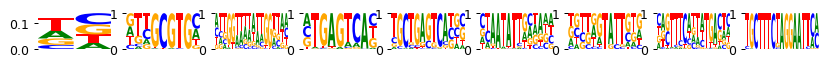

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.21it/s]


Current time: 2024-06-19 01:50:10.868349
	Loss: 228.820 , R2: 0.002
	Training time (model/function): (2.431s / 2.431s)
		per epoch (model/function): (0.174s/ 0.174s)
		per 1k samples: 0.070s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992772872048762, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.25it/s]


Current time: 2024-06-19 01:50:13.766981
	Loss: 191.698 , R2: 0.003
	Training time (model/function): (4.846s / 2.415s)
		per epoch (model/function): (0.346s/ 0.172s)
		per 1k samples: 0.070s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992772872048762, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.33it/s]


Current time: 2024-06-19 01:50:16.539658
	Loss: 166.984 , R2: 0.003
	Training time (model/function): (7.233s / 2.387s)
		per epoch (model/function): (0.517s/ 0.171s)
		per 1k samples: 0.069s
best loss 166.984
last five r2 values, by sequential filter optimization: ['0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992772872048762, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.97it/s]


Current time: 2024-06-19 01:50:19.829337
	Loss: 159.786 , R2: 0.004
	Training time (model/function): (9.760s / 2.527s)
		per epoch (model/function): (0.697s/ 0.181s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992772872048762, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.32it/s]


Current time: 2024-06-19 01:50:22.609590
	Loss: 150.365 , R2: 0.004
	Training time (model/function): (12.152s / 2.392s)
		per epoch (model/function): (0.868s/ 0.171s)
		per 1k samples: 0.069s
best loss 150.365
last five r2 values, by sequential filter optimization: ['0.003', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992772872048762, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.19it/s]


Current time: 2024-06-19 01:50:25.897388
	Loss: 151.242 , R2: 0.004
	Training time (model/function): (14.590s / 2.438s)
		per epoch (model/function): (1.042s/ 0.174s)
		per 1k samples: 0.071s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992772872048762, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.34it/s]


Current time: 2024-06-19 01:50:28.753314
	Loss: 145.996 , R2: 0.004
	Training time (model/function): (16.974s / 2.383s)
		per epoch (model/function): (1.212s/ 0.170s)
		per 1k samples: 0.069s
best loss 145.996
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992772872048762, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.19it/s]


Current time: 2024-06-19 01:50:32.044657
	Loss: 148.999 , R2: 0.004
	Training time (model/function): (19.413s / 2.439s)
		per epoch (model/function): (1.387s/ 0.174s)
		per 1k samples: 0.071s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992772872048762, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.42it/s]


Current time: 2024-06-19 01:50:34.783346
	Loss: 144.854 , R2: 0.004
	Training time (model/function): (21.765s / 2.352s)
		per epoch (model/function): (1.555s/ 0.168s)
		per 1k samples: 0.068s
best loss 144.854
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992772872048762, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.17it/s]


Current time: 2024-06-19 01:50:38.082157
	Loss: 148.420 , R2: 0.005
	Training time (model/function): (24.214s / 2.449s)
		per epoch (model/function): (1.730s/ 0.175s)
		per 1k samples: 0.071s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992772872048762, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.43it/s]


Current time: 2024-06-19 01:50:40.820951
	Loss: 144.555 , R2: 0.005
	Training time (model/function): (26.564s / 2.350s)
		per epoch (model/function): (1.897s/ 0.168s)
		per 1k samples: 0.068s
best loss 144.555
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004', '0.004', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992772872048762, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 26.563922882080078s
Time per epoch (total): 0.006 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_1/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


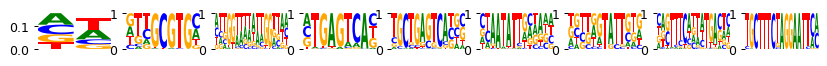

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 01:50:57.499203
	Loss: 231.020 , R2: 0.001
	Training time (model/function): (11.053s / 11.053s)
		per epoch (model/function): (0.790s/ 0.790s)
		per 1k samples: 0.320s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924851827896342, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.34it/s]


Current time: 2024-06-19 01:51:09.067784
	Loss: 191.699 , R2: 0.001
	Training time (model/function): (22.232s / 11.179s)
		per epoch (model/function): (1.588s/ 0.799s)
		per 1k samples: 0.324s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924851827896342, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 01:51:20.493128
	Loss: 166.984 , R2: 0.001
	Training time (model/function): (33.269s / 11.036s)
		per epoch (model/function): (2.376s/ 0.788s)
		per 1k samples: 0.320s
best loss 166.984
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924851827896342, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:51:32.447122
	Loss: 159.793 , R2: 0.002
	Training time (model/function): (44.365s / 11.096s)
		per epoch (model/function): (3.169s/ 0.793s)
		per 1k samples: 0.322s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924851827896342, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 01:51:43.873754
	Loss: 150.366 , R2: 0.003
	Training time (model/function): (55.403s / 11.038s)
		per epoch (model/function): (3.957s/ 0.788s)
		per 1k samples: 0.320s
best loss 150.366
last five r2 values, by sequential filter optimization: ['0.001', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924851827896342, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.34it/s]


Current time: 2024-06-19 01:51:55.810774
	Loss: 151.251 , R2: 0.003
	Training time (model/function): (66.574s / 11.171s)
		per epoch (model/function): (4.755s/ 0.798s)
		per 1k samples: 0.324s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924851827896342, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:10<00:00,  1.37it/s]


Current time: 2024-06-19 01:52:07.132560
	Loss: 145.997 , R2: 0.003
	Training time (model/function): (77.507s / 10.933s)
		per epoch (model/function): (5.536s/ 0.781s)
		per 1k samples: 0.317s
best loss 145.997
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924851827896342, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:52:19.088928
	Loss: 149.016 , R2: 0.003
	Training time (model/function): (88.608s / 11.101s)
		per epoch (model/function): (6.329s/ 0.793s)
		per 1k samples: 0.322s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924851827896342, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 01:52:30.524394
	Loss: 144.854 , R2: 0.003
	Training time (model/function): (99.655s / 11.047s)
		per epoch (model/function): (7.118s/ 0.789s)
		per 1k samples: 0.320s
best loss 144.854
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924851827896342, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.34it/s]


Current time: 2024-06-19 01:52:42.464450
	Loss: 148.436 , R2: 0.004
	Training time (model/function): (110.829s / 11.174s)
		per epoch (model/function): (7.916s/ 0.798s)
		per 1k samples: 0.324s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924851827896342, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:10<00:00,  1.37it/s]


Current time: 2024-06-19 01:52:53.843967
	Loss: 144.556 , R2: 0.004
	Training time (model/function): (121.818s / 10.990s)
		per epoch (model/function): (8.701s/ 0.785s)
		per 1k samples: 0.318s
best loss 144.556
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003', '0.003', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924851827896342, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 121.81846141815186s
Time per epoch (total): 0.028 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_2/model_1.pt
/home/ilibarra/workspace/t

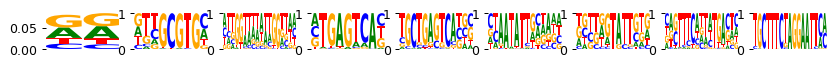

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.21it/s]


Current time: 2024-06-19 01:53:02.781461
	Loss: 228.820 , R2: 0.002
	Training time (model/function): (2.432s / 2.432s)
		per epoch (model/function): (0.174s/ 0.174s)
		per 1k samples: 0.071s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9927752456424918, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.01it/s]


Current time: 2024-06-19 01:53:05.678115
	Loss: 191.698 , R2: 0.003
	Training time (model/function): (4.941s / 2.509s)
		per epoch (model/function): (0.353s/ 0.179s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9927752456424918, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.22it/s]


Current time: 2024-06-19 01:53:08.495987
	Loss: 166.984 , R2: 0.003
	Training time (model/function): (7.370s / 2.429s)
		per epoch (model/function): (0.526s/ 0.173s)
		per 1k samples: 0.071s
best loss 166.984
last five r2 values, by sequential filter optimization: ['0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9927752456424918, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.17it/s]


Current time: 2024-06-19 01:53:11.813958
	Loss: 159.786 , R2: 0.004
	Training time (model/function): (9.818s / 2.448s)
		per epoch (model/function): (0.701s/ 0.175s)
		per 1k samples: 0.071s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9927752456424918, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.31it/s]


Current time: 2024-06-19 01:53:14.601355
	Loss: 150.365 , R2: 0.004
	Training time (model/function): (12.216s / 2.398s)
		per epoch (model/function): (0.873s/ 0.171s)
		per 1k samples: 0.070s
best loss 150.365
last five r2 values, by sequential filter optimization: ['0.003', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9927752456424918, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.16it/s]


Current time: 2024-06-19 01:53:17.902753
	Loss: 151.241 , R2: 0.004
	Training time (model/function): (14.667s / 2.451s)
		per epoch (model/function): (1.048s/ 0.175s)
		per 1k samples: 0.071s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9927752456424918, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.36it/s]


Current time: 2024-06-19 01:53:20.749269
	Loss: 145.996 , R2: 0.004
	Training time (model/function): (17.043s / 2.376s)
		per epoch (model/function): (1.217s/ 0.170s)
		per 1k samples: 0.069s
best loss 145.996
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9927752456424918, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.16it/s]


Current time: 2024-06-19 01:53:24.055522
	Loss: 148.999 , R2: 0.004
	Training time (model/function): (19.494s / 2.452s)
		per epoch (model/function): (1.392s/ 0.175s)
		per 1k samples: 0.071s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9927752456424918, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.42it/s]


Current time: 2024-06-19 01:53:26.799394
	Loss: 144.854 , R2: 0.004
	Training time (model/function): (21.847s / 2.353s)
		per epoch (model/function): (1.561s/ 0.168s)
		per 1k samples: 0.068s
best loss 144.854
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9927752456424918, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.16it/s]


Current time: 2024-06-19 01:53:30.108017
	Loss: 148.416 , R2: 0.005
	Training time (model/function): (24.303s / 2.456s)
		per epoch (model/function): (1.736s/ 0.175s)
		per 1k samples: 0.071s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9927752456424918, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.41it/s]


Current time: 2024-06-19 01:53:32.852639
	Loss: 144.555 , R2: 0.005
	Training time (model/function): (26.660s / 2.357s)
		per epoch (model/function): (1.904s/ 0.168s)
		per 1k samples: 0.069s
best loss 144.555
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004', '0.004', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9927752456424918, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 26.65999412536621s
Time per epoch (total): 0.006 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_2/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


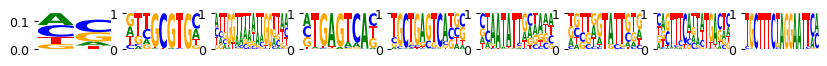

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:53:49.606336
	Loss: 231.062 , R2: 0.001
	Training time (model/function): (11.106s / 11.106s)
		per epoch (model/function): (0.793s/ 0.793s)
		per 1k samples: 0.323s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992498011795635, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 01:54:01.133217
	Loss: 191.699 , R2: 0.001
	Training time (model/function): (22.147s / 11.041s)
		per epoch (model/function): (1.582s/ 0.789s)
		per 1k samples: 0.321s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992498011795635, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:10<00:00,  1.37it/s]


Current time: 2024-06-19 01:54:12.515397
	Loss: 166.984 , R2: 0.001
	Training time (model/function): (33.140s / 10.992s)
		per epoch (model/function): (2.367s/ 0.785s)
		per 1k samples: 0.320s
best loss 166.984
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992498011795635, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:54:24.474704
	Loss: 159.793 , R2: 0.002
	Training time (model/function): (44.239s / 11.099s)
		per epoch (model/function): (3.160s/ 0.793s)
		per 1k samples: 0.323s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992498011795635, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.34it/s]


Current time: 2024-06-19 01:54:36.155963
	Loss: 150.366 , R2: 0.003
	Training time (model/function): (55.442s / 11.203s)
		per epoch (model/function): (3.960s/ 0.800s)
		per 1k samples: 0.326s
best loss 150.366
last five r2 values, by sequential filter optimization: ['0.001', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992498011795635, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:54:48.120509
	Loss: 151.250 , R2: 0.003
	Training time (model/function): (66.548s / 11.106s)
		per epoch (model/function): (4.753s/ 0.793s)
		per 1k samples: 0.323s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992498011795635, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:10<00:00,  1.37it/s]


Current time: 2024-06-19 01:54:59.467102
	Loss: 145.997 , R2: 0.003
	Training time (model/function): (77.503s / 10.955s)
		per epoch (model/function): (5.536s/ 0.783s)
		per 1k samples: 0.318s
best loss 145.997
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992498011795635, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.34it/s]


Current time: 2024-06-19 01:55:11.426804
	Loss: 149.015 , R2: 0.003
	Training time (model/function): (88.694s / 11.191s)
		per epoch (model/function): (6.335s/ 0.799s)
		per 1k samples: 0.325s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992498011795635, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:10<00:00,  1.37it/s]


Current time: 2024-06-19 01:55:22.841954
	Loss: 144.854 , R2: 0.003
	Training time (model/function): (99.628s / 10.935s)
		per epoch (model/function): (7.116s/ 0.781s)
		per 1k samples: 0.318s
best loss 144.854
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992498011795635, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:55:34.802571
	Loss: 148.431 , R2: 0.004
	Training time (model/function): (110.727s / 11.099s)
		per epoch (model/function): (7.909s/ 0.793s)
		per 1k samples: 0.323s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992498011795635, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:10<00:00,  1.37it/s]


Current time: 2024-06-19 01:55:46.126565
	Loss: 144.556 , R2: 0.004
	Training time (model/function): (121.658s / 10.931s)
		per epoch (model/function): (8.690s/ 0.781s)
		per 1k samples: 0.318s
best loss 144.556
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003', '0.003', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.992498011795635, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 121.65782833099365s
Time per epoch (total): 0.028 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_3/model_1.pt
/home/ilibarra/workspace/th

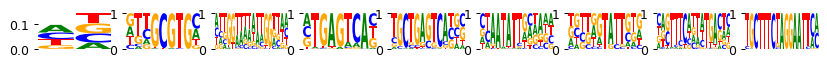

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.75it/s]


Current time: 2024-06-19 01:55:55.195253
	Loss: 228.820 , R2: 0.002
	Training time (model/function): (2.626s / 2.626s)
		per epoch (model/function): (0.188s/ 0.188s)
		per 1k samples: 0.077s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924304288084094, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.02it/s]


Current time: 2024-06-19 01:55:58.097631
	Loss: 191.698 , R2: 0.003
	Training time (model/function): (5.136s / 2.509s)
		per epoch (model/function): (0.367s/ 0.179s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924304288084094, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.95it/s]


Current time: 2024-06-19 01:56:01.028647
	Loss: 166.984 , R2: 0.003
	Training time (model/function): (7.675s / 2.539s)
		per epoch (model/function): (0.548s/ 0.181s)
		per 1k samples: 0.074s
best loss 166.984
last five r2 values, by sequential filter optimization: ['0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924304288084094, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.00it/s]


Current time: 2024-06-19 01:56:04.407990
	Loss: 159.786 , R2: 0.004
	Training time (model/function): (10.191s / 2.517s)
		per epoch (model/function): (0.728s/ 0.180s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924304288084094, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.09it/s]


Current time: 2024-06-19 01:56:07.279840
	Loss: 150.365 , R2: 0.004
	Training time (model/function): (12.670s / 2.478s)
		per epoch (model/function): (0.905s/ 0.177s)
		per 1k samples: 0.072s
best loss 150.365
last five r2 values, by sequential filter optimization: ['0.003', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924304288084094, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.98it/s]


Current time: 2024-06-19 01:56:10.667475
	Loss: 151.242 , R2: 0.004
	Training time (model/function): (15.194s / 2.524s)
		per epoch (model/function): (1.085s/ 0.180s)
		per 1k samples: 0.074s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924304288084094, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.40it/s]


Current time: 2024-06-19 01:56:13.851796
	Loss: 145.996 , R2: 0.004
	Training time (model/function): (17.987s / 2.793s)
		per epoch (model/function): (1.285s/ 0.199s)
		per 1k samples: 0.081s
best loss 145.996
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924304288084094, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.99it/s]


Current time: 2024-06-19 01:56:17.231702
	Loss: 148.999 , R2: 0.004
	Training time (model/function): (20.505s / 2.519s)
		per epoch (model/function): (1.465s/ 0.180s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924304288084094, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.22it/s]


Current time: 2024-06-19 01:56:20.140456
	Loss: 144.854 , R2: 0.005
	Training time (model/function): (22.934s / 2.428s)
		per epoch (model/function): (1.638s/ 0.173s)
		per 1k samples: 0.071s
best loss 144.854
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924304288084094, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.99it/s]


Current time: 2024-06-19 01:56:23.439375
	Loss: 148.417 , R2: 0.005
	Training time (model/function): (25.456s / 2.523s)
		per epoch (model/function): (1.818s/ 0.180s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924304288084094, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.02it/s]


Current time: 2024-06-19 01:56:26.340121
	Loss: 144.555 , R2: 0.005
	Training time (model/function): (27.966s / 2.510s)
		per epoch (model/function): (1.998s/ 0.179s)
		per 1k samples: 0.073s
best loss 144.555
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9924304288084094, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 27.966055631637573s
Time per epoch (total): 0.006 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_3/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


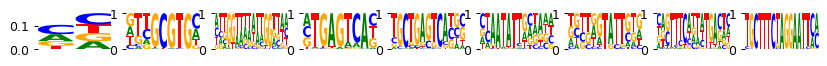

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:56:43.143415
	Loss: 231.012 , R2: 0.001
	Training time (model/function): (11.135s / 11.135s)
		per epoch (model/function): (0.795s/ 0.795s)
		per 1k samples: 0.324s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921908467855424, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:56:54.686343
	Loss: 191.699 , R2: 0.001
	Training time (model/function): (22.285s / 11.150s)
		per epoch (model/function): (1.592s/ 0.796s)
		per 1k samples: 0.325s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921908467855424, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:57:06.169362
	Loss: 166.984 , R2: 0.001
	Training time (model/function): (33.375s / 11.090s)
		per epoch (model/function): (2.384s/ 0.792s)
		per 1k samples: 0.323s
best loss 166.984
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921908467855424, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.34it/s]


Current time: 2024-06-19 01:57:18.185142
	Loss: 159.793 , R2: 0.002
	Training time (model/function): (44.611s / 11.236s)
		per epoch (model/function): (3.187s/ 0.803s)
		per 1k samples: 0.327s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921908467855424, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:10<00:00,  1.37it/s]


Current time: 2024-06-19 01:57:29.666247
	Loss: 150.366 , R2: 0.003
	Training time (model/function): (55.609s / 10.998s)
		per epoch (model/function): (3.972s/ 0.786s)
		per 1k samples: 0.320s
best loss 150.366
last five r2 values, by sequential filter optimization: ['0.001', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921908467855424, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:57:41.575123
	Loss: 151.250 , R2: 0.003
	Training time (model/function): (66.741s / 11.132s)
		per epoch (model/function): (4.767s/ 0.795s)
		per 1k samples: 0.324s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921908467855424, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 01:57:53.033804
	Loss: 145.997 , R2: 0.003
	Training time (model/function): (77.808s / 11.066s)
		per epoch (model/function): (5.558s/ 0.790s)
		per 1k samples: 0.322s
best loss 145.997
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921908467855424, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.34it/s]


Current time: 2024-06-19 01:58:05.044478
	Loss: 149.015 , R2: 0.003
	Training time (model/function): (89.035s / 11.227s)
		per epoch (model/function): (6.360s/ 0.802s)
		per 1k samples: 0.327s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921908467855424, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:10<00:00,  1.37it/s]


Current time: 2024-06-19 01:58:16.435321
	Loss: 144.854 , R2: 0.003
	Training time (model/function): (100.033s / 10.998s)
		per epoch (model/function): (7.145s/ 0.786s)
		per 1k samples: 0.320s
best loss 144.854
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921908467855424, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:58:28.466155
	Loss: 148.434 , R2: 0.004
	Training time (model/function): (111.199s / 11.166s)
		per epoch (model/function): (7.943s/ 0.798s)
		per 1k samples: 0.325s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921908467855424, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 01:58:39.932213
	Loss: 144.556 , R2: 0.004
	Training time (model/function): (122.272s / 11.072s)
		per epoch (model/function): (8.734s/ 0.791s)
		per 1k samples: 0.323s
best loss 144.556
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003', '0.003', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921908467855424, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 122.27178263664246s
Time per epoch (total): 0.028 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_4/model_1.pt
/home/ilibarra/workspace/t

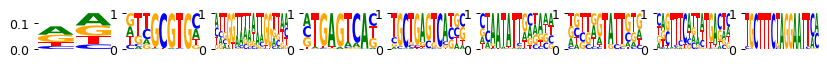

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.76it/s]


Current time: 2024-06-19 01:58:49.015190
	Loss: 228.820 , R2: 0.002
	Training time (model/function): (2.622s / 2.622s)
		per epoch (model/function): (0.187s/ 0.187s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9926637736451027, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.01it/s]


Current time: 2024-06-19 01:58:51.919183
	Loss: 191.698 , R2: 0.003
	Training time (model/function): (5.132s / 2.511s)
		per epoch (model/function): (0.367s/ 0.179s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9926637736451027, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.94it/s]


Current time: 2024-06-19 01:58:54.851257
	Loss: 166.984 , R2: 0.003
	Training time (model/function): (7.672s / 2.540s)
		per epoch (model/function): (0.548s/ 0.181s)
		per 1k samples: 0.074s
best loss 166.984
last five r2 values, by sequential filter optimization: ['0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9926637736451027, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.99it/s]


Current time: 2024-06-19 01:58:58.235192
	Loss: 159.786 , R2: 0.004
	Training time (model/function): (10.195s / 2.523s)
		per epoch (model/function): (0.728s/ 0.180s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9926637736451027, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.15it/s]


Current time: 2024-06-19 01:59:01.085526
	Loss: 150.365 , R2: 0.004
	Training time (model/function): (12.652s / 2.457s)
		per epoch (model/function): (0.904s/ 0.175s)
		per 1k samples: 0.071s
best loss 150.365
last five r2 values, by sequential filter optimization: ['0.003', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9926637736451027, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.01it/s]


Current time: 2024-06-19 01:59:04.456593
	Loss: 151.242 , R2: 0.004
	Training time (model/function): (15.249s / 2.598s)
		per epoch (model/function): (1.089s/ 0.186s)
		per 1k samples: 0.076s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9926637736451027, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.11it/s]


Current time: 2024-06-19 01:59:07.323891
	Loss: 145.996 , R2: 0.004
	Training time (model/function): (17.722s / 2.473s)
		per epoch (model/function): (1.266s/ 0.177s)
		per 1k samples: 0.072s
best loss 145.996
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9926637736451027, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.98it/s]


Current time: 2024-06-19 01:59:10.712835
	Loss: 148.999 , R2: 0.004
	Training time (model/function): (20.245s / 2.523s)
		per epoch (model/function): (1.446s/ 0.180s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9926637736451027, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.18it/s]


Current time: 2024-06-19 01:59:13.668619
	Loss: 144.854 , R2: 0.004
	Training time (model/function): (22.690s / 2.445s)
		per epoch (model/function): (1.621s/ 0.175s)
		per 1k samples: 0.071s
best loss 144.854
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9926637736451027, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  5.98it/s]


Current time: 2024-06-19 01:59:16.986159
	Loss: 148.420 , R2: 0.005
	Training time (model/function): (25.215s / 2.525s)
		per epoch (model/function): (1.801s/ 0.180s)
		per 1k samples: 0.073s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9926637736451027, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:02<00:00,  6.03it/s]


Current time: 2024-06-19 01:59:19.887414
	Loss: 144.555 , R2: 0.005
	Training time (model/function): (27.722s / 2.507s)
		per epoch (model/function): (1.980s/ 0.179s)
		per 1k samples: 0.073s
best loss 144.555
last five r2 values, by sequential filter optimization: ['0.003', '0.004', '0.004', '0.004', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9926637736451027, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 27.72213578224182s
Time per epoch (total): 0.006 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_4/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


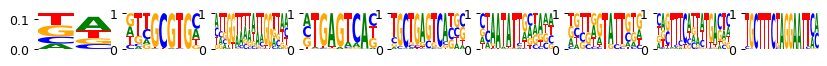

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.32it/s]


Current time: 2024-06-19 01:59:36.853216
	Loss: 230.912 , R2: 0.001
	Training time (model/function): (11.400s / 11.400s)
		per epoch (model/function): (0.814s/ 0.814s)
		per 1k samples: 0.332s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923323774173509, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 01:59:48.494537
	Loss: 191.699 , R2: 0.001
	Training time (model/function): (22.556s / 11.156s)
		per epoch (model/function): (1.611s/ 0.797s)
		per 1k samples: 0.325s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923323774173509, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 01:59:59.917017
	Loss: 166.984 , R2: 0.001
	Training time (model/function): (33.584s / 11.028s)
		per epoch (model/function): (2.399s/ 0.788s)
		per 1k samples: 0.321s
best loss 166.984
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923323774173509, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.34it/s]


Current time: 2024-06-19 02:00:11.929440
	Loss: 159.793 , R2: 0.002
	Training time (model/function): (44.815s / 11.231s)
		per epoch (model/function): (3.201s/ 0.802s)
		per 1k samples: 0.327s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923323774173509, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 02:00:23.471803
	Loss: 150.366 , R2: 0.003
	Training time (model/function): (55.873s / 11.058s)
		per epoch (model/function): (3.991s/ 0.790s)
		per 1k samples: 0.322s
best loss 150.366
last five r2 values, by sequential filter optimization: ['0.001', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923323774173509, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.35it/s]


Current time: 2024-06-19 02:00:35.398447
	Loss: 151.251 , R2: 0.003
	Training time (model/function): (67.023s / 11.150s)
		per epoch (model/function): (4.787s/ 0.796s)
		per 1k samples: 0.324s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923323774173509, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 02:00:46.828048
	Loss: 145.997 , R2: 0.003
	Training time (model/function): (78.058s / 11.035s)
		per epoch (model/function): (5.576s/ 0.788s)
		per 1k samples: 0.321s
best loss 145.997
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923323774173509, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.34it/s]


Current time: 2024-06-19 02:00:58.851528
	Loss: 149.015 , R2: 0.003
	Training time (model/function): (89.300s / 11.242s)
		per epoch (model/function): (6.379s/ 0.803s)
		per 1k samples: 0.327s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923323774173509, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:10<00:00,  1.37it/s]


Current time: 2024-06-19 02:01:10.216881
	Loss: 144.854 , R2: 0.003
	Training time (model/function): (100.271s / 10.971s)
		per epoch (model/function): (7.162s/ 0.784s)
		per 1k samples: 0.319s
best loss 144.854
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923323774173509, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.34it/s]


Current time: 2024-06-19 02:01:22.271217
	Loss: 148.430 , R2: 0.004
	Training time (model/function): (111.461s / 11.190s)
		per epoch (model/function): (7.962s/ 0.799s)
		per 1k samples: 0.326s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923323774173509, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:11<00:00,  1.36it/s]


Current time: 2024-06-19 02:01:33.739296
	Loss: 144.556 , R2: 0.004
	Training time (model/function): (122.536s / 11.074s)
		per epoch (model/function): (8.753s/ 0.791s)
		per 1k samples: 0.322s
best loss 144.556
last five r2 values, by sequential filter optimization: ['0.001', '0.003', '0.003', '0.003', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9923323774173509, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 122.53567814826965s
Time per epoch (total): 0.028 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs1000/pwms/fold_4/running_time_1.pkl
40

/home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/pancreas_multiome_2022_processed_atac_obs1000_var3000.h5ad
pancreatic_endocrinogenesis (1000, 3000)
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrino

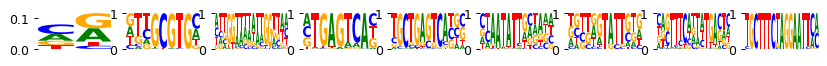

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.97it/s]


Current time: 2024-06-19 02:01:44.609724
	Loss: 219.628 , R2: 0.002
	Training time (model/function): (3.802s / 3.802s)
		per epoch (model/function): (0.272s/ 0.272s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917149268873884, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.12it/s]


Current time: 2024-06-19 02:01:48.828009
	Loss: 182.078 , R2: 0.002
	Training time (model/function): (7.466s / 3.664s)
		per epoch (model/function): (0.533s/ 0.262s)
		per 1k samples: 0.099s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917149268873884, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.22it/s]


Current time: 2024-06-19 02:01:52.869589
	Loss: 160.067 , R2: 0.002
	Training time (model/function): (11.042s / 3.577s)
		per epoch (model/function): (0.789s/ 0.255s)
		per 1k samples: 0.096s
best loss 160.067
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917149268873884, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.11it/s]


Current time: 2024-06-19 02:01:57.546985
	Loss: 155.392 , R2: 0.002
	Training time (model/function): (14.717s / 3.675s)
		per epoch (model/function): (1.051s/ 0.262s)
		per 1k samples: 0.099s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917149268873884, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.20it/s]


Current time: 2024-06-19 02:02:01.602887
	Loss: 147.737 , R2: 0.002
	Training time (model/function): (18.309s / 3.592s)
		per epoch (model/function): (1.308s/ 0.257s)
		per 1k samples: 0.097s
best loss 147.737
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917149268873884, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  3.99it/s]


Current time: 2024-06-19 02:02:06.307273
	Loss: 149.726 , R2: 0.002
	Training time (model/function): (22.092s / 3.783s)
		per epoch (model/function): (1.578s/ 0.270s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917149268873884, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.24it/s]


Current time: 2024-06-19 02:02:10.423153
	Loss: 145.146 , R2: 0.002
	Training time (model/function): (25.654s / 3.561s)
		per epoch (model/function): (1.832s/ 0.254s)
		per 1k samples: 0.096s
best loss 145.146
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917149268873884, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.14it/s]


Current time: 2024-06-19 02:02:14.992336
	Loss: 148.530 , R2: 0.002
	Training time (model/function): (29.304s / 3.650s)
		per epoch (model/function): (2.093s/ 0.261s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917149268873884, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.29it/s]


Current time: 2024-06-19 02:02:19.062038
	Loss: 144.602 , R2: 0.002
	Training time (model/function): (32.824s / 3.520s)
		per epoch (model/function): (2.345s/ 0.251s)
		per 1k samples: 0.095s
best loss 144.602
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917149268873884, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.13it/s]


Current time: 2024-06-19 02:02:23.636923
	Loss: 148.281 , R2: 0.002
	Training time (model/function): (36.482s / 3.658s)
		per epoch (model/function): (2.606s/ 0.261s)
		per 1k samples: 0.099s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917149268873884, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.16it/s]


Current time: 2024-06-19 02:02:27.727527
	Loss: 144.488 , R2: 0.002
	Training time (model/function): (40.107s / 3.625s)
		per epoch (model/function): (2.865s/ 0.259s)
		per 1k samples: 0.098s
best loss 144.488
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917149268873884, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 40.1068959236145s
Time per epoch (total): 0.009 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_0/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None

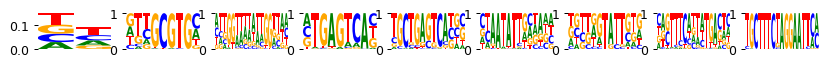

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:02:47.879089
	Loss: 220.368 , R2: 0.001
	Training time (model/function): (13.858s / 13.858s)
		per epoch (model/function): (0.990s/ 0.990s)
		per 1k samples: 0.373s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9914746111129235, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:03:02.274002
	Loss: 182.078 , R2: 0.001
	Training time (model/function): (27.783s / 13.925s)
		per epoch (model/function): (1.984s/ 0.995s)
		per 1k samples: 0.375s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9914746111129235, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:03:16.561550
	Loss: 160.066 , R2: 0.001
	Training time (model/function): (41.602s / 13.820s)
		per epoch (model/function): (2.972s/ 0.987s)
		per 1k samples: 0.372s
best loss 160.066
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9914746111129235, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.07it/s]


Current time: 2024-06-19 02:03:31.484066
	Loss: 155.397 , R2: 0.001
	Training time (model/function): (55.605s / 14.002s)
		per epoch (model/function): (3.972s/ 1.000s)
		per 1k samples: 0.377s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9914746111129235, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:03:45.768085
	Loss: 147.737 , R2: 0.001
	Training time (model/function): (69.334s / 13.729s)
		per epoch (model/function): (4.952s/ 0.981s)
		per 1k samples: 0.370s
best loss 147.737
last five r2 values, by sequential filter optimization: ['0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9914746111129235, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:04:00.664701
	Loss: 149.740 , R2: 0.001
	Training time (model/function): (83.309s / 13.975s)
		per epoch (model/function): (5.951s/ 0.998s)
		per 1k samples: 0.376s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9914746111129235, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:04:14.928412
	Loss: 145.145 , R2: 0.001
	Training time (model/function): (97.105s / 13.796s)
		per epoch (model/function): (6.936s/ 0.985s)
		per 1k samples: 0.372s
best loss 145.145
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9914746111129235, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.07it/s]


Current time: 2024-06-19 02:04:29.874811
	Loss: 148.553 , R2: 0.001
	Training time (model/function): (111.132s / 14.027s)
		per epoch (model/function): (7.938s/ 1.002s)
		per 1k samples: 0.378s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9914746111129235, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.10it/s]


Current time: 2024-06-19 02:04:44.035864
	Loss: 144.602 , R2: 0.001
	Training time (model/function): (124.827s / 13.695s)
		per epoch (model/function): (8.916s/ 0.978s)
		per 1k samples: 0.369s
best loss 144.602
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9914746111129235, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:04:58.952600
	Loss: 148.303 , R2: 0.001
	Training time (model/function): (138.738s / 13.911s)
		per epoch (model/function): (9.910s/ 0.994s)
		per 1k samples: 0.375s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9914746111129235, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:05:13.220538
	Loss: 144.488 , R2: 0.001
	Training time (model/function): (152.539s / 13.801s)
		per epoch (model/function): (10.896s/ 0.986s)
		per 1k samples: 0.372s
best loss 144.488
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9914746111129235, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 152.53884291648865s
Time per epoch (total): 0.035 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs10

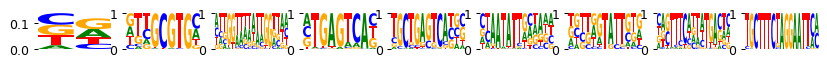

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.14it/s]


Current time: 2024-06-19 02:05:24.346875
	Loss: 219.628 , R2: 0.002
	Training time (model/function): (3.644s / 3.644s)
		per epoch (model/function): (0.260s/ 0.260s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921478814012055, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.13it/s]


Current time: 2024-06-19 02:05:28.460619
	Loss: 182.078 , R2: 0.002
	Training time (model/function): (7.298s / 3.655s)
		per epoch (model/function): (0.521s/ 0.261s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921478814012055, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.25it/s]


Current time: 2024-06-19 02:05:32.559681
	Loss: 160.067 , R2: 0.002
	Training time (model/function): (10.851s / 3.553s)
		per epoch (model/function): (0.775s/ 0.254s)
		per 1k samples: 0.096s
best loss 160.067
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921478814012055, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.15it/s]


Current time: 2024-06-19 02:05:37.108011
	Loss: 155.392 , R2: 0.002
	Training time (model/function): (14.492s / 3.641s)
		per epoch (model/function): (1.035s/ 0.260s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921478814012055, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.14it/s]


Current time: 2024-06-19 02:05:41.212939
	Loss: 147.737 , R2: 0.002
	Training time (model/function): (18.139s / 3.648s)
		per epoch (model/function): (1.296s/ 0.261s)
		per 1k samples: 0.098s
best loss 147.737
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921478814012055, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.15it/s]


Current time: 2024-06-19 02:05:45.846633
	Loss: 149.726 , R2: 0.002
	Training time (model/function): (21.780s / 3.641s)
		per epoch (model/function): (1.556s/ 0.260s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921478814012055, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.25it/s]


Current time: 2024-06-19 02:05:49.857225
	Loss: 145.146 , R2: 0.002
	Training time (model/function): (25.334s / 3.553s)
		per epoch (model/function): (1.810s/ 0.254s)
		per 1k samples: 0.096s
best loss 145.146
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921478814012055, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.05it/s]


Current time: 2024-06-19 02:05:54.486759
	Loss: 148.530 , R2: 0.002
	Training time (model/function): (29.058s / 3.724s)
		per epoch (model/function): (2.076s/ 0.266s)
		per 1k samples: 0.100s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921478814012055, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.29it/s]


Current time: 2024-06-19 02:05:58.467444
	Loss: 144.602 , R2: 0.002
	Training time (model/function): (32.580s / 3.523s)
		per epoch (model/function): (2.327s/ 0.252s)
		per 1k samples: 0.095s
best loss 144.602
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921478814012055, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.15it/s]


Current time: 2024-06-19 02:06:03.094749
	Loss: 148.281 , R2: 0.002
	Training time (model/function): (36.218s / 3.638s)
		per epoch (model/function): (2.587s/ 0.260s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921478814012055, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.27it/s]


Current time: 2024-06-19 02:06:07.175642
	Loss: 144.488 , R2: 0.002
	Training time (model/function): (39.755s / 3.536s)
		per epoch (model/function): (2.840s/ 0.253s)
		per 1k samples: 0.095s
best loss 144.488
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9921478814012055, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 39.754509925842285s
Time per epoch (total): 0.009 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_1/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order No

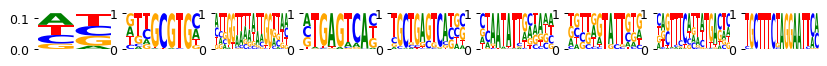

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:06:27.271900
	Loss: 220.391 , R2: 0.001
	Training time (model/function): (13.861s / 13.861s)
		per epoch (model/function): (0.990s/ 0.990s)
		per 1k samples: 0.373s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915766919651677, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:06:41.593491
	Loss: 182.078 , R2: 0.001
	Training time (model/function): (27.723s / 13.862s)
		per epoch (model/function): (1.980s/ 0.990s)
		per 1k samples: 0.373s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915766919651677, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:06:55.826536
	Loss: 160.066 , R2: 0.001
	Training time (model/function): (41.497s / 13.774s)
		per epoch (model/function): (2.964s/ 0.984s)
		per 1k samples: 0.371s
best loss 160.066
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915766919651677, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:07:10.694433
	Loss: 155.397 , R2: 0.001
	Training time (model/function): (55.459s / 13.962s)
		per epoch (model/function): (3.961s/ 0.997s)
		per 1k samples: 0.376s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915766919651677, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.10it/s]


Current time: 2024-06-19 02:07:24.915791
	Loss: 147.737 , R2: 0.001
	Training time (model/function): (69.133s / 13.674s)
		per epoch (model/function): (4.938s/ 0.977s)
		per 1k samples: 0.368s
best loss 147.737
last five r2 values, by sequential filter optimization: ['0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915766919651677, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:07:39.782621
	Loss: 149.740 , R2: 0.001
	Training time (model/function): (83.093s / 13.960s)
		per epoch (model/function): (5.935s/ 0.997s)
		per 1k samples: 0.376s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915766919651677, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:07:54.034026
	Loss: 145.145 , R2: 0.001
	Training time (model/function): (96.884s / 13.792s)
		per epoch (model/function): (6.920s/ 0.985s)
		per 1k samples: 0.371s
best loss 145.145
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915766919651677, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.07it/s]


Current time: 2024-06-19 02:08:08.935225
	Loss: 148.553 , R2: 0.001
	Training time (model/function): (110.878s / 13.994s)
		per epoch (model/function): (7.920s/ 1.000s)
		per 1k samples: 0.377s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915766919651677, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.10it/s]


Current time: 2024-06-19 02:08:23.066758
	Loss: 144.602 , R2: 0.001
	Training time (model/function): (124.549s / 13.670s)
		per epoch (model/function): (8.896s/ 0.976s)
		per 1k samples: 0.368s
best loss 144.602
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915766919651677, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:08:37.973324
	Loss: 148.304 , R2: 0.001
	Training time (model/function): (138.460s / 13.911s)
		per epoch (model/function): (9.890s/ 0.994s)
		per 1k samples: 0.375s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915766919651677, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:08:52.187436
	Loss: 144.488 , R2: 0.001
	Training time (model/function): (152.213s / 13.752s)
		per epoch (model/function): (10.872s/ 0.982s)
		per 1k samples: 0.370s
best loss 144.488
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915766919651677, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 152.21269488334656s
Time per epoch (total): 0.035 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs10

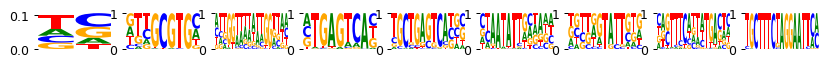

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.15it/s]


Current time: 2024-06-19 02:09:03.226669
	Loss: 219.627 , R2: 0.002
	Training time (model/function): (3.638s / 3.638s)
		per epoch (model/function): (0.260s/ 0.260s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9925055927031833, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.14it/s]


Current time: 2024-06-19 02:09:07.332593
	Loss: 182.078 , R2: 0.002
	Training time (model/function): (7.281s / 3.643s)
		per epoch (model/function): (0.520s/ 0.260s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9925055927031833, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.25it/s]


Current time: 2024-06-19 02:09:11.426337
	Loss: 160.067 , R2: 0.002
	Training time (model/function): (10.829s / 3.547s)
		per epoch (model/function): (0.773s/ 0.253s)
		per 1k samples: 0.096s
best loss 160.067
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9925055927031833, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.11it/s]


Current time: 2024-06-19 02:09:16.020299
	Loss: 155.392 , R2: 0.002
	Training time (model/function): (14.498s / 3.669s)
		per epoch (model/function): (1.036s/ 0.262s)
		per 1k samples: 0.099s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9925055927031833, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.12it/s]


Current time: 2024-06-19 02:09:20.140082
	Loss: 147.737 , R2: 0.002
	Training time (model/function): (18.158s / 3.660s)
		per epoch (model/function): (1.297s/ 0.261s)
		per 1k samples: 0.099s
best loss 147.737
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9925055927031833, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.16it/s]


Current time: 2024-06-19 02:09:24.760421
	Loss: 149.726 , R2: 0.002
	Training time (model/function): (21.783s / 3.625s)
		per epoch (model/function): (1.556s/ 0.259s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9925055927031833, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.26it/s]


Current time: 2024-06-19 02:09:28.766690
	Loss: 145.146 , R2: 0.002
	Training time (model/function): (25.328s / 3.545s)
		per epoch (model/function): (1.809s/ 0.253s)
		per 1k samples: 0.096s
best loss 145.146
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9925055927031833, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.05it/s]


Current time: 2024-06-19 02:09:33.404467
	Loss: 148.531 , R2: 0.002
	Training time (model/function): (29.054s / 3.726s)
		per epoch (model/function): (2.075s/ 0.266s)
		per 1k samples: 0.100s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9925055927031833, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.31it/s]


Current time: 2024-06-19 02:09:37.367111
	Loss: 144.602 , R2: 0.002
	Training time (model/function): (32.555s / 3.501s)
		per epoch (model/function): (2.325s/ 0.250s)
		per 1k samples: 0.094s
best loss 144.602
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9925055927031833, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.16it/s]


Current time: 2024-06-19 02:09:41.992463
	Loss: 148.280 , R2: 0.002
	Training time (model/function): (36.181s / 3.626s)
		per epoch (model/function): (2.584s/ 0.259s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9925055927031833, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.27it/s]


Current time: 2024-06-19 02:09:46.079584
	Loss: 144.488 , R2: 0.002
	Training time (model/function): (39.717s / 3.535s)
		per epoch (model/function): (2.837s/ 0.253s)
		per 1k samples: 0.095s
best loss 144.488
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9925055927031833, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 39.716511726379395s
Time per epoch (total): 0.009 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_2/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order No

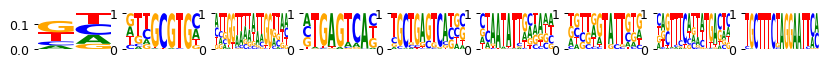

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:10:06.179985
	Loss: 220.390 , R2: 0.001
	Training time (model/function): (13.855s / 13.855s)
		per epoch (model/function): (0.990s/ 0.990s)
		per 1k samples: 0.374s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9918793376585405, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:10:20.519097
	Loss: 182.078 , R2: 0.001
	Training time (model/function): (27.732s / 13.877s)
		per epoch (model/function): (1.981s/ 0.991s)
		per 1k samples: 0.374s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9918793376585405, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:10:34.762792
	Loss: 160.066 , R2: 0.001
	Training time (model/function): (41.513s / 13.781s)
		per epoch (model/function): (2.965s/ 0.984s)
		per 1k samples: 0.372s
best loss 160.066
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9918793376585405, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:10:49.631235
	Loss: 155.397 , R2: 0.001
	Training time (model/function): (55.473s / 13.960s)
		per epoch (model/function): (3.962s/ 0.997s)
		per 1k samples: 0.376s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9918793376585405, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:11:03.912718
	Loss: 147.737 , R2: 0.001
	Training time (model/function): (69.201s / 13.728s)
		per epoch (model/function): (4.943s/ 0.981s)
		per 1k samples: 0.370s
best loss 147.737
last five r2 values, by sequential filter optimization: ['0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9918793376585405, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:11:18.738257
	Loss: 149.740 , R2: 0.001
	Training time (model/function): (83.116s / 13.915s)
		per epoch (model/function): (5.937s/ 0.994s)
		per 1k samples: 0.375s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9918793376585405, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:11:32.982315
	Loss: 145.145 , R2: 0.001
	Training time (model/function): (96.896s / 13.780s)
		per epoch (model/function): (6.921s/ 0.984s)
		per 1k samples: 0.372s
best loss 145.145
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9918793376585405, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:11:47.858373
	Loss: 148.553 , R2: 0.001
	Training time (model/function): (110.863s / 13.967s)
		per epoch (model/function): (7.919s/ 0.998s)
		per 1k samples: 0.377s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9918793376585405, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:12:02.115887
	Loss: 144.602 , R2: 0.001
	Training time (model/function): (124.659s / 13.797s)
		per epoch (model/function): (8.904s/ 0.985s)
		per 1k samples: 0.372s
best loss 144.602
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9918793376585405, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:12:16.982302
	Loss: 148.304 , R2: 0.001
	Training time (model/function): (138.530s / 13.871s)
		per epoch (model/function): (9.895s/ 0.991s)
		per 1k samples: 0.374s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9918793376585405, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:12:31.194894
	Loss: 144.488 , R2: 0.001
	Training time (model/function): (152.278s / 13.748s)
		per epoch (model/function): (10.877s/ 0.982s)
		per 1k samples: 0.371s
best loss 144.488
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9918793376585405, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 152.2776644229889s
Time per epoch (total): 0.035 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs100

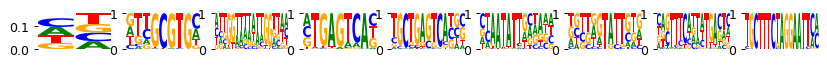

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.16it/s]


Current time: 2024-06-19 02:12:42.275576
	Loss: 219.628 , R2: 0.002
	Training time (model/function): (3.622s / 3.622s)
		per epoch (model/function): (0.259s/ 0.259s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916381131975724, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.15it/s]


Current time: 2024-06-19 02:12:46.372242
	Loss: 182.078 , R2: 0.002
	Training time (model/function): (7.258s / 3.636s)
		per epoch (model/function): (0.518s/ 0.260s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916381131975724, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.25it/s]


Current time: 2024-06-19 02:12:50.467817
	Loss: 160.067 , R2: 0.002
	Training time (model/function): (10.809s / 3.551s)
		per epoch (model/function): (0.772s/ 0.254s)
		per 1k samples: 0.096s
best loss 160.067
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916381131975724, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.14it/s]


Current time: 2024-06-19 02:12:55.018177
	Loss: 155.392 , R2: 0.002
	Training time (model/function): (14.453s / 3.643s)
		per epoch (model/function): (1.032s/ 0.260s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916381131975724, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.13it/s]


Current time: 2024-06-19 02:12:59.128941
	Loss: 147.737 , R2: 0.002
	Training time (model/function): (18.104s / 3.651s)
		per epoch (model/function): (1.293s/ 0.261s)
		per 1k samples: 0.098s
best loss 147.737
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916381131975724, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.14it/s]


Current time: 2024-06-19 02:13:03.764292
	Loss: 149.726 , R2: 0.002
	Training time (model/function): (21.749s / 3.645s)
		per epoch (model/function): (1.554s/ 0.260s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916381131975724, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.25it/s]


Current time: 2024-06-19 02:13:07.772729
	Loss: 145.146 , R2: 0.002
	Training time (model/function): (25.300s / 3.550s)
		per epoch (model/function): (1.807s/ 0.254s)
		per 1k samples: 0.096s
best loss 145.146
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916381131975724, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.04it/s]


Current time: 2024-06-19 02:13:12.409046
	Loss: 148.530 , R2: 0.002
	Training time (model/function): (29.031s / 3.732s)
		per epoch (model/function): (2.074s/ 0.267s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916381131975724, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.29it/s]


Current time: 2024-06-19 02:13:16.386508
	Loss: 144.602 , R2: 0.002
	Training time (model/function): (32.549s / 3.518s)
		per epoch (model/function): (2.325s/ 0.251s)
		per 1k samples: 0.095s
best loss 144.602
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916381131975724, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.14it/s]


Current time: 2024-06-19 02:13:21.022763
	Loss: 148.279 , R2: 0.002
	Training time (model/function): (36.193s / 3.644s)
		per epoch (model/function): (2.585s/ 0.260s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916381131975724, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.27it/s]


Current time: 2024-06-19 02:13:25.098968
	Loss: 144.488 , R2: 0.002
	Training time (model/function): (39.724s / 3.531s)
		per epoch (model/function): (2.837s/ 0.252s)
		per 1k samples: 0.095s
best loss 144.488
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916381131975724, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 39.724159717559814s
Time per epoch (total): 0.009 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_3/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order No

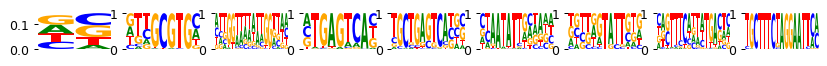

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:13:45.270933
	Loss: 220.389 , R2: 0.001
	Training time (model/function): (13.931s / 13.931s)
		per epoch (model/function): (0.995s/ 0.995s)
		per 1k samples: 0.375s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913944923525007, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:13:59.577401
	Loss: 182.078 , R2: 0.001
	Training time (model/function): (27.775s / 13.844s)
		per epoch (model/function): (1.984s/ 0.989s)
		per 1k samples: 0.373s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913944923525007, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:14:13.801604
	Loss: 160.067 , R2: 0.001
	Training time (model/function): (41.538s / 13.763s)
		per epoch (model/function): (2.967s/ 0.983s)
		per 1k samples: 0.371s
best loss 160.067
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913944923525007, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.07it/s]


Current time: 2024-06-19 02:14:28.688441
	Loss: 155.397 , R2: 0.001
	Training time (model/function): (55.517s / 13.978s)
		per epoch (model/function): (3.965s/ 0.998s)
		per 1k samples: 0.377s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913944923525007, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.10it/s]


Current time: 2024-06-19 02:14:42.957417
	Loss: 147.737 , R2: 0.001
	Training time (model/function): (69.234s / 13.718s)
		per epoch (model/function): (4.945s/ 0.980s)
		per 1k samples: 0.370s
best loss 147.737
last five r2 values, by sequential filter optimization: ['0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913944923525007, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:14:57.734030
	Loss: 149.740 , R2: 0.001
	Training time (model/function): (83.099s / 13.865s)
		per epoch (model/function): (5.936s/ 0.990s)
		per 1k samples: 0.374s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913944923525007, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:15:11.951403
	Loss: 145.145 , R2: 0.001
	Training time (model/function): (96.854s / 13.755s)
		per epoch (model/function): (6.918s/ 0.982s)
		per 1k samples: 0.371s
best loss 145.145
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913944923525007, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:15:26.796556
	Loss: 148.552 , R2: 0.001
	Training time (model/function): (110.784s / 13.930s)
		per epoch (model/function): (7.913s/ 0.995s)
		per 1k samples: 0.375s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913944923525007, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.10it/s]


Current time: 2024-06-19 02:15:40.898203
	Loss: 144.602 , R2: 0.001
	Training time (model/function): (124.426s / 13.642s)
		per epoch (model/function): (8.888s/ 0.974s)
		per 1k samples: 0.368s
best loss 144.602
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913944923525007, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:15:55.799915
	Loss: 148.303 , R2: 0.001
	Training time (model/function): (138.334s / 13.907s)
		per epoch (model/function): (9.881s/ 0.993s)
		per 1k samples: 0.375s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913944923525007, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:16:10.003745
	Loss: 144.488 , R2: 0.001
	Training time (model/function): (152.076s / 13.742s)
		per epoch (model/function): (10.863s/ 0.982s)
		per 1k samples: 0.370s
best loss 144.488
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913944923525007, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 152.0755786895752s
Time per epoch (total): 0.035 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs100

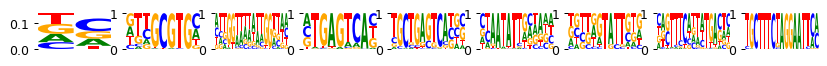

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.16it/s]


Current time: 2024-06-19 02:16:21.050896
	Loss: 219.628 , R2: 0.002
	Training time (model/function): (3.631s / 3.631s)
		per epoch (model/function): (0.259s/ 0.259s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917656101500346, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.13it/s]


Current time: 2024-06-19 02:16:25.163631
	Loss: 182.078 , R2: 0.002
	Training time (model/function): (7.285s / 3.654s)
		per epoch (model/function): (0.520s/ 0.261s)
		per 1k samples: 0.099s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917656101500346, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.23it/s]


Current time: 2024-06-19 02:16:29.274971
	Loss: 160.067 , R2: 0.002
	Training time (model/function): (10.853s / 3.568s)
		per epoch (model/function): (0.775s/ 0.255s)
		per 1k samples: 0.096s
best loss 160.067
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917656101500346, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.13it/s]


Current time: 2024-06-19 02:16:33.838200
	Loss: 155.392 , R2: 0.002
	Training time (model/function): (14.511s / 3.658s)
		per epoch (model/function): (1.037s/ 0.261s)
		per 1k samples: 0.099s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917656101500346, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.09it/s]


Current time: 2024-06-19 02:16:38.009628
	Loss: 147.737 , R2: 0.002
	Training time (model/function): (18.203s / 3.692s)
		per epoch (model/function): (1.300s/ 0.264s)
		per 1k samples: 0.100s
best loss 147.737
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917656101500346, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.06it/s]


Current time: 2024-06-19 02:16:42.716529
	Loss: 149.726 , R2: 0.002
	Training time (model/function): (21.918s / 3.715s)
		per epoch (model/function): (1.566s/ 0.265s)
		per 1k samples: 0.100s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917656101500346, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.24it/s]


Current time: 2024-06-19 02:16:46.736614
	Loss: 145.146 , R2: 0.002
	Training time (model/function): (25.480s / 3.562s)
		per epoch (model/function): (1.820s/ 0.254s)
		per 1k samples: 0.096s
best loss 145.146
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917656101500346, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.04it/s]


Current time: 2024-06-19 02:16:51.376639
	Loss: 148.530 , R2: 0.002
	Training time (model/function): (29.213s / 3.733s)
		per epoch (model/function): (2.087s/ 0.267s)
		per 1k samples: 0.101s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917656101500346, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.28it/s]


Current time: 2024-06-19 02:16:55.361815
	Loss: 144.602 , R2: 0.002
	Training time (model/function): (32.741s / 3.528s)
		per epoch (model/function): (2.339s/ 0.252s)
		per 1k samples: 0.095s
best loss 144.602
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917656101500346, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.12it/s]


Current time: 2024-06-19 02:17:00.012879
	Loss: 148.280 , R2: 0.002
	Training time (model/function): (36.400s / 3.660s)
		per epoch (model/function): (2.600s/ 0.261s)
		per 1k samples: 0.099s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917656101500346, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:03<00:00,  4.27it/s]


Current time: 2024-06-19 02:17:04.093906
	Loss: 144.488 , R2: 0.002
	Training time (model/function): (39.939s / 3.538s)
		per epoch (model/function): (2.853s/ 0.253s)
		per 1k samples: 0.095s
best loss 144.488
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9917656101500346, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 39.9388382434845s
Time per epoch (total): 0.009 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_4/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None

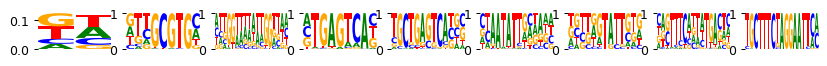

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:17:24.283785
	Loss: 220.390 , R2: 0.001
	Training time (model/function): (13.917s / 13.917s)
		per epoch (model/function): (0.994s/ 0.994s)
		per 1k samples: 0.375s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916177732390719, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:17:38.632539
	Loss: 182.078 , R2: 0.001
	Training time (model/function): (27.807s / 13.890s)
		per epoch (model/function): (1.986s/ 0.992s)
		per 1k samples: 0.375s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916177732390719, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:17:52.904790
	Loss: 160.066 , R2: 0.001
	Training time (model/function): (41.621s / 13.814s)
		per epoch (model/function): (2.973s/ 0.987s)
		per 1k samples: 0.372s
best loss 160.066
last five r2 values, by sequential filter optimization: ['0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916177732390719, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:18:07.783319
	Loss: 155.397 , R2: 0.001
	Training time (model/function): (55.592s / 13.970s)
		per epoch (model/function): (3.971s/ 0.998s)
		per 1k samples: 0.377s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916177732390719, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.10it/s]


Current time: 2024-06-19 02:18:22.038038
	Loss: 147.736 , R2: 0.001
	Training time (model/function): (69.297s / 13.706s)
		per epoch (model/function): (4.950s/ 0.979s)
		per 1k samples: 0.370s
best loss 147.736
last five r2 values, by sequential filter optimization: ['0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916177732390719, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:18:36.822735
	Loss: 149.740 , R2: 0.001
	Training time (model/function): (83.173s / 13.876s)
		per epoch (model/function): (5.941s/ 0.991s)
		per 1k samples: 0.374s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916177732390719, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:18:51.069007
	Loss: 145.145 , R2: 0.001
	Training time (model/function): (96.958s / 13.786s)
		per epoch (model/function): (6.926s/ 0.985s)
		per 1k samples: 0.372s
best loss 145.145
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916177732390719, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.07it/s]


Current time: 2024-06-19 02:19:05.991363
	Loss: 148.553 , R2: 0.001
	Training time (model/function): (110.952s / 13.994s)
		per epoch (model/function): (7.925s/ 1.000s)
		per 1k samples: 0.377s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916177732390719, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.10it/s]


Current time: 2024-06-19 02:19:20.109045
	Loss: 144.602 , R2: 0.001
	Training time (model/function): (124.610s / 13.658s)
		per epoch (model/function): (8.901s/ 0.976s)
		per 1k samples: 0.368s
best loss 144.602
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916177732390719, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.08it/s]


Current time: 2024-06-19 02:19:34.975100
	Loss: 148.303 , R2: 0.001
	Training time (model/function): (138.480s / 13.870s)
		per epoch (model/function): (9.891s/ 0.991s)
		per 1k samples: 0.374s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916177732390719, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:13<00:00,  1.09it/s]


Current time: 2024-06-19 02:19:49.184027
	Loss: 144.488 , R2: 0.001
	Training time (model/function): (152.228s / 13.748s)
		per epoch (model/function): (10.873s/ 0.982s)
		per 1k samples: 0.371s
best loss 144.488
last five r2 values, by sequential filter optimization: ['0.001', '0.001', '0.001', '0.001', '0.001']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9916177732390719, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 152.22832870483398s
Time per epoch (total): 0.035 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs1000/pwms/fold_4/running_time_1.pkl
45

/home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/pancreas_multiome_2022_processed_atac_obs1000_var3000.h5ad
pancreatic_endocrinogenesis (1000, 3000)
False /home/ilibarra/workspace/theislab/mubind/data/pancr

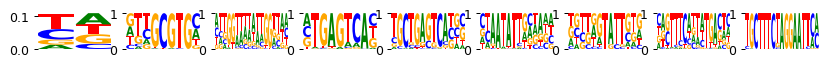

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.14it/s]


Current time: 2024-06-19 02:20:02.262298
	Loss: 219.793 , R2: 0.293
	Training time (model/function): (4.804s / 4.804s)
		per epoch (model/function): (0.343s/ 0.343s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984372257651281, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.12it/s]


Current time: 2024-06-19 02:20:07.636377
	Loss: 182.246 , R2: 0.294
	Training time (model/function): (9.635s / 4.831s)
		per epoch (model/function): (0.688s/ 0.345s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984372257651281, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.19it/s]


Current time: 2024-06-19 02:20:12.996046
	Loss: 160.232 , R2: 0.294
	Training time (model/function): (14.368s / 4.733s)
		per epoch (model/function): (1.026s/ 0.338s)
		per 1k samples: 0.125s
best loss 160.232
last five r2 values, by sequential filter optimization: ['0.294']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984372257651281, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.13it/s]


Current time: 2024-06-19 02:20:18.888379
	Loss: 155.556 , R2: 0.295
	Training time (model/function): (19.188s / 4.820s)
		per epoch (model/function): (1.371s/ 0.344s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984372257651281, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.11it/s]


Current time: 2024-06-19 02:20:24.281137
	Loss: 147.901 , R2: 0.295
	Training time (model/function): (24.040s / 4.852s)
		per epoch (model/function): (1.717s/ 0.347s)
		per 1k samples: 0.128s
best loss 147.901
last five r2 values, by sequential filter optimization: ['0.294', '0.295']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984372257651281, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.13it/s]


Current time: 2024-06-19 02:20:30.263141
	Loss: 149.889 , R2: 0.296
	Training time (model/function): (28.864s / 4.824s)
		per epoch (model/function): (2.062s/ 0.345s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984372257651281, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.17it/s]


Current time: 2024-06-19 02:20:35.557781
	Loss: 145.308 , R2: 0.296
	Training time (model/function): (33.617s / 4.752s)
		per epoch (model/function): (2.401s/ 0.339s)
		per 1k samples: 0.126s
best loss 145.308
last five r2 values, by sequential filter optimization: ['0.294', '0.295', '0.296']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984372257651281, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.07it/s]


Current time: 2024-06-19 02:20:41.543448
	Loss: 148.691 , R2: 0.296
	Training time (model/function): (38.530s / 4.913s)
		per epoch (model/function): (2.752s/ 0.351s)
		per 1k samples: 0.130s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984372257651281, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.20it/s]


Current time: 2024-06-19 02:20:46.801311
	Loss: 144.764 , R2: 0.296
	Training time (model/function): (43.247s / 4.717s)
		per epoch (model/function): (3.089s/ 0.337s)
		per 1k samples: 0.125s
best loss 144.764
last five r2 values, by sequential filter optimization: ['0.294', '0.295', '0.296', '0.296']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984372257651281, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.13it/s]


Current time: 2024-06-19 02:20:52.781310
	Loss: 148.444 , R2: 0.297
	Training time (model/function): (48.070s / 4.823s)
		per epoch (model/function): (3.434s/ 0.345s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984372257651281, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.22it/s]


Current time: 2024-06-19 02:20:58.092768
	Loss: 144.652 , R2: 0.297
	Training time (model/function): (52.752s / 4.683s)
		per epoch (model/function): (3.768s/ 0.334s)
		per 1k samples: 0.124s
best loss 144.651
last five r2 values, by sequential filter optimization: ['0.294', '0.295', '0.296', '0.296', '0.297']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984372257651281, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 52.7522611618042s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_0/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out

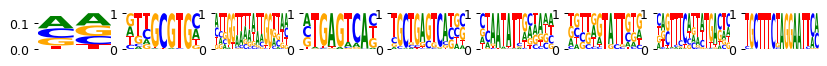

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.00it/s]


Current time: 2024-06-19 02:21:19.880307
	Loss: 220.551 , R2: 0.098
	Training time (model/function): (14.983s / 14.983s)
		per epoch (model/function): (1.070s/ 1.070s)
		per 1k samples: 0.396s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990901749998012, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.00it/s]


Current time: 2024-06-19 02:21:35.426374
	Loss: 182.233 , R2: 0.098
	Training time (model/function): (29.986s / 15.003s)
		per epoch (model/function): (2.142s/ 1.072s)
		per 1k samples: 0.397s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990901749998012, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:21:50.912565
	Loss: 160.223 , R2: 0.096
	Training time (model/function): (44.932s / 14.946s)
		per epoch (model/function): (3.209s/ 1.068s)
		per 1k samples: 0.395s
best loss 160.223
last five r2 values, by sequential filter optimization: ['0.096']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990901749998012, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.01s/it]


Current time: 2024-06-19 02:22:07.090127
	Loss: 155.549 , R2: 0.095
	Training time (model/function): (60.039s / 15.107s)
		per epoch (model/function): (4.288s/ 1.079s)
		per 1k samples: 0.400s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990901749998012, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:22:22.604653
	Loss: 147.890 , R2: 0.095
	Training time (model/function): (74.924s / 14.885s)
		per epoch (model/function): (5.352s/ 1.063s)
		per 1k samples: 0.394s
best loss 147.890
last five r2 values, by sequential filter optimization: ['0.096', '0.095']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990901749998012, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.00it/s]


Current time: 2024-06-19 02:22:38.745766
	Loss: 149.894 , R2: 0.094
	Training time (model/function): (89.940s / 15.016s)
		per epoch (model/function): (6.424s/ 1.073s)
		per 1k samples: 0.397s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990901749998012, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.00it/s]


Current time: 2024-06-19 02:22:54.326349
	Loss: 145.297 , R2: 0.094
	Training time (model/function): (104.975s / 15.035s)
		per epoch (model/function): (7.498s/ 1.074s)
		per 1k samples: 0.398s
best loss 145.297
last five r2 values, by sequential filter optimization: ['0.096', '0.095', '0.094']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990901749998012, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.01s/it]


Current time: 2024-06-19 02:23:10.530506
	Loss: 148.700 , R2: 0.093
	Training time (model/function): (120.105s / 15.130s)
		per epoch (model/function): (8.579s/ 1.081s)
		per 1k samples: 0.400s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990901749998012, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:23:26.003462
	Loss: 144.756 , R2: 0.093
	Training time (model/function): (134.945s / 14.840s)
		per epoch (model/function): (9.639s/ 1.060s)
		per 1k samples: 0.392s
best loss 144.756
last five r2 values, by sequential filter optimization: ['0.096', '0.095', '0.094', '0.093']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990901749998012, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.00s/it]


Current time: 2024-06-19 02:23:42.121412
	Loss: 148.449 , R2: 0.093
	Training time (model/function): (149.987s / 15.042s)
		per epoch (model/function): (10.713s/ 1.074s)
		per 1k samples: 0.398s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990901749998012, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:23:57.607257
	Loss: 144.645 , R2: 0.093
	Training time (model/function): (164.928s / 14.941s)
		per epoch (model/function): (11.781s/ 1.067s)
		per 1k samples: 0.395s
best loss 144.645
last five r2 values, by sequential filter optimization: ['0.096', '0.095', '0.094', '0.093', '0.093']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990901749998012, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 164.92763233184814s
Time per epoch (total): 0.038 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/f

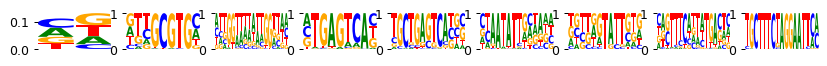

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.08it/s]


Current time: 2024-06-19 02:24:10.752380
	Loss: 219.788 , R2: 0.284
	Training time (model/function): (4.895s / 4.895s)
		per epoch (model/function): (0.350s/ 0.350s)
		per 1k samples: 0.129s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984562158556475, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.13it/s]


Current time: 2024-06-19 02:24:16.116310
	Loss: 182.240 , R2: 0.285
	Training time (model/function): (9.718s / 4.822s)
		per epoch (model/function): (0.694s/ 0.344s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984562158556475, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.19it/s]


Current time: 2024-06-19 02:24:21.475816
	Loss: 160.228 , R2: 0.285
	Training time (model/function): (14.452s / 4.734s)
		per epoch (model/function): (1.032s/ 0.338s)
		per 1k samples: 0.125s
best loss 160.228
last five r2 values, by sequential filter optimization: ['0.285']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984562158556475, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.11it/s]


Current time: 2024-06-19 02:24:27.479956
	Loss: 155.553 , R2: 0.285
	Training time (model/function): (19.299s / 4.847s)
		per epoch (model/function): (1.379s/ 0.346s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984562158556475, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.16it/s]


Current time: 2024-06-19 02:24:32.791470
	Loss: 147.898 , R2: 0.285
	Training time (model/function): (24.071s / 4.772s)
		per epoch (model/function): (1.719s/ 0.341s)
		per 1k samples: 0.126s
best loss 147.898
last five r2 values, by sequential filter optimization: ['0.285', '0.285']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984562158556475, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.12it/s]


Current time: 2024-06-19 02:24:38.777730
	Loss: 149.886 , R2: 0.286
	Training time (model/function): (28.904s / 4.833s)
		per epoch (model/function): (2.065s/ 0.345s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984562158556475, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.16it/s]


Current time: 2024-06-19 02:24:44.092851
	Loss: 145.308 , R2: 0.286
	Training time (model/function): (33.675s / 4.771s)
		per epoch (model/function): (2.405s/ 0.341s)
		per 1k samples: 0.126s
best loss 145.308
last five r2 values, by sequential filter optimization: ['0.285', '0.285', '0.286']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984562158556475, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.13it/s]


Current time: 2024-06-19 02:24:50.073087
	Loss: 148.692 , R2: 0.287
	Training time (model/function): (38.499s / 4.824s)
		per epoch (model/function): (2.750s/ 0.345s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984562158556475, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.20it/s]


Current time: 2024-06-19 02:24:55.325564
	Loss: 144.765 , R2: 0.287
	Training time (model/function): (43.210s / 4.711s)
		per epoch (model/function): (3.086s/ 0.336s)
		per 1k samples: 0.125s
best loss 144.765
last five r2 values, by sequential filter optimization: ['0.285', '0.285', '0.286', '0.287']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984562158556475, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.14it/s]


Current time: 2024-06-19 02:25:01.281032
	Loss: 148.441 , R2: 0.288
	Training time (model/function): (48.010s / 4.800s)
		per epoch (model/function): (3.429s/ 0.343s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984562158556475, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.22it/s]


Current time: 2024-06-19 02:25:06.595308
	Loss: 144.653 , R2: 0.287
	Training time (model/function): (52.699s / 4.689s)
		per epoch (model/function): (3.764s/ 0.335s)
		per 1k samples: 0.124s
best loss 144.650
last five r2 values, by sequential filter optimization: ['0.285', '0.285', '0.286', '0.287', '0.287']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9984562158556475, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 52.69871711730957s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_1/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 ou

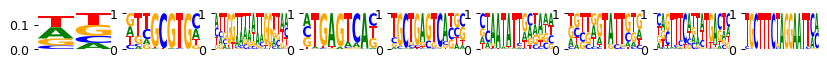

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.00s/it]


Current time: 2024-06-19 02:25:28.331646
	Loss: 220.527 , R2: 0.108
	Training time (model/function): (15.039s / 15.039s)
		per epoch (model/function): (1.074s/ 1.074s)
		per 1k samples: 0.398s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991568088743344, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.01s/it]


Current time: 2024-06-19 02:25:44.009393
	Loss: 182.232 , R2: 0.108
	Training time (model/function): (30.176s / 15.137s)
		per epoch (model/function): (2.155s/ 1.081s)
		per 1k samples: 0.400s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991568088743344, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:25:59.502181
	Loss: 160.219 , R2: 0.106
	Training time (model/function): (45.038s / 14.862s)
		per epoch (model/function): (3.217s/ 1.062s)
		per 1k samples: 0.393s
best loss 160.219
last five r2 values, by sequential filter optimization: ['0.106']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991568088743344, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.00s/it]


Current time: 2024-06-19 02:26:15.707438
	Loss: 155.553 , R2: 0.105
	Training time (model/function): (60.086s / 15.048s)
		per epoch (model/function): (4.292s/ 1.075s)
		per 1k samples: 0.398s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991568088743344, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:26:31.149369
	Loss: 147.889 , R2: 0.105
	Training time (model/function): (74.986s / 14.901s)
		per epoch (model/function): (5.356s/ 1.064s)
		per 1k samples: 0.394s
best loss 147.889
last five r2 values, by sequential filter optimization: ['0.106', '0.105']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991568088743344, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.01s/it]


Current time: 2024-06-19 02:26:47.353854
	Loss: 149.893 , R2: 0.104
	Training time (model/function): (90.121s / 15.135s)
		per epoch (model/function): (6.437s/ 1.081s)
		per 1k samples: 0.400s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991568088743344, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:27:02.871395
	Loss: 145.297 , R2: 0.104
	Training time (model/function): (105.011s / 14.891s)
		per epoch (model/function): (7.501s/ 1.064s)
		per 1k samples: 0.394s
best loss 145.297
last five r2 values, by sequential filter optimization: ['0.106', '0.105', '0.104']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991568088743344, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.00s/it]


Current time: 2024-06-19 02:27:19.062594
	Loss: 148.697 , R2: 0.104
	Training time (model/function): (120.040s / 15.029s)
		per epoch (model/function): (8.574s/ 1.074s)
		per 1k samples: 0.397s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991568088743344, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:27:34.436846
	Loss: 144.755 , R2: 0.103
	Training time (model/function): (134.872s / 14.832s)
		per epoch (model/function): (9.634s/ 1.059s)
		per 1k samples: 0.392s
best loss 144.755
last five r2 values, by sequential filter optimization: ['0.106', '0.105', '0.104', '0.103']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991568088743344, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.01s/it]


Current time: 2024-06-19 02:27:50.653147
	Loss: 148.446 , R2: 0.103
	Training time (model/function): (150.021s / 15.148s)
		per epoch (model/function): (10.716s/ 1.082s)
		per 1k samples: 0.401s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991568088743344, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:28:06.097327
	Loss: 144.639 , R2: 0.103
	Training time (model/function): (164.834s / 14.813s)
		per epoch (model/function): (11.774s/ 1.058s)
		per 1k samples: 0.392s
best loss 144.639
last five r2 values, by sequential filter optimization: ['0.106', '0.105', '0.104', '0.103', '0.103']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991568088743344, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 164.83387398719788s
Time per epoch (total): 0.038 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/f

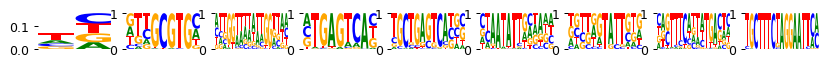

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.14it/s]


Current time: 2024-06-19 02:28:19.148384
	Loss: 219.790 , R2: 0.295
	Training time (model/function): (4.813s / 4.813s)
		per epoch (model/function): (0.344s/ 0.344s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985428393429172, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.08it/s]


Current time: 2024-06-19 02:28:24.586614
	Loss: 182.240 , R2: 0.297
	Training time (model/function): (9.709s / 4.896s)
		per epoch (model/function): (0.694s/ 0.350s)
		per 1k samples: 0.129s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985428393429172, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.18it/s]


Current time: 2024-06-19 02:28:29.872444
	Loss: 160.229 , R2: 0.297
	Training time (model/function): (14.453s / 4.744s)
		per epoch (model/function): (1.032s/ 0.339s)
		per 1k samples: 0.125s
best loss 160.229
last five r2 values, by sequential filter optimization: ['0.297']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985428393429172, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.12it/s]


Current time: 2024-06-19 02:28:35.859968
	Loss: 155.548 , R2: 0.297
	Training time (model/function): (19.281s / 4.829s)
		per epoch (model/function): (1.377s/ 0.345s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985428393429172, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.15it/s]


Current time: 2024-06-19 02:28:41.268814
	Loss: 147.894 , R2: 0.298
	Training time (model/function): (24.065s / 4.784s)
		per epoch (model/function): (1.719s/ 0.342s)
		per 1k samples: 0.127s
best loss 147.894
last five r2 values, by sequential filter optimization: ['0.297', '0.298']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985428393429172, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.12it/s]


Current time: 2024-06-19 02:28:47.176206
	Loss: 149.885 , R2: 0.298
	Training time (model/function): (28.899s / 4.834s)
		per epoch (model/function): (2.064s/ 0.345s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985428393429172, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.11it/s]


Current time: 2024-06-19 02:28:52.574078
	Loss: 145.305 , R2: 0.298
	Training time (model/function): (33.754s / 4.855s)
		per epoch (model/function): (2.411s/ 0.347s)
		per 1k samples: 0.128s
best loss 145.305
last five r2 values, by sequential filter optimization: ['0.297', '0.298', '0.298']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985428393429172, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.12it/s]


Current time: 2024-06-19 02:28:58.571074
	Loss: 148.687 , R2: 0.299
	Training time (model/function): (38.593s / 4.839s)
		per epoch (model/function): (2.757s/ 0.346s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985428393429172, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.21it/s]


Current time: 2024-06-19 02:29:03.811455
	Loss: 144.763 , R2: 0.299
	Training time (model/function): (43.293s / 4.699s)
		per epoch (model/function): (3.092s/ 0.336s)
		per 1k samples: 0.124s
best loss 144.763
last five r2 values, by sequential filter optimization: ['0.297', '0.298', '0.298', '0.299']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985428393429172, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.07it/s]


Current time: 2024-06-19 02:29:09.794618
	Loss: 148.441 , R2: 0.300
	Training time (model/function): (48.203s / 4.910s)
		per epoch (model/function): (3.443s/ 0.351s)
		per 1k samples: 0.130s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985428393429172, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.21it/s]


Current time: 2024-06-19 02:29:15.032454
	Loss: 144.648 , R2: 0.300
	Training time (model/function): (52.896s / 4.693s)
		per epoch (model/function): (3.778s/ 0.335s)
		per 1k samples: 0.124s
best loss 144.647
last five r2 values, by sequential filter optimization: ['0.297', '0.298', '0.298', '0.299', '0.300']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985428393429172, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 52.8959321975708s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_2/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out

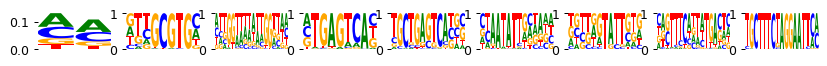

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.00s/it]


Current time: 2024-06-19 02:29:36.972310
	Loss: 220.490 , R2: 0.092
	Training time (model/function): (15.056s / 15.056s)
		per epoch (model/function): (1.075s/ 1.075s)
		per 1k samples: 0.398s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991576356813815, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.01s/it]


Current time: 2024-06-19 02:29:52.637371
	Loss: 182.232 , R2: 0.092
	Training time (model/function): (30.179s / 15.123s)
		per epoch (model/function): (2.156s/ 1.080s)
		per 1k samples: 0.400s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991576356813815, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:30:08.143810
	Loss: 160.218 , R2: 0.090
	Training time (model/function): (45.056s / 14.877s)
		per epoch (model/function): (3.218s/ 1.063s)
		per 1k samples: 0.393s
best loss 160.218
last five r2 values, by sequential filter optimization: ['0.090']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991576356813815, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.00s/it]


Current time: 2024-06-19 02:30:24.339856
	Loss: 155.548 , R2: 0.089
	Training time (model/function): (60.089s / 15.032s)
		per epoch (model/function): (4.292s/ 1.074s)
		per 1k samples: 0.398s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991576356813815, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:30:39.772376
	Loss: 147.889 , R2: 0.089
	Training time (model/function): (74.977s / 14.888s)
		per epoch (model/function): (5.355s/ 1.063s)
		per 1k samples: 0.394s
best loss 147.889
last five r2 values, by sequential filter optimization: ['0.090', '0.089']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991576356813815, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.01s/it]


Current time: 2024-06-19 02:30:55.987430
	Loss: 149.890 , R2: 0.088
	Training time (model/function): (90.115s / 15.138s)
		per epoch (model/function): (6.437s/ 1.081s)
		per 1k samples: 0.400s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991576356813815, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:31:11.501164
	Loss: 145.296 , R2: 0.087
	Training time (model/function): (104.997s / 14.882s)
		per epoch (model/function): (7.500s/ 1.063s)
		per 1k samples: 0.394s
best loss 145.296
last five r2 values, by sequential filter optimization: ['0.090', '0.089', '0.087']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991576356813815, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.00s/it]


Current time: 2024-06-19 02:31:27.712765
	Loss: 148.698 , R2: 0.087
	Training time (model/function): (120.042s / 15.044s)
		per epoch (model/function): (8.574s/ 1.075s)
		per 1k samples: 0.398s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991576356813815, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:31:43.116803
	Loss: 144.752 , R2: 0.087
	Training time (model/function): (134.903s / 14.861s)
		per epoch (model/function): (9.636s/ 1.061s)
		per 1k samples: 0.393s
best loss 144.752
last five r2 values, by sequential filter optimization: ['0.090', '0.089', '0.087', '0.087']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991576356813815, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.01s/it]


Current time: 2024-06-19 02:31:59.293080
	Loss: 148.441 , R2: 0.087
	Training time (model/function): (150.005s / 15.103s)
		per epoch (model/function): (10.715s/ 1.079s)
		per 1k samples: 0.399s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991576356813815, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:32:14.802345
	Loss: 144.642 , R2: 0.086
	Training time (model/function): (164.884s / 14.879s)
		per epoch (model/function): (11.777s/ 1.063s)
		per 1k samples: 0.393s
best loss 144.641
last five r2 values, by sequential filter optimization: ['0.090', '0.089', '0.087', '0.087', '0.087']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991576356813815, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 164.88401865959167s
Time per epoch (total): 0.038 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/f

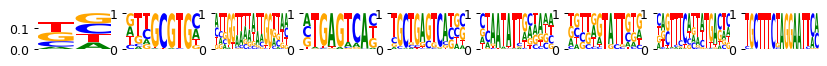

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.14it/s]


Current time: 2024-06-19 02:32:27.819097
	Loss: 219.790 , R2: 0.296
	Training time (model/function): (4.800s / 4.800s)
		per epoch (model/function): (0.343s/ 0.343s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985041860902141, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.15it/s]


Current time: 2024-06-19 02:32:33.242118
	Loss: 182.238 , R2: 0.298
	Training time (model/function): (9.588s / 4.789s)
		per epoch (model/function): (0.685s/ 0.342s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985041860902141, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.19it/s]


Current time: 2024-06-19 02:32:38.516132
	Loss: 160.229 , R2: 0.298
	Training time (model/function): (14.322s / 4.734s)
		per epoch (model/function): (1.023s/ 0.338s)
		per 1k samples: 0.125s
best loss 160.229
last five r2 values, by sequential filter optimization: ['0.298']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985041860902141, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.14it/s]


Current time: 2024-06-19 02:32:44.476988
	Loss: 155.557 , R2: 0.298
	Training time (model/function): (19.129s / 4.806s)
		per epoch (model/function): (1.366s/ 0.343s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985041860902141, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.17it/s]


Current time: 2024-06-19 02:32:49.862194
	Loss: 147.902 , R2: 0.298
	Training time (model/function): (23.889s / 4.761s)
		per epoch (model/function): (1.706s/ 0.340s)
		per 1k samples: 0.126s
best loss 147.902
last five r2 values, by sequential filter optimization: ['0.298', '0.298']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985041860902141, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.13it/s]


Current time: 2024-06-19 02:32:55.744374
	Loss: 149.883 , R2: 0.299
	Training time (model/function): (28.703s / 4.814s)
		per epoch (model/function): (2.050s/ 0.344s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985041860902141, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.11it/s]


Current time: 2024-06-19 02:33:01.135666
	Loss: 145.307 , R2: 0.299
	Training time (model/function): (33.554s / 4.851s)
		per epoch (model/function): (2.397s/ 0.346s)
		per 1k samples: 0.128s
best loss 145.307
last five r2 values, by sequential filter optimization: ['0.298', '0.298', '0.299']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985041860902141, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.12it/s]


Current time: 2024-06-19 02:33:07.119830
	Loss: 148.689 , R2: 0.299
	Training time (model/function): (38.385s / 4.831s)
		per epoch (model/function): (2.742s/ 0.345s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985041860902141, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.20it/s]


Current time: 2024-06-19 02:33:12.368001
	Loss: 144.762 , R2: 0.299
	Training time (model/function): (43.091s / 4.707s)
		per epoch (model/function): (3.078s/ 0.336s)
		per 1k samples: 0.124s
best loss 144.762
last five r2 values, by sequential filter optimization: ['0.298', '0.298', '0.299', '0.299']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985041860902141, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.14it/s]


Current time: 2024-06-19 02:33:18.322876
	Loss: 148.445 , R2: 0.300
	Training time (model/function): (47.892s / 4.800s)
		per epoch (model/function): (3.421s/ 0.343s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985041860902141, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.22it/s]


Current time: 2024-06-19 02:33:23.541995
	Loss: 144.647 , R2: 0.300
	Training time (model/function): (52.573s / 4.681s)
		per epoch (model/function): (3.755s/ 0.334s)
		per 1k samples: 0.124s
best loss 144.647
last five r2 values, by sequential filter optimization: ['0.298', '0.298', '0.299', '0.299', '0.300']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985041860902141, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 52.57255220413208s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_3/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 ou

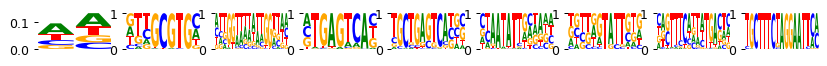

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.00it/s]


Current time: 2024-06-19 02:33:45.315589
	Loss: 220.513 , R2: 0.095
	Training time (model/function): (14.972s / 14.972s)
		per epoch (model/function): (1.069s/ 1.069s)
		per 1k samples: 0.396s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991692746241949, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.00s/it]


Current time: 2024-06-19 02:34:01.005821
	Loss: 182.234 , R2: 0.094
	Training time (model/function): (30.022s / 15.051s)
		per epoch (model/function): (2.144s/ 1.075s)
		per 1k samples: 0.398s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991692746241949, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:34:16.448063
	Loss: 160.218 , R2: 0.092
	Training time (model/function): (44.923s / 14.900s)
		per epoch (model/function): (3.209s/ 1.064s)
		per 1k samples: 0.394s
best loss 160.218
last five r2 values, by sequential filter optimization: ['0.092']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991692746241949, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.00s/it]


Current time: 2024-06-19 02:34:32.773304
	Loss: 155.555 , R2: 0.092
	Training time (model/function): (60.002s / 15.079s)
		per epoch (model/function): (4.286s/ 1.077s)
		per 1k samples: 0.399s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991692746241949, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:34:48.212538
	Loss: 147.889 , R2: 0.091
	Training time (model/function): (74.899s / 14.897s)
		per epoch (model/function): (5.350s/ 1.064s)
		per 1k samples: 0.394s
best loss 147.889
last five r2 values, by sequential filter optimization: ['0.092', '0.091']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991692746241949, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.01s/it]


Current time: 2024-06-19 02:35:04.430706
	Loss: 149.892 , R2: 0.091
	Training time (model/function): (90.047s / 15.149s)
		per epoch (model/function): (6.432s/ 1.082s)
		per 1k samples: 0.401s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991692746241949, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:35:19.946437
	Loss: 145.300 , R2: 0.090
	Training time (model/function): (104.932s / 14.884s)
		per epoch (model/function): (7.495s/ 1.063s)
		per 1k samples: 0.394s
best loss 145.300
last five r2 values, by sequential filter optimization: ['0.092', '0.091', '0.090']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991692746241949, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.00s/it]


Current time: 2024-06-19 02:35:36.138142
	Loss: 148.699 , R2: 0.090
	Training time (model/function): (119.959s / 15.027s)
		per epoch (model/function): (8.568s/ 1.073s)
		per 1k samples: 0.397s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991692746241949, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:35:51.502765
	Loss: 144.757 , R2: 0.089
	Training time (model/function): (134.782s / 14.823s)
		per epoch (model/function): (9.627s/ 1.059s)
		per 1k samples: 0.392s
best loss 144.757
last five r2 values, by sequential filter optimization: ['0.092', '0.091', '0.090', '0.089']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991692746241949, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.01s/it]


Current time: 2024-06-19 02:36:07.693357
	Loss: 148.447 , R2: 0.089
	Training time (model/function): (149.903s / 15.121s)
		per epoch (model/function): (10.707s/ 1.080s)
		per 1k samples: 0.400s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991692746241949, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:36:23.147072
	Loss: 144.644 , R2: 0.089
	Training time (model/function): (164.727s / 14.825s)
		per epoch (model/function): (11.766s/ 1.059s)
		per 1k samples: 0.392s
best loss 144.644
last five r2 values, by sequential filter optimization: ['0.092', '0.091', '0.090', '0.089', '0.089']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991692746241949, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 164.7274045944214s
Time per epoch (total): 0.038 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fo

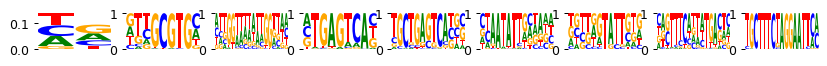

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.14it/s]


Current time: 2024-06-19 02:36:36.162059
	Loss: 219.792 , R2: 0.295
	Training time (model/function): (4.807s / 4.807s)
		per epoch (model/function): (0.343s/ 0.343s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998561435134083, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.07it/s]


Current time: 2024-06-19 02:36:41.614637
	Loss: 182.237 , R2: 0.296
	Training time (model/function): (9.715s / 4.909s)
		per epoch (model/function): (0.694s/ 0.351s)
		per 1k samples: 0.130s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998561435134083, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.19it/s]


Current time: 2024-06-19 02:36:46.886553
	Loss: 160.228 , R2: 0.296
	Training time (model/function): (14.445s / 4.730s)
		per epoch (model/function): (1.032s/ 0.338s)
		per 1k samples: 0.125s
best loss 160.228
last five r2 values, by sequential filter optimization: ['0.296']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998561435134083, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.12it/s]


Current time: 2024-06-19 02:36:52.873558
	Loss: 155.552 , R2: 0.297
	Training time (model/function): (19.274s / 4.829s)
		per epoch (model/function): (1.377s/ 0.345s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998561435134083, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.15it/s]


Current time: 2024-06-19 02:36:58.286481
	Loss: 147.898 , R2: 0.297
	Training time (model/function): (24.058s / 4.784s)
		per epoch (model/function): (1.718s/ 0.342s)
		per 1k samples: 0.127s
best loss 147.898
last five r2 values, by sequential filter optimization: ['0.296', '0.297']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998561435134083, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.12it/s]


Current time: 2024-06-19 02:37:04.191281
	Loss: 149.889 , R2: 0.298
	Training time (model/function): (28.892s / 4.834s)
		per epoch (model/function): (2.064s/ 0.345s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998561435134083, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.10it/s]


Current time: 2024-06-19 02:37:09.598237
	Loss: 145.307 , R2: 0.298
	Training time (model/function): (33.756s / 4.864s)
		per epoch (model/function): (2.411s/ 0.347s)
		per 1k samples: 0.129s
best loss 145.307
last five r2 values, by sequential filter optimization: ['0.296', '0.297', '0.298']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998561435134083, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.12it/s]


Current time: 2024-06-19 02:37:15.591574
	Loss: 148.693 , R2: 0.298
	Training time (model/function): (38.592s / 4.836s)
		per epoch (model/function): (2.757s/ 0.345s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998561435134083, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.20it/s]


Current time: 2024-06-19 02:37:20.850823
	Loss: 144.765 , R2: 0.298
	Training time (model/function): (43.311s / 4.718s)
		per epoch (model/function): (3.094s/ 0.337s)
		per 1k samples: 0.125s
best loss 144.765
last five r2 values, by sequential filter optimization: ['0.296', '0.297', '0.298', '0.298']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998561435134083, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.08it/s]


Current time: 2024-06-19 02:37:26.822125
	Loss: 148.446 , R2: 0.299
	Training time (model/function): (48.207s / 4.897s)
		per epoch (model/function): (3.443s/ 0.350s)
		per 1k samples: 0.129s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998561435134083, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.19it/s]


Current time: 2024-06-19 02:37:32.086941
	Loss: 144.649 , R2: 0.299
	Training time (model/function): (52.929s / 4.722s)
		per epoch (model/function): (3.781s/ 0.337s)
		per 1k samples: 0.125s
best loss 144.649
last five r2 values, by sequential filter optimization: ['0.296', '0.297', '0.298', '0.298', '0.299']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998561435134083, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 52.92933225631714s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_4/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out

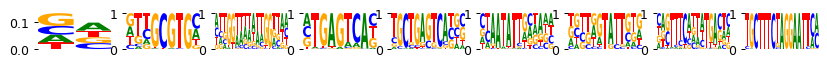

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.00it/s]


Current time: 2024-06-19 02:37:53.848438
	Loss: 220.533 , R2: 0.093
	Training time (model/function): (14.997s / 14.997s)
		per epoch (model/function): (1.071s/ 1.071s)
		per 1k samples: 0.397s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991101276204475, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.01s/it]


Current time: 2024-06-19 02:38:09.540200
	Loss: 182.232 , R2: 0.093
	Training time (model/function): (30.143s / 15.146s)
		per epoch (model/function): (2.153s/ 1.082s)
		per 1k samples: 0.401s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991101276204475, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:38:24.956873
	Loss: 160.217 , R2: 0.091
	Training time (model/function): (45.016s / 14.873s)
		per epoch (model/function): (3.215s/ 1.062s)
		per 1k samples: 0.393s
best loss 160.217
last five r2 values, by sequential filter optimization: ['0.091']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991101276204475, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.00s/it]


Current time: 2024-06-19 02:38:41.172381
	Loss: 155.552 , R2: 0.090
	Training time (model/function): (60.068s / 15.052s)
		per epoch (model/function): (4.291s/ 1.075s)
		per 1k samples: 0.398s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991101276204475, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:38:56.682701
	Loss: 147.889 , R2: 0.090
	Training time (model/function): (74.948s / 14.880s)
		per epoch (model/function): (5.353s/ 1.063s)
		per 1k samples: 0.393s
best loss 147.889
last five r2 values, by sequential filter optimization: ['0.091', '0.090']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991101276204475, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.00s/it]


Current time: 2024-06-19 02:39:12.878414
	Loss: 149.892 , R2: 0.090
	Training time (model/function): (89.980s / 15.033s)
		per epoch (model/function): (6.427s/ 1.074s)
		per 1k samples: 0.398s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991101276204475, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:39:28.368002
	Loss: 145.297 , R2: 0.089
	Training time (model/function): (104.924s / 14.944s)
		per epoch (model/function): (7.495s/ 1.067s)
		per 1k samples: 0.395s
best loss 145.297
last five r2 values, by sequential filter optimization: ['0.091', '0.090', '0.089']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991101276204475, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:15<00:00,  1.00s/it]


Current time: 2024-06-19 02:39:44.589139
	Loss: 148.697 , R2: 0.088
	Training time (model/function): (119.981s / 15.056s)
		per epoch (model/function): (8.570s/ 1.075s)
		per 1k samples: 0.398s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991101276204475, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:40:00.044494
	Loss: 144.756 , R2: 0.088
	Training time (model/function): (134.892s / 14.912s)
		per epoch (model/function): (9.635s/ 1.065s)
		per 1k samples: 0.394s
best loss 144.756
last five r2 values, by sequential filter optimization: ['0.091', '0.090', '0.089', '0.088']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991101276204475, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.00it/s]


Current time: 2024-06-19 02:40:16.220125
	Loss: 148.443 , R2: 0.088
	Training time (model/function): (149.904s / 15.012s)
		per epoch (model/function): (10.707s/ 1.072s)
		per 1k samples: 0.397s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991101276204475, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


Current time: 2024-06-19 02:40:31.615055
	Loss: 144.640 , R2: 0.088
	Training time (model/function): (164.756s / 14.852s)
		per epoch (model/function): (11.768s/ 1.061s)
		per 1k samples: 0.393s
best loss 144.640
last five r2 values, by sequential filter optimization: ['0.091', '0.090', '0.089', '0.088', '0.088']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991101276204475, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 164.7560999393463s
Time per epoch (total): 0.038 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs1000/pwms/fold_4/running_time_1.pkl
50

/home/ilibarra/workspace/theislab/mubind/data/pbmc/random/processed_laura_2023_obs2000_var6000.h5ad
pbmc (2000, 5999)
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_0/model.pt
False /home/iliba

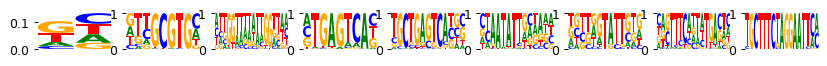

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 02:40:53.217810
	Loss: 188.719 , R2: 0.311
	Training time (model/function): (9.579s / 9.579s)
		per epoch (model/function): (0.684s/ 0.684s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986954639809166, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 02:41:04.232727
	Loss: 159.989 , R2: 0.313
	Training time (model/function): (19.158s / 9.578s)
		per epoch (model/function): (1.368s/ 0.684s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986954639809166, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.56it/s]


Current time: 2024-06-19 02:41:15.288097
	Loss: 147.973 , R2: 0.313
	Training time (model/function): (28.860s / 9.703s)
		per epoch (model/function): (2.061s/ 0.693s)
		per 1k samples: 0.128s
best loss 147.973
last five r2 values, by sequential filter optimization: ['0.313']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986954639809166, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 02:41:27.727325
	Loss: 149.377 , R2: 0.314
	Training time (model/function): (38.452s / 9.592s)
		per epoch (model/function): (2.747s/ 0.685s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986954639809166, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.56it/s]


Current time: 2024-06-19 02:41:38.894079
	Loss: 144.918 , R2: 0.314
	Training time (model/function): (48.188s / 9.736s)
		per epoch (model/function): (3.442s/ 0.695s)
		per 1k samples: 0.129s
best loss 144.918
last five r2 values, by sequential filter optimization: ['0.313', '0.314']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986954639809166, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 02:41:51.254838
	Loss: 148.486 , R2: 0.315
	Training time (model/function): (57.877s / 9.689s)
		per epoch (model/function): (4.134s/ 0.692s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986954639809166, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.55it/s]


Current time: 2024-06-19 02:42:02.425770
	Loss: 144.663 , R2: 0.315
	Training time (model/function): (67.704s / 9.826s)
		per epoch (model/function): (4.836s/ 0.702s)
		per 1k samples: 0.130s
best loss 144.663
last five r2 values, by sequential filter optimization: ['0.313', '0.314', '0.315']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986954639809166, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 02:42:14.873759
	Loss: 148.404 , R2: 0.315
	Training time (model/function): (77.303s / 9.600s)
		per epoch (model/function): (5.522s/ 0.686s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986954639809166, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 02:42:25.903759
	Loss: 144.642 , R2: 0.314
	Training time (model/function): (86.893s / 9.590s)
		per epoch (model/function): (6.207s/ 0.685s)
		per 1k samples: 0.127s
best loss 144.642
last five r2 values, by sequential filter optimization: ['0.313', '0.314', '0.315', '0.314']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986954639809166, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.60it/s]


Current time: 2024-06-19 02:42:38.168953
	Loss: 148.395 , R2: 0.316
	Training time (model/function): (96.390s / 9.497s)
		per epoch (model/function): (6.885s/ 0.678s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986954639809166, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 02:42:49.174704
	Loss: 144.641 , R2: 0.316
	Training time (model/function): (105.960s / 9.570s)
		per epoch (model/function): (7.569s/ 0.684s)
		per 1k samples: 0.127s
best loss 144.640
last five r2 values, by sequential filter optimization: ['0.313', '0.314', '0.315', '0.314', '0.316']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986954639809166, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 105.95992279052734s
Time per epoch (total): 0.024 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_0/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


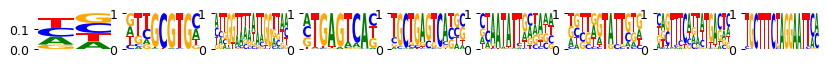

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 02:43:56.135260
	Loss: 188.760 , R2: 0.071
	Training time (model/function): (47.709s / 47.709s)
		per epoch (model/function): (3.408s/ 3.408s)
		per 1k samples: 0.631s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999695183635144, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 02:44:45.295095
	Loss: 159.978 , R2: 0.071
	Training time (model/function): (95.418s / 47.709s)
		per epoch (model/function): (6.816s/ 3.408s)
		per 1k samples: 0.631s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999695183635144, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 02:45:34.235917
	Loss: 147.961 , R2: 0.071
	Training time (model/function): (142.903s / 47.485s)
		per epoch (model/function): (10.207s/ 3.392s)
		per 1k samples: 0.628s
best loss 147.961
last five r2 values, by sequential filter optimization: ['0.071']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999695183635144, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 02:46:24.657441
	Loss: 149.371 , R2: 0.071
	Training time (model/function): (190.616s / 47.713s)
		per epoch (model/function): (13.615s/ 3.408s)
		per 1k samples: 0.631s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999695183635144, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 02:47:13.693688
	Loss: 144.906 , R2: 0.071
	Training time (model/function): (238.293s / 47.677s)
		per epoch (model/function): (17.021s/ 3.406s)
		per 1k samples: 0.631s
best loss 144.906
last five r2 values, by sequential filter optimization: ['0.071', '0.071']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999695183635144, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.18s/it]


Current time: 2024-06-19 02:48:04.321493
	Loss: 148.491 , R2: 0.071
	Training time (model/function): (286.050s / 47.756s)
		per epoch (model/function): (20.432s/ 3.411s)
		per 1k samples: 0.632s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999695183635144, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 02:48:53.444772
	Loss: 144.653 , R2: 0.071
	Training time (model/function): (333.686s / 47.637s)
		per epoch (model/function): (23.835s/ 3.403s)
		per 1k samples: 0.630s
best loss 144.653
last five r2 values, by sequential filter optimization: ['0.071', '0.071', '0.071']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999695183635144, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:48<00:00,  3.21s/it]


Current time: 2024-06-19 02:49:44.574132
	Loss: 148.417 , R2: 0.071
	Training time (model/function): (382.019s / 48.333s)
		per epoch (model/function): (27.287s/ 3.452s)
		per 1k samples: 0.639s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999695183635144, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 02:50:33.485691
	Loss: 144.633 , R2: 0.071
	Training time (model/function): (429.473s / 47.454s)
		per epoch (model/function): (30.677s/ 3.390s)
		per 1k samples: 0.628s
best loss 144.631
last five r2 values, by sequential filter optimization: ['0.071', '0.071', '0.071', '0.071']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999695183635144, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 02:51:23.928244
	Loss: 148.411 , R2: 0.071
	Training time (model/function): (477.027s / 47.554s)
		per epoch (model/function): (34.073s/ 3.397s)
		per 1k samples: 0.629s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999695183635144, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.15s/it]


Current time: 2024-06-19 02:52:12.755130
	Loss: 144.629 , R2: 0.071
	Training time (model/function): (524.392s / 47.365s)
		per epoch (model/function): (37.457s/ 3.383s)
		per 1k samples: 0.627s
best loss 144.629
last five r2 values, by sequential filter optimization: ['0.071', '0.071', '0.071', '0.071', '0.071']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999695183635144, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 524.3920063972473s
Time per epoch (total): 0.121 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_1/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pbmc/ran

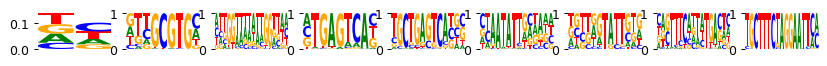

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.84it/s]


Current time: 2024-06-19 02:52:43.072685
	Loss: 188.721 , R2: 0.300
	Training time (model/function): (8.277s / 8.277s)
		per epoch (model/function): (0.591s/ 0.591s)
		per 1k samples: 0.110s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986204817056025, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.84it/s]


Current time: 2024-06-19 02:52:52.709078
	Loss: 159.991 , R2: 0.302
	Training time (model/function): (16.560s / 8.283s)
		per epoch (model/function): (1.183s/ 0.592s)
		per 1k samples: 0.110s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986204817056025, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 02:53:02.466127
	Loss: 147.974 , R2: 0.302
	Training time (model/function): (24.959s / 8.399s)
		per epoch (model/function): (1.783s/ 0.600s)
		per 1k samples: 0.111s
best loss 147.974
last five r2 values, by sequential filter optimization: ['0.302']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986204817056025, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 02:53:13.412451
	Loss: 149.378 , R2: 0.303
	Training time (model/function): (33.385s / 8.426s)
		per epoch (model/function): (2.385s/ 0.602s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986204817056025, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.78it/s]


Current time: 2024-06-19 02:53:23.237167
	Loss: 144.920 , R2: 0.303
	Training time (model/function): (41.934s / 8.549s)
		per epoch (model/function): (2.995s/ 0.611s)
		per 1k samples: 0.113s
best loss 144.920
last five r2 values, by sequential filter optimization: ['0.302', '0.303']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986204817056025, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.83it/s]


Current time: 2024-06-19 02:53:34.264273
	Loss: 148.489 , R2: 0.303
	Training time (model/function): (50.265s / 8.331s)
		per epoch (model/function): (3.590s/ 0.595s)
		per 1k samples: 0.110s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986204817056025, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 02:53:44.059311
	Loss: 144.665 , R2: 0.303
	Training time (model/function): (58.701s / 8.436s)
		per epoch (model/function): (4.193s/ 0.603s)
		per 1k samples: 0.112s
best loss 144.665
last five r2 values, by sequential filter optimization: ['0.302', '0.303', '0.303']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986204817056025, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.83it/s]


Current time: 2024-06-19 02:53:54.964397
	Loss: 148.405 , R2: 0.304
	Training time (model/function): (66.991s / 8.289s)
		per epoch (model/function): (4.785s/ 0.592s)
		per 1k samples: 0.110s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986204817056025, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.83it/s]


Current time: 2024-06-19 02:54:04.626571
	Loss: 144.645 , R2: 0.303
	Training time (model/function): (75.298s / 8.307s)
		per epoch (model/function): (5.378s/ 0.593s)
		per 1k samples: 0.110s
best loss 144.644
last five r2 values, by sequential filter optimization: ['0.302', '0.303', '0.303', '0.303']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986204817056025, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.86it/s]


Current time: 2024-06-19 02:54:15.525754
	Loss: 148.395 , R2: 0.305
	Training time (model/function): (83.494s / 8.196s)
		per epoch (model/function): (5.964s/ 0.585s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986204817056025, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.84it/s]


Current time: 2024-06-19 02:54:25.072730
	Loss: 144.642 , R2: 0.305
	Training time (model/function): (91.771s / 8.277s)
		per epoch (model/function): (6.555s/ 0.591s)
		per 1k samples: 0.110s
best loss 144.642
last five r2 values, by sequential filter optimization: ['0.302', '0.303', '0.303', '0.303', '0.305']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986204817056025, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 91.7707347869873s
Time per epoch (total): 0.021 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_1/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


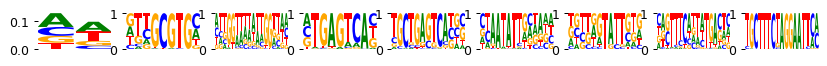

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.07s/it]


Current time: 2024-06-19 02:55:30.206174
	Loss: 188.764 , R2: 0.079
	Training time (model/function): (46.226s / 46.226s)
		per epoch (model/function): (3.302s/ 3.302s)
		per 1k samples: 0.612s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996933953143432, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.08s/it]


Current time: 2024-06-19 02:56:17.908790
	Loss: 159.979 , R2: 0.079
	Training time (model/function): (92.546s / 46.320s)
		per epoch (model/function): (6.610s/ 3.309s)
		per 1k samples: 0.613s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996933953143432, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.07s/it]


Current time: 2024-06-19 02:57:05.517541
	Loss: 147.962 , R2: 0.079
	Training time (model/function): (138.771s / 46.225s)
		per epoch (model/function): (9.912s/ 3.302s)
		per 1k samples: 0.612s
best loss 147.962
last five r2 values, by sequential filter optimization: ['0.079']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996933953143432, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.09s/it]


Current time: 2024-06-19 02:57:54.492129
	Loss: 149.372 , R2: 0.079
	Training time (model/function): (185.186s / 46.415s)
		per epoch (model/function): (13.228s/ 3.315s)
		per 1k samples: 0.614s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996933953143432, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.08s/it]


Current time: 2024-06-19 02:58:42.176200
	Loss: 144.906 , R2: 0.079
	Training time (model/function): (231.478s / 46.292s)
		per epoch (model/function): (16.534s/ 3.307s)
		per 1k samples: 0.612s
best loss 144.906
last five r2 values, by sequential filter optimization: ['0.079', '0.079']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996933953143432, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.09s/it]


Current time: 2024-06-19 02:59:31.230310
	Loss: 148.492 , R2: 0.079
	Training time (model/function): (277.893s / 46.415s)
		per epoch (model/function): (19.850s/ 3.315s)
		per 1k samples: 0.614s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996933953143432, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.07s/it]


Current time: 2024-06-19 03:00:18.744080
	Loss: 144.654 , R2: 0.079
	Training time (model/function): (324.025s / 46.131s)
		per epoch (model/function): (23.145s/ 3.295s)
		per 1k samples: 0.610s
best loss 144.654
last five r2 values, by sequential filter optimization: ['0.079', '0.079', '0.079']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996933953143432, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.09s/it]


Current time: 2024-06-19 03:01:07.814982
	Loss: 148.419 , R2: 0.079
	Training time (model/function): (370.551s / 46.526s)
		per epoch (model/function): (26.468s/ 3.323s)
		per 1k samples: 0.616s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996933953143432, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.07s/it]


Current time: 2024-06-19 03:01:55.381082
	Loss: 144.633 , R2: 0.079
	Training time (model/function): (416.744s / 46.193s)
		per epoch (model/function): (29.767s/ 3.300s)
		per 1k samples: 0.611s
best loss 144.633
last five r2 values, by sequential filter optimization: ['0.079', '0.079', '0.079', '0.079']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996933953143432, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.08s/it]


Current time: 2024-06-19 03:02:44.497151
	Loss: 148.412 , R2: 0.079
	Training time (model/function): (463.109s / 46.365s)
		per epoch (model/function): (33.079s/ 3.312s)
		per 1k samples: 0.613s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996933953143432, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.06s/it]


Current time: 2024-06-19 03:03:31.870667
	Loss: 144.630 , R2: 0.079
	Training time (model/function): (509.193s / 46.084s)
		per epoch (model/function): (36.371s/ 3.292s)
		per 1k samples: 0.610s
best loss 144.630
last five r2 values, by sequential filter optimization: ['0.079', '0.079', '0.079', '0.079', '0.079']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996933953143432, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 509.19303250312805s
Time per epoch (total): 0.117 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_2/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pbmc/r

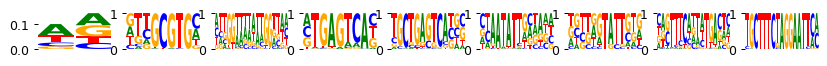

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 03:04:03.225511
	Loss: 188.723 , R2: 0.312
	Training time (model/function): (9.549s / 9.549s)
		per epoch (model/function): (0.682s/ 0.682s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985149711407525, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 03:04:14.213290
	Loss: 159.993 , R2: 0.314
	Training time (model/function): (19.093s / 9.545s)
		per epoch (model/function): (1.364s/ 0.682s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985149711407525, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 03:04:25.230244
	Loss: 147.976 , R2: 0.314
	Training time (model/function): (28.755s / 9.661s)
		per epoch (model/function): (2.054s/ 0.690s)
		per 1k samples: 0.128s
best loss 147.976
last five r2 values, by sequential filter optimization: ['0.314']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985149711407525, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 03:04:37.677806
	Loss: 149.380 , R2: 0.315
	Training time (model/function): (38.317s / 9.562s)
		per epoch (model/function): (2.737s/ 0.683s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985149711407525, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.56it/s]


Current time: 2024-06-19 03:04:48.828050
	Loss: 144.921 , R2: 0.315
	Training time (model/function): (48.024s / 9.707s)
		per epoch (model/function): (3.430s/ 0.693s)
		per 1k samples: 0.128s
best loss 144.921
last five r2 values, by sequential filter optimization: ['0.314', '0.315']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985149711407525, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 03:05:01.195124
	Loss: 148.491 , R2: 0.315
	Training time (model/function): (57.684s / 9.661s)
		per epoch (model/function): (4.120s/ 0.690s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985149711407525, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.55it/s]


Current time: 2024-06-19 03:05:12.367402
	Loss: 144.667 , R2: 0.315
	Training time (model/function): (67.498s / 9.813s)
		per epoch (model/function): (4.821s/ 0.701s)
		per 1k samples: 0.130s
best loss 144.667
last five r2 values, by sequential filter optimization: ['0.314', '0.315', '0.315']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985149711407525, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 03:05:24.805764
	Loss: 148.407 , R2: 0.316
	Training time (model/function): (77.072s / 9.574s)
		per epoch (model/function): (5.505s/ 0.684s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985149711407525, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 03:05:35.840872
	Loss: 144.646 , R2: 0.315
	Training time (model/function): (86.660s / 9.588s)
		per epoch (model/function): (6.190s/ 0.685s)
		per 1k samples: 0.127s
best loss 144.646
last five r2 values, by sequential filter optimization: ['0.314', '0.315', '0.315', '0.315']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985149711407525, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.60it/s]


Current time: 2024-06-19 03:05:48.139057
	Loss: 148.396 , R2: 0.317
	Training time (model/function): (96.171s / 9.511s)
		per epoch (model/function): (6.869s/ 0.679s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985149711407525, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 03:05:59.168222
	Loss: 144.644 , R2: 0.317
	Training time (model/function): (105.758s / 9.587s)
		per epoch (model/function): (7.554s/ 0.685s)
		per 1k samples: 0.127s
best loss 144.643
last five r2 values, by sequential filter optimization: ['0.314', '0.315', '0.315', '0.315', '0.317']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9985149711407525, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 105.75808811187744s
Time per epoch (total): 0.024 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_2/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


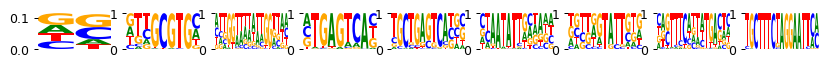

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:07:06.007139
	Loss: 188.774 , R2: 0.070
	Training time (model/function): (47.693s / 47.693s)
		per epoch (model/function): (3.407s/ 3.407s)
		per 1k samples: 0.631s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996593863521763, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:07:55.070887
	Loss: 159.981 , R2: 0.070
	Training time (model/function): (95.386s / 47.693s)
		per epoch (model/function): (6.813s/ 3.407s)
		per 1k samples: 0.631s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996593863521763, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:08:44.050964
	Loss: 147.964 , R2: 0.070
	Training time (model/function): (143.000s / 47.614s)
		per epoch (model/function): (10.214s/ 3.401s)
		per 1k samples: 0.630s
best loss 147.964
last five r2 values, by sequential filter optimization: ['0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996593863521763, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.18s/it]


Current time: 2024-06-19 03:09:34.695567
	Loss: 149.373 , R2: 0.070
	Training time (model/function): (190.848s / 47.848s)
		per epoch (model/function): (13.632s/ 3.418s)
		per 1k samples: 0.633s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996593863521763, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 03:10:23.654162
	Loss: 144.909 , R2: 0.070
	Training time (model/function): (238.436s / 47.588s)
		per epoch (model/function): (17.031s/ 3.399s)
		per 1k samples: 0.630s
best loss 144.909
last five r2 values, by sequential filter optimization: ['0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996593863521763, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:11:14.196159
	Loss: 148.494 , R2: 0.070
	Training time (model/function): (286.097s / 47.661s)
		per epoch (model/function): (20.436s/ 3.404s)
		per 1k samples: 0.631s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996593863521763, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 03:12:03.214646
	Loss: 144.656 , R2: 0.070
	Training time (model/function): (333.658s / 47.561s)
		per epoch (model/function): (23.833s/ 3.397s)
		per 1k samples: 0.629s
best loss 144.656
last five r2 values, by sequential filter optimization: ['0.070', '0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996593863521763, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:12:53.667582
	Loss: 148.420 , R2: 0.070
	Training time (model/function): (381.313s / 47.655s)
		per epoch (model/function): (27.237s/ 3.404s)
		per 1k samples: 0.630s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996593863521763, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 03:13:42.651879
	Loss: 144.636 , R2: 0.070
	Training time (model/function): (428.835s / 47.523s)
		per epoch (model/function): (30.631s/ 3.394s)
		per 1k samples: 0.629s
best loss 144.635
last five r2 values, by sequential filter optimization: ['0.070', '0.070', '0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996593863521763, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.18s/it]


Current time: 2024-06-19 03:14:33.392181
	Loss: 148.414 , R2: 0.070
	Training time (model/function): (476.675s / 47.840s)
		per epoch (model/function): (34.048s/ 3.417s)
		per 1k samples: 0.633s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996593863521763, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:15:22.473218
	Loss: 144.633 , R2: 0.070
	Training time (model/function): (524.298s / 47.622s)
		per epoch (model/function): (37.450s/ 3.402s)
		per 1k samples: 0.630s
best loss 144.633
last five r2 values, by sequential filter optimization: ['0.070', '0.070', '0.070', '0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996593863521763, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 524.2979335784912s
Time per epoch (total): 0.121 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_3/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pbmc/ra

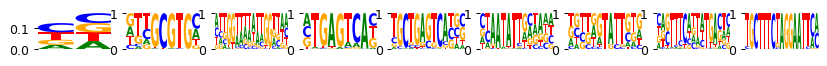

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 03:15:54.185084
	Loss: 188.721 , R2: 0.309
	Training time (model/function): (9.557s / 9.557s)
		per epoch (model/function): (0.683s/ 0.683s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998657335497945, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 03:16:05.193128
	Loss: 159.991 , R2: 0.311
	Training time (model/function): (19.128s / 9.571s)
		per epoch (model/function): (1.366s/ 0.684s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998657335497945, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 03:16:16.322706
	Loss: 147.974 , R2: 0.311
	Training time (model/function): (28.819s / 9.691s)
		per epoch (model/function): (2.058s/ 0.692s)
		per 1k samples: 0.128s
best loss 147.974
last five r2 values, by sequential filter optimization: ['0.311']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998657335497945, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 03:16:28.698650
	Loss: 149.378 , R2: 0.312
	Training time (model/function): (38.513s / 9.695s)
		per epoch (model/function): (2.751s/ 0.692s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998657335497945, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.54it/s]


Current time: 2024-06-19 03:16:39.933244
	Loss: 144.919 , R2: 0.312
	Training time (model/function): (48.380s / 9.867s)
		per epoch (model/function): (3.456s/ 0.705s)
		per 1k samples: 0.131s
best loss 144.919
last five r2 values, by sequential filter optimization: ['0.311', '0.312']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998657335497945, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 03:16:52.401193
	Loss: 148.489 , R2: 0.313
	Training time (model/function): (57.987s / 9.607s)
		per epoch (model/function): (4.142s/ 0.686s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998657335497945, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.56it/s]


Current time: 2024-06-19 03:17:03.563226
	Loss: 144.665 , R2: 0.313
	Training time (model/function): (67.707s / 9.720s)
		per epoch (model/function): (4.836s/ 0.694s)
		per 1k samples: 0.129s
best loss 144.665
last five r2 values, by sequential filter optimization: ['0.311', '0.312', '0.313']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998657335497945, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 03:17:15.936748
	Loss: 148.404 , R2: 0.313
	Training time (model/function): (77.312s / 9.605s)
		per epoch (model/function): (5.522s/ 0.686s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998657335497945, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 03:17:26.964235
	Loss: 144.643 , R2: 0.313
	Training time (model/function): (86.900s / 9.588s)
		per epoch (model/function): (6.207s/ 0.685s)
		per 1k samples: 0.127s
best loss 144.643
last five r2 values, by sequential filter optimization: ['0.311', '0.312', '0.313', '0.313']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998657335497945, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.60it/s]


Current time: 2024-06-19 03:17:39.245108
	Loss: 148.395 , R2: 0.315
	Training time (model/function): (96.399s / 9.499s)
		per epoch (model/function): (6.886s/ 0.678s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998657335497945, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 03:17:50.267120
	Loss: 144.642 , R2: 0.314
	Training time (model/function): (105.980s / 9.581s)
		per epoch (model/function): (7.570s/ 0.684s)
		per 1k samples: 0.127s
best loss 144.641
last five r2 values, by sequential filter optimization: ['0.311', '0.312', '0.313', '0.313', '0.314']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998657335497945, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 105.97969436645508s
Time per epoch (total): 0.024 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_3/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


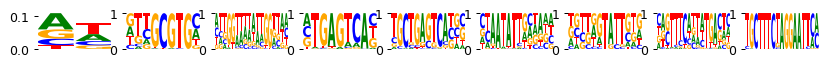

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.18s/it]


Current time: 2024-06-19 03:18:57.444027
	Loss: 188.766 , R2: 0.070
	Training time (model/function): (47.871s / 47.871s)
		per epoch (model/function): (3.419s/ 3.419s)
		per 1k samples: 0.633s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996928643145692, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.18s/it]


Current time: 2024-06-19 03:19:46.670633
	Loss: 159.980 , R2: 0.070
	Training time (model/function): (95.648s / 47.777s)
		per epoch (model/function): (6.832s/ 3.413s)
		per 1k samples: 0.632s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996928643145692, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.15s/it]


Current time: 2024-06-19 03:20:35.506147
	Loss: 147.963 , R2: 0.070
	Training time (model/function): (143.038s / 47.391s)
		per epoch (model/function): (10.217s/ 3.385s)
		per 1k samples: 0.627s
best loss 147.963
last five r2 values, by sequential filter optimization: ['0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996928643145692, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:21:26.049943
	Loss: 149.372 , R2: 0.070
	Training time (model/function): (190.696s / 47.658s)
		per epoch (model/function): (13.621s/ 3.404s)
		per 1k samples: 0.630s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996928643145692, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 03:22:15.043736
	Loss: 144.907 , R2: 0.070
	Training time (model/function): (238.242s / 47.546s)
		per epoch (model/function): (17.017s/ 3.396s)
		per 1k samples: 0.629s
best loss 144.907
last five r2 values, by sequential filter optimization: ['0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996928643145692, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:23:05.442452
	Loss: 148.491 , R2: 0.070
	Training time (model/function): (285.858s / 47.616s)
		per epoch (model/function): (20.418s/ 3.401s)
		per 1k samples: 0.630s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996928643145692, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.18s/it]


Current time: 2024-06-19 03:23:54.695309
	Loss: 144.653 , R2: 0.070
	Training time (model/function): (333.661s / 47.803s)
		per epoch (model/function): (23.833s/ 3.414s)
		per 1k samples: 0.632s
best loss 144.653
last five r2 values, by sequential filter optimization: ['0.070', '0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996928643145692, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:24:45.246725
	Loss: 148.418 , R2: 0.070
	Training time (model/function): (381.346s / 47.685s)
		per epoch (model/function): (27.239s/ 3.406s)
		per 1k samples: 0.631s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996928643145692, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.15s/it]


Current time: 2024-06-19 03:25:34.111626
	Loss: 144.633 , R2: 0.070
	Training time (model/function): (428.763s / 47.418s)
		per epoch (model/function): (30.626s/ 3.387s)
		per 1k samples: 0.627s
best loss 144.633
last five r2 values, by sequential filter optimization: ['0.070', '0.070', '0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996928643145692, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:26:24.618937
	Loss: 148.411 , R2: 0.070
	Training time (model/function): (476.385s / 47.622s)
		per epoch (model/function): (34.028s/ 3.402s)
		per 1k samples: 0.630s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996928643145692, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 03:27:13.491008
	Loss: 144.631 , R2: 0.070
	Training time (model/function): (523.899s / 47.514s)
		per epoch (model/function): (37.421s/ 3.394s)
		per 1k samples: 0.628s
best loss 144.631
last five r2 values, by sequential filter optimization: ['0.070', '0.070', '0.070', '0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996928643145692, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 523.899169921875s
Time per epoch (total): 0.120 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_4/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data/pbmc/ran

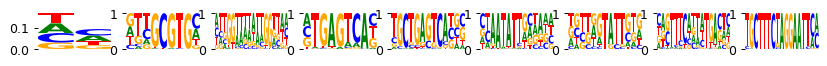

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 03:27:45.269831
	Loss: 188.720 , R2: 0.309
	Training time (model/function): (9.566s / 9.566s)
		per epoch (model/function): (0.683s/ 0.683s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986636344635084, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 03:27:56.195293
	Loss: 159.991 , R2: 0.311
	Training time (model/function): (19.142s / 9.577s)
		per epoch (model/function): (1.367s/ 0.684s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986636344635084, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.56it/s]


Current time: 2024-06-19 03:28:07.310405
	Loss: 147.975 , R2: 0.311
	Training time (model/function): (28.907s / 9.764s)
		per epoch (model/function): (2.065s/ 0.697s)
		per 1k samples: 0.129s
best loss 147.975
last five r2 values, by sequential filter optimization: ['0.311']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986636344635084, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 03:28:19.782775
	Loss: 149.379 , R2: 0.312
	Training time (model/function): (38.499s / 9.592s)
		per epoch (model/function): (2.750s/ 0.685s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986636344635084, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.56it/s]


Current time: 2024-06-19 03:28:30.962086
	Loss: 144.920 , R2: 0.312
	Training time (model/function): (48.238s / 9.739s)
		per epoch (model/function): (3.446s/ 0.696s)
		per 1k samples: 0.129s
best loss 144.920
last five r2 values, by sequential filter optimization: ['0.311', '0.312']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986636344635084, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 03:28:43.450271
	Loss: 148.487 , R2: 0.312
	Training time (model/function): (57.838s / 9.600s)
		per epoch (model/function): (4.131s/ 0.686s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986636344635084, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.56it/s]


Current time: 2024-06-19 03:28:54.518345
	Loss: 144.665 , R2: 0.312
	Training time (model/function): (67.555s / 9.717s)
		per epoch (model/function): (4.825s/ 0.694s)
		per 1k samples: 0.129s
best loss 144.665
last five r2 values, by sequential filter optimization: ['0.311', '0.312', '0.312']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986636344635084, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 03:29:07.008347
	Loss: 148.405 , R2: 0.313
	Training time (model/function): (77.136s / 9.582s)
		per epoch (model/function): (5.510s/ 0.684s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986636344635084, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 03:29:18.046795
	Loss: 144.644 , R2: 0.312
	Training time (model/function): (86.732s / 9.596s)
		per epoch (model/function): (6.195s/ 0.685s)
		per 1k samples: 0.127s
best loss 144.644
last five r2 values, by sequential filter optimization: ['0.311', '0.312', '0.312', '0.312']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986636344635084, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.60it/s]


Current time: 2024-06-19 03:29:30.391565
	Loss: 148.394 , R2: 0.314
	Training time (model/function): (96.240s / 9.509s)
		per epoch (model/function): (6.874s/ 0.679s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986636344635084, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 03:29:41.463937
	Loss: 144.642 , R2: 0.314
	Training time (model/function): (105.862s / 9.621s)
		per epoch (model/function): (7.562s/ 0.687s)
		per 1k samples: 0.127s
best loss 144.642
last five r2 values, by sequential filter optimization: ['0.311', '0.312', '0.312', '0.312', '0.314']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9986636344635084, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 105.86188697814941s
Time per epoch (total): 0.024 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_4/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


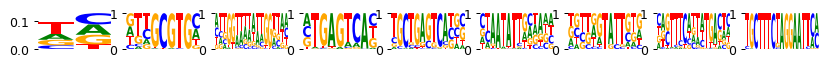

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 03:30:48.398825
	Loss: 188.760 , R2: 0.073
	Training time (model/function): (47.586s / 47.586s)
		per epoch (model/function): (3.399s/ 3.399s)
		per 1k samples: 0.630s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996753580755827, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:31:37.437189
	Loss: 159.980 , R2: 0.073
	Training time (model/function): (95.222s / 47.635s)
		per epoch (model/function): (6.802s/ 3.403s)
		per 1k samples: 0.630s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996753580755827, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 03:32:26.413773
	Loss: 147.963 , R2: 0.073
	Training time (model/function): (142.829s / 47.608s)
		per epoch (model/function): (10.202s/ 3.401s)
		per 1k samples: 0.630s
best loss 147.963
last five r2 values, by sequential filter optimization: ['0.073']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996753580755827, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 03:33:16.889567
	Loss: 149.372 , R2: 0.073
	Training time (model/function): (190.397s / 47.568s)
		per epoch (model/function): (13.600s/ 3.398s)
		per 1k samples: 0.629s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996753580755827, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 03:34:05.742838
	Loss: 144.908 , R2: 0.073
	Training time (model/function): (237.882s / 47.485s)
		per epoch (model/function): (16.992s/ 3.392s)
		per 1k samples: 0.628s
best loss 144.908
last five r2 values, by sequential filter optimization: ['0.073', '0.073']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996753580755827, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:34:56.363919
	Loss: 148.493 , R2: 0.073
	Training time (model/function): (285.602s / 47.720s)
		per epoch (model/function): (20.400s/ 3.409s)
		per 1k samples: 0.631s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996753580755827, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:35:45.477440
	Loss: 144.654 , R2: 0.073
	Training time (model/function): (333.252s / 47.650s)
		per epoch (model/function): (23.804s/ 3.404s)
		per 1k samples: 0.630s
best loss 144.654
last five r2 values, by sequential filter optimization: ['0.073', '0.073', '0.073']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996753580755827, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:36:36.025427
	Loss: 148.419 , R2: 0.073
	Training time (model/function): (380.991s / 47.739s)
		per epoch (model/function): (27.214s/ 3.410s)
		per 1k samples: 0.632s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996753580755827, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 03:37:25.125523
	Loss: 144.633 , R2: 0.073
	Training time (model/function): (428.632s / 47.641s)
		per epoch (model/function): (30.617s/ 3.403s)
		per 1k samples: 0.630s
best loss 144.633
last five r2 values, by sequential filter optimization: ['0.073', '0.073', '0.073', '0.073']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996753580755827, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.18s/it]


Current time: 2024-06-19 03:38:15.843383
	Loss: 148.412 , R2: 0.073
	Training time (model/function): (476.440s / 47.807s)
		per epoch (model/function): (34.031s/ 3.415s)
		per 1k samples: 0.632s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996753580755827, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 03:39:04.772302
	Loss: 144.631 , R2: 0.073
	Training time (model/function): (523.900s / 47.460s)
		per epoch (model/function): (37.421s/ 3.390s)
		per 1k samples: 0.628s
best loss 144.631
last five r2 values, by sequential filter optimization: ['0.073', '0.073', '0.073', '0.073', '0.073']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996753580755827, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 523.899959564209s
Time per epoch (total): 0.120 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/random/mubind_output/obs2000/pwms/fold_4/running_time_1.pkl
55

/home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/processed_laura_2023_obs2000_var6000.h5ad
pbmc (2000, 5991)
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_0/model.pt
False /home/ilibarra/workspace/thei

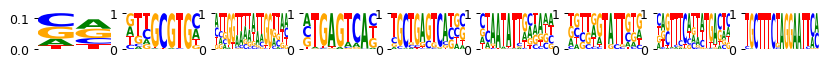

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 03:39:35.801597
	Loss: 188.542 , R2: 0.005
	Training time (model/function): (8.447s / 8.447s)
		per epoch (model/function): (0.603s/ 0.603s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992187736944138, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 03:39:45.564470
	Loss: 159.813 , R2: 0.005
	Training time (model/function): (16.857s / 8.410s)
		per epoch (model/function): (1.204s/ 0.601s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992187736944138, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.79it/s]


Current time: 2024-06-19 03:39:55.413435
	Loss: 147.796 , R2: 0.005
	Training time (model/function): (25.354s / 8.497s)
		per epoch (model/function): (1.811s/ 0.607s)
		per 1k samples: 0.113s
best loss 147.796
last five r2 values, by sequential filter optimization: ['0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992187736944138, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 03:40:06.405299
	Loss: 149.199 , R2: 0.006
	Training time (model/function): (33.737s / 8.383s)
		per epoch (model/function): (2.410s/ 0.599s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992187736944138, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.77it/s]


Current time: 2024-06-19 03:40:16.271255
	Loss: 144.741 , R2: 0.006
	Training time (model/function): (42.340s / 8.602s)
		per epoch (model/function): (3.024s/ 0.614s)
		per 1k samples: 0.114s
best loss 144.741
last five r2 values, by sequential filter optimization: ['0.005', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992187736944138, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 03:40:27.357884
	Loss: 148.308 , R2: 0.006
	Training time (model/function): (50.730s / 8.391s)
		per epoch (model/function): (3.624s/ 0.599s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992187736944138, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.79it/s]


Current time: 2024-06-19 03:40:37.198347
	Loss: 144.487 , R2: 0.006
	Training time (model/function): (59.213s / 8.482s)
		per epoch (model/function): (4.229s/ 0.606s)
		per 1k samples: 0.112s
best loss 144.487
last five r2 values, by sequential filter optimization: ['0.005', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992187736944138, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 03:40:48.169205
	Loss: 148.225 , R2: 0.006
	Training time (model/function): (67.658s / 8.446s)
		per epoch (model/function): (4.833s/ 0.603s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992187736944138, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.79it/s]


Current time: 2024-06-19 03:40:57.952092
	Loss: 144.466 , R2: 0.006
	Training time (model/function): (76.172s / 8.513s)
		per epoch (model/function): (5.441s/ 0.608s)
		per 1k samples: 0.113s
best loss 144.466
last five r2 values, by sequential filter optimization: ['0.005', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992187736944138, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 03:41:09.057612
	Loss: 148.210 , R2: 0.006
	Training time (model/function): (84.580s / 8.409s)
		per epoch (model/function): (6.041s/ 0.601s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992187736944138, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 03:41:18.853423
	Loss: 144.465 , R2: 0.006
	Training time (model/function): (93.020s / 8.440s)
		per epoch (model/function): (6.644s/ 0.603s)
		per 1k samples: 0.112s
best loss 144.465
last five r2 values, by sequential filter optimization: ['0.005', '0.006', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992187736944138, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 93.02005219459534s
Time per epoch (total): 0.021 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_0/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


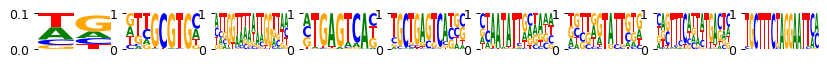

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 03:42:24.585235
	Loss: 188.601 , R2: 0.004
	Training time (model/function): (46.965s / 46.965s)
		per epoch (model/function): (3.355s/ 3.355s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999376750909304, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 03:43:12.870272
	Loss: 159.812 , R2: 0.005
	Training time (model/function): (93.883s / 46.918s)
		per epoch (model/function): (6.706s/ 3.351s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999376750909304, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 03:44:00.981888
	Loss: 147.795 , R2: 0.005
	Training time (model/function): (140.631s / 46.748s)
		per epoch (model/function): (10.045s/ 3.339s)
		per 1k samples: 0.619s
best loss 147.795
last five r2 values, by sequential filter optimization: ['0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999376750909304, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 03:44:50.703969
	Loss: 149.203 , R2: 0.005
	Training time (model/function): (187.615s / 46.985s)
		per epoch (model/function): (13.401s/ 3.356s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999376750909304, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 03:45:38.833258
	Loss: 144.739 , R2: 0.005
	Training time (model/function): (234.385s / 46.770s)
		per epoch (model/function): (16.742s/ 3.341s)
		per 1k samples: 0.620s
best loss 144.739
last five r2 values, by sequential filter optimization: ['0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999376750909304, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 03:46:28.539879
	Loss: 148.320 , R2: 0.005
	Training time (model/function): (281.470s / 47.085s)
		per epoch (model/function): (20.105s/ 3.363s)
		per 1k samples: 0.624s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999376750909304, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 03:47:16.830998
	Loss: 144.486 , R2: 0.005
	Training time (model/function): (328.399s / 46.929s)
		per epoch (model/function): (23.457s/ 3.352s)
		per 1k samples: 0.622s
best loss 144.486
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999376750909304, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 03:48:06.393506
	Loss: 148.244 , R2: 0.005
	Training time (model/function): (375.238s / 46.839s)
		per epoch (model/function): (26.803s/ 3.346s)
		per 1k samples: 0.621s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999376750909304, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 03:48:54.498779
	Loss: 144.465 , R2: 0.005
	Training time (model/function): (421.983s / 46.745s)
		per epoch (model/function): (30.142s/ 3.339s)
		per 1k samples: 0.619s
best loss 144.465
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999376750909304, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 03:49:44.271203
	Loss: 148.235 , R2: 0.005
	Training time (model/function): (469.051s / 47.067s)
		per epoch (model/function): (33.504s/ 3.362s)
		per 1k samples: 0.624s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999376750909304, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 03:50:32.407271
	Loss: 144.463 , R2: 0.005
	Training time (model/function): (515.912s / 46.862s)
		per epoch (model/function): (36.851s/ 3.347s)
		per 1k samples: 0.621s
best loss 144.463
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999376750909304, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 515.9122710227966s
Time per epoch (total): 0.119 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_1/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data

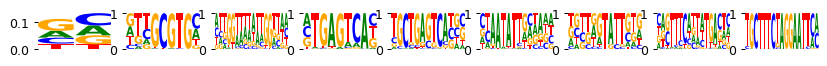

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 03:51:02.314125
	Loss: 188.542 , R2: 0.005
	Training time (model/function): (8.367s / 8.367s)
		per epoch (model/function): (0.598s/ 0.598s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992134865621506, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.79it/s]


Current time: 2024-06-19 03:51:12.060214
	Loss: 159.813 , R2: 0.005
	Training time (model/function): (16.848s / 8.481s)
		per epoch (model/function): (1.203s/ 0.606s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992134865621506, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.77it/s]


Current time: 2024-06-19 03:51:21.891965
	Loss: 147.796 , R2: 0.005
	Training time (model/function): (25.419s / 8.571s)
		per epoch (model/function): (1.816s/ 0.612s)
		per 1k samples: 0.114s
best loss 147.796
last five r2 values, by sequential filter optimization: ['0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992134865621506, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 03:51:32.970912
	Loss: 149.199 , R2: 0.006
	Training time (model/function): (33.805s / 8.387s)
		per epoch (model/function): (2.415s/ 0.599s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992134865621506, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.78it/s]


Current time: 2024-06-19 03:51:42.836234
	Loss: 144.741 , R2: 0.006
	Training time (model/function): (42.318s / 8.512s)
		per epoch (model/function): (3.023s/ 0.608s)
		per 1k samples: 0.113s
best loss 144.741
last five r2 values, by sequential filter optimization: ['0.005', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992134865621506, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 03:51:53.811523
	Loss: 148.308 , R2: 0.006
	Training time (model/function): (50.780s / 8.463s)
		per epoch (model/function): (3.627s/ 0.604s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992134865621506, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.78it/s]


Current time: 2024-06-19 03:52:03.619667
	Loss: 144.487 , R2: 0.006
	Training time (model/function): (59.329s / 8.548s)
		per epoch (model/function): (4.238s/ 0.611s)
		per 1k samples: 0.113s
best loss 144.487
last five r2 values, by sequential filter optimization: ['0.005', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992134865621506, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 03:52:14.692626
	Loss: 148.225 , R2: 0.006
	Training time (model/function): (67.717s / 8.388s)
		per epoch (model/function): (4.837s/ 0.599s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992134865621506, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 03:52:24.475789
	Loss: 144.466 , R2: 0.006
	Training time (model/function): (76.145s / 8.428s)
		per epoch (model/function): (5.439s/ 0.602s)
		per 1k samples: 0.112s
best loss 144.466
last five r2 values, by sequential filter optimization: ['0.005', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992134865621506, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 03:52:35.465027
	Loss: 148.213 , R2: 0.006
	Training time (model/function): (84.532s / 8.388s)
		per epoch (model/function): (6.038s/ 0.599s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992134865621506, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 03:52:45.229026
	Loss: 144.465 , R2: 0.006
	Training time (model/function): (92.946s / 8.413s)
		per epoch (model/function): (6.639s/ 0.601s)
		per 1k samples: 0.111s
best loss 144.465
last five r2 values, by sequential filter optimization: ['0.005', '0.006', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992134865621506, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 92.9456467628479s
Time per epoch (total): 0.021 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_1/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


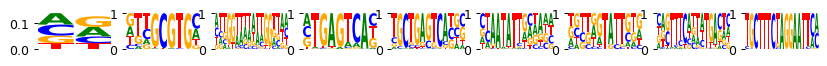

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 03:53:51.173935
	Loss: 188.599 , R2: 0.004
	Training time (model/function): (47.070s / 47.070s)
		per epoch (model/function): (3.362s/ 3.362s)
		per 1k samples: 0.624s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999363996637489, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 03:54:39.482972
	Loss: 159.812 , R2: 0.005
	Training time (model/function): (94.018s / 46.948s)
		per epoch (model/function): (6.716s/ 3.353s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999363996637489, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 03:55:27.629470
	Loss: 147.795 , R2: 0.005
	Training time (model/function): (140.800s / 46.782s)
		per epoch (model/function): (10.057s/ 3.342s)
		per 1k samples: 0.620s
best loss 147.795
last five r2 values, by sequential filter optimization: ['0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999363996637489, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 03:56:17.196913
	Loss: 149.203 , R2: 0.005
	Training time (model/function): (187.834s / 47.035s)
		per epoch (model/function): (13.417s/ 3.360s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999363996637489, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 03:57:05.391706
	Loss: 144.739 , R2: 0.005
	Training time (model/function): (234.665s / 46.831s)
		per epoch (model/function): (16.762s/ 3.345s)
		per 1k samples: 0.620s
best loss 144.739
last five r2 values, by sequential filter optimization: ['0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999363996637489, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 03:57:55.046968
	Loss: 148.320 , R2: 0.005
	Training time (model/function): (281.697s / 47.032s)
		per epoch (model/function): (20.121s/ 3.359s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999363996637489, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 03:58:43.241943
	Loss: 144.486 , R2: 0.005
	Training time (model/function): (328.534s / 46.837s)
		per epoch (model/function): (23.467s/ 3.345s)
		per 1k samples: 0.621s
best loss 144.486
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999363996637489, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 03:59:32.922965
	Loss: 148.244 , R2: 0.005
	Training time (model/function): (375.495s / 46.961s)
		per epoch (model/function): (26.821s/ 3.354s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999363996637489, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 04:00:21.094992
	Loss: 144.465 , R2: 0.005
	Training time (model/function): (422.301s / 46.806s)
		per epoch (model/function): (30.164s/ 3.343s)
		per 1k samples: 0.620s
best loss 144.465
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999363996637489, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:01:10.670202
	Loss: 148.236 , R2: 0.005
	Training time (model/function): (469.258s / 46.956s)
		per epoch (model/function): (33.518s/ 3.354s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999363996637489, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:01:58.930381
	Loss: 144.463 , R2: 0.005
	Training time (model/function): (516.156s / 46.898s)
		per epoch (model/function): (36.868s/ 3.350s)
		per 1k samples: 0.621s
best loss 144.463
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999363996637489, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 516.1556222438812s
Time per epoch (total): 0.119 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_2/model_1.pt
/home/ilibarra/workspace/theislab/mubind/data

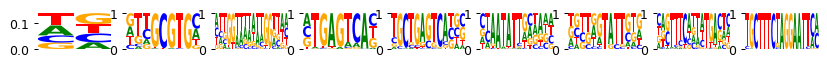

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 04:02:28.932695
	Loss: 188.542 , R2: 0.005
	Training time (model/function): (8.359s / 8.359s)
		per epoch (model/function): (0.597s/ 0.597s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991990973873407, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 04:02:38.661027
	Loss: 159.813 , R2: 0.005
	Training time (model/function): (16.731s / 8.372s)
		per epoch (model/function): (1.195s/ 0.598s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991990973873407, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.79it/s]


Current time: 2024-06-19 04:02:48.491053
	Loss: 147.796 , R2: 0.005
	Training time (model/function): (25.207s / 8.476s)
		per epoch (model/function): (1.801s/ 0.605s)
		per 1k samples: 0.112s
best loss 147.796
last five r2 values, by sequential filter optimization: ['0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991990973873407, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 04:02:59.470718
	Loss: 149.199 , R2: 0.005
	Training time (model/function): (33.581s / 8.374s)
		per epoch (model/function): (2.399s/ 0.598s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991990973873407, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.77it/s]


Current time: 2024-06-19 04:03:09.328701
	Loss: 144.741 , R2: 0.005
	Training time (model/function): (42.165s / 8.583s)
		per epoch (model/function): (3.012s/ 0.613s)
		per 1k samples: 0.114s
best loss 144.741
last five r2 values, by sequential filter optimization: ['0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991990973873407, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 04:03:20.396919
	Loss: 148.309 , R2: 0.006
	Training time (model/function): (50.546s / 8.381s)
		per epoch (model/function): (3.610s/ 0.599s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991990973873407, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.79it/s]


Current time: 2024-06-19 04:03:30.249628
	Loss: 144.487 , R2: 0.006
	Training time (model/function): (59.043s / 8.497s)
		per epoch (model/function): (4.217s/ 0.607s)
		per 1k samples: 0.113s
best loss 144.487
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991990973873407, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 04:03:41.229126
	Loss: 148.225 , R2: 0.006
	Training time (model/function): (67.505s / 8.462s)
		per epoch (model/function): (4.822s/ 0.604s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991990973873407, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.79it/s]


Current time: 2024-06-19 04:03:51.000299
	Loss: 144.466 , R2: 0.006
	Training time (model/function): (76.009s / 8.505s)
		per epoch (model/function): (5.429s/ 0.607s)
		per 1k samples: 0.113s
best loss 144.466
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991990973873407, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 04:04:02.112008
	Loss: 148.210 , R2: 0.006
	Training time (model/function): (84.408s / 8.399s)
		per epoch (model/function): (6.029s/ 0.600s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991990973873407, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 04:04:11.908613
	Loss: 144.465 , R2: 0.006
	Training time (model/function): (92.848s / 8.439s)
		per epoch (model/function): (6.632s/ 0.603s)
		per 1k samples: 0.112s
best loss 144.465
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991990973873407, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 92.84791588783264s
Time per epoch (total): 0.021 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_2/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


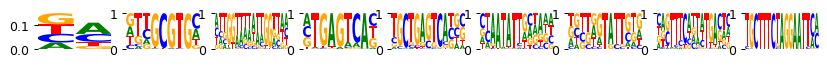

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 04:05:17.800892
	Loss: 188.598 , R2: 0.004
	Training time (model/function): (47.049s / 47.049s)
		per epoch (model/function): (3.361s/ 3.361s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994181930618842, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.13s/it]


Current time: 2024-06-19 04:06:06.199149
	Loss: 159.812 , R2: 0.005
	Training time (model/function): (94.176s / 47.127s)
		per epoch (model/function): (6.727s/ 3.366s)
		per 1k samples: 0.624s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994181930618842, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:06:54.341795
	Loss: 147.795 , R2: 0.005
	Training time (model/function): (141.045s / 46.868s)
		per epoch (model/function): (10.075s/ 3.348s)
		per 1k samples: 0.621s
best loss 147.795
last five r2 values, by sequential filter optimization: ['0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994181930618842, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Current time: 2024-06-19 04:07:44.126686
	Loss: 149.203 , R2: 0.005
	Training time (model/function): (188.201s / 47.156s)
		per epoch (model/function): (13.443s/ 3.368s)
		per 1k samples: 0.625s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994181930618842, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 04:08:32.402201
	Loss: 144.739 , R2: 0.005
	Training time (model/function): (235.204s / 47.003s)
		per epoch (model/function): (16.800s/ 3.357s)
		per 1k samples: 0.623s
best loss 144.739
last five r2 values, by sequential filter optimization: ['0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994181930618842, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 04:09:22.127273
	Loss: 148.319 , R2: 0.005
	Training time (model/function): (282.197s / 46.993s)
		per epoch (model/function): (20.157s/ 3.357s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994181930618842, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:10:10.363876
	Loss: 144.486 , R2: 0.005
	Training time (model/function): (329.071s / 46.874s)
		per epoch (model/function): (23.505s/ 3.348s)
		per 1k samples: 0.621s
best loss 144.486
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994181930618842, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 04:11:00.009021
	Loss: 148.243 , R2: 0.005
	Training time (model/function): (376.095s / 47.024s)
		per epoch (model/function): (26.864s/ 3.359s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994181930618842, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:11:48.201290
	Loss: 144.465 , R2: 0.005
	Training time (model/function): (422.930s / 46.835s)
		per epoch (model/function): (30.209s/ 3.345s)
		per 1k samples: 0.621s
best loss 144.465
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994181930618842, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 04:12:37.952025
	Loss: 148.234 , R2: 0.005
	Training time (model/function): (469.957s / 47.028s)
		per epoch (model/function): (33.568s/ 3.359s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994181930618842, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:13:26.312122
	Loss: 144.463 , R2: 0.005
	Training time (model/function): (516.931s / 46.974s)
		per epoch (model/function): (36.924s/ 3.355s)
		per 1k samples: 0.622s
best loss 144.463
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9994181930618842, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 516.9309477806091s
Time per epoch (total): 0.119 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_3/model_1.pt
/home/ilibarra/workspace/theislab/mubind/dat

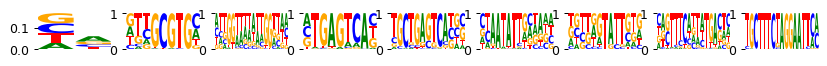

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 04:13:56.211136
	Loss: 188.542 , R2: 0.005
	Training time (model/function): (8.365s / 8.365s)
		per epoch (model/function): (0.597s/ 0.597s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991807924355044, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.79it/s]


Current time: 2024-06-19 04:14:05.955761
	Loss: 159.813 , R2: 0.005
	Training time (model/function): (16.849s / 8.484s)
		per epoch (model/function): (1.204s/ 0.606s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991807924355044, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.77it/s]


Current time: 2024-06-19 04:14:15.793937
	Loss: 147.796 , R2: 0.005
	Training time (model/function): (25.427s / 8.578s)
		per epoch (model/function): (1.816s/ 0.613s)
		per 1k samples: 0.114s
best loss 147.796
last five r2 values, by sequential filter optimization: ['0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991807924355044, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 04:14:26.848523
	Loss: 149.199 , R2: 0.006
	Training time (model/function): (33.790s / 8.363s)
		per epoch (model/function): (2.414s/ 0.597s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991807924355044, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.78it/s]


Current time: 2024-06-19 04:14:36.719956
	Loss: 144.741 , R2: 0.006
	Training time (model/function): (42.309s / 8.519s)
		per epoch (model/function): (3.022s/ 0.609s)
		per 1k samples: 0.113s
best loss 144.741
last five r2 values, by sequential filter optimization: ['0.005', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991807924355044, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 04:14:47.697620
	Loss: 148.308 , R2: 0.006
	Training time (model/function): (50.686s / 8.377s)
		per epoch (model/function): (3.620s/ 0.598s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991807924355044, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.77it/s]


Current time: 2024-06-19 04:14:57.526904
	Loss: 144.487 , R2: 0.006
	Training time (model/function): (59.252s / 8.565s)
		per epoch (model/function): (4.232s/ 0.612s)
		per 1k samples: 0.113s
best loss 144.487
last five r2 values, by sequential filter optimization: ['0.005', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991807924355044, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 04:15:08.601646
	Loss: 148.225 , R2: 0.006
	Training time (model/function): (67.641s / 8.389s)
		per epoch (model/function): (4.831s/ 0.599s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991807924355044, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 04:15:18.373109
	Loss: 144.466 , R2: 0.006
	Training time (model/function): (76.058s / 8.417s)
		per epoch (model/function): (5.433s/ 0.601s)
		per 1k samples: 0.112s
best loss 144.466
last five r2 values, by sequential filter optimization: ['0.005', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991807924355044, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.79it/s]


Current time: 2024-06-19 04:15:29.364916
	Loss: 148.211 , R2: 0.006
	Training time (model/function): (84.543s / 8.485s)
		per epoch (model/function): (6.039s/ 0.606s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991807924355044, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 04:15:39.150796
	Loss: 144.465 , R2: 0.006
	Training time (model/function): (92.978s / 8.435s)
		per epoch (model/function): (6.641s/ 0.603s)
		per 1k samples: 0.112s
best loss 144.465
last five r2 values, by sequential filter optimization: ['0.005', '0.006', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991807924355044, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 92.97811627388s
Time per epoch (total): 0.021 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_3/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


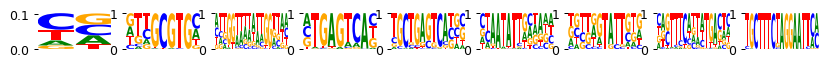

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:16:44.966232
	Loss: 188.612 , R2: 0.004
	Training time (model/function): (46.977s / 46.977s)
		per epoch (model/function): (3.355s/ 3.355s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993676765426996, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:17:33.308121
	Loss: 159.812 , R2: 0.005
	Training time (model/function): (93.936s / 46.959s)
		per epoch (model/function): (6.710s/ 3.354s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993676765426996, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 04:18:21.464930
	Loss: 147.795 , R2: 0.005
	Training time (model/function): (140.704s / 46.768s)
		per epoch (model/function): (10.050s/ 3.341s)
		per 1k samples: 0.620s
best loss 147.795
last five r2 values, by sequential filter optimization: ['0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993676765426996, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 04:19:11.104301
	Loss: 149.203 , R2: 0.005
	Training time (model/function): (187.697s / 46.994s)
		per epoch (model/function): (13.407s/ 3.357s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993676765426996, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:19:59.313136
	Loss: 144.739 , R2: 0.005
	Training time (model/function): (234.543s / 46.846s)
		per epoch (model/function): (16.753s/ 3.346s)
		per 1k samples: 0.621s
best loss 144.739
last five r2 values, by sequential filter optimization: ['0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993676765426996, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Current time: 2024-06-19 04:20:49.226654
	Loss: 148.319 , R2: 0.005
	Training time (model/function): (281.718s / 47.174s)
		per epoch (model/function): (20.123s/ 3.370s)
		per 1k samples: 0.625s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993676765426996, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 04:21:37.349992
	Loss: 144.486 , R2: 0.005
	Training time (model/function): (328.477s / 46.760s)
		per epoch (model/function): (23.463s/ 3.340s)
		per 1k samples: 0.620s
best loss 144.486
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993676765426996, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:22:26.951167
	Loss: 148.243 , R2: 0.005
	Training time (model/function): (375.433s / 46.956s)
		per epoch (model/function): (26.817s/ 3.354s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993676765426996, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 04:23:15.016866
	Loss: 144.465 , R2: 0.005
	Training time (model/function): (422.135s / 46.702s)
		per epoch (model/function): (30.152s/ 3.336s)
		per 1k samples: 0.619s
best loss 144.465
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993676765426996, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:24:04.708504
	Loss: 148.235 , R2: 0.005
	Training time (model/function): (469.084s / 46.949s)
		per epoch (model/function): (33.506s/ 3.354s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993676765426996, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 04:24:52.859475
	Loss: 144.463 , R2: 0.005
	Training time (model/function): (515.876s / 46.792s)
		per epoch (model/function): (36.848s/ 3.342s)
		per 1k samples: 0.620s
best loss 144.463
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993676765426996, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 515.8763377666473s
Time per epoch (total): 0.119 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_4/model_1.pt
/home/ilibarra/workspace/theislab/mubind/dat

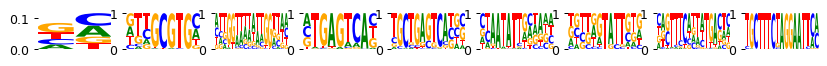

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.79it/s]


Current time: 2024-06-19 04:25:22.855012
	Loss: 188.542 , R2: 0.005
	Training time (model/function): (8.487s / 8.487s)
		per epoch (model/function): (0.606s/ 0.606s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991653889931, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 04:25:32.578787
	Loss: 159.813 , R2: 0.005
	Training time (model/function): (16.945s / 8.458s)
		per epoch (model/function): (1.210s/ 0.604s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991653889931, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.77it/s]


Current time: 2024-06-19 04:25:42.417223
	Loss: 147.796 , R2: 0.005
	Training time (model/function): (25.516s / 8.571s)
		per epoch (model/function): (1.823s/ 0.612s)
		per 1k samples: 0.114s
best loss 147.796
last five r2 values, by sequential filter optimization: ['0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991653889931, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 04:25:53.474793
	Loss: 149.199 , R2: 0.006
	Training time (model/function): (33.885s / 8.369s)
		per epoch (model/function): (2.420s/ 0.598s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991653889931, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.79it/s]


Current time: 2024-06-19 04:26:03.298640
	Loss: 144.741 , R2: 0.006
	Training time (model/function): (42.355s / 8.471s)
		per epoch (model/function): (3.025s/ 0.605s)
		per 1k samples: 0.112s
best loss 144.741
last five r2 values, by sequential filter optimization: ['0.005', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991653889931, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 04:26:14.263386
	Loss: 148.308 , R2: 0.006
	Training time (model/function): (50.808s / 8.452s)
		per epoch (model/function): (3.629s/ 0.604s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991653889931, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.77it/s]


Current time: 2024-06-19 04:26:24.099713
	Loss: 144.487 , R2: 0.006
	Training time (model/function): (59.383s / 8.575s)
		per epoch (model/function): (4.242s/ 0.612s)
		per 1k samples: 0.114s
best loss 144.487
last five r2 values, by sequential filter optimization: ['0.005', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991653889931, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 04:26:35.168649
	Loss: 148.225 , R2: 0.006
	Training time (model/function): (67.766s / 8.384s)
		per epoch (model/function): (4.840s/ 0.599s)
		per 1k samples: 0.111s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991653889931, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 04:26:44.961962
	Loss: 144.466 , R2: 0.006
	Training time (model/function): (76.202s / 8.435s)
		per epoch (model/function): (5.443s/ 0.603s)
		per 1k samples: 0.112s
best loss 144.466
last five r2 values, by sequential filter optimization: ['0.005', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991653889931, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 04:26:55.928875
	Loss: 148.215 , R2: 0.006
	Training time (model/function): (84.657s / 8.456s)
		per epoch (model/function): (6.047s/ 0.604s)
		per 1k samples: 0.112s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991653889931, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 04:27:05.714036
	Loss: 144.465 , R2: 0.006
	Training time (model/function): (93.090s / 8.433s)
		per epoch (model/function): (6.649s/ 0.602s)
		per 1k samples: 0.112s
best loss 144.465
last five r2 values, by sequential filter optimization: ['0.005', '0.006', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991653889931, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 93.09016156196594s
Time per epoch (total): 0.021 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_4/running_time_0.pkl
pbmc /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


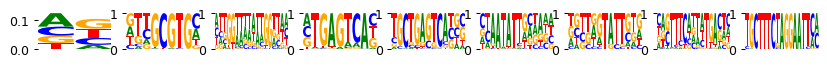

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:28:11.521080
	Loss: 188.606 , R2: 0.004
	Training time (model/function): (46.960s / 46.960s)
		per epoch (model/function): (3.354s/ 3.354s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993795287395218, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 04:28:59.664559
	Loss: 159.812 , R2: 0.005
	Training time (model/function): (93.722s / 46.762s)
		per epoch (model/function): (6.694s/ 3.340s)
		per 1k samples: 0.620s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993795287395218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 04:29:47.737875
	Loss: 147.795 , R2: 0.005
	Training time (model/function): (140.426s / 46.704s)
		per epoch (model/function): (10.030s/ 3.336s)
		per 1k samples: 0.619s
best loss 147.795
last five r2 values, by sequential filter optimization: ['0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993795287395218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:30:37.442038
	Loss: 149.203 , R2: 0.005
	Training time (model/function): (187.389s / 46.963s)
		per epoch (model/function): (13.385s/ 3.355s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993795287395218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:31:25.720398
	Loss: 144.739 , R2: 0.005
	Training time (model/function): (234.281s / 46.891s)
		per epoch (model/function): (16.734s/ 3.349s)
		per 1k samples: 0.621s
best loss 144.739
last five r2 values, by sequential filter optimization: ['0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993795287395218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 04:32:15.483942
	Loss: 148.319 , R2: 0.005
	Training time (model/function): (281.393s / 47.112s)
		per epoch (model/function): (20.100s/ 3.365s)
		per 1k samples: 0.624s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993795287395218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 04:33:03.882842
	Loss: 144.486 , R2: 0.005
	Training time (model/function): (328.498s / 47.105s)
		per epoch (model/function): (23.464s/ 3.365s)
		per 1k samples: 0.624s
best loss 144.486
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993795287395218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 04:33:53.667526
	Loss: 148.243 , R2: 0.005
	Training time (model/function): (375.546s / 47.047s)
		per epoch (model/function): (26.825s/ 3.361s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993795287395218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 04:34:41.837759
	Loss: 144.465 , R2: 0.005
	Training time (model/function): (422.330s / 46.784s)
		per epoch (model/function): (30.166s/ 3.342s)
		per 1k samples: 0.620s
best loss 144.465
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993795287395218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 04:35:31.425076
	Loss: 148.234 , R2: 0.005
	Training time (model/function): (469.352s / 47.022s)
		per epoch (model/function): (33.525s/ 3.359s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993795287395218, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 04:36:19.745718
	Loss: 144.463 , R2: 0.005
	Training time (model/function): (516.288s / 46.936s)
		per epoch (model/function): (36.878s/ 3.353s)
		per 1k samples: 0.622s
best loss 144.463
last five r2 values, by sequential filter optimization: ['0.005', '0.005', '0.005', '0.005', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993795287395218, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 516.2879784107208s
Time per epoch (total): 0.119 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pbmc/episcanpy/mubind_output/obs2000/pwms/fold_4/running_time_1.pkl
60

/home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/pancreas_multiome_2022_processed_atac_obs2000_var6000.h5ad
pancreatic_endocrinogenesis (2000, 6000)
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesi

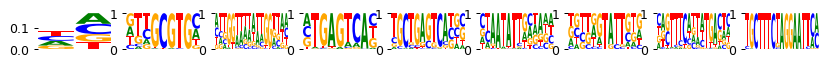

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.86it/s]


Current time: 2024-06-19 04:36:49.846210
	Loss: 188.545 , R2: 0.002
	Training time (model/function): (8.158s / 8.158s)
		per epoch (model/function): (0.583s/ 0.583s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993662064596889, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.87it/s]


Current time: 2024-06-19 04:36:59.187820
	Loss: 159.815 , R2: 0.002
	Training time (model/function): (16.258s / 8.101s)
		per epoch (model/function): (1.161s/ 0.579s)
		per 1k samples: 0.107s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993662064596889, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 04:37:08.641146
	Loss: 147.799 , R2: 0.002
	Training time (model/function): (24.475s / 8.216s)
		per epoch (model/function): (1.748s/ 0.587s)
		per 1k samples: 0.109s
best loss 147.799
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993662064596889, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  1.89it/s]


Current time: 2024-06-19 04:37:19.311833
	Loss: 149.202 , R2: 0.002
	Training time (model/function): (32.510s / 8.035s)
		per epoch (model/function): (2.322s/ 0.574s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993662064596889, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.86it/s]


Current time: 2024-06-19 04:37:28.799566
	Loss: 144.744 , R2: 0.002
	Training time (model/function): (40.664s / 8.154s)
		per epoch (model/function): (2.905s/ 0.582s)
		per 1k samples: 0.108s
best loss 144.744
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993662064596889, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.87it/s]


Current time: 2024-06-19 04:37:39.359824
	Loss: 148.312 , R2: 0.002
	Training time (model/function): (48.762s / 8.098s)
		per epoch (model/function): (3.483s/ 0.578s)
		per 1k samples: 0.107s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993662064596889, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.87it/s]


Current time: 2024-06-19 04:37:48.804376
	Loss: 144.490 , R2: 0.002
	Training time (model/function): (56.884s / 8.122s)
		per epoch (model/function): (4.063s/ 0.580s)
		per 1k samples: 0.107s
best loss 144.490
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993662064596889, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  1.90it/s]


Current time: 2024-06-19 04:37:59.441007
	Loss: 148.229 , R2: 0.002
	Training time (model/function): (64.882s / 7.998s)
		per epoch (model/function): (4.634s/ 0.571s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993662064596889, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  1.88it/s]


Current time: 2024-06-19 04:38:08.844699
	Loss: 144.469 , R2: 0.002
	Training time (model/function): (72.951s / 8.069s)
		per epoch (model/function): (5.211s/ 0.576s)
		per 1k samples: 0.107s
best loss 144.469
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993662064596889, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  1.89it/s]


Current time: 2024-06-19 04:38:19.422117
	Loss: 148.223 , R2: 0.002
	Training time (model/function): (80.983s / 8.032s)
		per epoch (model/function): (5.784s/ 0.574s)
		per 1k samples: 0.106s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993662064596889, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  1.88it/s]


Current time: 2024-06-19 04:38:28.812068
	Loss: 144.467 , R2: 0.002
	Training time (model/function): (89.043s / 8.060s)
		per epoch (model/function): (6.360s/ 0.576s)
		per 1k samples: 0.107s
best loss 144.467
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993662064596889, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 89.04257607460022s
Time per epoch (total): 0.020 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_0/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order Non

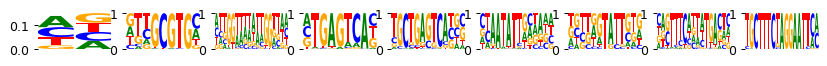

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.01s/it]


Current time: 2024-06-19 04:39:32.595451
	Loss: 188.629 , R2: 0.002
	Training time (model/function): (45.294s / 45.294s)
		per epoch (model/function): (3.235s/ 3.235s)
		per 1k samples: 0.599s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995910925031185, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.04s/it]


Current time: 2024-06-19 04:40:19.512411
	Loss: 159.815 , R2: 0.002
	Training time (model/function): (90.957s / 45.663s)
		per epoch (model/function): (6.497s/ 3.262s)
		per 1k samples: 0.604s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995910925031185, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 04:41:06.103722
	Loss: 147.798 , R2: 0.002
	Training time (model/function): (136.296s / 45.339s)
		per epoch (model/function): (9.735s/ 3.239s)
		per 1k samples: 0.600s
best loss 147.798
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995910925031185, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 04:41:54.161035
	Loss: 149.207 , R2: 0.002
	Training time (model/function): (181.680s / 45.384s)
		per epoch (model/function): (12.977s/ 3.242s)
		per 1k samples: 0.600s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995910925031185, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.01s/it]


Current time: 2024-06-19 04:42:40.718203
	Loss: 144.743 , R2: 0.002
	Training time (model/function): (226.896s / 45.216s)
		per epoch (model/function): (16.207s/ 3.230s)
		per 1k samples: 0.598s
best loss 144.743
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995910925031185, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 04:43:28.686621
	Loss: 148.327 , R2: 0.002
	Training time (model/function): (272.290s / 45.394s)
		per epoch (model/function): (19.449s/ 3.242s)
		per 1k samples: 0.601s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995910925031185, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 04:44:15.451423
	Loss: 144.489 , R2: 0.002
	Training time (model/function): (317.714s / 45.424s)
		per epoch (model/function): (22.694s/ 3.245s)
		per 1k samples: 0.601s
best loss 144.489
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995910925031185, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 04:45:03.624841
	Loss: 148.254 , R2: 0.002
	Training time (model/function): (363.324s / 45.610s)
		per epoch (model/function): (25.952s/ 3.258s)
		per 1k samples: 0.603s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995910925031185, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.01s/it]


Current time: 2024-06-19 04:45:50.264573
	Loss: 144.468 , R2: 0.002
	Training time (model/function): (408.626s / 45.303s)
		per epoch (model/function): (29.188s/ 3.236s)
		per 1k samples: 0.599s
best loss 144.468
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995910925031185, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 04:46:38.366668
	Loss: 148.248 , R2: 0.002
	Training time (model/function): (454.025s / 45.399s)
		per epoch (model/function): (32.430s/ 3.243s)
		per 1k samples: 0.601s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995910925031185, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.01s/it]


Current time: 2024-06-19 04:47:24.967923
	Loss: 144.466 , R2: 0.002
	Training time (model/function): (499.280s / 45.255s)
		per epoch (model/function): (35.663s/ 3.232s)
		per 1k samples: 0.599s
best loss 144.466
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995910925031185, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 499.2803678512573s
Time per epoch (total): 0.115 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs200

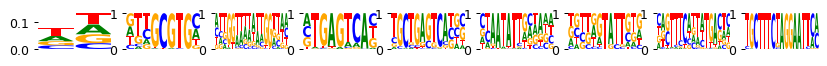

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.86it/s]


Current time: 2024-06-19 04:47:52.947443
	Loss: 188.545 , R2: 0.002
	Training time (model/function): (8.166s / 8.166s)
		per epoch (model/function): (0.583s/ 0.583s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992959215584641, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.86it/s]


Current time: 2024-06-19 04:48:02.364611
	Loss: 159.815 , R2: 0.002
	Training time (model/function): (16.335s / 8.170s)
		per epoch (model/function): (1.167s/ 0.584s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992959215584641, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 04:48:12.006045
	Loss: 147.799 , R2: 0.002
	Training time (model/function): (24.713s / 8.378s)
		per epoch (model/function): (1.765s/ 0.598s)
		per 1k samples: 0.111s
best loss 147.799
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992959215584641, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 04:48:22.886911
	Loss: 149.202 , R2: 0.002
	Training time (model/function): (32.928s / 8.215s)
		per epoch (model/function): (2.352s/ 0.587s)
		per 1k samples: 0.109s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992959215584641, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 04:48:32.558220
	Loss: 144.744 , R2: 0.002
	Training time (model/function): (41.260s / 8.331s)
		per epoch (model/function): (2.947s/ 0.595s)
		per 1k samples: 0.110s
best loss 144.744
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992959215584641, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 04:48:43.438621
	Loss: 148.312 , R2: 0.002
	Training time (model/function): (49.459s / 8.199s)
		per epoch (model/function): (3.533s/ 0.586s)
		per 1k samples: 0.109s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992959215584641, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 04:48:53.083972
	Loss: 144.490 , R2: 0.002
	Training time (model/function): (57.808s / 8.349s)
		per epoch (model/function): (4.129s/ 0.596s)
		per 1k samples: 0.111s
best loss 144.490
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992959215584641, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 04:49:03.959459
	Loss: 148.229 , R2: 0.002
	Training time (model/function): (66.011s / 8.203s)
		per epoch (model/function): (4.715s/ 0.586s)
		per 1k samples: 0.109s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992959215584641, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.84it/s]


Current time: 2024-06-19 04:49:13.550926
	Loss: 144.469 , R2: 0.002
	Training time (model/function): (74.239s / 8.228s)
		per epoch (model/function): (5.303s/ 0.588s)
		per 1k samples: 0.109s
best loss 144.469
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992959215584641, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.83it/s]


Current time: 2024-06-19 04:49:24.332005
	Loss: 148.223 , R2: 0.002
	Training time (model/function): (82.540s / 8.302s)
		per epoch (model/function): (5.896s/ 0.593s)
		per 1k samples: 0.110s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992959215584641, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 04:49:33.903771
	Loss: 144.467 , R2: 0.002
	Training time (model/function): (90.858s / 8.318s)
		per epoch (model/function): (6.490s/ 0.594s)
		per 1k samples: 0.110s
best loss 144.467
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992959215584641, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 90.85842204093933s
Time per epoch (total): 0.021 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_1/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order Non

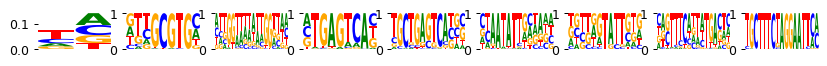

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 04:50:38.184095
	Loss: 188.624 , R2: 0.002
	Training time (model/function): (45.594s / 45.594s)
		per epoch (model/function): (3.257s/ 3.257s)
		per 1k samples: 0.603s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995870223325566, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 04:51:25.058760
	Loss: 159.815 , R2: 0.002
	Training time (model/function): (91.116s / 45.521s)
		per epoch (model/function): (6.508s/ 3.252s)
		per 1k samples: 0.602s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995870223325566, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 04:52:11.673071
	Loss: 147.798 , R2: 0.002
	Training time (model/function): (136.472s / 45.356s)
		per epoch (model/function): (9.748s/ 3.240s)
		per 1k samples: 0.600s
best loss 147.798
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995870223325566, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 04:52:59.874594
	Loss: 149.207 , R2: 0.002
	Training time (model/function): (181.993s / 45.522s)
		per epoch (model/function): (13.000s/ 3.252s)
		per 1k samples: 0.602s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995870223325566, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 04:53:46.688745
	Loss: 144.743 , R2: 0.002
	Training time (model/function): (227.462s / 45.468s)
		per epoch (model/function): (16.247s/ 3.248s)
		per 1k samples: 0.602s
best loss 144.743
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995870223325566, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.04s/it]


Current time: 2024-06-19 04:54:35.034530
	Loss: 148.327 , R2: 0.002
	Training time (model/function): (273.131s / 45.669s)
		per epoch (model/function): (19.509s/ 3.262s)
		per 1k samples: 0.604s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995870223325566, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 04:55:21.920922
	Loss: 144.489 , R2: 0.002
	Training time (model/function): (318.648s / 45.517s)
		per epoch (model/function): (22.761s/ 3.251s)
		per 1k samples: 0.602s
best loss 144.489
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995870223325566, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.04s/it]


Current time: 2024-06-19 04:56:10.173752
	Loss: 148.254 , R2: 0.002
	Training time (model/function): (364.323s / 45.675s)
		per epoch (model/function): (26.023s/ 3.263s)
		per 1k samples: 0.605s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995870223325566, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 04:56:56.938495
	Loss: 144.468 , R2: 0.002
	Training time (model/function): (409.732s / 45.409s)
		per epoch (model/function): (29.267s/ 3.243s)
		per 1k samples: 0.601s
best loss 144.468
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995870223325566, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 04:57:45.192276
	Loss: 148.248 , R2: 0.002
	Training time (model/function): (455.303s / 45.571s)
		per epoch (model/function): (32.522s/ 3.255s)
		per 1k samples: 0.603s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995870223325566, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.01s/it]


Current time: 2024-06-19 04:58:31.843980
	Loss: 144.466 , R2: 0.002
	Training time (model/function): (500.609s / 45.306s)
		per epoch (model/function): (35.758s/ 3.236s)
		per 1k samples: 0.600s
best loss 144.466
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995870223325566, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 500.60937786102295s
Time per epoch (total): 0.115 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs20

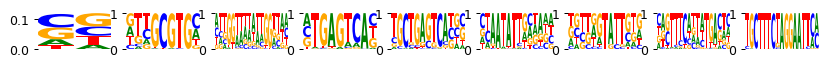

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 04:59:00.271269
	Loss: 188.545 , R2: 0.002
	Training time (model/function): (8.182s / 8.182s)
		per epoch (model/function): (0.584s/ 0.584s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992961065950324, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 04:59:09.807487
	Loss: 159.815 , R2: 0.002
	Training time (model/function): (16.378s / 8.197s)
		per epoch (model/function): (1.170s/ 0.585s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992961065950324, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.83it/s]


Current time: 2024-06-19 04:59:19.447675
	Loss: 147.799 , R2: 0.002
	Training time (model/function): (24.681s / 8.302s)
		per epoch (model/function): (1.763s/ 0.593s)
		per 1k samples: 0.110s
best loss 147.799
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992961065950324, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 04:59:30.224179
	Loss: 149.202 , R2: 0.002
	Training time (model/function): (32.880s / 8.199s)
		per epoch (model/function): (2.349s/ 0.586s)
		per 1k samples: 0.109s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992961065950324, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.80it/s]


Current time: 2024-06-19 04:59:39.881645
	Loss: 144.744 , R2: 0.002
	Training time (model/function): (41.286s / 8.406s)
		per epoch (model/function): (2.949s/ 0.600s)
		per 1k samples: 0.111s
best loss 144.744
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992961065950324, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.84it/s]


Current time: 2024-06-19 04:59:50.804750
	Loss: 148.312 , R2: 0.002
	Training time (model/function): (49.527s / 8.241s)
		per epoch (model/function): (3.538s/ 0.589s)
		per 1k samples: 0.109s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992961065950324, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.83it/s]


Current time: 2024-06-19 05:00:00.450594
	Loss: 144.490 , R2: 0.002
	Training time (model/function): (57.833s / 8.306s)
		per epoch (model/function): (4.131s/ 0.593s)
		per 1k samples: 0.110s
best loss 144.490
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992961065950324, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 05:00:11.233464
	Loss: 148.229 , R2: 0.002
	Training time (model/function): (66.030s / 8.197s)
		per epoch (model/function): (4.716s/ 0.586s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992961065950324, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 05:00:20.813022
	Loss: 144.469 , R2: 0.002
	Training time (model/function): (74.357s / 8.327s)
		per epoch (model/function): (5.311s/ 0.595s)
		per 1k samples: 0.110s
best loss 144.469
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992961065950324, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 05:00:31.678125
	Loss: 148.223 , R2: 0.002
	Training time (model/function): (82.559s / 8.203s)
		per epoch (model/function): (5.897s/ 0.586s)
		per 1k samples: 0.109s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992961065950324, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.84it/s]


Current time: 2024-06-19 05:00:41.263776
	Loss: 144.467 , R2: 0.002
	Training time (model/function): (90.800s / 8.241s)
		per epoch (model/function): (6.486s/ 0.589s)
		per 1k samples: 0.109s
best loss 144.467
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992961065950324, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 90.80002307891846s
Time per epoch (total): 0.021 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_2/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order Non

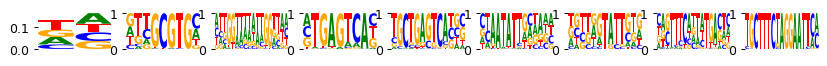

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.04s/it]


Current time: 2024-06-19 05:01:45.565818
	Loss: 188.622 , R2: 0.002
	Training time (model/function): (45.692s / 45.692s)
		per epoch (model/function): (3.264s/ 3.264s)
		per 1k samples: 0.605s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995949858411511, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:02:32.537787
	Loss: 159.815 , R2: 0.002
	Training time (model/function): (91.293s / 45.601s)
		per epoch (model/function): (6.521s/ 3.257s)
		per 1k samples: 0.604s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995949858411511, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 05:03:19.289318
	Loss: 147.798 , R2: 0.002
	Training time (model/function): (136.692s / 45.398s)
		per epoch (model/function): (9.764s/ 3.243s)
		per 1k samples: 0.601s
best loss 147.798
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995949858411511, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.05s/it]


Current time: 2024-06-19 05:04:07.777967
	Loss: 149.207 , R2: 0.002
	Training time (model/function): (182.595s / 45.903s)
		per epoch (model/function): (13.042s/ 3.279s)
		per 1k samples: 0.608s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995949858411511, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:04:54.590136
	Loss: 144.743 , R2: 0.002
	Training time (model/function): (228.147s / 45.552s)
		per epoch (model/function): (16.296s/ 3.254s)
		per 1k samples: 0.603s
best loss 144.743
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995949858411511, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.04s/it]


Current time: 2024-06-19 05:05:42.900506
	Loss: 148.327 , R2: 0.002
	Training time (model/function): (273.773s / 45.626s)
		per epoch (model/function): (19.555s/ 3.259s)
		per 1k samples: 0.604s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995949858411511, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:06:29.760922
	Loss: 144.489 , R2: 0.002
	Training time (model/function): (319.281s / 45.508s)
		per epoch (model/function): (22.806s/ 3.251s)
		per 1k samples: 0.602s
best loss 144.489
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995949858411511, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:07:17.876158
	Loss: 148.254 , R2: 0.002
	Training time (model/function): (364.892s / 45.612s)
		per epoch (model/function): (26.064s/ 3.258s)
		per 1k samples: 0.604s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995949858411511, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:08:04.745427
	Loss: 144.468 , R2: 0.002
	Training time (model/function): (410.403s / 45.511s)
		per epoch (model/function): (29.315s/ 3.251s)
		per 1k samples: 0.602s
best loss 144.468
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995949858411511, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.04s/it]


Current time: 2024-06-19 05:08:53.038040
	Loss: 148.248 , R2: 0.002
	Training time (model/function): (456.108s / 45.705s)
		per epoch (model/function): (32.579s/ 3.265s)
		per 1k samples: 0.605s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995949858411511, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:09:39.879962
	Loss: 144.466 , R2: 0.002
	Training time (model/function): (501.598s / 45.489s)
		per epoch (model/function): (35.828s/ 3.249s)
		per 1k samples: 0.602s
best loss 144.466
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995949858411511, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 501.5977303981781s
Time per epoch (total): 0.115 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs200

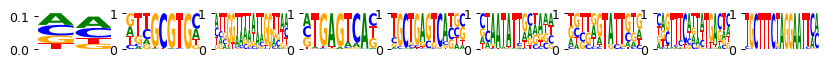

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.86it/s]


Current time: 2024-06-19 05:10:08.114526
	Loss: 188.545 , R2: 0.002
	Training time (model/function): (8.176s / 8.176s)
		per epoch (model/function): (0.584s/ 0.584s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992843977452895, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.86it/s]


Current time: 2024-06-19 05:10:17.521469
	Loss: 159.816 , R2: 0.002
	Training time (model/function): (16.337s / 8.161s)
		per epoch (model/function): (1.167s/ 0.583s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992843977452895, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.81it/s]


Current time: 2024-06-19 05:10:27.147960
	Loss: 147.799 , R2: 0.002
	Training time (model/function): (24.708s / 8.371s)
		per epoch (model/function): (1.765s/ 0.598s)
		per 1k samples: 0.111s
best loss 147.799
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992843977452895, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.86it/s]


Current time: 2024-06-19 05:10:37.986006
	Loss: 149.202 , R2: 0.002
	Training time (model/function): (32.884s / 8.176s)
		per epoch (model/function): (2.349s/ 0.584s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992843977452895, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 05:10:47.653960
	Loss: 144.744 , R2: 0.002
	Training time (model/function): (41.211s / 8.327s)
		per epoch (model/function): (2.944s/ 0.595s)
		per 1k samples: 0.110s
best loss 144.744
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992843977452895, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.86it/s]


Current time: 2024-06-19 05:10:58.382644
	Loss: 148.312 , R2: 0.002
	Training time (model/function): (49.367s / 8.156s)
		per epoch (model/function): (3.526s/ 0.583s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992843977452895, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 05:11:08.040963
	Loss: 144.490 , R2: 0.002
	Training time (model/function): (57.682s / 8.316s)
		per epoch (model/function): (4.120s/ 0.594s)
		per 1k samples: 0.110s
best loss 144.490
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992843977452895, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 05:11:18.918823
	Loss: 148.229 , R2: 0.002
	Training time (model/function): (65.889s / 8.207s)
		per epoch (model/function): (4.706s/ 0.586s)
		per 1k samples: 0.109s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992843977452895, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.84it/s]


Current time: 2024-06-19 05:11:28.420033
	Loss: 144.469 , R2: 0.002
	Training time (model/function): (74.137s / 8.247s)
		per epoch (model/function): (5.295s/ 0.589s)
		per 1k samples: 0.109s
best loss 144.469
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992843977452895, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 05:11:39.286943
	Loss: 148.223 , R2: 0.002
	Training time (model/function): (82.345s / 8.208s)
		per epoch (model/function): (5.882s/ 0.586s)
		per 1k samples: 0.109s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992843977452895, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.84it/s]


Current time: 2024-06-19 05:11:48.848616
	Loss: 144.467 , R2: 0.002
	Training time (model/function): (90.568s / 8.224s)
		per epoch (model/function): (6.469s/ 0.587s)
		per 1k samples: 0.109s
best loss 144.467
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992843977452895, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 90.56849408149719s
Time per epoch (total): 0.021 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_3/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order Non

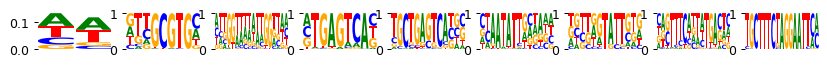

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:12:52.960118
	Loss: 188.633 , R2: 0.002
	Training time (model/function): (45.577s / 45.577s)
		per epoch (model/function): (3.256s/ 3.256s)
		per 1k samples: 0.603s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995675505426397, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:13:39.878611
	Loss: 159.815 , R2: 0.002
	Training time (model/function): (91.147s / 45.570s)
		per epoch (model/function): (6.511s/ 3.255s)
		per 1k samples: 0.603s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995675505426397, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.04s/it]


Current time: 2024-06-19 05:14:26.865746
	Loss: 147.798 , R2: 0.002
	Training time (model/function): (136.768s / 45.621s)
		per epoch (model/function): (9.769s/ 3.259s)
		per 1k samples: 0.604s
best loss 147.798
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995675505426397, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:15:15.007046
	Loss: 149.207 , R2: 0.002
	Training time (model/function): (182.298s / 45.530s)
		per epoch (model/function): (13.021s/ 3.252s)
		per 1k samples: 0.603s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995675505426397, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.01s/it]


Current time: 2024-06-19 05:16:01.654449
	Loss: 144.743 , R2: 0.002
	Training time (model/function): (227.592s / 45.294s)
		per epoch (model/function): (16.257s/ 3.235s)
		per 1k samples: 0.599s
best loss 144.743
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995675505426397, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:16:49.864442
	Loss: 148.327 , R2: 0.002
	Training time (model/function): (273.123s / 45.531s)
		per epoch (model/function): (19.509s/ 3.252s)
		per 1k samples: 0.603s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995675505426397, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 05:17:36.596835
	Loss: 144.489 , R2: 0.002
	Training time (model/function): (318.495s / 45.373s)
		per epoch (model/function): (22.750s/ 3.241s)
		per 1k samples: 0.601s
best loss 144.489
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995675505426397, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:18:24.786226
	Loss: 148.254 , R2: 0.002
	Training time (model/function): (364.081s / 45.586s)
		per epoch (model/function): (26.006s/ 3.256s)
		per 1k samples: 0.603s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995675505426397, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 05:19:11.570677
	Loss: 144.468 , R2: 0.002
	Training time (model/function): (409.518s / 45.436s)
		per epoch (model/function): (29.251s/ 3.245s)
		per 1k samples: 0.601s
best loss 144.468
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995675505426397, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.04s/it]


Current time: 2024-06-19 05:19:59.793878
	Loss: 148.248 , R2: 0.002
	Training time (model/function): (455.154s / 45.636s)
		per epoch (model/function): (32.511s/ 3.260s)
		per 1k samples: 0.604s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995675505426397, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 05:20:46.547584
	Loss: 144.466 , R2: 0.002
	Training time (model/function): (500.560s / 45.406s)
		per epoch (model/function): (35.754s/ 3.243s)
		per 1k samples: 0.601s
best loss 144.466
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995675505426397, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 500.5595419406891s
Time per epoch (total): 0.115 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs200

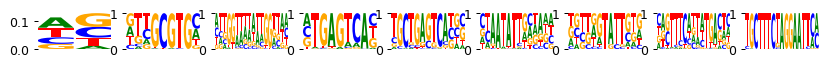

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.86it/s]


Current time: 2024-06-19 05:21:14.608634
	Loss: 188.545 , R2: 0.002
	Training time (model/function): (8.138s / 8.138s)
		per epoch (model/function): (0.581s/ 0.581s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993188109816875, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.86it/s]


Current time: 2024-06-19 05:21:24.095743
	Loss: 159.816 , R2: 0.002
	Training time (model/function): (16.286s / 8.148s)
		per epoch (model/function): (1.163s/ 0.582s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993188109816875, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.83it/s]


Current time: 2024-06-19 05:21:33.704119
	Loss: 147.799 , R2: 0.002
	Training time (model/function): (24.550s / 8.264s)
		per epoch (model/function): (1.754s/ 0.590s)
		per 1k samples: 0.109s
best loss 147.799
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993188109816875, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 05:21:44.567005
	Loss: 149.202 , R2: 0.002
	Training time (model/function): (32.742s / 8.192s)
		per epoch (model/function): (2.339s/ 0.585s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993188109816875, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.82it/s]


Current time: 2024-06-19 05:21:54.133548
	Loss: 144.744 , R2: 0.002
	Training time (model/function): (41.054s / 8.312s)
		per epoch (model/function): (2.932s/ 0.594s)
		per 1k samples: 0.110s
best loss 144.744
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993188109816875, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 05:22:04.988801
	Loss: 148.312 , R2: 0.002
	Training time (model/function): (49.243s / 8.189s)
		per epoch (model/function): (3.517s/ 0.585s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993188109816875, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.83it/s]


Current time: 2024-06-19 05:22:14.597494
	Loss: 144.490 , R2: 0.002
	Training time (model/function): (57.508s / 8.265s)
		per epoch (model/function): (4.108s/ 0.590s)
		per 1k samples: 0.109s
best loss 144.490
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993188109816875, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.84it/s]


Current time: 2024-06-19 05:22:25.329792
	Loss: 148.229 , R2: 0.002
	Training time (model/function): (65.756s / 8.248s)
		per epoch (model/function): (4.697s/ 0.589s)
		per 1k samples: 0.109s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993188109816875, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 05:22:34.869991
	Loss: 144.469 , R2: 0.002
	Training time (model/function): (73.955s / 8.200s)
		per epoch (model/function): (5.283s/ 0.586s)
		per 1k samples: 0.109s
best loss 144.469
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993188109816875, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.86it/s]


Current time: 2024-06-19 05:22:45.676910
	Loss: 148.223 , R2: 0.002
	Training time (model/function): (82.100s / 8.145s)
		per epoch (model/function): (5.864s/ 0.582s)
		per 1k samples: 0.108s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993188109816875, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:08<00:00,  1.85it/s]


Current time: 2024-06-19 05:22:55.223072
	Loss: 144.467 , R2: 0.002
	Training time (model/function): (90.299s / 8.199s)
		per epoch (model/function): (6.450s/ 0.586s)
		per 1k samples: 0.109s
best loss 144.467
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9993188109816875, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 90.29915142059326s
Time per epoch (total): 0.021 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_4/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order Non

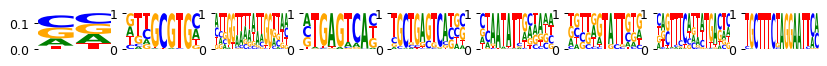

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:23:59.325171
	Loss: 188.621 , R2: 0.002
	Training time (model/function): (45.475s / 45.475s)
		per epoch (model/function): (3.248s/ 3.248s)
		per 1k samples: 0.602s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995789601716308, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:24:46.147952
	Loss: 159.815 , R2: 0.002
	Training time (model/function): (90.942s / 45.467s)
		per epoch (model/function): (6.496s/ 3.248s)
		per 1k samples: 0.602s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995789601716308, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 05:25:32.891868
	Loss: 147.798 , R2: 0.002
	Training time (model/function): (136.322s / 45.380s)
		per epoch (model/function): (9.737s/ 3.241s)
		per 1k samples: 0.601s
best loss 147.798
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995789601716308, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:26:20.981541
	Loss: 149.207 , R2: 0.002
	Training time (model/function): (181.826s / 45.505s)
		per epoch (model/function): (12.988s/ 3.250s)
		per 1k samples: 0.602s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995789601716308, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 05:27:07.742458
	Loss: 144.743 , R2: 0.002
	Training time (model/function): (227.238s / 45.411s)
		per epoch (model/function): (16.231s/ 3.244s)
		per 1k samples: 0.601s
best loss 144.743
last five r2 values, by sequential filter optimization: ['0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995789601716308, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.04s/it]


Current time: 2024-06-19 05:27:56.073885
	Loss: 148.327 , R2: 0.002
	Training time (model/function): (272.878s / 45.641s)
		per epoch (model/function): (19.491s/ 3.260s)
		per 1k samples: 0.604s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995789601716308, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 05:28:42.918397
	Loss: 144.489 , R2: 0.002
	Training time (model/function): (318.332s / 45.454s)
		per epoch (model/function): (22.738s/ 3.247s)
		per 1k samples: 0.602s
best loss 144.489
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995789601716308, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:29:31.195779
	Loss: 148.254 , R2: 0.002
	Training time (model/function): (363.949s / 45.616s)
		per epoch (model/function): (25.996s/ 3.258s)
		per 1k samples: 0.604s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995789601716308, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 05:30:17.927752
	Loss: 144.468 , R2: 0.002
	Training time (model/function): (409.329s / 45.381s)
		per epoch (model/function): (29.238s/ 3.241s)
		per 1k samples: 0.601s
best loss 144.468
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995789601716308, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:31:06.023281
	Loss: 148.248 , R2: 0.002
	Training time (model/function): (454.836s / 45.507s)
		per epoch (model/function): (32.488s/ 3.250s)
		per 1k samples: 0.602s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995789601716308, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.03s/it]


Current time: 2024-06-19 05:31:52.842009
	Loss: 144.466 , R2: 0.002
	Training time (model/function): (500.309s / 45.474s)
		per epoch (model/function): (35.736s/ 3.248s)
		per 1k samples: 0.602s
best loss 144.466
last five r2 values, by sequential filter optimization: ['0.002', '0.002', '0.002', '0.002', '0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9995789601716308, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 500.30949878692627s
Time per epoch (total): 0.115 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/episcanpy/mubind_output/obs2000/pwms/fold_4/running_time_1.pkl
65

/home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/RNA_ATAC_metacells_sce_peaks_obs2000_var4000.h5ad
data (2000, 4000)
False /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/ob

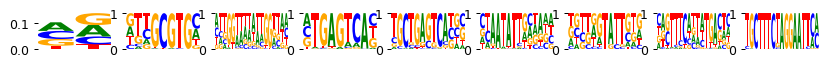

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.99it/s]


Current time: 2024-06-19 05:32:16.626674
	Loss: 211.417 , R2: 0.005
	Training time (model/function): (5.073s / 5.073s)
		per epoch (model/function): (0.362s/ 0.362s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9944389924996425, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.00it/s]


Current time: 2024-06-19 05:32:22.740813
	Loss: 174.860 , R2: 0.008
	Training time (model/function): (10.135s / 5.062s)
		per epoch (model/function): (0.724s/ 0.362s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9944389924996425, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.96it/s]


Current time: 2024-06-19 05:32:28.842708
	Loss: 155.486 , R2: 0.008
	Training time (model/function): (15.268s / 5.132s)
		per epoch (model/function): (1.091s/ 0.367s)
		per 1k samples: 0.103s
best loss 155.486
last five r2 values, by sequential filter optimization: ['0.008']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9944389924996425, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.00it/s]


Current time: 2024-06-19 05:32:36.001383
	Loss: 152.785 , R2: 0.009
	Training time (model/function): (20.330s / 5.062s)
		per epoch (model/function): (1.452s/ 0.362s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9944389924996425, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.95it/s]


Current time: 2024-06-19 05:32:42.221229
	Loss: 146.333 , R2: 0.009
	Training time (model/function): (25.489s / 5.159s)
		per epoch (model/function): (1.821s/ 0.368s)
		per 1k samples: 0.104s
best loss 146.333
last five r2 values, by sequential filter optimization: ['0.008', '0.009']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9944389924996425, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.01it/s]


Current time: 2024-06-19 05:32:49.326147
	Loss: 148.993 , R2: 0.010
	Training time (model/function): (30.535s / 5.046s)
		per epoch (model/function): (2.181s/ 0.360s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9944389924996425, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.96it/s]


Current time: 2024-06-19 05:32:55.512787
	Loss: 144.771 , R2: 0.010
	Training time (model/function): (35.670s / 5.135s)
		per epoch (model/function): (2.548s/ 0.367s)
		per 1k samples: 0.104s
best loss 144.771
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9944389924996425, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  3.00it/s]


Current time: 2024-06-19 05:33:02.612741
	Loss: 148.338 , R2: 0.010
	Training time (model/function): (40.733s / 5.062s)
		per epoch (model/function): (2.909s/ 0.362s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9944389924996425, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.93it/s]


Current time: 2024-06-19 05:33:08.763076
	Loss: 144.504 , R2: 0.010
	Training time (model/function): (45.921s / 5.189s)
		per epoch (model/function): (3.280s/ 0.371s)
		per 1k samples: 0.105s
best loss 144.504
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010', '0.010']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9944389924996425, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  3.00it/s]


Current time: 2024-06-19 05:33:15.939014
	Loss: 148.227 , R2: 0.011
	Training time (model/function): (50.979s / 5.058s)
		per epoch (model/function): (3.641s/ 0.361s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9944389924996425, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.98it/s]


Current time: 2024-06-19 05:33:22.127487
	Loss: 144.459 , R2: 0.011
	Training time (model/function): (56.085s / 5.106s)
		per epoch (model/function): (4.006s/ 0.365s)
		per 1k samples: 0.103s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010', '0.010', '0.011']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9944389924996425, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 56.08488941192627s
Time per epoch (total): 0.013 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_0/running_time_0.pkl
data /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


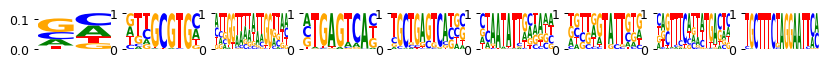

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.96s/it]


Current time: 2024-06-19 05:34:04.634997
	Loss: 214.140 , R2: 0.002
	Training time (model/function): (29.413s / 29.413s)
		per epoch (model/function): (2.101s/ 2.101s)
		per 1k samples: 0.593s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9911547846482591, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.96s/it]


Current time: 2024-06-19 05:34:35.173839
	Loss: 174.860 , R2: 0.002
	Training time (model/function): (58.864s / 29.451s)
		per epoch (model/function): (4.205s/ 2.104s)
		per 1k samples: 0.594s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9911547846482591, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:35:05.309918
	Loss: 155.486 , R2: 0.002
	Training time (model/function): (88.036s / 29.172s)
		per epoch (model/function): (6.288s/ 2.084s)
		per 1k samples: 0.588s
best loss 155.486
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9911547846482591, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.95s/it]


Current time: 2024-06-19 05:35:36.685442
	Loss: 152.790 , R2: 0.003
	Training time (model/function): (117.308s / 29.272s)
		per epoch (model/function): (8.379s/ 2.091s)
		per 1k samples: 0.590s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9911547846482591, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:36:06.896735
	Loss: 146.332 , R2: 0.003
	Training time (model/function): (146.522s / 29.213s)
		per epoch (model/function): (10.466s/ 2.087s)
		per 1k samples: 0.589s
best loss 146.332
last five r2 values, by sequential filter optimization: ['0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9911547846482591, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:36:38.252438
	Loss: 149.005 , R2: 0.003
	Training time (model/function): (175.741s / 29.219s)
		per epoch (model/function): (12.553s/ 2.087s)
		per 1k samples: 0.589s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9911547846482591, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.92s/it]


Current time: 2024-06-19 05:37:08.243815
	Loss: 144.770 , R2: 0.003
	Training time (model/function): (204.678s / 28.937s)
		per epoch (model/function): (14.620s/ 2.067s)
		per 1k samples: 0.583s
best loss 144.770
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9911547846482591, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:37:39.493731
	Loss: 148.359 , R2: 0.003
	Training time (model/function): (233.904s / 29.227s)
		per epoch (model/function): (16.707s/ 2.088s)
		per 1k samples: 0.589s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9911547846482591, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:38:09.642794
	Loss: 144.503 , R2: 0.003
	Training time (model/function): (262.992s / 29.088s)
		per epoch (model/function): (18.785s/ 2.078s)
		per 1k samples: 0.586s
best loss 144.503
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9911547846482591, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.93s/it]


Current time: 2024-06-19 05:38:40.818678
	Loss: 148.245 , R2: 0.003
	Training time (model/function): (292.087s / 29.094s)
		per epoch (model/function): (20.863s/ 2.078s)
		per 1k samples: 0.587s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9911547846482591, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.93s/it]


Current time: 2024-06-19 05:39:10.895127
	Loss: 144.458 , R2: 0.004
	Training time (model/function): (321.091s / 29.004s)
		per epoch (model/function): (22.935s/ 2.072s)
		per 1k samples: 0.585s
best loss 144.458
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9911547846482591, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 321.09064292907715s
Time per epoch (total): 0.074 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_1/model_1.pt
/hom

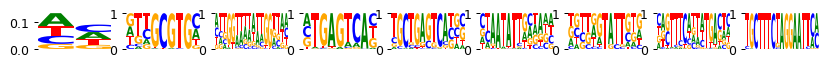

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.01it/s]


Current time: 2024-06-19 05:39:29.437780
	Loss: 211.417 , R2: 0.005
	Training time (model/function): (5.052s / 5.052s)
		per epoch (model/function): (0.361s/ 0.361s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.994881951786595, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.01it/s]


Current time: 2024-06-19 05:39:35.546674
	Loss: 174.860 , R2: 0.008
	Training time (model/function): (10.107s / 5.055s)
		per epoch (model/function): (0.722s/ 0.361s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.994881951786595, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.96it/s]


Current time: 2024-06-19 05:39:41.634508
	Loss: 155.486 , R2: 0.008
	Training time (model/function): (15.223s / 5.116s)
		per epoch (model/function): (1.087s/ 0.365s)
		per 1k samples: 0.103s
best loss 155.486
last five r2 values, by sequential filter optimization: ['0.008']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.994881951786595, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.00it/s]


Current time: 2024-06-19 05:39:48.778514
	Loss: 152.785 , R2: 0.009
	Training time (model/function): (20.287s / 5.064s)
		per epoch (model/function): (1.449s/ 0.362s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.994881951786595, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.96it/s]


Current time: 2024-06-19 05:39:54.964952
	Loss: 146.333 , R2: 0.009
	Training time (model/function): (25.417s / 5.130s)
		per epoch (model/function): (1.815s/ 0.366s)
		per 1k samples: 0.104s
best loss 146.333
last five r2 values, by sequential filter optimization: ['0.008', '0.009']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.994881951786595, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.97it/s]


Current time: 2024-06-19 05:40:02.082901
	Loss: 148.993 , R2: 0.010
	Training time (model/function): (30.521s / 5.104s)
		per epoch (model/function): (2.180s/ 0.365s)
		per 1k samples: 0.103s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.994881951786595, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.96it/s]


Current time: 2024-06-19 05:40:08.280908
	Loss: 144.770 , R2: 0.010
	Training time (model/function): (35.652s / 5.130s)
		per epoch (model/function): (2.547s/ 0.366s)
		per 1k samples: 0.104s
best loss 144.770
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.994881951786595, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.01it/s]


Current time: 2024-06-19 05:40:15.330527
	Loss: 148.338 , R2: 0.010
	Training time (model/function): (40.694s / 5.042s)
		per epoch (model/function): (2.907s/ 0.360s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.994881951786595, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.94it/s]


Current time: 2024-06-19 05:40:21.484452
	Loss: 144.504 , R2: 0.010
	Training time (model/function): (45.868s / 5.174s)
		per epoch (model/function): (3.276s/ 0.370s)
		per 1k samples: 0.104s
best loss 144.504
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010', '0.010']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.994881951786595, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.00it/s]


Current time: 2024-06-19 05:40:28.624678
	Loss: 148.228 , R2: 0.011
	Training time (model/function): (50.924s / 5.056s)
		per epoch (model/function): (3.637s/ 0.361s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.994881951786595, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.98it/s]


Current time: 2024-06-19 05:40:34.816465
	Loss: 144.459 , R2: 0.011
	Training time (model/function): (56.034s / 5.109s)
		per epoch (model/function): (4.002s/ 0.365s)
		per 1k samples: 0.103s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010', '0.010', '0.011']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.994881951786595, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 56.033724784851074s
Time per epoch (total): 0.013 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_1/running_time_0.pkl
data /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


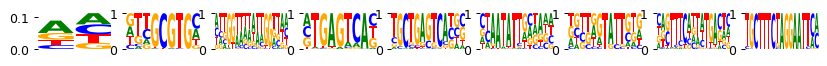

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:41:16.956378
	Loss: 214.277 , R2: 0.002
	Training time (model/function): (29.176s / 29.176s)
		per epoch (model/function): (2.084s/ 2.084s)
		per 1k samples: 0.589s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.991292579870672, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:41:47.193836
	Loss: 174.859 , R2: 0.002
	Training time (model/function): (58.334s / 29.157s)
		per epoch (model/function): (4.167s/ 2.083s)
		per 1k samples: 0.589s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.991292579870672, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.93s/it]


Current time: 2024-06-19 05:42:17.287826
	Loss: 155.485 , R2: 0.002
	Training time (model/function): (87.354s / 29.020s)
		per epoch (model/function): (6.240s/ 2.073s)
		per 1k samples: 0.586s
best loss 155.485
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.991292579870672, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:42:48.538559
	Loss: 152.790 , R2: 0.003
	Training time (model/function): (116.578s / 29.224s)
		per epoch (model/function): (8.327s/ 2.087s)
		per 1k samples: 0.590s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.991292579870672, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:43:18.809193
	Loss: 146.332 , R2: 0.003
	Training time (model/function): (145.786s / 29.208s)
		per epoch (model/function): (10.413s/ 2.086s)
		per 1k samples: 0.590s
best loss 146.332
last five r2 values, by sequential filter optimization: ['0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.991292579870672, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:43:50.009072
	Loss: 149.005 , R2: 0.003
	Training time (model/function): (174.892s / 29.106s)
		per epoch (model/function): (12.492s/ 2.079s)
		per 1k samples: 0.588s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.991292579870672, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:44:20.282633
	Loss: 144.770 , R2: 0.003
	Training time (model/function): (204.101s / 29.209s)
		per epoch (model/function): (14.579s/ 2.086s)
		per 1k samples: 0.590s
best loss 144.770
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.991292579870672, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.95s/it]


Current time: 2024-06-19 05:44:51.661407
	Loss: 148.357 , R2: 0.003
	Training time (model/function): (233.470s / 29.369s)
		per epoch (model/function): (16.676s/ 2.098s)
		per 1k samples: 0.593s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.991292579870672, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:45:21.757341
	Loss: 144.503 , R2: 0.003
	Training time (model/function): (262.597s / 29.127s)
		per epoch (model/function): (18.757s/ 2.081s)
		per 1k samples: 0.588s
best loss 144.503
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.991292579870672, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:45:53.086862
	Loss: 148.243 , R2: 0.003
	Training time (model/function): (291.837s / 29.239s)
		per epoch (model/function): (20.845s/ 2.089s)
		per 1k samples: 0.590s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.991292579870672, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:46:23.245435
	Loss: 144.458 , R2: 0.003
	Training time (model/function): (320.938s / 29.102s)
		per epoch (model/function): (22.924s/ 2.079s)
		per 1k samples: 0.588s
best loss 144.458
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.991292579870672, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 320.9383771419525s
Time per epoch (total): 0.074 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_2/model_1.pt
/home/

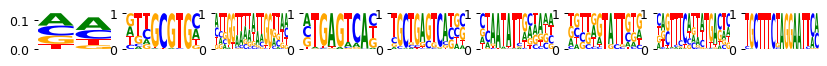

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.90it/s]


Current time: 2024-06-19 05:46:42.042885
	Loss: 211.417 , R2: 0.005
	Training time (model/function): (5.236s / 5.236s)
		per epoch (model/function): (0.374s/ 0.374s)
		per 1k samples: 0.105s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948873286242826, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.95it/s]


Current time: 2024-06-19 05:46:48.168393
	Loss: 174.860 , R2: 0.008
	Training time (model/function): (10.395s / 5.159s)
		per epoch (model/function): (0.742s/ 0.368s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948873286242826, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.95it/s]


Current time: 2024-06-19 05:46:54.372173
	Loss: 155.486 , R2: 0.008
	Training time (model/function): (15.541s / 5.146s)
		per epoch (model/function): (1.110s/ 0.368s)
		per 1k samples: 0.104s
best loss 155.486
last five r2 values, by sequential filter optimization: ['0.008']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948873286242826, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.99it/s]


Current time: 2024-06-19 05:47:01.546292
	Loss: 152.785 , R2: 0.009
	Training time (model/function): (20.608s / 5.067s)
		per epoch (model/function): (1.472s/ 0.362s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948873286242826, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.93it/s]


Current time: 2024-06-19 05:47:07.728036
	Loss: 146.333 , R2: 0.009
	Training time (model/function): (25.793s / 5.185s)
		per epoch (model/function): (1.842s/ 0.370s)
		per 1k samples: 0.104s
best loss 146.333
last five r2 values, by sequential filter optimization: ['0.008', '0.009']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948873286242826, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.00it/s]


Current time: 2024-06-19 05:47:14.916005
	Loss: 148.993 , R2: 0.010
	Training time (model/function): (30.848s / 5.055s)
		per epoch (model/function): (2.203s/ 0.361s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948873286242826, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.96it/s]


Current time: 2024-06-19 05:47:21.139378
	Loss: 144.771 , R2: 0.010
	Training time (model/function): (35.993s / 5.145s)
		per epoch (model/function): (2.571s/ 0.367s)
		per 1k samples: 0.104s
best loss 144.771
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948873286242826, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.95it/s]


Current time: 2024-06-19 05:47:28.238901
	Loss: 148.338 , R2: 0.010
	Training time (model/function): (41.134s / 5.141s)
		per epoch (model/function): (2.938s/ 0.367s)
		per 1k samples: 0.104s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948873286242826, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.93it/s]


Current time: 2024-06-19 05:47:34.412174
	Loss: 144.504 , R2: 0.010
	Training time (model/function): (46.323s / 5.189s)
		per epoch (model/function): (3.309s/ 0.371s)
		per 1k samples: 0.105s
best loss 144.504
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010', '0.010']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948873286242826, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.00it/s]


Current time: 2024-06-19 05:47:41.581995
	Loss: 148.227 , R2: 0.010
	Training time (model/function): (51.376s / 5.053s)
		per epoch (model/function): (3.670s/ 0.361s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948873286242826, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.98it/s]


Current time: 2024-06-19 05:47:47.769008
	Loss: 144.459 , R2: 0.011
	Training time (model/function): (56.483s / 5.107s)
		per epoch (model/function): (4.035s/ 0.365s)
		per 1k samples: 0.103s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010', '0.010', '0.011']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948873286242826, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 56.48325800895691s
Time per epoch (total): 0.013 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_2/running_time_0.pkl
data /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


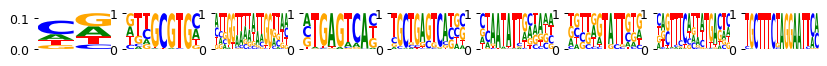

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:48:30.073815
	Loss: 214.183 , R2: 0.002
	Training time (model/function): (29.235s / 29.235s)
		per epoch (model/function): (2.088s/ 2.088s)
		per 1k samples: 0.589s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915513703741238, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.95s/it]


Current time: 2024-06-19 05:49:00.418480
	Loss: 174.859 , R2: 0.002
	Training time (model/function): (58.522s / 29.287s)
		per epoch (model/function): (4.180s/ 2.092s)
		per 1k samples: 0.590s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915513703741238, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:49:30.528824
	Loss: 155.485 , R2: 0.002
	Training time (model/function): (87.662s / 29.140s)
		per epoch (model/function): (6.262s/ 2.081s)
		per 1k samples: 0.587s
best loss 155.485
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915513703741238, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.95s/it]


Current time: 2024-06-19 05:50:01.894000
	Loss: 152.790 , R2: 0.003
	Training time (model/function): (116.936s / 29.273s)
		per epoch (model/function): (8.353s/ 2.091s)
		per 1k samples: 0.590s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915513703741238, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:50:32.104612
	Loss: 146.332 , R2: 0.003
	Training time (model/function): (146.167s / 29.232s)
		per epoch (model/function): (10.441s/ 2.088s)
		per 1k samples: 0.589s
best loss 146.332
last five r2 values, by sequential filter optimization: ['0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915513703741238, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.95s/it]


Current time: 2024-06-19 05:51:03.513329
	Loss: 149.005 , R2: 0.003
	Training time (model/function): (175.433s / 29.266s)
		per epoch (model/function): (12.531s/ 2.090s)
		per 1k samples: 0.590s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915513703741238, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:51:33.677394
	Loss: 144.770 , R2: 0.003
	Training time (model/function): (204.534s / 29.100s)
		per epoch (model/function): (14.610s/ 2.079s)
		per 1k samples: 0.586s
best loss 144.770
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915513703741238, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.95s/it]


Current time: 2024-06-19 05:52:04.956962
	Loss: 148.358 , R2: 0.003
	Training time (model/function): (233.790s / 29.256s)
		per epoch (model/function): (16.699s/ 2.090s)
		per 1k samples: 0.589s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915513703741238, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:52:35.130770
	Loss: 144.503 , R2: 0.003
	Training time (model/function): (262.895s / 29.106s)
		per epoch (model/function): (18.778s/ 2.079s)
		per 1k samples: 0.586s
best loss 144.503
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915513703741238, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:53:06.378578
	Loss: 148.244 , R2: 0.003
	Training time (model/function): (292.034s / 29.139s)
		per epoch (model/function): (20.860s/ 2.081s)
		per 1k samples: 0.587s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915513703741238, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:53:36.642237
	Loss: 144.458 , R2: 0.004
	Training time (model/function): (321.224s / 29.190s)
		per epoch (model/function): (22.945s/ 2.085s)
		per 1k samples: 0.588s
best loss 144.458
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9915513703741238, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 321.22394156455994s
Time per epoch (total): 0.074 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_3/model_1.pt
/hom

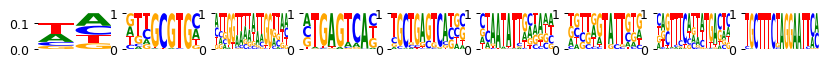

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.01it/s]


Current time: 2024-06-19 05:53:55.229890
	Loss: 211.417 , R2: 0.005
	Training time (model/function): (5.049s / 5.049s)
		per epoch (model/function): (0.361s/ 0.361s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9947280583991183, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.00it/s]


Current time: 2024-06-19 05:54:01.374982
	Loss: 174.860 , R2: 0.008
	Training time (model/function): (10.116s / 5.067s)
		per epoch (model/function): (0.723s/ 0.362s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9947280583991183, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.95it/s]


Current time: 2024-06-19 05:54:07.488178
	Loss: 155.486 , R2: 0.008
	Training time (model/function): (15.251s / 5.135s)
		per epoch (model/function): (1.089s/ 0.367s)
		per 1k samples: 0.103s
best loss 155.486
last five r2 values, by sequential filter optimization: ['0.008']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9947280583991183, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.00it/s]


Current time: 2024-06-19 05:54:14.652572
	Loss: 152.785 , R2: 0.009
	Training time (model/function): (20.320s / 5.069s)
		per epoch (model/function): (1.451s/ 0.362s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9947280583991183, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.95it/s]


Current time: 2024-06-19 05:54:20.867137
	Loss: 146.333 , R2: 0.009
	Training time (model/function): (25.474s / 5.154s)
		per epoch (model/function): (1.820s/ 0.368s)
		per 1k samples: 0.104s
best loss 146.333
last five r2 values, by sequential filter optimization: ['0.008', '0.009']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9947280583991183, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.99it/s]


Current time: 2024-06-19 05:54:27.960066
	Loss: 148.993 , R2: 0.010
	Training time (model/function): (30.562s / 5.087s)
		per epoch (model/function): (2.183s/ 0.363s)
		per 1k samples: 0.103s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9947280583991183, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.96it/s]


Current time: 2024-06-19 05:54:34.160036
	Loss: 144.771 , R2: 0.010
	Training time (model/function): (35.702s / 5.140s)
		per epoch (model/function): (2.550s/ 0.367s)
		per 1k samples: 0.104s
best loss 144.771
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9947280583991183, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.99it/s]


Current time: 2024-06-19 05:54:41.259985
	Loss: 148.338 , R2: 0.010
	Training time (model/function): (40.784s / 5.082s)
		per epoch (model/function): (2.913s/ 0.363s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9947280583991183, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.92it/s]


Current time: 2024-06-19 05:54:47.439274
	Loss: 144.504 , R2: 0.010
	Training time (model/function): (45.994s / 5.210s)
		per epoch (model/function): (3.285s/ 0.372s)
		per 1k samples: 0.105s
best loss 144.504
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010', '0.010']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9947280583991183, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.00it/s]


Current time: 2024-06-19 05:54:54.641938
	Loss: 148.227 , R2: 0.011
	Training time (model/function): (51.063s / 5.069s)
		per epoch (model/function): (3.647s/ 0.362s)
		per 1k samples: 0.102s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9947280583991183, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:05<00:00,  2.97it/s]


Current time: 2024-06-19 05:55:00.818784
	Loss: 144.459 , R2: 0.011
	Training time (model/function): (56.180s / 5.117s)
		per epoch (model/function): (4.013s/ 0.366s)
		per 1k samples: 0.103s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010', '0.010', '0.011']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9947280583991183, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 56.18009543418884s
Time per epoch (total): 0.013 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_3/running_time_0.pkl
data /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


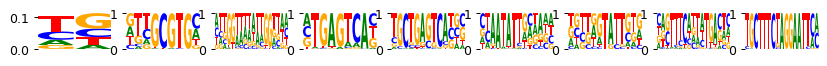

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.95s/it]


Current time: 2024-06-19 05:55:43.191282
	Loss: 214.225 , R2: 0.002
	Training time (model/function): (29.245s / 29.245s)
		per epoch (model/function): (2.089s/ 2.089s)
		per 1k samples: 0.589s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913525577467878, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.95s/it]


Current time: 2024-06-19 05:56:13.526654
	Loss: 174.860 , R2: 0.002
	Training time (model/function): (58.497s / 29.252s)
		per epoch (model/function): (4.178s/ 2.089s)
		per 1k samples: 0.589s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913525577467878, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.93s/it]


Current time: 2024-06-19 05:56:43.603305
	Loss: 155.486 , R2: 0.002
	Training time (model/function): (87.511s / 29.015s)
		per epoch (model/function): (6.251s/ 2.072s)
		per 1k samples: 0.585s
best loss 155.486
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913525577467878, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.95s/it]


Current time: 2024-06-19 05:57:14.912614
	Loss: 152.790 , R2: 0.003
	Training time (model/function): (116.802s / 29.291s)
		per epoch (model/function): (8.343s/ 2.092s)
		per 1k samples: 0.590s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913525577467878, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:57:45.188433
	Loss: 146.332 , R2: 0.003
	Training time (model/function): (145.997s / 29.195s)
		per epoch (model/function): (10.428s/ 2.085s)
		per 1k samples: 0.588s
best loss 146.332
last five r2 values, by sequential filter optimization: ['0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913525577467878, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:58:16.451440
	Loss: 149.006 , R2: 0.003
	Training time (model/function): (175.116s / 29.120s)
		per epoch (model/function): (12.508s/ 2.080s)
		per 1k samples: 0.587s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913525577467878, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.93s/it]


Current time: 2024-06-19 05:58:46.540732
	Loss: 144.770 , R2: 0.003
	Training time (model/function): (204.139s / 29.023s)
		per epoch (model/function): (14.581s/ 2.073s)
		per 1k samples: 0.585s
best loss 144.770
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913525577467878, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 05:59:17.740661
	Loss: 148.358 , R2: 0.003
	Training time (model/function): (233.284s / 29.145s)
		per epoch (model/function): (16.663s/ 2.082s)
		per 1k samples: 0.587s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913525577467878, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.93s/it]


Current time: 2024-06-19 05:59:47.740627
	Loss: 144.503 , R2: 0.003
	Training time (model/function): (262.290s / 29.006s)
		per epoch (model/function): (18.735s/ 2.072s)
		per 1k samples: 0.584s
best loss 144.503
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913525577467878, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.94s/it]


Current time: 2024-06-19 06:00:19.068295
	Loss: 148.245 , R2: 0.003
	Training time (model/function): (291.500s / 29.210s)
		per epoch (model/function): (20.821s/ 2.086s)
		per 1k samples: 0.589s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913525577467878, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.93s/it]


Current time: 2024-06-19 06:00:49.214827
	Loss: 144.458 , R2: 0.004
	Training time (model/function): (320.566s / 29.066s)
		per epoch (model/function): (22.898s/ 2.076s)
		per 1k samples: 0.586s
best loss 144.458
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003', '0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913525577467878, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 320.56597781181335s
Time per epoch (total): 0.074 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_4/model_1.pt
/hom

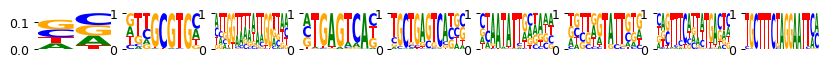

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.06it/s]


Current time: 2024-06-19 06:01:07.461727
	Loss: 211.417 , R2: 0.005
	Training time (model/function): (4.964s / 4.964s)
		per epoch (model/function): (0.355s/ 0.355s)
		per 1k samples: 0.100s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948748079059293, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.08it/s]


Current time: 2024-06-19 06:01:13.379852
	Loss: 174.860 , R2: 0.008
	Training time (model/function): (9.908s / 4.945s)
		per epoch (model/function): (0.708s/ 0.353s)
		per 1k samples: 0.100s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948748079059293, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.09it/s]


Current time: 2024-06-19 06:01:19.334677
	Loss: 155.486 , R2: 0.008
	Training time (model/function): (14.834s / 4.926s)
		per epoch (model/function): (1.060s/ 0.352s)
		per 1k samples: 0.099s
best loss 155.486
last five r2 values, by sequential filter optimization: ['0.008']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948748079059293, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.14it/s]


Current time: 2024-06-19 06:01:26.255826
	Loss: 152.785 , R2: 0.009
	Training time (model/function): (19.665s / 4.831s)
		per epoch (model/function): (1.405s/ 0.345s)
		per 1k samples: 0.097s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948748079059293, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.07it/s]


Current time: 2024-06-19 06:01:32.173592
	Loss: 146.333 , R2: 0.009
	Training time (model/function): (24.611s / 4.946s)
		per epoch (model/function): (1.758s/ 0.353s)
		per 1k samples: 0.100s
best loss 146.333
last five r2 values, by sequential filter optimization: ['0.008', '0.009']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948748079059293, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.10it/s]


Current time: 2024-06-19 06:01:39.196789
	Loss: 148.993 , R2: 0.010
	Training time (model/function): (29.504s / 4.892s)
		per epoch (model/function): (2.107s/ 0.349s)
		per 1k samples: 0.099s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948748079059293, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.07it/s]


Current time: 2024-06-19 06:01:45.220819
	Loss: 144.771 , R2: 0.010
	Training time (model/function): (34.465s / 4.961s)
		per epoch (model/function): (2.462s/ 0.354s)
		per 1k samples: 0.100s
best loss 144.771
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948748079059293, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.07it/s]


Current time: 2024-06-19 06:01:52.040908
	Loss: 148.338 , R2: 0.010
	Training time (model/function): (39.403s / 4.939s)
		per epoch (model/function): (2.815s/ 0.353s)
		per 1k samples: 0.100s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948748079059293, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.05it/s]


Current time: 2024-06-19 06:01:57.976523
	Loss: 144.504 , R2: 0.010
	Training time (model/function): (44.387s / 4.983s)
		per epoch (model/function): (3.170s/ 0.356s)
		per 1k samples: 0.100s
best loss 144.504
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010', '0.010']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948748079059293, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.11it/s]


Current time: 2024-06-19 06:02:04.980634
	Loss: 148.227 , R2: 0.011
	Training time (model/function): (49.269s / 4.883s)
		per epoch (model/function): (3.519s/ 0.349s)
		per 1k samples: 0.098s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948748079059293, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:04<00:00,  3.11it/s]


Current time: 2024-06-19 06:02:10.927414
	Loss: 144.459 , R2: 0.011
	Training time (model/function): (54.164s / 4.895s)
		per epoch (model/function): (3.869s/ 0.350s)
		per 1k samples: 0.099s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.008', '0.009', '0.010', '0.010', '0.011']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9948748079059293, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 54.164395809173584s
Time per epoch (total): 0.012 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_4/running_time_0.pkl
data /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


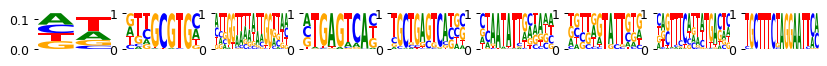

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.93s/it]


Current time: 2024-06-19 06:02:52.893968
	Loss: 214.053 , R2: 0.002
	Training time (model/function): (28.994s / 28.994s)
		per epoch (model/function): (2.071s/ 2.071s)
		per 1k samples: 0.584s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913439887230053, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.93s/it]


Current time: 2024-06-19 06:03:22.908843
	Loss: 174.859 , R2: 0.002
	Training time (model/function): (57.970s / 28.976s)
		per epoch (model/function): (4.141s/ 2.070s)
		per 1k samples: 0.584s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913439887230053, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.93s/it]


Current time: 2024-06-19 06:03:52.843876
	Loss: 155.485 , R2: 0.002
	Training time (model/function): (86.944s / 28.974s)
		per epoch (model/function): (6.210s/ 2.070s)
		per 1k samples: 0.584s
best loss 155.485
last five r2 values, by sequential filter optimization: ['0.002']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913439887230053, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.93s/it]


Current time: 2024-06-19 06:04:23.961498
	Loss: 152.790 , R2: 0.003
	Training time (model/function): (115.950s / 29.006s)
		per epoch (model/function): (8.282s/ 2.072s)
		per 1k samples: 0.585s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913439887230053, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.92s/it]


Current time: 2024-06-19 06:04:53.848838
	Loss: 146.332 , R2: 0.003
	Training time (model/function): (144.886s / 28.937s)
		per epoch (model/function): (10.349s/ 2.067s)
		per 1k samples: 0.583s
best loss 146.332
last five r2 values, by sequential filter optimization: ['0.002', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913439887230053, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:29<00:00,  1.93s/it]


Current time: 2024-06-19 06:05:25.004228
	Loss: 149.004 , R2: 0.003
	Training time (model/function): (173.967s / 29.081s)
		per epoch (model/function): (12.426s/ 2.077s)
		per 1k samples: 0.586s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913439887230053, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.92s/it]


Current time: 2024-06-19 06:05:54.776673
	Loss: 144.770 , R2: 0.003
	Training time (model/function): (202.792s / 28.825s)
		per epoch (model/function): (14.485s/ 2.059s)
		per 1k samples: 0.581s
best loss 144.770
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913439887230053, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.93s/it]


Current time: 2024-06-19 06:06:25.781069
	Loss: 148.357 , R2: 0.003
	Training time (model/function): (231.726s / 28.934s)
		per epoch (model/function): (16.552s/ 2.067s)
		per 1k samples: 0.583s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913439887230053, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.91s/it]


Current time: 2024-06-19 06:06:55.576060
	Loss: 144.503 , R2: 0.003
	Training time (model/function): (260.482s / 28.756s)
		per epoch (model/function): (18.606s/ 2.054s)
		per 1k samples: 0.580s
best loss 144.503
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913439887230053, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.93s/it]


Current time: 2024-06-19 06:07:26.591438
	Loss: 148.243 , R2: 0.003
	Training time (model/function): (289.517s / 29.035s)
		per epoch (model/function): (20.680s/ 2.074s)
		per 1k samples: 0.585s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913439887230053, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:28<00:00,  1.92s/it]


Current time: 2024-06-19 06:07:56.570797
	Loss: 144.458 , R2: 0.003
	Training time (model/function): (318.427s / 28.910s)
		per epoch (model/function): (22.745s/ 2.065s)
		per 1k samples: 0.583s
best loss 144.458
last five r2 values, by sequential filter optimization: ['0.002', '0.003', '0.003', '0.003', '0.003']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9913439887230053, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 318.42698407173157s
Time per epoch (total): 0.073 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/organoids_treutlein_dataset/mubind_output/obs2000/pwms/fold_4/running_time_1.pkl
70

/home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/pancreas_multiome_2022_processed_atac_obs2000_var6000.h5ad
pancreatic_endocrinogenesis (2000, 6000)
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endo

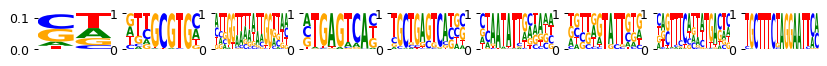

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:08:23.393489
	Loss: 188.697 , R2: 0.333
	Training time (model/function): (9.667s / 9.667s)
		per epoch (model/function): (0.691s/ 0.691s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992782295814536, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:08:34.416603
	Loss: 159.968 , R2: 0.334
	Training time (model/function): (19.307s / 9.640s)
		per epoch (model/function): (1.379s/ 0.689s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992782295814536, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:08:45.556601
	Loss: 147.951 , R2: 0.334
	Training time (model/function): (28.979s / 9.672s)
		per epoch (model/function): (2.070s/ 0.691s)
		per 1k samples: 0.128s
best loss 147.951
last five r2 values, by sequential filter optimization: ['0.334']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992782295814536, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 06:08:57.978583
	Loss: 149.355 , R2: 0.335
	Training time (model/function): (38.507s / 9.528s)
		per epoch (model/function): (2.750s/ 0.681s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992782295814536, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.55it/s]


Current time: 2024-06-19 06:09:09.219572
	Loss: 144.897 , R2: 0.335
	Training time (model/function): (48.276s / 9.769s)
		per epoch (model/function): (3.448s/ 0.698s)
		per 1k samples: 0.129s
best loss 144.897
last five r2 values, by sequential filter optimization: ['0.334', '0.335']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992782295814536, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 06:09:21.590941
	Loss: 148.467 , R2: 0.335
	Training time (model/function): (57.839s / 9.563s)
		per epoch (model/function): (4.131s/ 0.683s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992782295814536, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.56it/s]


Current time: 2024-06-19 06:09:32.782196
	Loss: 144.642 , R2: 0.335
	Training time (model/function): (67.562s / 9.723s)
		per epoch (model/function): (4.826s/ 0.695s)
		per 1k samples: 0.129s
best loss 144.642
last five r2 values, by sequential filter optimization: ['0.334', '0.335', '0.335']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992782295814536, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 06:09:45.224296
	Loss: 148.384 , R2: 0.336
	Training time (model/function): (77.100s / 9.538s)
		per epoch (model/function): (5.507s/ 0.681s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992782295814536, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 06:09:56.176347
	Loss: 144.621 , R2: 0.337
	Training time (model/function): (86.667s / 9.567s)
		per epoch (model/function): (6.190s/ 0.683s)
		per 1k samples: 0.127s
best loss 144.621
last five r2 values, by sequential filter optimization: ['0.334', '0.335', '0.335', '0.337']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992782295814536, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.59it/s]


Current time: 2024-06-19 06:10:08.603150
	Loss: 148.374 , R2: 0.338
	Training time (model/function): (96.194s / 9.527s)
		per epoch (model/function): (6.871s/ 0.681s)
		per 1k samples: 0.126s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992782295814536, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 06:10:19.581372
	Loss: 144.619 , R2: 0.338
	Training time (model/function): (105.789s / 9.595s)
		per epoch (model/function): (7.556s/ 0.685s)
		per 1k samples: 0.127s
best loss 144.619
last five r2 values, by sequential filter optimization: ['0.334', '0.335', '0.335', '0.337', '0.338']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992782295814536, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 105.78906202316284s
Time per epoch (total): 0.024 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_0/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 

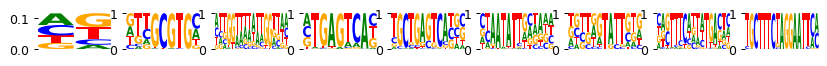

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:11:25.722707
	Loss: 188.771 , R2: 0.024
	Training time (model/function): (46.907s / 46.907s)
		per epoch (model/function): (3.351s/ 3.351s)
		per 1k samples: 0.620s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997282213255628, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:12:14.121987
	Loss: 159.961 , R2: 0.024
	Training time (model/function): (93.827s / 46.920s)
		per epoch (model/function): (6.702s/ 3.351s)
		per 1k samples: 0.621s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997282213255628, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 06:13:02.390250
	Loss: 147.945 , R2: 0.024
	Training time (model/function): (140.610s / 46.783s)
		per epoch (model/function): (10.044s/ 3.342s)
		per 1k samples: 0.619s
best loss 147.945
last five r2 values, by sequential filter optimization: ['0.024']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997282213255628, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:13:52.031852
	Loss: 149.354 , R2: 0.024
	Training time (model/function): (187.520s / 46.910s)
		per epoch (model/function): (13.394s/ 3.351s)
		per 1k samples: 0.620s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997282213255628, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 06:14:40.414647
	Loss: 144.889 , R2: 0.024
	Training time (model/function): (234.514s / 46.994s)
		per epoch (model/function): (16.751s/ 3.357s)
		per 1k samples: 0.622s
best loss 144.889
last five r2 values, by sequential filter optimization: ['0.024', '0.024']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997282213255628, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:15:30.247686
	Loss: 148.474 , R2: 0.024
	Training time (model/function): (281.438s / 46.924s)
		per epoch (model/function): (20.103s/ 3.352s)
		per 1k samples: 0.621s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997282213255628, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:16:18.573991
	Loss: 144.635 , R2: 0.024
	Training time (model/function): (328.288s / 46.850s)
		per epoch (model/function): (23.449s/ 3.346s)
		per 1k samples: 0.620s
best loss 144.635
last five r2 values, by sequential filter optimization: ['0.024', '0.024', '0.024']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997282213255628, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Current time: 2024-06-19 06:17:08.707048
	Loss: 148.401 , R2: 0.024
	Training time (model/function): (375.454s / 47.165s)
		per epoch (model/function): (26.818s/ 3.369s)
		per 1k samples: 0.624s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997282213255628, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 06:17:56.920687
	Loss: 144.614 , R2: 0.024
	Training time (model/function): (422.179s / 46.725s)
		per epoch (model/function): (30.156s/ 3.338s)
		per 1k samples: 0.618s
best loss 144.614
last five r2 values, by sequential filter optimization: ['0.024', '0.024', '0.024', '0.024']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997282213255628, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 06:18:46.733176
	Loss: 148.393 , R2: 0.024
	Training time (model/function): (469.161s / 46.982s)
		per epoch (model/function): (33.511s/ 3.356s)
		per 1k samples: 0.621s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997282213255628, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:19:35.059465
	Loss: 144.612 , R2: 0.024
	Training time (model/function): (516.091s / 46.931s)
		per epoch (model/function): (36.864s/ 3.352s)
		per 1k samples: 0.621s
best loss 144.612
last five r2 values, by sequential filter optimization: ['0.024', '0.024', '0.024', '0.024', '0.024']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997282213255628, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 516.0914323329926s
Time per epoch (total): 0.119 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fo

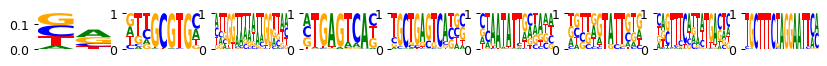

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.55it/s]


Current time: 2024-06-19 06:20:06.813514
	Loss: 188.698 , R2: 0.322
	Training time (model/function): (9.875s / 9.875s)
		per epoch (model/function): (0.705s/ 0.705s)
		per 1k samples: 0.131s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992333430495183, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.55it/s]


Current time: 2024-06-19 06:20:17.957548
	Loss: 159.970 , R2: 0.324
	Training time (model/function): (19.654s / 9.779s)
		per epoch (model/function): (1.404s/ 0.699s)
		per 1k samples: 0.129s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992333430495183, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.53it/s]


Current time: 2024-06-19 06:20:29.256666
	Loss: 147.952 , R2: 0.324
	Training time (model/function): (29.588s / 9.934s)
		per epoch (model/function): (2.113s/ 0.710s)
		per 1k samples: 0.131s
best loss 147.952
last five r2 values, by sequential filter optimization: ['0.324']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992333430495183, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:20:41.828660
	Loss: 149.356 , R2: 0.324
	Training time (model/function): (39.272s / 9.684s)
		per epoch (model/function): (2.805s/ 0.692s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992333430495183, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.54it/s]


Current time: 2024-06-19 06:20:53.180682
	Loss: 144.897 , R2: 0.324
	Training time (model/function): (49.162s / 9.891s)
		per epoch (model/function): (3.512s/ 0.706s)
		per 1k samples: 0.131s
best loss 144.897
last five r2 values, by sequential filter optimization: ['0.324', '0.324']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992333430495183, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:21:05.675341
	Loss: 148.471 , R2: 0.325
	Training time (model/function): (58.856s / 9.693s)
		per epoch (model/function): (4.204s/ 0.692s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992333430495183, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.54it/s]


Current time: 2024-06-19 06:21:17.009727
	Loss: 144.643 , R2: 0.325
	Training time (model/function): (68.739s / 9.883s)
		per epoch (model/function): (4.910s/ 0.706s)
		per 1k samples: 0.131s
best loss 144.643
last five r2 values, by sequential filter optimization: ['0.324', '0.324', '0.325']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992333430495183, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:21:29.560639
	Loss: 148.388 , R2: 0.326
	Training time (model/function): (78.399s / 9.660s)
		per epoch (model/function): (5.600s/ 0.690s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992333430495183, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:21:40.599295
	Loss: 144.623 , R2: 0.326
	Training time (model/function): (88.069s / 9.670s)
		per epoch (model/function): (6.291s/ 0.691s)
		per 1k samples: 0.128s
best loss 144.623
last five r2 values, by sequential filter optimization: ['0.324', '0.324', '0.325', '0.326']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992333430495183, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 06:21:53.073195
	Loss: 148.378 , R2: 0.326
	Training time (model/function): (97.647s / 9.578s)
		per epoch (model/function): (6.975s/ 0.684s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992333430495183, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:22:04.145233
	Loss: 144.620 , R2: 0.326
	Training time (model/function): (107.352s / 9.705s)
		per epoch (model/function): (7.668s/ 0.693s)
		per 1k samples: 0.128s
best loss 144.620
last five r2 values, by sequential filter optimization: ['0.324', '0.324', '0.325', '0.326', '0.326']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992333430495183, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 107.35218238830566s
Time per epoch (total): 0.025 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_1/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 

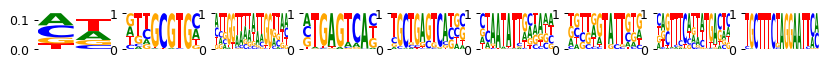

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:23:10.314343
	Loss: 188.759 , R2: 0.035
	Training time (model/function): (46.978s / 46.978s)
		per epoch (model/function): (3.356s/ 3.356s)
		per 1k samples: 0.621s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997268717563487, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:23:58.747126
	Loss: 159.962 , R2: 0.035
	Training time (model/function): (93.958s / 46.980s)
		per epoch (model/function): (6.711s/ 3.356s)
		per 1k samples: 0.621s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997268717563487, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:24:47.144244
	Loss: 147.944 , R2: 0.035
	Training time (model/function): (140.910s / 46.952s)
		per epoch (model/function): (10.065s/ 3.354s)
		per 1k samples: 0.621s
best loss 147.944
last five r2 values, by sequential filter optimization: ['0.035']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997268717563487, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:25:37.000645
	Loss: 149.353 , R2: 0.035
	Training time (model/function): (187.871s / 46.960s)
		per epoch (model/function): (13.419s/ 3.354s)
		per 1k samples: 0.621s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997268717563487, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:26:25.297376
	Loss: 144.889 , R2: 0.035
	Training time (model/function): (234.810s / 46.939s)
		per epoch (model/function): (16.772s/ 3.353s)
		per 1k samples: 0.621s
best loss 144.889
last five r2 values, by sequential filter optimization: ['0.035', '0.035']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997268717563487, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.13s/it]


Current time: 2024-06-19 06:27:15.303216
	Loss: 148.473 , R2: 0.035
	Training time (model/function): (281.931s / 47.121s)
		per epoch (model/function): (20.138s/ 3.366s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997268717563487, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:28:03.740491
	Loss: 144.635 , R2: 0.035
	Training time (model/function): (328.920s / 46.990s)
		per epoch (model/function): (23.494s/ 3.356s)
		per 1k samples: 0.621s
best loss 144.635
last five r2 values, by sequential filter optimization: ['0.035', '0.035', '0.035']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997268717563487, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:28:53.600911
	Loss: 148.400 , R2: 0.035
	Training time (model/function): (375.894s / 46.974s)
		per epoch (model/function): (26.850s/ 3.355s)
		per 1k samples: 0.621s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997268717563487, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 06:29:41.901019
	Loss: 144.615 , R2: 0.035
	Training time (model/function): (422.736s / 46.841s)
		per epoch (model/function): (30.195s/ 3.346s)
		per 1k samples: 0.619s
best loss 144.614
last five r2 values, by sequential filter optimization: ['0.035', '0.035', '0.035', '0.035']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997268717563487, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Current time: 2024-06-19 06:30:31.819930
	Loss: 148.394 , R2: 0.035
	Training time (model/function): (469.942s / 47.206s)
		per epoch (model/function): (33.567s/ 3.372s)
		per 1k samples: 0.624s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997268717563487, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:31:20.229351
	Loss: 144.614 , R2: 0.035
	Training time (model/function): (516.893s / 46.950s)
		per epoch (model/function): (36.921s/ 3.354s)
		per 1k samples: 0.621s
best loss 144.612
last five r2 values, by sequential filter optimization: ['0.035', '0.035', '0.035', '0.035', '0.035']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997268717563487, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 516.8925044536591s
Time per epoch (total): 0.119 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fo

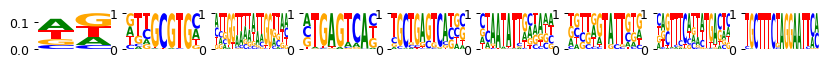

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.55it/s]


Current time: 2024-06-19 06:31:51.803963
	Loss: 188.697 , R2: 0.330
	Training time (model/function): (9.775s / 9.775s)
		per epoch (model/function): (0.698s/ 0.698s)
		per 1k samples: 0.129s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99929958484899, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:32:02.932464
	Loss: 159.969 , R2: 0.331
	Training time (model/function): (19.469s / 9.694s)
		per epoch (model/function): (1.391s/ 0.692s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99929958484899, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.54it/s]


Current time: 2024-06-19 06:32:14.204861
	Loss: 147.951 , R2: 0.331
	Training time (model/function): (29.306s / 9.837s)
		per epoch (model/function): (2.093s/ 0.703s)
		per 1k samples: 0.130s
best loss 147.951
last five r2 values, by sequential filter optimization: ['0.331']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99929958484899, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:32:26.780506
	Loss: 149.355 , R2: 0.332
	Training time (model/function): (38.964s / 9.658s)
		per epoch (model/function): (2.783s/ 0.690s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99929958484899, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.54it/s]


Current time: 2024-06-19 06:32:38.005685
	Loss: 144.896 , R2: 0.332
	Training time (model/function): (48.837s / 9.873s)
		per epoch (model/function): (3.488s/ 0.705s)
		per 1k samples: 0.131s
best loss 144.896
last five r2 values, by sequential filter optimization: ['0.331', '0.332']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99929958484899, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.56it/s]


Current time: 2024-06-19 06:32:50.598047
	Loss: 148.472 , R2: 0.332
	Training time (model/function): (58.527s / 9.690s)
		per epoch (model/function): (4.180s/ 0.692s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99929958484899, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.54it/s]


Current time: 2024-06-19 06:33:01.886605
	Loss: 144.643 , R2: 0.332
	Training time (model/function): (68.365s / 9.839s)
		per epoch (model/function): (4.883s/ 0.703s)
		per 1k samples: 0.130s
best loss 144.643
last five r2 values, by sequential filter optimization: ['0.331', '0.332', '0.332']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99929958484899, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.55it/s]


Current time: 2024-06-19 06:33:14.366676
	Loss: 148.388 , R2: 0.333
	Training time (model/function): (78.126s / 9.760s)
		per epoch (model/function): (5.580s/ 0.697s)
		per 1k samples: 0.129s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99929958484899, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.56it/s]


Current time: 2024-06-19 06:33:25.477843
	Loss: 144.622 , R2: 0.334
	Training time (model/function): (87.883s / 9.757s)
		per epoch (model/function): (6.277s/ 0.697s)
		per 1k samples: 0.129s
best loss 144.622
last five r2 values, by sequential filter optimization: ['0.331', '0.332', '0.332', '0.333']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99929958484899, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 06:33:37.978046
	Loss: 148.379 , R2: 0.334
	Training time (model/function): (97.475s / 9.592s)
		per epoch (model/function): (6.963s/ 0.685s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99929958484899, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:33:49.011335
	Loss: 144.620 , R2: 0.334
	Training time (model/function): (107.160s / 9.684s)
		per epoch (model/function): (7.654s/ 0.692s)
		per 1k samples: 0.128s
best loss 144.620
last five r2 values, by sequential filter optimization: ['0.331', '0.332', '0.332', '0.333', '0.334']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99929958484899, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 107.15960645675659s
Time per epoch (total): 0.025 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_2/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 ou

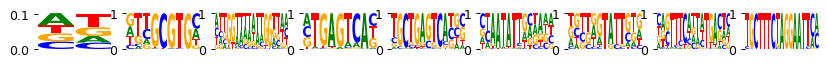

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.15s/it]


Current time: 2024-06-19 06:34:55.492286
	Loss: 188.756 , R2: 0.027
	Training time (model/function): (47.282s / 47.282s)
		per epoch (model/function): (3.377s/ 3.377s)
		per 1k samples: 0.625s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99972877817438, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 06:35:44.012334
	Loss: 159.962 , R2: 0.027
	Training time (model/function): (94.354s / 47.072s)
		per epoch (model/function): (6.740s/ 3.362s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99972877817438, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 06:36:32.190187
	Loss: 147.944 , R2: 0.027
	Training time (model/function): (141.176s / 46.823s)
		per epoch (model/function): (10.084s/ 3.344s)
		per 1k samples: 0.619s
best loss 147.944
last five r2 values, by sequential filter optimization: ['0.027']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99972877817438, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.13s/it]


Current time: 2024-06-19 06:37:22.127749
	Loss: 149.354 , R2: 0.027
	Training time (model/function): (188.286s / 47.110s)
		per epoch (model/function): (13.449s/ 3.365s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99972877817438, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Current time: 2024-06-19 06:38:10.670326
	Loss: 144.889 , R2: 0.027
	Training time (model/function): (235.477s / 47.191s)
		per epoch (model/function): (16.820s/ 3.371s)
		per 1k samples: 0.624s
best loss 144.889
last five r2 values, by sequential filter optimization: ['0.027', '0.027']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99972877817438, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 06:39:01.304578
	Loss: 148.474 , R2: 0.027
	Training time (model/function): (283.062s / 47.585s)
		per epoch (model/function): (20.219s/ 3.399s)
		per 1k samples: 0.629s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99972877817438, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:39:49.728178
	Loss: 144.636 , R2: 0.027
	Training time (model/function): (330.043s / 46.981s)
		per epoch (model/function): (23.574s/ 3.356s)
		per 1k samples: 0.621s
best loss 144.636
last five r2 values, by sequential filter optimization: ['0.027', '0.027', '0.027']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99972877817438, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Current time: 2024-06-19 06:40:39.684714
	Loss: 148.399 , R2: 0.027
	Training time (model/function): (377.244s / 47.201s)
		per epoch (model/function): (26.946s/ 3.372s)
		per 1k samples: 0.624s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99972877817438, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 06:41:28.215884
	Loss: 144.615 , R2: 0.027
	Training time (model/function): (424.322s / 47.079s)
		per epoch (model/function): (30.309s/ 3.363s)
		per 1k samples: 0.623s
best loss 144.615
last five r2 values, by sequential filter optimization: ['0.027', '0.027', '0.027', '0.027']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99972877817438, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 06:42:18.112123
	Loss: 148.393 , R2: 0.027
	Training time (model/function): (471.372s / 47.049s)
		per epoch (model/function): (33.669s/ 3.361s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99972877817438, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.13s/it]


Current time: 2024-06-19 06:43:06.598270
	Loss: 144.614 , R2: 0.027
	Training time (model/function): (518.501s / 47.129s)
		per epoch (model/function): (37.036s/ 3.366s)
		per 1k samples: 0.623s
best loss 144.612
last five r2 values, by sequential filter optimization: ['0.027', '0.027', '0.027', '0.027', '0.027']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.99972877817438, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 518.5007202625275s
Time per epoch (total): 0.119 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold

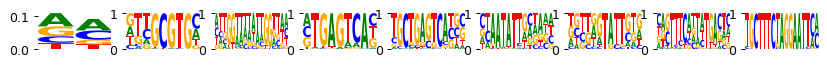

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.54it/s]


Current time: 2024-06-19 06:43:38.200067
	Loss: 188.698 , R2: 0.299
	Training time (model/function): (9.824s / 9.824s)
		per epoch (model/function): (0.702s/ 0.702s)
		per 1k samples: 0.130s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992431166687776, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.55it/s]


Current time: 2024-06-19 06:43:49.369909
	Loss: 159.967 , R2: 0.300
	Training time (model/function): (19.600s / 9.777s)
		per epoch (model/function): (1.400s/ 0.698s)
		per 1k samples: 0.129s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992431166687776, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.54it/s]


Current time: 2024-06-19 06:44:00.622705
	Loss: 147.952 , R2: 0.300
	Training time (model/function): (29.428s / 9.827s)
		per epoch (model/function): (2.102s/ 0.702s)
		per 1k samples: 0.130s
best loss 147.952
last five r2 values, by sequential filter optimization: ['0.300']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992431166687776, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:44:13.220697
	Loss: 149.355 , R2: 0.300
	Training time (model/function): (39.105s / 9.677s)
		per epoch (model/function): (2.793s/ 0.691s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992431166687776, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.54it/s]


Current time: 2024-06-19 06:44:24.482074
	Loss: 144.896 , R2: 0.300
	Training time (model/function): (48.971s / 9.866s)
		per epoch (model/function): (3.498s/ 0.705s)
		per 1k samples: 0.130s
best loss 144.896
last five r2 values, by sequential filter optimization: ['0.300', '0.300']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992431166687776, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:44:37.082103
	Loss: 148.465 , R2: 0.301
	Training time (model/function): (58.655s / 9.685s)
		per epoch (model/function): (4.190s/ 0.692s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992431166687776, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.54it/s]


Current time: 2024-06-19 06:44:48.407317
	Loss: 144.643 , R2: 0.301
	Training time (model/function): (68.501s / 9.845s)
		per epoch (model/function): (4.893s/ 0.703s)
		per 1k samples: 0.130s
best loss 144.643
last five r2 values, by sequential filter optimization: ['0.300', '0.300', '0.301']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992431166687776, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:45:00.910484
	Loss: 148.382 , R2: 0.301
	Training time (model/function): (78.170s / 9.670s)
		per epoch (model/function): (5.584s/ 0.691s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992431166687776, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:45:12.062594
	Loss: 144.622 , R2: 0.301
	Training time (model/function): (87.840s / 9.670s)
		per epoch (model/function): (6.274s/ 0.691s)
		per 1k samples: 0.128s
best loss 144.622
last five r2 values, by sequential filter optimization: ['0.300', '0.300', '0.301', '0.301']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992431166687776, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 06:45:24.564648
	Loss: 148.372 , R2: 0.301
	Training time (model/function): (97.425s / 9.584s)
		per epoch (model/function): (6.959s/ 0.685s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992431166687776, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:45:35.608423
	Loss: 144.620 , R2: 0.301
	Training time (model/function): (107.077s / 9.652s)
		per epoch (model/function): (7.648s/ 0.689s)
		per 1k samples: 0.128s
best loss 144.620
last five r2 values, by sequential filter optimization: ['0.300', '0.300', '0.301', '0.301', '0.301']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9992431166687776, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 107.07675123214722s
Time per epoch (total): 0.025 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_3/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 

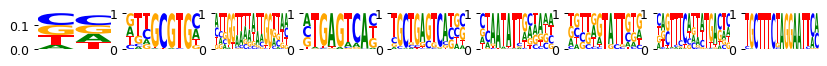

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Current time: 2024-06-19 06:46:41.910284
	Loss: 188.759 , R2: 0.097
	Training time (model/function): (47.172s / 47.172s)
		per epoch (model/function): (3.369s/ 3.369s)
		per 1k samples: 0.624s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997192381497767, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Current time: 2024-06-19 06:47:30.546088
	Loss: 159.959 , R2: 0.097
	Training time (model/function): (94.315s / 47.143s)
		per epoch (model/function): (6.737s/ 3.367s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997192381497767, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:48:18.954796
	Loss: 147.942 , R2: 0.097
	Training time (model/function): (141.239s / 46.924s)
		per epoch (model/function): (10.089s/ 3.352s)
		per 1k samples: 0.621s
best loss 147.942
last five r2 values, by sequential filter optimization: ['0.097']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997192381497767, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 06:49:08.972946
	Loss: 149.352 , R2: 0.097
	Training time (model/function): (188.292s / 47.053s)
		per epoch (model/function): (13.449s/ 3.361s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997192381497767, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 06:49:57.496134
	Loss: 144.888 , R2: 0.097
	Training time (model/function): (235.362s / 47.070s)
		per epoch (model/function): (16.812s/ 3.362s)
		per 1k samples: 0.623s
best loss 144.888
last five r2 values, by sequential filter optimization: ['0.097', '0.097']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997192381497767, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Current time: 2024-06-19 06:50:47.521821
	Loss: 148.471 , R2: 0.097
	Training time (model/function): (282.551s / 47.189s)
		per epoch (model/function): (20.182s/ 3.371s)
		per 1k samples: 0.624s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997192381497767, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 06:51:35.923838
	Loss: 144.634 , R2: 0.097
	Training time (model/function): (329.459s / 46.908s)
		per epoch (model/function): (23.533s/ 3.351s)
		per 1k samples: 0.620s
best loss 144.634
last five r2 values, by sequential filter optimization: ['0.097', '0.097', '0.097']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997192381497767, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 06:52:25.894698
	Loss: 148.399 , R2: 0.097
	Training time (model/function): (376.481s / 47.021s)
		per epoch (model/function): (26.891s/ 3.359s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997192381497767, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.11s/it]


Current time: 2024-06-19 06:53:14.116094
	Loss: 144.613 , R2: 0.097
	Training time (model/function): (423.304s / 46.823s)
		per epoch (model/function): (30.236s/ 3.345s)
		per 1k samples: 0.619s
best loss 144.613
last five r2 values, by sequential filter optimization: ['0.097', '0.097', '0.097', '0.097']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997192381497767, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Current time: 2024-06-19 06:54:04.210578
	Loss: 148.391 , R2: 0.096
	Training time (model/function): (470.476s / 47.172s)
		per epoch (model/function): (33.605s/ 3.369s)
		per 1k samples: 0.624s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997192381497767, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Current time: 2024-06-19 06:54:52.925833
	Loss: 144.611 , R2: 0.096
	Training time (model/function): (517.701s / 47.225s)
		per epoch (model/function): (36.979s/ 3.373s)
		per 1k samples: 0.625s
best loss 144.611
last five r2 values, by sequential filter optimization: ['0.097', '0.097', '0.097', '0.097', '0.096']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997192381497767, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 517.7009129524231s
Time per epoch (total): 0.119 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fo

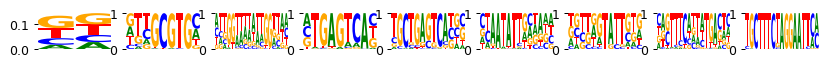

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.55it/s]


Current time: 2024-06-19 06:55:24.569527
	Loss: 188.698 , R2: 0.308
	Training time (model/function): (9.777s / 9.777s)
		per epoch (model/function): (0.698s/ 0.698s)
		per 1k samples: 0.129s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991999665217, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:55:35.693148
	Loss: 159.968 , R2: 0.309
	Training time (model/function): (19.465s / 9.688s)
		per epoch (model/function): (1.390s/ 0.692s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991999665217, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.55it/s]


Current time: 2024-06-19 06:55:46.940687
	Loss: 147.952 , R2: 0.309
	Training time (model/function): (29.277s / 9.812s)
		per epoch (model/function): (2.091s/ 0.701s)
		per 1k samples: 0.130s
best loss 147.952
last five r2 values, by sequential filter optimization: ['0.309']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991999665217, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:55:59.422222
	Loss: 149.355 , R2: 0.309
	Training time (model/function): (38.938s / 9.661s)
		per epoch (model/function): (2.781s/ 0.690s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991999665217, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.52it/s]


Current time: 2024-06-19 06:56:10.735956
	Loss: 144.897 , R2: 0.309
	Training time (model/function): (48.892s / 9.954s)
		per epoch (model/function): (3.492s/ 0.711s)
		per 1k samples: 0.132s
best loss 144.897
last five r2 values, by sequential filter optimization: ['0.309', '0.309']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991999665217, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:56:23.318531
	Loss: 148.466 , R2: 0.310
	Training time (model/function): (58.566s / 9.674s)
		per epoch (model/function): (4.183s/ 0.691s)
		per 1k samples: 0.128s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991999665217, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.54it/s]


Current time: 2024-06-19 06:56:34.610877
	Loss: 144.644 , R2: 0.310
	Training time (model/function): (68.422s / 9.856s)
		per epoch (model/function): (4.887s/ 0.704s)
		per 1k samples: 0.130s
best loss 144.644
last five r2 values, by sequential filter optimization: ['0.309', '0.309', '0.310']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991999665217, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.56it/s]


Current time: 2024-06-19 06:56:47.080612
	Loss: 148.382 , R2: 0.310
	Training time (model/function): (78.169s / 9.747s)
		per epoch (model/function): (5.583s/ 0.696s)
		per 1k samples: 0.129s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991999665217, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.57it/s]


Current time: 2024-06-19 06:56:58.199474
	Loss: 144.623 , R2: 0.310
	Training time (model/function): (87.851s / 9.682s)
		per epoch (model/function): (6.275s/ 0.692s)
		per 1k samples: 0.128s
best loss 144.622
last five r2 values, by sequential filter optimization: ['0.309', '0.309', '0.310', '0.310']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991999665217, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.58it/s]


Current time: 2024-06-19 06:57:10.713694
	Loss: 148.373 , R2: 0.310
	Training time (model/function): (97.458s / 9.608s)
		per epoch (model/function): (6.961s/ 0.686s)
		per 1k samples: 0.127s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991999665217, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:09<00:00,  1.56it/s]


Current time: 2024-06-19 06:57:21.763197
	Loss: 144.620 , R2: 0.310
	Training time (model/function): (107.159s / 9.700s)
		per epoch (model/function): (7.654s/ 0.693s)
		per 1k samples: 0.128s
best loss 144.620
last five r2 values, by sequential filter optimization: ['0.309', '0.309', '0.310', '0.310', '0.310']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9991991999665217, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 107.15850830078125s
Time per epoch (total): 0.025 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_4/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 

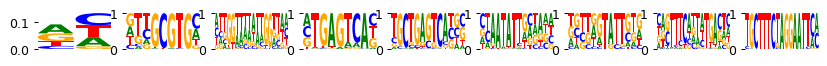

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.16s/it]


Current time: 2024-06-19 06:58:28.396415
	Loss: 188.747 , R2: 0.091
	Training time (model/function): (47.496s / 47.496s)
		per epoch (model/function): (3.393s/ 3.393s)
		per 1k samples: 0.628s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999729996200565, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 06:59:16.794973
	Loss: 159.960 , R2: 0.091
	Training time (model/function): (94.497s / 47.001s)
		per epoch (model/function): (6.750s/ 3.357s)
		per 1k samples: 0.622s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999729996200565, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 07:00:05.163699
	Loss: 147.943 , R2: 0.091
	Training time (model/function): (141.466s / 46.969s)
		per epoch (model/function): (10.105s/ 3.355s)
		per 1k samples: 0.621s
best loss 147.943
last five r2 values, by sequential filter optimization: ['0.091']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999729996200565, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Current time: 2024-06-19 07:00:55.289725
	Loss: 149.353 , R2: 0.091
	Training time (model/function): (188.649s / 47.183s)
		per epoch (model/function): (13.475s/ 3.370s)
		per 1k samples: 0.624s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999729996200565, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 07:01:43.759164
	Loss: 144.888 , R2: 0.091
	Training time (model/function): (235.632s / 46.983s)
		per epoch (model/function): (16.831s/ 3.356s)
		per 1k samples: 0.621s
best loss 144.888
last five r2 values, by sequential filter optimization: ['0.091', '0.091']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999729996200565, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Current time: 2024-06-19 07:02:33.816331
	Loss: 148.472 , R2: 0.091
	Training time (model/function): (282.837s / 47.206s)
		per epoch (model/function): (20.203s/ 3.372s)
		per 1k samples: 0.624s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999729996200565, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 07:03:22.208555
	Loss: 144.635 , R2: 0.091
	Training time (model/function): (329.740s / 46.903s)
		per epoch (model/function): (23.553s/ 3.350s)
		per 1k samples: 0.620s
best loss 144.635
last five r2 values, by sequential filter optimization: ['0.091', '0.091', '0.091']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999729996200565, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.13s/it]


Current time: 2024-06-19 07:04:12.281687
	Loss: 148.399 , R2: 0.091
	Training time (model/function): (376.857s / 47.117s)
		per epoch (model/function): (26.918s/ 3.365s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999729996200565, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 07:05:00.579911
	Loss: 144.615 , R2: 0.091
	Training time (model/function): (423.756s / 46.900s)
		per epoch (model/function): (30.268s/ 3.350s)
		per 1k samples: 0.620s
best loss 144.614
last five r2 values, by sequential filter optimization: ['0.091', '0.091', '0.091', '0.091']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999729996200565, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.13s/it]


Current time: 2024-06-19 07:05:50.589090
	Loss: 148.392 , R2: 0.091
	Training time (model/function): (470.829s / 47.072s)
		per epoch (model/function): (33.631s/ 3.362s)
		per 1k samples: 0.623s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999729996200565, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.12s/it]


Current time: 2024-06-19 07:06:39.048267
	Loss: 144.612 , R2: 0.091
	Training time (model/function): (517.795s / 46.966s)
		per epoch (model/function): (36.985s/ 3.355s)
		per 1k samples: 0.621s
best loss 144.612
last five r2 values, by sequential filter optimization: ['0.091', '0.091', '0.091', '0.091', '0.091']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999729996200565, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 517.795107126236s
Time per epoch (total): 0.119 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs2000/pwms/fold_4/running_time_1.pkl
75

/home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/merged_scATAC_integrated_cicero_faye_chong_obs2000_var6000.h5ad
noack_2022 (2000, 6000)
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/

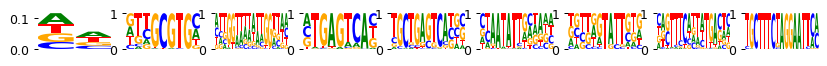

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 07:07:06.518792
	Loss: 188.723 , R2: 0.175
	Training time (model/function): (6.441s / 6.441s)
		per epoch (model/function): (0.460s/ 0.460s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989988606462502, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.30it/s]


Current time: 2024-06-19 07:07:14.257974
	Loss: 159.994 , R2: 0.176
	Training time (model/function): (13.030s / 6.589s)
		per epoch (model/function): (0.931s/ 0.471s)
		per 1k samples: 0.087s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989988606462502, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.28it/s]


Current time: 2024-06-19 07:07:22.047020
	Loss: 147.977 , R2: 0.176
	Training time (model/function): (19.678s / 6.648s)
		per epoch (model/function): (1.406s/ 0.475s)
		per 1k samples: 0.088s
best loss 147.977
last five r2 values, by sequential filter optimization: ['0.176']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989988606462502, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.34it/s]


Current time: 2024-06-19 07:07:30.976269
	Loss: 149.381 , R2: 0.176
	Training time (model/function): (26.157s / 6.478s)
		per epoch (model/function): (1.868s/ 0.463s)
		per 1k samples: 0.086s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989988606462502, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.32it/s]


Current time: 2024-06-19 07:07:38.759813
	Loss: 144.922 , R2: 0.177
	Training time (model/function): (32.699s / 6.542s)
		per epoch (model/function): (2.336s/ 0.467s)
		per 1k samples: 0.087s
best loss 144.922
last five r2 values, by sequential filter optimization: ['0.176', '0.177']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989988606462502, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.35it/s]


Current time: 2024-06-19 07:07:47.589006
	Loss: 148.498 , R2: 0.177
	Training time (model/function): (39.158s / 6.460s)
		per epoch (model/function): (2.797s/ 0.461s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989988606462502, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.30it/s]


Current time: 2024-06-19 07:07:55.359002
	Loss: 144.668 , R2: 0.177
	Training time (model/function): (45.773s / 6.614s)
		per epoch (model/function): (3.269s/ 0.472s)
		per 1k samples: 0.087s
best loss 144.668
last five r2 values, by sequential filter optimization: ['0.176', '0.177', '0.177']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989988606462502, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 07:08:04.238160
	Loss: 148.424 , R2: 0.178
	Training time (model/function): (52.203s / 6.430s)
		per epoch (model/function): (3.729s/ 0.459s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989988606462502, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 07:08:11.940393
	Loss: 144.648 , R2: 0.178
	Training time (model/function): (58.643s / 6.440s)
		per epoch (model/function): (4.189s/ 0.460s)
		per 1k samples: 0.085s
best loss 144.648
last five r2 values, by sequential filter optimization: ['0.176', '0.177', '0.177', '0.178']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989988606462502, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.38it/s]


Current time: 2024-06-19 07:08:20.679543
	Loss: 148.412 , R2: 0.178
	Training time (model/function): (65.021s / 6.377s)
		per epoch (model/function): (4.644s/ 0.456s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989988606462502, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.37it/s]


Current time: 2024-06-19 07:08:28.351615
	Loss: 144.645 , R2: 0.178
	Training time (model/function): (71.436s / 6.415s)
		per epoch (model/function): (5.103s/ 0.458s)
		per 1k samples: 0.085s
best loss 144.645
last five r2 values, by sequential filter optimization: ['0.176', '0.177', '0.177', '0.178', '0.178']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989988606462502, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 71.43551445007324s
Time per epoch (total): 0.016 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_0/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


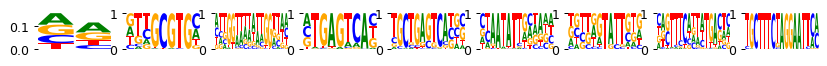

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.97s/it]


Current time: 2024-06-19 07:09:30.695954
	Loss: 188.783 , R2: 0.174
	Training time (model/function): (44.605s / 44.605s)
		per epoch (model/function): (3.186s/ 3.186s)
		per 1k samples: 0.590s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997429679519322, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.96s/it]


Current time: 2024-06-19 07:10:16.496580
	Loss: 159.995 , R2: 0.174
	Training time (model/function): (89.145s / 44.540s)
		per epoch (model/function): (6.367s/ 3.181s)
		per 1k samples: 0.589s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997429679519322, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.94s/it]


Current time: 2024-06-19 07:11:01.944851
	Loss: 147.977 , R2: 0.174
	Training time (model/function): (133.342s / 44.197s)
		per epoch (model/function): (9.524s/ 3.157s)
		per 1k samples: 0.585s
best loss 147.977
last five r2 values, by sequential filter optimization: ['0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997429679519322, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.96s/it]


Current time: 2024-06-19 07:11:48.763107
	Loss: 149.387 , R2: 0.174
	Training time (model/function): (177.849s / 44.508s)
		per epoch (model/function): (12.704s/ 3.179s)
		per 1k samples: 0.589s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997429679519322, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:12:34.290389
	Loss: 144.923 , R2: 0.174
	Training time (model/function): (222.106s / 44.256s)
		per epoch (model/function): (15.865s/ 3.161s)
		per 1k samples: 0.585s
best loss 144.923
last five r2 values, by sequential filter optimization: ['0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997429679519322, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.96s/it]


Current time: 2024-06-19 07:13:21.222038
	Loss: 148.506 , R2: 0.174
	Training time (model/function): (266.537s / 44.431s)
		per epoch (model/function): (19.038s/ 3.174s)
		per 1k samples: 0.588s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997429679519322, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:14:06.796744
	Loss: 144.670 , R2: 0.174
	Training time (model/function): (310.825s / 44.288s)
		per epoch (model/function): (22.202s/ 3.163s)
		per 1k samples: 0.586s
best loss 144.670
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997429679519322, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.96s/it]


Current time: 2024-06-19 07:14:53.579388
	Loss: 148.434 , R2: 0.174
	Training time (model/function): (355.246s / 44.421s)
		per epoch (model/function): (25.375s/ 3.173s)
		per 1k samples: 0.587s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997429679519322, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.94s/it]


Current time: 2024-06-19 07:15:38.934757
	Loss: 144.649 , R2: 0.174
	Training time (model/function): (399.387s / 44.141s)
		per epoch (model/function): (28.528s/ 3.153s)
		per 1k samples: 0.584s
best loss 144.647
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997429679519322, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:16:25.509177
	Loss: 148.427 , R2: 0.174
	Training time (model/function): (443.649s / 44.262s)
		per epoch (model/function): (31.689s/ 3.162s)
		per 1k samples: 0.585s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997429679519322, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:43<00:00,  2.93s/it]


Current time: 2024-06-19 07:17:10.714087
	Loss: 144.646 , R2: 0.174
	Training time (model/function): (487.655s / 44.006s)
		per epoch (model/function): (34.832s/ 3.143s)
		per 1k samples: 0.582s
best loss 144.646
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997429679519322, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 487.6548638343811s
Time per epoch (total): 0.112 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_1/model_1.pt
/home/ilibarra/workspace/theislab/m

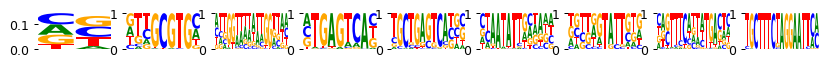

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.41it/s]


Current time: 2024-06-19 07:17:35.790990
	Loss: 188.721 , R2: 0.170
	Training time (model/function): (6.305s / 6.305s)
		per epoch (model/function): (0.450s/ 0.450s)
		per 1k samples: 0.083s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989876581189827, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.40it/s]


Current time: 2024-06-19 07:17:43.355336
	Loss: 159.992 , R2: 0.171
	Training time (model/function): (12.635s / 6.330s)
		per epoch (model/function): (0.903s/ 0.452s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989876581189827, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.35it/s]


Current time: 2024-06-19 07:17:51.025809
	Loss: 147.976 , R2: 0.171
	Training time (model/function): (19.091s / 6.456s)
		per epoch (model/function): (1.364s/ 0.461s)
		per 1k samples: 0.085s
best loss 147.976
last five r2 values, by sequential filter optimization: ['0.171']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989876581189827, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.39it/s]


Current time: 2024-06-19 07:17:59.742703
	Loss: 149.379 , R2: 0.171
	Training time (model/function): (25.461s / 6.369s)
		per epoch (model/function): (1.819s/ 0.455s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989876581189827, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.33it/s]


Current time: 2024-06-19 07:18:07.412921
	Loss: 144.921 , R2: 0.171
	Training time (model/function): (31.983s / 6.522s)
		per epoch (model/function): (2.284s/ 0.466s)
		per 1k samples: 0.086s
best loss 144.921
last five r2 values, by sequential filter optimization: ['0.171', '0.171']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989876581189827, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.38it/s]


Current time: 2024-06-19 07:18:16.239229
	Loss: 148.497 , R2: 0.172
	Training time (model/function): (38.358s / 6.375s)
		per epoch (model/function): (2.740s/ 0.455s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989876581189827, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 07:18:23.899588
	Loss: 144.667 , R2: 0.172
	Training time (model/function): (44.802s / 6.444s)
		per epoch (model/function): (3.200s/ 0.460s)
		per 1k samples: 0.085s
best loss 144.667
last five r2 values, by sequential filter optimization: ['0.171', '0.171', '0.172']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989876581189827, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 07:18:32.599796
	Loss: 148.421 , R2: 0.172
	Training time (model/function): (51.250s / 6.448s)
		per epoch (model/function): (3.661s/ 0.461s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989876581189827, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.41it/s]


Current time: 2024-06-19 07:18:40.139798
	Loss: 144.646 , R2: 0.172
	Training time (model/function): (57.556s / 6.306s)
		per epoch (model/function): (4.111s/ 0.450s)
		per 1k samples: 0.083s
best loss 144.645
last five r2 values, by sequential filter optimization: ['0.171', '0.171', '0.172', '0.172']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989876581189827, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.42it/s]


Current time: 2024-06-19 07:18:48.772331
	Loss: 148.408 , R2: 0.173
	Training time (model/function): (63.833s / 6.277s)
		per epoch (model/function): (4.560s/ 0.448s)
		per 1k samples: 0.083s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989876581189827, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.37it/s]


Current time: 2024-06-19 07:18:56.315548
	Loss: 144.644 , R2: 0.173
	Training time (model/function): (70.254s / 6.421s)
		per epoch (model/function): (5.018s/ 0.459s)
		per 1k samples: 0.085s
best loss 144.643
last five r2 values, by sequential filter optimization: ['0.171', '0.171', '0.172', '0.172', '0.173']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989876581189827, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 70.25390434265137s
Time per epoch (total): 0.016 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_1/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


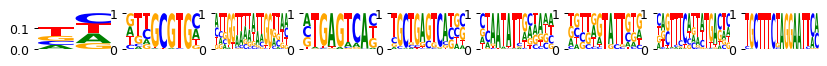

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:19:58.443971
	Loss: 188.774 , R2: 0.168
	Training time (model/function): (44.380s / 44.380s)
		per epoch (model/function): (3.170s/ 3.170s)
		per 1k samples: 0.587s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997344707644703, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.96s/it]


Current time: 2024-06-19 07:20:44.083012
	Loss: 159.993 , R2: 0.168
	Training time (model/function): (88.799s / 44.419s)
		per epoch (model/function): (6.343s/ 3.173s)
		per 1k samples: 0.587s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997344707644703, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.94s/it]


Current time: 2024-06-19 07:21:29.503766
	Loss: 147.976 , R2: 0.168
	Training time (model/function): (132.987s / 44.189s)
		per epoch (model/function): (9.499s/ 3.156s)
		per 1k samples: 0.584s
best loss 147.976
last five r2 values, by sequential filter optimization: ['0.168']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997344707644703, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.94s/it]


Current time: 2024-06-19 07:22:16.148262
	Loss: 149.385 , R2: 0.168
	Training time (model/function): (177.172s / 44.185s)
		per epoch (model/function): (12.655s/ 3.156s)
		per 1k samples: 0.584s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997344707644703, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.94s/it]


Current time: 2024-06-19 07:23:01.517252
	Loss: 144.921 , R2: 0.168
	Training time (model/function): (221.306s / 44.134s)
		per epoch (model/function): (15.808s/ 3.152s)
		per 1k samples: 0.584s
best loss 144.921
last five r2 values, by sequential filter optimization: ['0.168', '0.168']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997344707644703, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:23:48.232813
	Loss: 148.505 , R2: 0.168
	Training time (model/function): (265.614s / 44.308s)
		per epoch (model/function): (18.972s/ 3.165s)
		per 1k samples: 0.586s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997344707644703, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:24:33.854972
	Loss: 144.668 , R2: 0.168
	Training time (model/function): (309.988s / 44.374s)
		per epoch (model/function): (22.142s/ 3.170s)
		per 1k samples: 0.587s
best loss 144.668
last five r2 values, by sequential filter optimization: ['0.168', '0.168', '0.168']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997344707644703, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.96s/it]


Current time: 2024-06-19 07:25:20.627015
	Loss: 148.432 , R2: 0.168
	Training time (model/function): (354.400s / 44.412s)
		per epoch (model/function): (25.314s/ 3.172s)
		per 1k samples: 0.587s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997344707644703, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:26:06.159436
	Loss: 144.647 , R2: 0.168
	Training time (model/function): (398.702s / 44.303s)
		per epoch (model/function): (28.479s/ 3.164s)
		per 1k samples: 0.586s
best loss 144.646
last five r2 values, by sequential filter optimization: ['0.168', '0.168', '0.168', '0.168']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997344707644703, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.98s/it]


Current time: 2024-06-19 07:26:53.295242
	Loss: 148.427 , R2: 0.168
	Training time (model/function): (443.483s / 44.781s)
		per epoch (model/function): (31.677s/ 3.199s)
		per 1k samples: 0.592s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997344707644703, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.94s/it]


Current time: 2024-06-19 07:27:38.697800
	Loss: 144.645 , R2: 0.168
	Training time (model/function): (487.645s / 44.162s)
		per epoch (model/function): (34.832s/ 3.154s)
		per 1k samples: 0.584s
best loss 144.644
last five r2 values, by sequential filter optimization: ['0.168', '0.168', '0.168', '0.168', '0.168']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997344707644703, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 487.64528250694275s
Time per epoch (total): 0.112 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_2/model_1.pt
/home/ilibarra/workspace/theislab/

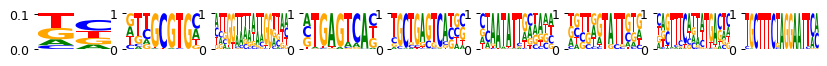

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.40it/s]


Current time: 2024-06-19 07:28:03.827893
	Loss: 188.721 , R2: 0.175
	Training time (model/function): (6.326s / 6.326s)
		per epoch (model/function): (0.452s/ 0.452s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990327750648539, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.35it/s]


Current time: 2024-06-19 07:28:11.405873
	Loss: 159.993 , R2: 0.176
	Training time (model/function): (12.766s / 6.441s)
		per epoch (model/function): (0.912s/ 0.460s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990327750648539, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.34it/s]


Current time: 2024-06-19 07:28:19.027502
	Loss: 147.976 , R2: 0.176
	Training time (model/function): (19.265s / 6.499s)
		per epoch (model/function): (1.376s/ 0.464s)
		per 1k samples: 0.086s
best loss 147.976
last five r2 values, by sequential filter optimization: ['0.176']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990327750648539, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.40it/s]


Current time: 2024-06-19 07:28:27.766581
	Loss: 149.379 , R2: 0.176
	Training time (model/function): (25.583s / 6.318s)
		per epoch (model/function): (1.827s/ 0.451s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990327750648539, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 07:28:35.419954
	Loss: 144.921 , R2: 0.176
	Training time (model/function): (32.012s / 6.429s)
		per epoch (model/function): (2.287s/ 0.459s)
		per 1k samples: 0.085s
best loss 144.921
last five r2 values, by sequential filter optimization: ['0.176', '0.176']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990327750648539, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.39it/s]


Current time: 2024-06-19 07:28:44.113795
	Loss: 148.496 , R2: 0.177
	Training time (model/function): (38.350s / 6.338s)
		per epoch (model/function): (2.739s/ 0.453s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990327750648539, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.33it/s]


Current time: 2024-06-19 07:28:51.747868
	Loss: 144.668 , R2: 0.177
	Training time (model/function): (44.858s / 6.508s)
		per epoch (model/function): (3.204s/ 0.465s)
		per 1k samples: 0.086s
best loss 144.668
last five r2 values, by sequential filter optimization: ['0.176', '0.176', '0.177']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990327750648539, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.39it/s]


Current time: 2024-06-19 07:29:00.531302
	Loss: 148.421 , R2: 0.177
	Training time (model/function): (51.216s / 6.358s)
		per epoch (model/function): (3.658s/ 0.454s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990327750648539, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.37it/s]


Current time: 2024-06-19 07:29:08.225840
	Loss: 144.646 , R2: 0.177
	Training time (model/function): (57.616s / 6.400s)
		per epoch (model/function): (4.115s/ 0.457s)
		per 1k samples: 0.085s
best loss 144.646
last five r2 values, by sequential filter optimization: ['0.176', '0.176', '0.177', '0.177']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990327750648539, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.42it/s]


Current time: 2024-06-19 07:29:16.856297
	Loss: 148.410 , R2: 0.178
	Training time (model/function): (63.896s / 6.281s)
		per epoch (model/function): (4.564s/ 0.449s)
		per 1k samples: 0.083s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990327750648539, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.42it/s]


Current time: 2024-06-19 07:29:24.344933
	Loss: 144.645 , R2: 0.178
	Training time (model/function): (70.169s / 6.273s)
		per epoch (model/function): (5.012s/ 0.448s)
		per 1k samples: 0.083s
best loss 144.644
last five r2 values, by sequential filter optimization: ['0.176', '0.176', '0.177', '0.177', '0.178']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990327750648539, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 70.1692008972168s
Time per epoch (total): 0.016 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_2/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


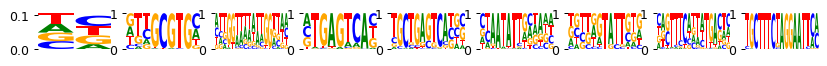

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:30:26.413661
	Loss: 188.775 , R2: 0.173
	Training time (model/function): (44.318s / 44.318s)
		per epoch (model/function): (3.166s/ 3.166s)
		per 1k samples: 0.586s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999761156567357, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:31:11.952114
	Loss: 159.993 , R2: 0.173
	Training time (model/function): (88.613s / 44.294s)
		per epoch (model/function): (6.329s/ 3.164s)
		per 1k samples: 0.586s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999761156567357, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.94s/it]


Current time: 2024-06-19 07:31:57.347957
	Loss: 147.977 , R2: 0.173
	Training time (model/function): (132.773s / 44.160s)
		per epoch (model/function): (9.484s/ 3.154s)
		per 1k samples: 0.584s
best loss 147.977
last five r2 values, by sequential filter optimization: ['0.173']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999761156567357, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:32:44.014096
	Loss: 149.385 , R2: 0.173
	Training time (model/function): (177.082s / 44.309s)
		per epoch (model/function): (12.649s/ 3.165s)
		per 1k samples: 0.586s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999761156567357, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.94s/it]


Current time: 2024-06-19 07:33:29.273296
	Loss: 144.922 , R2: 0.173
	Training time (model/function): (221.206s / 44.124s)
		per epoch (model/function): (15.800s/ 3.152s)
		per 1k samples: 0.584s
best loss 144.922
last five r2 values, by sequential filter optimization: ['0.173', '0.173']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999761156567357, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:34:16.003830
	Loss: 148.506 , R2: 0.173
	Training time (model/function): (265.576s / 44.370s)
		per epoch (model/function): (18.970s/ 3.169s)
		per 1k samples: 0.587s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999761156567357, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.97s/it]


Current time: 2024-06-19 07:35:01.859951
	Loss: 144.667 , R2: 0.173
	Training time (model/function): (310.209s / 44.633s)
		per epoch (model/function): (22.158s/ 3.188s)
		per 1k samples: 0.590s
best loss 144.667
last five r2 values, by sequential filter optimization: ['0.173', '0.173', '0.173']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999761156567357, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:35:48.615207
	Loss: 148.433 , R2: 0.173
	Training time (model/function): (354.501s / 44.292s)
		per epoch (model/function): (25.322s/ 3.164s)
		per 1k samples: 0.586s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999761156567357, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.93s/it]


Current time: 2024-06-19 07:36:33.931089
	Loss: 144.647 , R2: 0.173
	Training time (model/function): (398.574s / 44.073s)
		per epoch (model/function): (28.470s/ 3.148s)
		per 1k samples: 0.583s
best loss 144.646
last five r2 values, by sequential filter optimization: ['0.173', '0.173', '0.173', '0.173']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999761156567357, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:37:20.563359
	Loss: 148.427 , R2: 0.173
	Training time (model/function): (442.930s / 44.356s)
		per epoch (model/function): (31.638s/ 3.168s)
		per 1k samples: 0.587s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999761156567357, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.94s/it]


Current time: 2024-06-19 07:38:06.028751
	Loss: 144.645 , R2: 0.173
	Training time (model/function): (487.158s / 44.228s)
		per epoch (model/function): (34.797s/ 3.159s)
		per 1k samples: 0.585s
best loss 144.644
last five r2 values, by sequential filter optimization: ['0.173', '0.173', '0.173', '0.173', '0.173']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.999761156567357, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 487.15844440460205s
Time per epoch (total): 0.112 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_3/model_1.pt
/home/ilibarra/workspace/theislab/m

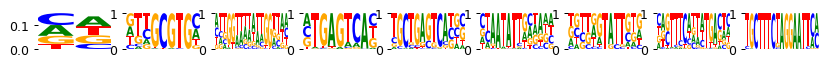

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.40it/s]


Current time: 2024-06-19 07:38:31.079797
	Loss: 188.722 , R2: 0.172
	Training time (model/function): (6.327s / 6.327s)
		per epoch (model/function): (0.452s/ 0.452s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990289993452194, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 07:38:38.662363
	Loss: 159.994 , R2: 0.173
	Training time (model/function): (12.769s / 6.442s)
		per epoch (model/function): (0.912s/ 0.460s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990289993452194, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.33it/s]


Current time: 2024-06-19 07:38:46.325255
	Loss: 147.977 , R2: 0.173
	Training time (model/function): (19.295s / 6.526s)
		per epoch (model/function): (1.378s/ 0.466s)
		per 1k samples: 0.086s
best loss 147.977
last five r2 values, by sequential filter optimization: ['0.173']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990289993452194, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.40it/s]


Current time: 2024-06-19 07:38:55.095511
	Loss: 149.380 , R2: 0.173
	Training time (model/function): (25.631s / 6.335s)
		per epoch (model/function): (1.831s/ 0.453s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990289993452194, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 07:39:02.765821
	Loss: 144.922 , R2: 0.174
	Training time (model/function): (32.066s / 6.436s)
		per epoch (model/function): (2.290s/ 0.460s)
		per 1k samples: 0.085s
best loss 144.922
last five r2 values, by sequential filter optimization: ['0.173', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990289993452194, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.39it/s]


Current time: 2024-06-19 07:39:11.462748
	Loss: 148.502 , R2: 0.174
	Training time (model/function): (38.410s / 6.344s)
		per epoch (model/function): (2.744s/ 0.453s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990289993452194, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 07:39:19.129898
	Loss: 144.668 , R2: 0.174
	Training time (model/function): (44.850s / 6.440s)
		per epoch (model/function): (3.204s/ 0.460s)
		per 1k samples: 0.085s
best loss 144.668
last five r2 values, by sequential filter optimization: ['0.173', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990289993452194, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.40it/s]


Current time: 2024-06-19 07:39:27.800655
	Loss: 148.426 , R2: 0.175
	Training time (model/function): (51.167s / 6.317s)
		per epoch (model/function): (3.655s/ 0.451s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990289993452194, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.37it/s]


Current time: 2024-06-19 07:39:35.354226
	Loss: 144.646 , R2: 0.175
	Training time (model/function): (57.579s / 6.412s)
		per epoch (model/function): (4.113s/ 0.458s)
		per 1k samples: 0.085s
best loss 144.646
last five r2 values, by sequential filter optimization: ['0.173', '0.174', '0.174', '0.175']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990289993452194, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.43it/s]


Current time: 2024-06-19 07:39:44.040231
	Loss: 148.415 , R2: 0.175
	Training time (model/function): (63.821s / 6.242s)
		per epoch (model/function): (4.559s/ 0.446s)
		per 1k samples: 0.083s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990289993452194, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.42it/s]


Current time: 2024-06-19 07:39:51.549107
	Loss: 144.644 , R2: 0.175
	Training time (model/function): (70.092s / 6.271s)
		per epoch (model/function): (5.007s/ 0.448s)
		per 1k samples: 0.083s
best loss 144.644
last five r2 values, by sequential filter optimization: ['0.173', '0.174', '0.174', '0.175', '0.175']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9990289993452194, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 70.0917980670929s
Time per epoch (total): 0.016 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_3/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


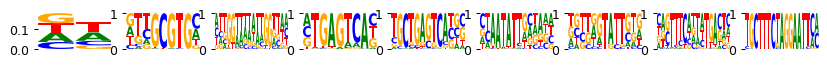

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.94s/it]


Current time: 2024-06-19 07:40:53.568839
	Loss: 188.792 , R2: 0.170
	Training time (model/function): (44.231s / 44.231s)
		per epoch (model/function): (3.159s/ 3.159s)
		per 1k samples: 0.585s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997572742175217, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:41:39.183873
	Loss: 159.993 , R2: 0.170
	Training time (model/function): (88.575s / 44.344s)
		per epoch (model/function): (6.327s/ 3.167s)
		per 1k samples: 0.586s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997572742175217, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.94s/it]


Current time: 2024-06-19 07:42:24.566042
	Loss: 147.978 , R2: 0.170
	Training time (model/function): (132.683s / 44.108s)
		per epoch (model/function): (9.477s/ 3.151s)
		per 1k samples: 0.583s
best loss 147.978
last five r2 values, by sequential filter optimization: ['0.170']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997572742175217, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:43:11.303081
	Loss: 149.387 , R2: 0.170
	Training time (model/function): (177.011s / 44.329s)
		per epoch (model/function): (12.644s/ 3.166s)
		per 1k samples: 0.586s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997572742175217, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:43<00:00,  2.93s/it]


Current time: 2024-06-19 07:43:56.624864
	Loss: 144.921 , R2: 0.170
	Training time (model/function): (221.060s / 44.049s)
		per epoch (model/function): (15.790s/ 3.146s)
		per 1k samples: 0.583s
best loss 144.921
last five r2 values, by sequential filter optimization: ['0.170', '0.170']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997572742175217, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.99s/it]


Current time: 2024-06-19 07:44:44.017261
	Loss: 148.507 , R2: 0.170
	Training time (model/function): (265.951s / 44.891s)
		per epoch (model/function): (18.996s/ 3.206s)
		per 1k samples: 0.594s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997572742175217, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.96s/it]


Current time: 2024-06-19 07:45:29.751680
	Loss: 144.669 , R2: 0.170
	Training time (model/function): (310.410s / 44.459s)
		per epoch (model/function): (22.172s/ 3.176s)
		per 1k samples: 0.588s
best loss 144.669
last five r2 values, by sequential filter optimization: ['0.170', '0.170', '0.170']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997572742175217, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:46:16.380664
	Loss: 148.434 , R2: 0.170
	Training time (model/function): (354.730s / 44.320s)
		per epoch (model/function): (25.338s/ 3.166s)
		per 1k samples: 0.586s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997572742175217, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:43<00:00,  2.93s/it]


Current time: 2024-06-19 07:47:01.712309
	Loss: 144.647 , R2: 0.170
	Training time (model/function): (398.788s / 44.059s)
		per epoch (model/function): (28.485s/ 3.147s)
		per 1k samples: 0.583s
best loss 144.647
last five r2 values, by sequential filter optimization: ['0.170', '0.170', '0.170', '0.170']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997572742175217, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:47:48.486444
	Loss: 148.428 , R2: 0.170
	Training time (model/function): (443.072s / 44.284s)
		per epoch (model/function): (31.648s/ 3.163s)
		per 1k samples: 0.586s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997572742175217, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:43<00:00,  2.93s/it]


Current time: 2024-06-19 07:48:33.714216
	Loss: 144.646 , R2: 0.170
	Training time (model/function): (487.116s / 44.044s)
		per epoch (model/function): (34.794s/ 3.146s)
		per 1k samples: 0.582s
best loss 144.646
last five r2 values, by sequential filter optimization: ['0.170', '0.170', '0.170', '0.170', '0.170']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997572742175217, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 487.1163773536682s
Time per epoch (total): 0.112 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_4/model_1.pt
/home/ilibarra/workspace/theislab/m

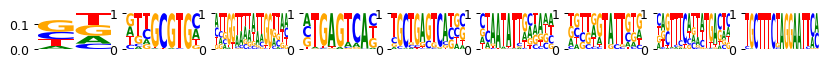

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.34it/s]


Current time: 2024-06-19 07:48:59.117743
	Loss: 188.724 , R2: 0.176
	Training time (model/function): (6.515s / 6.515s)
		per epoch (model/function): (0.465s/ 0.465s)
		per 1k samples: 0.086s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989795730212889, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.31it/s]


Current time: 2024-06-19 07:49:06.941687
	Loss: 159.993 , R2: 0.177
	Training time (model/function): (13.077s / 6.562s)
		per epoch (model/function): (0.934s/ 0.469s)
		per 1k samples: 0.087s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989795730212889, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.29it/s]


Current time: 2024-06-19 07:49:14.721663
	Loss: 147.977 , R2: 0.177
	Training time (model/function): (19.719s / 6.641s)
		per epoch (model/function): (1.408s/ 0.474s)
		per 1k samples: 0.088s
best loss 147.977
last five r2 values, by sequential filter optimization: ['0.177']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989795730212889, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.35it/s]


Current time: 2024-06-19 07:49:23.673064
	Loss: 149.381 , R2: 0.177
	Training time (model/function): (26.187s / 6.469s)
		per epoch (model/function): (1.871s/ 0.462s)
		per 1k samples: 0.086s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989795730212889, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.32it/s]


Current time: 2024-06-19 07:49:31.483869
	Loss: 144.922 , R2: 0.177
	Training time (model/function): (32.726s / 6.539s)
		per epoch (model/function): (2.338s/ 0.467s)
		per 1k samples: 0.086s
best loss 144.922
last five r2 values, by sequential filter optimization: ['0.177', '0.177']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989795730212889, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.32it/s]


Current time: 2024-06-19 07:49:40.335917
	Loss: 148.498 , R2: 0.178
	Training time (model/function): (39.268s / 6.542s)
		per epoch (model/function): (2.805s/ 0.467s)
		per 1k samples: 0.087s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989795730212889, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.32it/s]


Current time: 2024-06-19 07:49:48.122833
	Loss: 144.668 , R2: 0.178
	Training time (model/function): (45.828s / 6.560s)
		per epoch (model/function): (3.273s/ 0.469s)
		per 1k samples: 0.087s
best loss 144.668
last five r2 values, by sequential filter optimization: ['0.177', '0.177', '0.178']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989795730212889, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.35it/s]


Current time: 2024-06-19 07:49:57.078772
	Loss: 148.423 , R2: 0.178
	Training time (model/function): (52.294s / 6.466s)
		per epoch (model/function): (3.735s/ 0.462s)
		per 1k samples: 0.086s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989795730212889, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 07:50:04.694944
	Loss: 144.647 , R2: 0.178
	Training time (model/function): (58.737s / 6.443s)
		per epoch (model/function): (4.195s/ 0.460s)
		per 1k samples: 0.085s
best loss 144.647
last five r2 values, by sequential filter optimization: ['0.177', '0.177', '0.178', '0.178']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989795730212889, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.38it/s]


Current time: 2024-06-19 07:50:13.577835
	Loss: 148.411 , R2: 0.179
	Training time (model/function): (65.133s / 6.396s)
		per epoch (model/function): (4.652s/ 0.457s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989795730212889, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.37it/s]


Current time: 2024-06-19 07:50:21.230354
	Loss: 144.645 , R2: 0.178
	Training time (model/function): (71.545s / 6.412s)
		per epoch (model/function): (5.110s/ 0.458s)
		per 1k samples: 0.085s
best loss 144.645
last five r2 values, by sequential filter optimization: ['0.177', '0.177', '0.178', '0.178', '0.178']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989795730212889, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 71.54538679122925s
Time per epoch (total): 0.016 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_4/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


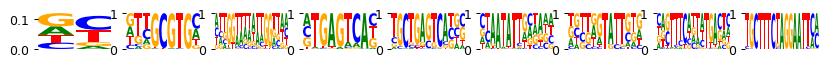

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:51:23.572435
	Loss: 188.783 , R2: 0.174
	Training time (model/function): (44.372s / 44.372s)
		per epoch (model/function): (3.169s/ 3.169s)
		per 1k samples: 0.587s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997420745619723, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:52:08.990808
	Loss: 159.994 , R2: 0.174
	Training time (model/function): (88.654s / 44.282s)
		per epoch (model/function): (6.332s/ 3.163s)
		per 1k samples: 0.586s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997420745619723, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:52:54.423378
	Loss: 147.977 , R2: 0.174
	Training time (model/function): (132.943s / 44.289s)
		per epoch (model/function): (9.496s/ 3.164s)
		per 1k samples: 0.586s
best loss 147.977
last five r2 values, by sequential filter optimization: ['0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997420745619723, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.01s/it]


Current time: 2024-06-19 07:53:42.078415
	Loss: 149.387 , R2: 0.174
	Training time (model/function): (178.128s / 45.184s)
		per epoch (model/function): (12.723s/ 3.227s)
		per 1k samples: 0.598s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997420745619723, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.96s/it]


Current time: 2024-06-19 07:54:27.662850
	Loss: 144.922 , R2: 0.174
	Training time (model/function): (222.560s / 44.433s)
		per epoch (model/function): (15.897s/ 3.174s)
		per 1k samples: 0.588s
best loss 144.922
last five r2 values, by sequential filter optimization: ['0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997420745619723, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.96s/it]


Current time: 2024-06-19 07:55:14.572892
	Loss: 148.507 , R2: 0.174
	Training time (model/function): (267.000s / 44.440s)
		per epoch (model/function): (19.071s/ 3.174s)
		per 1k samples: 0.588s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997420745619723, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.97s/it]


Current time: 2024-06-19 07:56:00.430632
	Loss: 144.669 , R2: 0.174
	Training time (model/function): (311.618s / 44.619s)
		per epoch (model/function): (22.258s/ 3.187s)
		per 1k samples: 0.590s
best loss 144.669
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997420745619723, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.96s/it]


Current time: 2024-06-19 07:56:47.328419
	Loss: 148.434 , R2: 0.174
	Training time (model/function): (356.123s / 44.505s)
		per epoch (model/function): (25.437s/ 3.179s)
		per 1k samples: 0.589s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997420745619723, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:57:32.903775
	Loss: 144.647 , R2: 0.174
	Training time (model/function): (400.451s / 44.327s)
		per epoch (model/function): (28.604s/ 3.166s)
		per 1k samples: 0.586s
best loss 144.647
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997420745619723, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Current time: 2024-06-19 07:58:19.667338
	Loss: 148.428 , R2: 0.174
	Training time (model/function): (444.835s / 44.384s)
		per epoch (model/function): (31.774s/ 3.170s)
		per 1k samples: 0.587s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997420745619723, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.94s/it]


Current time: 2024-06-19 07:59:05.052900
	Loss: 144.646 , R2: 0.174
	Training time (model/function): (489.077s / 44.242s)
		per epoch (model/function): (34.934s/ 3.160s)
		per 1k samples: 0.585s
best loss 144.645
last five r2 values, by sequential filter optimization: ['0.174', '0.174', '0.174', '0.174', '0.174']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9997420745619723, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 489.0766706466675s
Time per epoch (total): 0.112 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/random/mubind_output/obs2000/pwms/fold_4/running_time_1.pkl
80

/home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/merged_scATAC_integrated_cicero_faye_chong_obs2000_var6000.h5ad
noack_2022 (2000, 6000)
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold

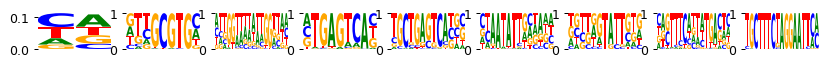

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.30it/s]


Current time: 2024-06-19 07:59:31.068129
	Loss: 188.534 , R2: 0.006
	Training time (model/function): (6.590s / 6.590s)
		per epoch (model/function): (0.471s/ 0.471s)
		per 1k samples: 0.087s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988664109088016, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 07:59:38.711239
	Loss: 159.805 , R2: 0.006
	Training time (model/function): (13.032s / 6.442s)
		per epoch (model/function): (0.931s/ 0.460s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988664109088016, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.32it/s]


Current time: 2024-06-19 07:59:46.457493
	Loss: 147.788 , R2: 0.006
	Training time (model/function): (19.579s / 6.547s)
		per epoch (model/function): (1.398s/ 0.468s)
		per 1k samples: 0.087s
best loss 147.788
last five r2 values, by sequential filter optimization: ['0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988664109088016, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.35it/s]


Current time: 2024-06-19 07:59:55.322054
	Loss: 149.191 , R2: 0.006
	Training time (model/function): (26.046s / 6.467s)
		per epoch (model/function): (1.860s/ 0.462s)
		per 1k samples: 0.086s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988664109088016, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.32it/s]


Current time: 2024-06-19 08:00:02.985891
	Loss: 144.733 , R2: 0.006
	Training time (model/function): (32.596s / 6.550s)
		per epoch (model/function): (2.328s/ 0.468s)
		per 1k samples: 0.087s
best loss 144.733
last five r2 values, by sequential filter optimization: ['0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988664109088016, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.35it/s]


Current time: 2024-06-19 08:00:11.856686
	Loss: 148.301 , R2: 0.007
	Training time (model/function): (39.072s / 6.476s)
		per epoch (model/function): (2.791s/ 0.463s)
		per 1k samples: 0.086s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988664109088016, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.32it/s]


Current time: 2024-06-19 08:00:19.596702
	Loss: 144.480 , R2: 0.007
	Training time (model/function): (45.607s / 6.535s)
		per epoch (model/function): (3.258s/ 0.467s)
		per 1k samples: 0.087s
best loss 144.480
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988664109088016, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.32it/s]


Current time: 2024-06-19 08:00:28.437511
	Loss: 148.219 , R2: 0.007
	Training time (model/function): (52.146s / 6.540s)
		per epoch (model/function): (3.725s/ 0.467s)
		per 1k samples: 0.087s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988664109088016, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.35it/s]


Current time: 2024-06-19 08:00:36.098672
	Loss: 144.459 , R2: 0.007
	Training time (model/function): (58.608s / 6.462s)
		per epoch (model/function): (4.186s/ 0.462s)
		per 1k samples: 0.086s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988664109088016, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.35it/s]


Current time: 2024-06-19 08:00:44.953855
	Loss: 148.214 , R2: 0.007
	Training time (model/function): (65.067s / 6.458s)
		per epoch (model/function): (4.648s/ 0.461s)
		per 1k samples: 0.086s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988664109088016, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.35it/s]


Current time: 2024-06-19 08:00:52.527816
	Loss: 144.457 , R2: 0.007
	Training time (model/function): (71.527s / 6.460s)
		per epoch (model/function): (5.109s/ 0.461s)
		per 1k samples: 0.086s
best loss 144.457
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007', '0.007', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988664109088016, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 71.52673125267029s
Time per epoch (total): 0.016 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_0/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


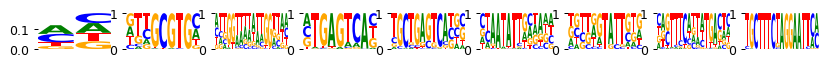

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.01s/it]


Current time: 2024-06-19 08:01:55.510577
	Loss: 188.634 , R2: 0.003
	Training time (model/function): (45.245s / 45.245s)
		per epoch (model/function): (3.232s/ 3.232s)
		per 1k samples: 0.600s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989181775174962, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  3.00s/it]


Current time: 2024-06-19 08:02:41.829963
	Loss: 159.806 , R2: 0.004
	Training time (model/function): (90.317s / 45.073s)
		per epoch (model/function): (6.451s/ 3.219s)
		per 1k samples: 0.598s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989181775174962, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.99s/it]


Current time: 2024-06-19 08:03:27.935746
	Loss: 147.788 , R2: 0.004
	Training time (model/function): (135.204s / 44.887s)
		per epoch (model/function): (9.657s/ 3.206s)
		per 1k samples: 0.596s
best loss 147.788
last five r2 values, by sequential filter optimization: ['0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989181775174962, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.01s/it]


Current time: 2024-06-19 08:04:15.523936
	Loss: 149.198 , R2: 0.004
	Training time (model/function): (180.398s / 45.194s)
		per epoch (model/function): (12.886s/ 3.228s)
		per 1k samples: 0.600s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989181775174962, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  3.00s/it]


Current time: 2024-06-19 08:05:01.707119
	Loss: 144.733 , R2: 0.005
	Training time (model/function): (225.455s / 45.057s)
		per epoch (model/function): (16.104s/ 3.218s)
		per 1k samples: 0.598s
best loss 144.733
last five r2 values, by sequential filter optimization: ['0.004', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989181775174962, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 08:05:49.547417
	Loss: 148.311 , R2: 0.006
	Training time (model/function): (270.900s / 45.445s)
		per epoch (model/function): (19.350s/ 3.246s)
		per 1k samples: 0.603s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989181775174962, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.99s/it]


Current time: 2024-06-19 08:06:35.699034
	Loss: 144.480 , R2: 0.006
	Training time (model/function): (315.832s / 44.932s)
		per epoch (model/function): (22.559s/ 3.209s)
		per 1k samples: 0.596s
best loss 144.480
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989181775174962, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.00s/it]


Current time: 2024-06-19 08:07:23.307301
	Loss: 148.235 , R2: 0.006
	Training time (model/function): (360.944s / 45.112s)
		per epoch (model/function): (25.782s/ 3.222s)
		per 1k samples: 0.599s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989181775174962, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.07s/it]


Current time: 2024-06-19 08:08:10.497008
	Loss: 144.459 , R2: 0.006
	Training time (model/function): (407.010s / 46.066s)
		per epoch (model/function): (29.072s/ 3.290s)
		per 1k samples: 0.611s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989181775174962, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.00s/it]


Current time: 2024-06-19 08:08:58.121989
	Loss: 148.234 , R2: 0.006
	Training time (model/function): (452.137s / 45.127s)
		per epoch (model/function): (32.296s/ 3.223s)
		per 1k samples: 0.599s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989181775174962, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.99s/it]


Current time: 2024-06-19 08:09:44.334260
	Loss: 144.457 , R2: 0.006
	Training time (model/function): (497.090s / 44.952s)
		per epoch (model/function): (35.506s/ 3.211s)
		per 1k samples: 0.596s
best loss 144.457
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989181775174962, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 497.08968234062195s
Time per epoch (total): 0.114 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_1/model_1.pt
/home/ilibarra/workspace/

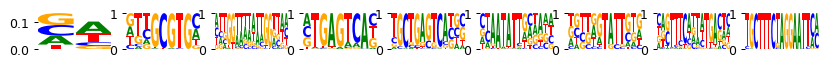

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 08:10:10.343726
	Loss: 188.534 , R2: 0.006
	Training time (model/function): (6.428s / 6.428s)
		per epoch (model/function): (0.459s/ 0.459s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988732760936537, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 08:10:17.974925
	Loss: 159.805 , R2: 0.006
	Training time (model/function): (12.850s / 6.422s)
		per epoch (model/function): (0.918s/ 0.459s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988732760936537, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.33it/s]


Current time: 2024-06-19 08:10:25.689868
	Loss: 147.788 , R2: 0.006
	Training time (model/function): (19.359s / 6.509s)
		per epoch (model/function): (1.383s/ 0.465s)
		per 1k samples: 0.086s
best loss 147.788
last five r2 values, by sequential filter optimization: ['0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988732760936537, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.35it/s]


Current time: 2024-06-19 08:10:34.598161
	Loss: 149.191 , R2: 0.006
	Training time (model/function): (25.813s / 6.454s)
		per epoch (model/function): (1.844s/ 0.461s)
		per 1k samples: 0.086s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988732760936537, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.33it/s]


Current time: 2024-06-19 08:10:42.230072
	Loss: 144.733 , R2: 0.006
	Training time (model/function): (32.321s / 6.508s)
		per epoch (model/function): (2.309s/ 0.465s)
		per 1k samples: 0.086s
best loss 144.733
last five r2 values, by sequential filter optimization: ['0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988732760936537, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 08:10:51.065655
	Loss: 148.301 , R2: 0.007
	Training time (model/function): (38.749s / 6.428s)
		per epoch (model/function): (2.768s/ 0.459s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988732760936537, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.33it/s]


Current time: 2024-06-19 08:10:58.804068
	Loss: 144.480 , R2: 0.007
	Training time (model/function): (45.273s / 6.524s)
		per epoch (model/function): (3.234s/ 0.466s)
		per 1k samples: 0.087s
best loss 144.480
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988732760936537, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.33it/s]


Current time: 2024-06-19 08:11:07.685354
	Loss: 148.218 , R2: 0.007
	Training time (model/function): (51.783s / 6.510s)
		per epoch (model/function): (3.699s/ 0.465s)
		per 1k samples: 0.086s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988732760936537, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.32it/s]


Current time: 2024-06-19 08:11:15.349164
	Loss: 144.459 , R2: 0.007
	Training time (model/function): (58.326s / 6.542s)
		per epoch (model/function): (4.166s/ 0.467s)
		per 1k samples: 0.087s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988732760936537, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.37it/s]


Current time: 2024-06-19 08:11:24.173019
	Loss: 148.215 , R2: 0.007
	Training time (model/function): (64.738s / 6.413s)
		per epoch (model/function): (4.624s/ 0.458s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988732760936537, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.37it/s]


Current time: 2024-06-19 08:11:31.797643
	Loss: 144.457 , R2: 0.007
	Training time (model/function): (71.147s / 6.408s)
		per epoch (model/function): (5.082s/ 0.458s)
		per 1k samples: 0.085s
best loss 144.457
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007', '0.007', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988732760936537, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 71.1466236114502s
Time per epoch (total): 0.016 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_1/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


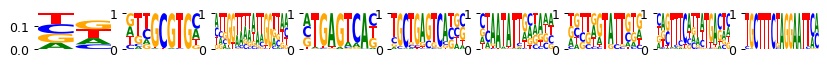

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.01s/it]


Current time: 2024-06-19 08:12:34.682894
	Loss: 188.619 , R2: 0.003
	Training time (model/function): (45.158s / 45.158s)
		per epoch (model/function): (3.226s/ 3.226s)
		per 1k samples: 0.599s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989515197202644, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  3.00s/it]


Current time: 2024-06-19 08:13:20.924848
	Loss: 159.806 , R2: 0.004
	Training time (model/function): (90.226s / 45.069s)
		per epoch (model/function): (6.445s/ 3.219s)
		per 1k samples: 0.598s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989515197202644, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.99s/it]


Current time: 2024-06-19 08:14:07.317041
	Loss: 147.788 , R2: 0.004
	Training time (model/function): (135.155s / 44.929s)
		per epoch (model/function): (9.654s/ 3.209s)
		per 1k samples: 0.596s
best loss 147.788
last five r2 values, by sequential filter optimization: ['0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989515197202644, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.00s/it]


Current time: 2024-06-19 08:14:55.068273
	Loss: 149.198 , R2: 0.005
	Training time (model/function): (180.302s / 45.147s)
		per epoch (model/function): (12.879s/ 3.225s)
		per 1k samples: 0.599s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989515197202644, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.99s/it]


Current time: 2024-06-19 08:15:41.175302
	Loss: 144.733 , R2: 0.005
	Training time (model/function): (225.156s / 44.853s)
		per epoch (model/function): (16.083s/ 3.204s)
		per 1k samples: 0.595s
best loss 144.733
last five r2 values, by sequential filter optimization: ['0.004', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989515197202644, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.99s/it]


Current time: 2024-06-19 08:16:28.442973
	Loss: 148.310 , R2: 0.006
	Training time (model/function): (270.078s / 44.922s)
		per epoch (model/function): (19.291s/ 3.209s)
		per 1k samples: 0.596s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989515197202644, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.00s/it]


Current time: 2024-06-19 08:17:14.812622
	Loss: 144.480 , R2: 0.006
	Training time (model/function): (315.181s / 45.104s)
		per epoch (model/function): (22.513s/ 3.222s)
		per 1k samples: 0.598s
best loss 144.480
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989515197202644, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.01s/it]


Current time: 2024-06-19 08:18:02.319145
	Loss: 148.233 , R2: 0.006
	Training time (model/function): (360.342s / 45.161s)
		per epoch (model/function): (25.739s/ 3.226s)
		per 1k samples: 0.599s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989515197202644, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.98s/it]


Current time: 2024-06-19 08:18:48.343656
	Loss: 144.459 , R2: 0.006
	Training time (model/function): (405.105s / 44.763s)
		per epoch (model/function): (28.936s/ 3.197s)
		per 1k samples: 0.594s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989515197202644, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Current time: 2024-06-19 08:19:36.153172
	Loss: 148.234 , R2: 0.006
	Training time (model/function): (450.481s / 45.376s)
		per epoch (model/function): (32.177s/ 3.241s)
		per 1k samples: 0.602s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989515197202644, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.98s/it]


Current time: 2024-06-19 08:20:22.216189
	Loss: 144.457 , R2: 0.006
	Training time (model/function): (495.281s / 44.801s)
		per epoch (model/function): (35.377s/ 3.200s)
		per 1k samples: 0.594s
best loss 144.457
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989515197202644, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 495.28136372566223s
Time per epoch (total): 0.114 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_2/model_1.pt
/home/ilibarra/workspace/

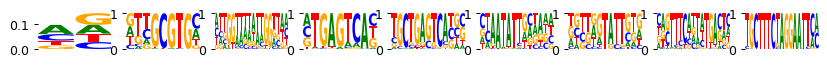

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.40it/s]


Current time: 2024-06-19 08:20:48.200266
	Loss: 188.534 , R2: 0.006
	Training time (model/function): (6.324s / 6.324s)
		per epoch (model/function): (0.452s/ 0.452s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988767626346237, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.34it/s]


Current time: 2024-06-19 08:20:55.888501
	Loss: 159.805 , R2: 0.006
	Training time (model/function): (12.798s / 6.474s)
		per epoch (model/function): (0.914s/ 0.462s)
		per 1k samples: 0.086s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988767626346237, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 08:21:03.544292
	Loss: 147.788 , R2: 0.006
	Training time (model/function): (19.234s / 6.436s)
		per epoch (model/function): (1.374s/ 0.460s)
		per 1k samples: 0.085s
best loss 147.788
last five r2 values, by sequential filter optimization: ['0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988767626346237, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.39it/s]


Current time: 2024-06-19 08:21:12.224705
	Loss: 149.191 , R2: 0.006
	Training time (model/function): (25.591s / 6.357s)
		per epoch (model/function): (1.828s/ 0.454s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988767626346237, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 08:21:19.857717
	Loss: 144.733 , R2: 0.006
	Training time (model/function): (32.008s / 6.417s)
		per epoch (model/function): (2.286s/ 0.458s)
		per 1k samples: 0.085s
best loss 144.733
last five r2 values, by sequential filter optimization: ['0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988767626346237, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.40it/s]


Current time: 2024-06-19 08:21:28.531081
	Loss: 148.301 , R2: 0.007
	Training time (model/function): (38.344s / 6.336s)
		per epoch (model/function): (2.739s/ 0.453s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988767626346237, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.34it/s]


Current time: 2024-06-19 08:21:36.147696
	Loss: 144.480 , R2: 0.007
	Training time (model/function): (44.839s / 6.495s)
		per epoch (model/function): (3.203s/ 0.464s)
		per 1k samples: 0.086s
best loss 144.480
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988767626346237, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.39it/s]


Current time: 2024-06-19 08:21:44.902654
	Loss: 148.219 , R2: 0.007
	Training time (model/function): (51.176s / 6.337s)
		per epoch (model/function): (3.655s/ 0.453s)
		per 1k samples: 0.084s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988767626346237, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.39it/s]


Current time: 2024-06-19 08:21:52.480217
	Loss: 144.459 , R2: 0.007
	Training time (model/function): (57.536s / 6.361s)
		per epoch (model/function): (4.110s/ 0.454s)
		per 1k samples: 0.084s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988767626346237, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.36it/s]


Current time: 2024-06-19 08:22:01.132447
	Loss: 148.215 , R2: 0.007
	Training time (model/function): (63.955s / 6.419s)
		per epoch (model/function): (4.568s/ 0.459s)
		per 1k samples: 0.085s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988767626346237, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.37it/s]


Current time: 2024-06-19 08:22:08.670185
	Loss: 144.457 , R2: 0.007
	Training time (model/function): (70.370s / 6.414s)
		per epoch (model/function): (5.026s/ 0.458s)
		per 1k samples: 0.085s
best loss 144.457
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007', '0.007', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988767626346237, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 70.36959099769592s
Time per epoch (total): 0.016 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_2/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


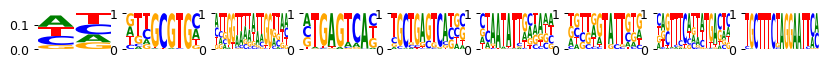

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.01s/it]


Current time: 2024-06-19 08:23:11.602846
	Loss: 188.599 , R2: 0.003
	Training time (model/function): (45.267s / 45.267s)
		per epoch (model/function): (3.233s/ 3.233s)
		per 1k samples: 0.600s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989303548809338, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.00s/it]


Current time: 2024-06-19 08:23:57.972317
	Loss: 159.806 , R2: 0.004
	Training time (model/function): (90.399s / 45.132s)
		per epoch (model/function): (6.457s/ 3.224s)
		per 1k samples: 0.599s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989303548809338, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.99s/it]


Current time: 2024-06-19 08:24:44.196355
	Loss: 147.788 , R2: 0.004
	Training time (model/function): (135.349s / 44.950s)
		per epoch (model/function): (9.668s/ 3.211s)
		per 1k samples: 0.596s
best loss 147.788
last five r2 values, by sequential filter optimization: ['0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989303548809338, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.00s/it]


Current time: 2024-06-19 08:25:31.556859
	Loss: 149.198 , R2: 0.005
	Training time (model/function): (180.448s / 45.099s)
		per epoch (model/function): (12.889s/ 3.221s)
		per 1k samples: 0.598s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989303548809338, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.00s/it]


Current time: 2024-06-19 08:26:17.814226
	Loss: 144.733 , R2: 0.005
	Training time (model/function): (225.535s / 45.088s)
		per epoch (model/function): (16.110s/ 3.221s)
		per 1k samples: 0.598s
best loss 144.733
last five r2 values, by sequential filter optimization: ['0.004', '0.005']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989303548809338, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:48<00:00,  3.20s/it]


Current time: 2024-06-19 08:27:08.555428
	Loss: 148.310 , R2: 0.006
	Training time (model/function): (273.659s / 48.123s)
		per epoch (model/function): (19.547s/ 3.437s)
		per 1k samples: 0.638s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989303548809338, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 08:27:57.699079
	Loss: 144.480 , R2: 0.006
	Training time (model/function): (321.247s / 47.588s)
		per epoch (model/function): (22.946s/ 3.399s)
		per 1k samples: 0.631s
best loss 144.480
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989303548809338, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.20s/it]


Current time: 2024-06-19 08:28:48.312296
	Loss: 148.233 , R2: 0.006
	Training time (model/function): (369.318s / 48.071s)
		per epoch (model/function): (26.380s/ 3.434s)
		per 1k samples: 0.638s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989303548809338, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 08:29:37.333514
	Loss: 144.459 , R2: 0.006
	Training time (model/function): (417.033s / 47.715s)
		per epoch (model/function): (29.788s/ 3.408s)
		per 1k samples: 0.633s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989303548809338, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:48<00:00,  3.22s/it]


Current time: 2024-06-19 08:30:28.617823
	Loss: 148.233 , R2: 0.006
	Training time (model/function): (465.465s / 48.432s)
		per epoch (model/function): (33.248s/ 3.459s)
		per 1k samples: 0.642s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989303548809338, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:48<00:00,  3.23s/it]


Current time: 2024-06-19 08:31:18.619548
	Loss: 144.457 , R2: 0.006
	Training time (model/function): (514.105s / 48.640s)
		per epoch (model/function): (36.722s/ 3.474s)
		per 1k samples: 0.645s
best loss 144.457
last five r2 values, by sequential filter optimization: ['0.004', '0.005', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989303548809338, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 514.1049120426178s
Time per epoch (total): 0.118 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_3/model_1.pt
/home/ilibarra/workspace/t

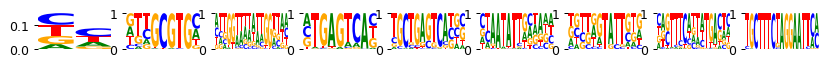

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.16it/s]


Current time: 2024-06-19 08:31:46.357616
	Loss: 188.534 , R2: 0.006
	Training time (model/function): (7.004s / 7.004s)
		per epoch (model/function): (0.500s/ 0.500s)
		per 1k samples: 0.093s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988671024323988, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.19it/s]


Current time: 2024-06-19 08:31:54.577812
	Loss: 159.805 , R2: 0.006
	Training time (model/function): (13.923s / 6.919s)
		per epoch (model/function): (0.995s/ 0.494s)
		per 1k samples: 0.092s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988671024323988, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  2.13it/s]


Current time: 2024-06-19 08:32:02.991518
	Loss: 147.788 , R2: 0.006
	Training time (model/function): (21.082s / 7.159s)
		per epoch (model/function): (1.506s/ 0.511s)
		per 1k samples: 0.095s
best loss 147.788
last five r2 values, by sequential filter optimization: ['0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988671024323988, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.24it/s]


Current time: 2024-06-19 08:32:12.532702
	Loss: 149.191 , R2: 0.006
	Training time (model/function): (27.862s / 6.780s)
		per epoch (model/function): (1.990s/ 0.484s)
		per 1k samples: 0.090s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988671024323988, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.15it/s]


Current time: 2024-06-19 08:32:21.124319
	Loss: 144.733 , R2: 0.006
	Training time (model/function): (35.017s / 7.155s)
		per epoch (model/function): (2.501s/ 0.511s)
		per 1k samples: 0.095s
best loss 144.733
last five r2 values, by sequential filter optimization: ['0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988671024323988, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  2.12it/s]


Current time: 2024-06-19 08:32:30.866130
	Loss: 148.301 , R2: 0.007
	Training time (model/function): (42.203s / 7.186s)
		per epoch (model/function): (3.014s/ 0.513s)
		per 1k samples: 0.095s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988671024323988, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  2.00it/s]


Current time: 2024-06-19 08:32:39.670979
	Loss: 144.480 , R2: 0.007
	Training time (model/function): (49.794s / 7.592s)
		per epoch (model/function): (3.557s/ 0.542s)
		per 1k samples: 0.101s
best loss 144.480
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988671024323988, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.14it/s]


Current time: 2024-06-19 08:32:49.362249
	Loss: 148.218 , R2: 0.007
	Training time (model/function): (56.871s / 7.077s)
		per epoch (model/function): (4.062s/ 0.505s)
		per 1k samples: 0.094s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988671024323988, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.21it/s]


Current time: 2024-06-19 08:32:57.596359
	Loss: 144.459 , R2: 0.007
	Training time (model/function): (63.755s / 6.884s)
		per epoch (model/function): (4.554s/ 0.492s)
		per 1k samples: 0.091s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988671024323988, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.20it/s]


Current time: 2024-06-19 08:33:06.956565
	Loss: 148.215 , R2: 0.007
	Training time (model/function): (70.656s / 6.901s)
		per epoch (model/function): (5.047s/ 0.493s)
		per 1k samples: 0.092s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988671024323988, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.24it/s]


Current time: 2024-06-19 08:33:15.108041
	Loss: 144.457 , R2: 0.007
	Training time (model/function): (77.426s / 6.770s)
		per epoch (model/function): (5.530s/ 0.484s)
		per 1k samples: 0.090s
best loss 144.457
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007', '0.007', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988671024323988, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 77.42630124092102s
Time per epoch (total): 0.018 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_3/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


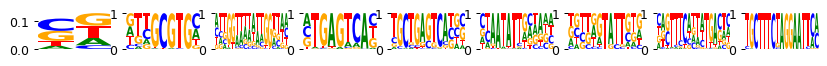

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:49<00:00,  3.32s/it]


Current time: 2024-06-19 08:34:23.950376
	Loss: 188.601 , R2: 0.003
	Training time (model/function): (49.876s / 49.876s)
		per epoch (model/function): (3.563s/ 3.563s)
		per 1k samples: 0.662s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998949293852541, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:48<00:00,  3.27s/it]


Current time: 2024-06-19 08:35:14.279204
	Loss: 159.806 , R2: 0.004
	Training time (model/function): (98.949s / 49.073s)
		per epoch (model/function): (7.068s/ 3.505s)
		per 1k samples: 0.651s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998949293852541, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:50<00:00,  3.36s/it]


Current time: 2024-06-19 08:36:06.057302
	Loss: 147.788 , R2: 0.004
	Training time (model/function): (149.378s / 50.429s)
		per epoch (model/function): (10.670s/ 3.602s)
		per 1k samples: 0.669s
best loss 147.788
last five r2 values, by sequential filter optimization: ['0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998949293852541, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:49<00:00,  3.28s/it]


Current time: 2024-06-19 08:36:57.951650
	Loss: 149.198 , R2: 0.005
	Training time (model/function): (198.707s / 49.328s)
		per epoch (model/function): (14.193s/ 3.523s)
		per 1k samples: 0.654s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998949293852541, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:48<00:00,  3.26s/it]


Current time: 2024-06-19 08:37:48.288645
	Loss: 144.733 , R2: 0.006
	Training time (model/function): (247.711s / 49.005s)
		per epoch (model/function): (17.694s/ 3.500s)
		per 1k samples: 0.650s
best loss 144.733
last five r2 values, by sequential filter optimization: ['0.004', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998949293852541, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:49<00:00,  3.32s/it]


Current time: 2024-06-19 08:38:40.614311
	Loss: 148.310 , R2: 0.006
	Training time (model/function): (297.636s / 49.924s)
		per epoch (model/function): (21.260s/ 3.566s)
		per 1k samples: 0.662s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998949293852541, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:50<00:00,  3.38s/it]


Current time: 2024-06-19 08:39:32.706804
	Loss: 144.480 , R2: 0.006
	Training time (model/function): (348.480s / 50.844s)
		per epoch (model/function): (24.891s/ 3.632s)
		per 1k samples: 0.674s
best loss 144.480
last five r2 values, by sequential filter optimization: ['0.004', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998949293852541, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:49<00:00,  3.32s/it]


Current time: 2024-06-19 08:40:25.343089
	Loss: 148.233 , R2: 0.006
	Training time (model/function): (398.311s / 49.831s)
		per epoch (model/function): (28.451s/ 3.559s)
		per 1k samples: 0.661s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998949293852541, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.17s/it]


Current time: 2024-06-19 08:41:14.370258
	Loss: 144.459 , R2: 0.006
	Training time (model/function): (446.026s / 47.715s)
		per epoch (model/function): (31.859s/ 3.408s)
		per 1k samples: 0.633s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.004', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998949293852541, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.19s/it]


Current time: 2024-06-19 08:42:05.130160
	Loss: 148.233 , R2: 0.006
	Training time (model/function): (494.009s / 47.983s)
		per epoch (model/function): (35.286s/ 3.427s)
		per 1k samples: 0.636s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998949293852541, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.18s/it]


Current time: 2024-06-19 08:42:54.274036
	Loss: 144.457 , R2: 0.006
	Training time (model/function): (541.830s / 47.821s)
		per epoch (model/function): (38.702s/ 3.416s)
		per 1k samples: 0.634s
best loss 144.457
last five r2 values, by sequential filter optimization: ['0.004', '0.006', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998949293852541, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 541.8297090530396s
Time per epoch (total): 0.125 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_3/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_4/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_4/model_1.pt
/home/ilibarra/workspace/th

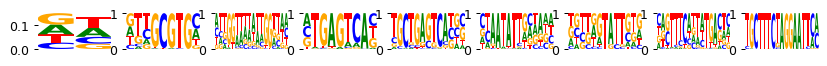

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  2.13it/s]


Current time: 2024-06-19 08:43:22.955475
	Loss: 188.534 , R2: 0.005
	Training time (model/function): (7.124s / 7.124s)
		per epoch (model/function): (0.509s/ 0.509s)
		per 1k samples: 0.095s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988855218381761, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.26it/s]


Current time: 2024-06-19 08:43:30.967596
	Loss: 159.805 , R2: 0.006
	Training time (model/function): (13.836s / 6.712s)
		per epoch (model/function): (0.988s/ 0.479s)
		per 1k samples: 0.089s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988855218381761, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  2.11it/s]


Current time: 2024-06-19 08:43:39.357784
	Loss: 147.788 , R2: 0.006
	Training time (model/function): (21.016s / 7.179s)
		per epoch (model/function): (1.501s/ 0.513s)
		per 1k samples: 0.095s
best loss 147.788
last five r2 values, by sequential filter optimization: ['0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988855218381761, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  2.11it/s]


Current time: 2024-06-19 08:43:49.156267
	Loss: 149.191 , R2: 0.006
	Training time (model/function): (28.221s / 7.205s)
		per epoch (model/function): (2.016s/ 0.515s)
		per 1k samples: 0.096s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988855218381761, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.16it/s]


Current time: 2024-06-19 08:43:57.518895
	Loss: 144.733 , R2: 0.006
	Training time (model/function): (35.288s / 7.067s)
		per epoch (model/function): (2.521s/ 0.505s)
		per 1k samples: 0.094s
best loss 144.733
last five r2 values, by sequential filter optimization: ['0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988855218381761, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.22it/s]


Current time: 2024-06-19 08:44:06.944049
	Loss: 148.301 , R2: 0.007
	Training time (model/function): (42.123s / 6.835s)
		per epoch (model/function): (3.009s/ 0.488s)
		per 1k samples: 0.091s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988855218381761, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  2.07it/s]


Current time: 2024-06-19 08:44:15.671157
	Loss: 144.480 , R2: 0.007
	Training time (model/function): (49.502s / 7.379s)
		per epoch (model/function): (3.536s/ 0.527s)
		per 1k samples: 0.098s
best loss 144.480
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988855218381761, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  2.14it/s]


Current time: 2024-06-19 08:44:25.233120
	Loss: 148.219 , R2: 0.007
	Training time (model/function): (56.588s / 7.087s)
		per epoch (model/function): (4.042s/ 0.506s)
		per 1k samples: 0.094s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988855218381761, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.20it/s]


Current time: 2024-06-19 08:44:33.514717
	Loss: 144.459 , R2: 0.007
	Training time (model/function): (63.522s / 6.934s)
		per epoch (model/function): (4.537s/ 0.495s)
		per 1k samples: 0.092s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988855218381761, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:07<00:00,  2.13it/s]


Current time: 2024-06-19 08:44:43.447566
	Loss: 148.215 , R2: 0.007
	Training time (model/function): (70.669s / 7.147s)
		per epoch (model/function): (5.048s/ 0.510s)
		per 1k samples: 0.095s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988855218381761, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:06<00:00,  2.15it/s]


Current time: 2024-06-19 08:44:51.865930
	Loss: 144.457 , R2: 0.007
	Training time (model/function): (77.731s / 7.062s)
		per epoch (model/function): (5.552s/ 0.504s)
		per 1k samples: 0.094s
best loss 144.457
last five r2 values, by sequential filter optimization: ['0.006', '0.006', '0.007', '0.007', '0.007']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988855218381761, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 77.73093128204346s
Time per epoch (total): 0.018 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_4/running_time_0.pkl
noack_2022 /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_4/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 out of 288...
break


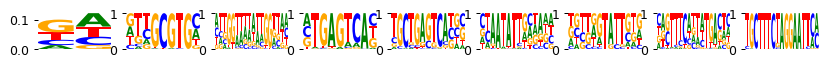

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:51<00:00,  3.42s/it]


Current time: 2024-06-19 08:46:02.185630
	Loss: 188.613 , R2: 0.003
	Training time (model/function): (51.402s / 51.402s)
		per epoch (model/function): (3.672s/ 3.672s)
		per 1k samples: 0.682s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989655069822416, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:50<00:00,  3.35s/it]


Current time: 2024-06-19 08:46:53.802224
	Loss: 159.806 , R2: 0.003
	Training time (model/function): (101.689s / 50.287s)
		per epoch (model/function): (7.263s/ 3.592s)
		per 1k samples: 0.667s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989655069822416, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:49<00:00,  3.28s/it]


Current time: 2024-06-19 08:47:44.402594
	Loss: 147.788 , R2: 0.004
	Training time (model/function): (150.931s / 49.242s)
		per epoch (model/function): (10.781s/ 3.517s)
		per 1k samples: 0.653s
best loss 147.788
last five r2 values, by sequential filter optimization: ['0.004']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989655069822416, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:48<00:00,  3.25s/it]


Current time: 2024-06-19 08:48:35.834254
	Loss: 149.198 , R2: 0.005
	Training time (model/function): (199.755s / 48.824s)
		per epoch (model/function): (14.268s/ 3.487s)
		per 1k samples: 0.648s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989655069822416, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:48<00:00,  3.26s/it]


Current time: 2024-06-19 08:49:26.107426
	Loss: 144.733 , R2: 0.006
	Training time (model/function): (248.677s / 48.922s)
		per epoch (model/function): (17.763s/ 3.494s)
		per 1k samples: 0.649s
best loss 144.733
last five r2 values, by sequential filter optimization: ['0.004', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989655069822416, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:49<00:00,  3.29s/it]


Current time: 2024-06-19 08:50:18.114976
	Loss: 148.310 , R2: 0.006
	Training time (model/function): (298.094s / 49.417s)
		per epoch (model/function): (21.292s/ 3.530s)
		per 1k samples: 0.656s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989655069822416, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:48<00:00,  3.25s/it]


Current time: 2024-06-19 08:51:08.276442
	Loss: 144.480 , R2: 0.006
	Training time (model/function): (346.978s / 48.884s)
		per epoch (model/function): (24.784s/ 3.492s)
		per 1k samples: 0.649s
best loss 144.480
last five r2 values, by sequential filter optimization: ['0.004', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989655069822416, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:49<00:00,  3.29s/it]


Current time: 2024-06-19 08:52:00.137926
	Loss: 148.233 , R2: 0.006
	Training time (model/function): (396.484s / 49.506s)
		per epoch (model/function): (28.320s/ 3.536s)
		per 1k samples: 0.657s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989655069822416, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:49<00:00,  3.30s/it]


Current time: 2024-06-19 08:52:50.956099
	Loss: 144.459 , R2: 0.006
	Training time (model/function): (446.105s / 49.621s)
		per epoch (model/function): (31.865s/ 3.544s)
		per 1k samples: 0.658s
best loss 144.459
last five r2 values, by sequential filter optimization: ['0.004', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989655069822416, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:51<00:00,  3.40s/it]


Current time: 2024-06-19 08:53:44.653033
	Loss: 148.232 , R2: 0.006
	Training time (model/function): (497.211s / 51.106s)
		per epoch (model/function): (35.515s/ 3.650s)
		per 1k samples: 0.678s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989655069822416, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:50<00:00,  3.37s/it]


Current time: 2024-06-19 08:54:36.613122
	Loss: 144.457 , R2: 0.006
	Training time (model/function): (547.923s / 50.712s)
		per epoch (model/function): (39.137s/ 3.622s)
		per 1k samples: 0.673s
best loss 144.457
last five r2 values, by sequential filter optimization: ['0.004', '0.006', '0.006', '0.006', '0.006']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9989655069822416, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 547.9225406646729s
Time per epoch (total): 0.126 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/noack_2022/episcanpy/mubind_output/obs2000/pwms/fold_4/running_time_1.pkl
85

/home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/pancreas_multiome_2022_processed_atac_obs5000_var15000.h5ad
pancreatic_endocrinogenesis (5000, 15000)
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinog

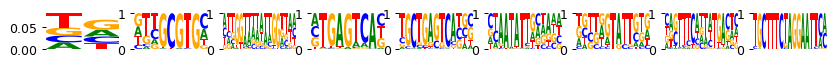

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:37<00:00,  2.53s/it]


Current time: 2024-06-19 08:55:49.090520
	Loss: 161.322 , R2: 0.316
	Training time (model/function): (38.560s / 38.560s)
		per epoch (model/function): (2.754s/ 2.754s)
		per 1k samples: 0.204s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998853539274426, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:37<00:00,  2.53s/it]


Current time: 2024-06-19 08:56:34.226748
	Loss: 149.813 , R2: 0.317
	Training time (model/function): (77.160s / 38.600s)
		per epoch (model/function): (5.511s/ 2.757s)
		per 1k samples: 0.204s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998853539274426, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:39<00:00,  2.61s/it]


Current time: 2024-06-19 08:57:20.816695
	Loss: 144.778 , R2: 0.317
	Training time (model/function): (117.077s / 39.917s)
		per epoch (model/function): (8.363s/ 2.851s)
		per 1k samples: 0.211s
best loss 144.778
last five r2 values, by sequential filter optimization: ['0.317']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998853539274426, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:37<00:00,  2.53s/it]


Current time: 2024-06-19 08:58:12.858794
	Loss: 148.418 , R2: 0.317
	Training time (model/function): (155.676s / 38.600s)
		per epoch (model/function): (11.120s/ 2.757s)
		per 1k samples: 0.204s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998853539274426, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:39<00:00,  2.65s/it]


Current time: 2024-06-19 08:59:00.256695
	Loss: 144.626 , R2: 0.317
	Training time (model/function): (196.160s / 40.484s)
		per epoch (model/function): (14.011s/ 2.892s)
		per 1k samples: 0.214s
best loss 144.626
last five r2 values, by sequential filter optimization: ['0.317', '0.317']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998853539274426, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:38<00:00,  2.54s/it]


Current time: 2024-06-19 08:59:52.506805
	Loss: 148.392 , R2: 0.317
	Training time (model/function): (235.030s / 38.871s)
		per epoch (model/function): (16.788s/ 2.776s)
		per 1k samples: 0.206s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998853539274426, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:39<00:00,  2.64s/it]


Current time: 2024-06-19 09:00:39.424360
	Loss: 144.624 , R2: 0.317
	Training time (model/function): (275.250s / 40.220s)
		per epoch (model/function): (19.661s/ 2.873s)
		per 1k samples: 0.213s
best loss 144.624
last five r2 values, by sequential filter optimization: ['0.317', '0.317', '0.317']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998853539274426, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:38<00:00,  2.54s/it]


Current time: 2024-06-19 09:01:31.638196
	Loss: 148.385 , R2: 0.317
	Training time (model/function): (314.073s / 38.823s)
		per epoch (model/function): (22.434s/ 2.773s)
		per 1k samples: 0.205s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998853539274426, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:37<00:00,  2.49s/it]


Current time: 2024-06-19 09:02:16.251733
	Loss: 144.624 , R2: 0.317
	Training time (model/function): (352.155s / 38.081s)
		per epoch (model/function): (25.154s/ 2.720s)
		per 1k samples: 0.201s
best loss 144.624
last five r2 values, by sequential filter optimization: ['0.317', '0.317', '0.317', '0.317']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998853539274426, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:35<00:00,  2.36s/it]


Current time: 2024-06-19 09:03:05.228057
	Loss: 148.379 , R2: 0.317
	Training time (model/function): (388.247s / 36.092s)
		per epoch (model/function): (27.732s/ 2.578s)
		per 1k samples: 0.191s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998853539274426, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:36<00:00,  2.46s/it]


Current time: 2024-06-19 09:03:49.381469
	Loss: 144.624 , R2: 0.317
	Training time (model/function): (425.873s / 37.626s)
		per epoch (model/function): (30.419s/ 2.688s)
		per 1k samples: 0.199s
best loss 144.623
last five r2 values, by sequential filter optimization: ['0.317', '0.317', '0.317', '0.317', '0.317']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.998853539274426, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 425.872740983963s
Time per epoch (total): 0.098 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_0/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_0/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0 o

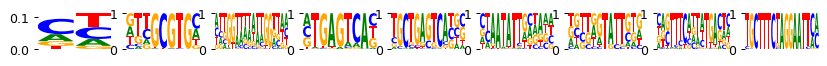

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:26<00:00, 17.74s/it]


Current time: 2024-06-19 09:10:02.892940
	Loss: 161.318 , R2: 0.070
	Training time (model/function): (266.666s / 266.666s)
		per epoch (model/function): (19.048s/ 19.048s)
		per 1k samples: 1.411s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996260666247473, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:26<00:00, 17.75s/it]


Current time: 2024-06-19 09:14:36.204989
	Loss: 149.809 , R2: 0.070
	Training time (model/function): (533.494s / 266.828s)
		per epoch (model/function): (38.107s/ 19.059s)
		per 1k samples: 1.412s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996260666247473, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:26<00:00, 17.78s/it]


Current time: 2024-06-19 09:19:10.195767
	Loss: 144.771 , R2: 0.070
	Training time (model/function): (800.877s / 267.383s)
		per epoch (model/function): (57.206s/ 19.099s)
		per 1k samples: 1.415s
best loss 144.771
last five r2 values, by sequential filter optimization: ['0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996260666247473, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:26<00:00, 17.76s/it]


Current time: 2024-06-19 09:23:50.369520
	Loss: 148.415 , R2: 0.070
	Training time (model/function): (1067.888s / 267.011s)
		per epoch (model/function): (76.278s/ 19.072s)
		per 1k samples: 1.413s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996260666247473, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:26<00:00, 17.80s/it]


Current time: 2024-06-19 09:28:24.552083
	Loss: 144.618 , R2: 0.070
	Training time (model/function): (1335.485s / 267.597s)
		per epoch (model/function): (95.392s/ 19.114s)
		per 1k samples: 1.416s
best loss 144.618
last five r2 values, by sequential filter optimization: ['0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996260666247473, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:26<00:00, 17.78s/it]


Current time: 2024-06-19 09:33:04.997020
	Loss: 148.397 , R2: 0.070
	Training time (model/function): (1602.881s / 267.396s)
		per epoch (model/function): (114.492s/ 19.100s)
		per 1k samples: 1.415s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996260666247473, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:26<00:00, 17.78s/it]


Current time: 2024-06-19 09:37:39.025965
	Loss: 144.616 , R2: 0.070
	Training time (model/function): (1870.282s / 267.400s)
		per epoch (model/function): (133.592s/ 19.100s)
		per 1k samples: 1.415s
best loss 144.616
last five r2 values, by sequential filter optimization: ['0.070', '0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996260666247473, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:26<00:00, 17.75s/it]


Current time: 2024-06-19 09:42:19.158515
	Loss: 148.397 , R2: 0.070
	Training time (model/function): (2137.166s / 266.884s)
		per epoch (model/function): (152.655s/ 19.063s)
		per 1k samples: 1.412s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996260666247473, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:26<00:00, 17.75s/it]


Current time: 2024-06-19 09:46:52.696345
	Loss: 144.616 , R2: 0.070
	Training time (model/function): (2404.048s / 266.882s)
		per epoch (model/function): (171.718s/ 19.063s)
		per 1k samples: 1.412s
best loss 144.616
last five r2 values, by sequential filter optimization: ['0.070', '0.070', '0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996260666247473, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weigh

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:26<00:00, 17.76s/it]


Current time: 2024-06-19 09:51:32.905756
	Loss: 148.398 , R2: 0.070
	Training time (model/function): (2671.110s / 267.063s)
		per epoch (model/function): (190.794s/ 19.076s)
		per 1k samples: 1.413s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996260666247473, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:26<00:00, 17.79s/it]


Current time: 2024-06-19 09:56:07.019031
	Loss: 144.616 , R2: 0.070
	Training time (model/function): (2938.590s / 267.480s)
		per epoch (model/function): (209.899s/ 19.106s)
		per 1k samples: 1.415s
best loss 144.616
last five r2 values, by sequential filter optimization: ['0.070', '0.070', '0.070', '0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996260666247473, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 2938.5899233818054s
Time per epoch (total): 0.676 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_0/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_1/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pw

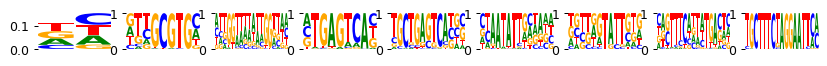

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:32<00:00,  2.19s/it]


Current time: 2024-06-19 09:58:29.024090
	Loss: 161.324 , R2: 0.317
	Training time (model/function): (33.457s / 33.457s)
		per epoch (model/function): (2.390s/ 2.390s)
		per 1k samples: 0.177s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987880684788489, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:32<00:00,  2.19s/it]


Current time: 2024-06-19 09:59:08.656273
	Loss: 149.814 , R2: 0.318
	Training time (model/function): (66.966s / 33.508s)
		per epoch (model/function): (4.783s/ 2.393s)
		per 1k samples: 0.177s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987880684788489, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:34<00:00,  2.28s/it]


Current time: 2024-06-19 09:59:49.477398
	Loss: 144.779 , R2: 0.318
	Training time (model/function): (101.722s / 34.756s)
		per epoch (model/function): (7.266s/ 2.483s)
		per 1k samples: 0.184s
best loss 144.779
last five r2 values, by sequential filter optimization: ['0.318']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987880684788489, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:32<00:00,  2.19s/it]


Current time: 2024-06-19 10:00:35.217829
	Loss: 148.419 , R2: 0.318
	Training time (model/function): (135.159s / 33.437s)
		per epoch (model/function): (9.654s/ 2.388s)
		per 1k samples: 0.177s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987880684788489, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:34<00:00,  2.29s/it]


Current time: 2024-06-19 10:01:16.259173
	Loss: 144.627 , R2: 0.318
	Training time (model/function): (170.133s / 34.975s)
		per epoch (model/function): (12.152s/ 2.498s)
		per 1k samples: 0.185s
best loss 144.627
last five r2 values, by sequential filter optimization: ['0.318', '0.318']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987880684788489, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:32<00:00,  2.18s/it]


Current time: 2024-06-19 10:02:01.860418
	Loss: 148.392 , R2: 0.318
	Training time (model/function): (203.435s / 33.302s)
		per epoch (model/function): (14.531s/ 2.379s)
		per 1k samples: 0.176s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987880684788489, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:34<00:00,  2.28s/it]


Current time: 2024-06-19 10:02:42.756763
	Loss: 144.625 , R2: 0.318
	Training time (model/function): (238.189s / 34.754s)
		per epoch (model/function): (17.014s/ 2.482s)
		per 1k samples: 0.184s
best loss 144.624
last five r2 values, by sequential filter optimization: ['0.318', '0.318', '0.318']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987880684788489, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:32<00:00,  2.19s/it]


Current time: 2024-06-19 10:03:28.388456
	Loss: 148.383 , R2: 0.318
	Training time (model/function): (271.610s / 33.420s)
		per epoch (model/function): (19.401s/ 2.387s)
		per 1k samples: 0.177s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987880684788489, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:33<00:00,  2.26s/it]


Current time: 2024-06-19 10:04:09.085043
	Loss: 144.625 , R2: 0.318
	Training time (model/function): (306.138s / 34.529s)
		per epoch (model/function): (21.867s/ 2.466s)
		per 1k samples: 0.183s
best loss 144.624
last five r2 values, by sequential filter optimization: ['0.318', '0.318', '0.318', '0.318']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987880684788489, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:32<00:00,  2.19s/it]


Current time: 2024-06-19 10:04:54.737328
	Loss: 148.379 , R2: 0.318
	Training time (model/function): (339.678s / 33.540s)
		per epoch (model/function): (24.263s/ 2.396s)
		per 1k samples: 0.177s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987880684788489, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:34<00:00,  2.28s/it]


Current time: 2024-06-19 10:05:35.677722
	Loss: 144.624 , R2: 0.318
	Training time (model/function): (374.547s / 34.869s)
		per epoch (model/function): (26.753s/ 2.491s)
		per 1k samples: 0.184s
best loss 144.624
last five r2 values, by sequential filter optimization: ['0.318', '0.318', '0.318', '0.318', '0.318']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987880684788489, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 374.54709553718567s
Time per epoch (total): 0.086 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_1/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_1/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None


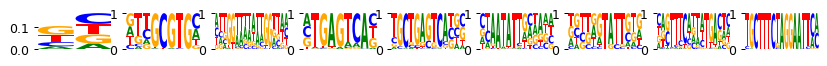

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:22<00:00, 17.52s/it]


Current time: 2024-06-19 10:11:44.609797
	Loss: 161.319 , R2: 0.070
	Training time (model/function): (263.403s / 263.403s)
		per epoch (model/function): (18.814s/ 18.814s)
		per 1k samples: 1.394s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996043528922942, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:23<00:00, 17.54s/it]


Current time: 2024-06-19 10:16:14.407738
	Loss: 149.809 , R2: 0.070
	Training time (model/function): (527.046s / 263.643s)
		per epoch (model/function): (37.646s/ 18.832s)
		per 1k samples: 1.395s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996043528922942, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:23<00:00, 17.54s/it]


Current time: 2024-06-19 10:20:44.518511
	Loss: 144.771 , R2: 0.070
	Training time (model/function): (790.910s / 263.864s)
		per epoch (model/function): (56.494s/ 18.847s)
		per 1k samples: 1.396s
best loss 144.771
last five r2 values, by sequential filter optimization: ['0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996043528922942, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:23<00:00, 17.54s/it]


Current time: 2024-06-19 10:25:20.754640
	Loss: 148.417 , R2: 0.070
	Training time (model/function): (1054.602s / 263.692s)
		per epoch (model/function): (75.329s/ 18.835s)
		per 1k samples: 1.395s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996043528922942, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:24<00:00, 17.60s/it]


Current time: 2024-06-19 10:29:51.660786
	Loss: 144.619 , R2: 0.070
	Training time (model/function): (1319.248s / 264.646s)
		per epoch (model/function): (94.232s/ 18.903s)
		per 1k samples: 1.400s
best loss 144.618
last five r2 values, by sequential filter optimization: ['0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996043528922942, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:23<00:00, 17.54s/it]


Current time: 2024-06-19 10:34:28.043178
	Loss: 148.400 , R2: 0.070
	Training time (model/function): (1583.042s / 263.795s)
		per epoch (model/function): (113.074s/ 18.842s)
		per 1k samples: 1.396s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996043528922942, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:23<00:00, 17.57s/it]


Current time: 2024-06-19 10:38:58.458334
	Loss: 144.617 , R2: 0.070
	Training time (model/function): (1847.209s / 264.167s)
		per epoch (model/function): (131.944s/ 18.869s)
		per 1k samples: 1.398s
best loss 144.616
last five r2 values, by sequential filter optimization: ['0.070', '0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996043528922942, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:22<00:00, 17.52s/it]


Current time: 2024-06-19 10:43:34.220749
	Loss: 148.399 , R2: 0.070
	Training time (model/function): (2110.589s / 263.379s)
		per epoch (model/function): (150.756s/ 18.813s)
		per 1k samples: 1.393s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996043528922942, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:23<00:00, 17.57s/it]


Current time: 2024-06-19 10:48:04.600555
	Loss: 144.616 , R2: 0.070
	Training time (model/function): (2374.738s / 264.149s)
		per epoch (model/function): (169.624s/ 18.868s)
		per 1k samples: 1.398s
best loss 144.616
last five r2 values, by sequential filter optimization: ['0.070', '0.070', '0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996043528922942, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weigh

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:23<00:00, 17.54s/it]


Current time: 2024-06-19 10:52:40.735852
	Loss: 148.398 , R2: 0.070
	Training time (model/function): (2638.464s / 263.727s)
		per epoch (model/function): (188.462s/ 18.838s)
		per 1k samples: 1.395s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996043528922942, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:23<00:00, 17.60s/it]


Current time: 2024-06-19 10:57:11.514850
	Loss: 144.618 , R2: 0.070
	Training time (model/function): (2903.092s / 264.628s)
		per epoch (model/function): (207.364s/ 18.902s)
		per 1k samples: 1.400s
best loss 144.616
last five r2 values, by sequential filter optimization: ['0.070', '0.070', '0.070', '0.070', '0.070']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996043528922942, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 2903.092219352722s
Time per epoch (total): 0.667 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_1/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_2/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwm

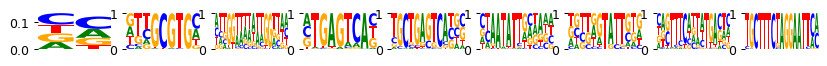

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:34<00:00,  2.27s/it]


Current time: 2024-06-19 10:59:34.009664
	Loss: 161.322 , R2: 0.318
	Training time (model/function): (34.735s / 34.735s)
		per epoch (model/function): (2.481s/ 2.481s)
		per 1k samples: 0.184s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987950307258138, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:33<00:00,  2.27s/it]


Current time: 2024-06-19 11:00:14.835818
	Loss: 149.814 , R2: 0.318
	Training time (model/function): (69.367s / 34.631s)
		per epoch (model/function): (4.955s/ 2.474s)
		per 1k samples: 0.183s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987950307258138, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:35<00:00,  2.36s/it]


Current time: 2024-06-19 11:00:57.208331
	Loss: 144.780 , R2: 0.318
	Training time (model/function): (105.476s / 36.110s)
		per epoch (model/function): (7.534s/ 2.579s)
		per 1k samples: 0.191s
best loss 144.780
last five r2 values, by sequential filter optimization: ['0.318']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987950307258138, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:34<00:00,  2.27s/it]


Current time: 2024-06-19 11:01:44.501809
	Loss: 148.418 , R2: 0.319
	Training time (model/function): (140.211s / 34.735s)
		per epoch (model/function): (10.015s/ 2.481s)
		per 1k samples: 0.184s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987950307258138, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:35<00:00,  2.38s/it]


Current time: 2024-06-19 11:02:26.964525
	Loss: 144.627 , R2: 0.319
	Training time (model/function): (176.497s / 36.286s)
		per epoch (model/function): (12.607s/ 2.592s)
		per 1k samples: 0.192s
best loss 144.626
last five r2 values, by sequential filter optimization: ['0.318', '0.319']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987950307258138, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:34<00:00,  2.27s/it]


Current time: 2024-06-19 11:03:14.184965
	Loss: 148.392 , R2: 0.319
	Training time (model/function): (211.181s / 34.684s)
		per epoch (model/function): (15.084s/ 2.477s)
		per 1k samples: 0.183s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987950307258138, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:35<00:00,  2.37s/it]


Current time: 2024-06-19 11:03:56.512661
	Loss: 144.625 , R2: 0.319
	Training time (model/function): (247.302s / 36.121s)
		per epoch (model/function): (17.664s/ 2.580s)
		per 1k samples: 0.191s
best loss 144.624
last five r2 values, by sequential filter optimization: ['0.318', '0.319', '0.319']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987950307258138, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:33<00:00,  2.26s/it]


Current time: 2024-06-19 11:04:43.602773
	Loss: 148.393 , R2: 0.319
	Training time (model/function): (281.875s / 34.573s)
		per epoch (model/function): (20.134s/ 2.470s)
		per 1k samples: 0.183s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987950307258138, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:35<00:00,  2.35s/it]


Current time: 2024-06-19 11:05:25.638167
	Loss: 144.624 , R2: 0.319
	Training time (model/function): (317.735s / 35.860s)
		per epoch (model/function): (22.695s/ 2.561s)
		per 1k samples: 0.190s
best loss 144.624
last five r2 values, by sequential filter optimization: ['0.318', '0.319', '0.319', '0.319']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987950307258138, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:34<00:00,  2.27s/it]


Current time: 2024-06-19 11:06:12.833957
	Loss: 148.391 , R2: 0.319
	Training time (model/function): (352.387s / 34.652s)
		per epoch (model/function): (25.171s/ 2.475s)
		per 1k samples: 0.183s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987950307258138, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:35<00:00,  2.36s/it]


Current time: 2024-06-19 11:06:55.025866
	Loss: 144.624 , R2: 0.319
	Training time (model/function): (388.394s / 36.006s)
		per epoch (model/function): (27.742s/ 2.572s)
		per 1k samples: 0.190s
best loss 144.624
last five r2 values, by sequential filter optimization: ['0.318', '0.319', '0.319', '0.319', '0.319']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9987950307258138, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 388.39385771751404s
Time per epoch (total): 0.089 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_2/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_2/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None


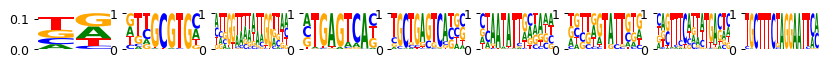

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:24<00:00, 17.63s/it]


Current time: 2024-06-19 11:13:06.527987
	Loss: 161.319 , R2: 0.068
	Training time (model/function): (265.134s / 265.134s)
		per epoch (model/function): (18.938s/ 18.938s)
		per 1k samples: 1.403s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996163379710484, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:24<00:00, 17.61s/it]


Current time: 2024-06-19 11:17:37.673343
	Loss: 149.809 , R2: 0.068
	Training time (model/function): (529.951s / 264.816s)
		per epoch (model/function): (37.854s/ 18.915s)
		per 1k samples: 1.401s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996163379710484, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:24<00:00, 17.66s/it]


Current time: 2024-06-19 11:22:09.499449
	Loss: 144.770 , R2: 0.068
	Training time (model/function): (795.447s / 265.496s)
		per epoch (model/function): (56.818s/ 18.964s)
		per 1k samples: 1.405s
best loss 144.770
last five r2 values, by sequential filter optimization: ['0.068']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996163379710484, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:24<00:00, 17.61s/it]


Current time: 2024-06-19 11:26:47.009651
	Loss: 148.417 , R2: 0.068
	Training time (model/function): (1060.301s / 264.854s)
		per epoch (model/function): (75.736s/ 18.918s)
		per 1k samples: 1.401s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996163379710484, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:25<00:00, 17.67s/it]


Current time: 2024-06-19 11:31:18.956854
	Loss: 144.618 , R2: 0.068
	Training time (model/function): (1326.020s / 265.719s)
		per epoch (model/function): (94.716s/ 18.980s)
		per 1k samples: 1.406s
best loss 144.618
last five r2 values, by sequential filter optimization: ['0.068', '0.068']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996163379710484, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:24<00:00, 17.62s/it]


Current time: 2024-06-19 11:35:56.581640
	Loss: 148.401 , R2: 0.068
	Training time (model/function): (1591.034s / 265.014s)
		per epoch (model/function): (113.645s/ 18.930s)
		per 1k samples: 1.402s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996163379710484, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:25<00:00, 17.69s/it]


Current time: 2024-06-19 11:40:28.924592
	Loss: 144.617 , R2: 0.068
	Training time (model/function): (1857.050s / 266.016s)
		per epoch (model/function): (132.646s/ 19.001s)
		per 1k samples: 1.407s
best loss 144.616
last five r2 values, by sequential filter optimization: ['0.068', '0.068', '0.068']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996163379710484, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:24<00:00, 17.65s/it]


Current time: 2024-06-19 11:45:06.811231
	Loss: 148.403 , R2: 0.068
	Training time (model/function): (2122.398s / 265.349s)
		per epoch (model/function): (151.600s/ 18.953s)
		per 1k samples: 1.404s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996163379710484, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:25<00:00, 17.68s/it]


Current time: 2024-06-19 11:49:38.893815
	Loss: 144.616 , R2: 0.068
	Training time (model/function): (2388.178s / 265.779s)
		per epoch (model/function): (170.584s/ 18.984s)
		per 1k samples: 1.406s
best loss 144.616
last five r2 values, by sequential filter optimization: ['0.068', '0.068', '0.068', '0.068']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996163379710484, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weigh

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:24<00:00, 17.65s/it]


Current time: 2024-06-19 11:54:16.956151
	Loss: 148.398 , R2: 0.068
	Training time (model/function): (2653.621s / 265.443s)
		per epoch (model/function): (189.544s/ 18.960s)
		per 1k samples: 1.404s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996163379710484, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [04:26<00:00, 17.75s/it]


Current time: 2024-06-19 11:58:50.778949
	Loss: 144.618 , R2: 0.068
	Training time (model/function): (2920.461s / 266.840s)
		per epoch (model/function): (208.604s/ 19.060s)
		per 1k samples: 1.412s
best loss 144.616
last five r2 values, by sequential filter optimization: ['0.068', '0.068', '0.068', '0.068', '0.068']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9996163379710484, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 2920.460880756378s
Time per epoch (total): 0.671 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_2/running_time_1.pkl
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_3/model.pt
False /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwm

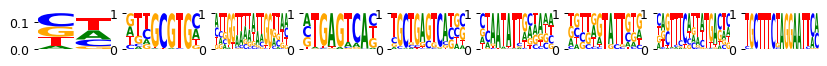

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:34<00:00,  2.28s/it]


Current time: 2024-06-19 12:02:41.264061
	Loss: 161.322 , R2: 0.314
	Training time (model/function): (34.862s / 34.862s)
		per epoch (model/function): (2.490s/ 2.490s)
		per 1k samples: 0.184s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988742947551044, pvalue=0.0))
optimization of dinuc is not valid for the intercept (filter=0). Skip...
current kernel 50

### next filter to optimize 50 

FREEZING KERNELS
optimizing feature type mono
next kernels {50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:33<00:00,  2.26s/it]


Current time: 2024-06-19 12:03:22.076071
	Loss: 149.814 , R2: 0.315
	Training time (model/function): (69.463s / 34.601s)
		per epoch (model/function): (4.962s/ 2.472s)
		per 1k samples: 0.183s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988742947551044, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:35<00:00,  2.37s/it]


Current time: 2024-06-19 12:04:04.555142
	Loss: 144.779 , R2: 0.315
	Training time (model/function): (105.666s / 36.202s)
		per epoch (model/function): (7.548s/ 2.586s)
		per 1k samples: 0.192s
best loss 144.779
last five r2 values, by sequential filter optimization: ['0.315']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988742947551044, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 100

### next filter to optimize 100 

FREEZING KERNELS
optimizing feature type mono
next kernels {128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:34<00:00,  2.28s/it]


Current time: 2024-06-19 12:04:51.877581
	Loss: 148.418 , R2: 0.315
	Training time (model/function): (140.444s / 34.779s)
		per epoch (model/function): (10.032s/ 2.484s)
		per 1k samples: 0.184s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988742947551044, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:35<00:00,  2.38s/it]


Current time: 2024-06-19 12:05:34.393378
	Loss: 144.626 , R2: 0.315
	Training time (model/function): (176.784s / 36.340s)
		per epoch (model/function): (12.627s/ 2.596s)
		per 1k samples: 0.192s
best loss 144.626
last five r2 values, by sequential filter optimization: ['0.315', '0.315']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988742947551044, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 150

### next filter to optimize 150 

FREEZING KERNELS
optimizing feature type mono
next kernels {150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:34<00:00,  2.28s/it]


Current time: 2024-06-19 12:06:21.773646
	Loss: 148.391 , R2: 0.315
	Training time (model/function): (211.616s / 34.832s)
		per epoch (model/function): (15.115s/ 2.488s)
		per 1k samples: 0.184s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988742947551044, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:35<00:00,  2.37s/it]


Current time: 2024-06-19 12:07:04.146739
	Loss: 144.624 , R2: 0.315
	Training time (model/function): (247.817s / 36.201s)
		per epoch (model/function): (17.701s/ 2.586s)
		per 1k samples: 0.192s
best loss 144.624
last five r2 values, by sequential filter optimization: ['0.315', '0.315', '0.315']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988742947551044, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 200

### next filter to optimize 200 

FREEZING KERNELS
optimizing feature type mono
next kernels {200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:34<00:00,  2.27s/it]


Current time: 2024-06-19 12:07:51.424553
	Loss: 148.384 , R2: 0.315
	Training time (model/function): (282.566s / 34.749s)
		per epoch (model/function): (20.183s/ 2.482s)
		per 1k samples: 0.184s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988742947551044, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:35<00:00,  2.35s/it]


Current time: 2024-06-19 12:08:33.472094
	Loss: 144.624 , R2: 0.315
	Training time (model/function): (318.440s / 35.874s)
		per epoch (model/function): (22.746s/ 2.562s)
		per 1k samples: 0.190s
best loss 144.624
last five r2 values, by sequential filter optimization: ['0.315', '0.315', '0.315', '0.315']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988742947551044, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...
current kernel 250

### next filter to optimize 250 

FREEZING KERNELS
optimizing feature type mono
next kernels {256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 250, 251, 252, 253, 254, 255}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:34<00:00,  2.27s/it]


Current time: 2024-06-19 12:09:20.664859
	Loss: 148.384 , R2: 0.315
	Training time (model/function): (353.124s / 34.684s)
		per epoch (model/function): (25.223s/ 2.477s)
		per 1k samples: 0.183s
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988742947551044, pvalue=0.0))


final refinement step (after shift)...unfreezing all layers
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 15/15 [00:35<00:00,  2.37s/it]


Current time: 2024-06-19 12:10:03.070524
	Loss: 144.624 , R2: 0.315
	Training time (model/function): (389.260s / 36.136s)
		per epoch (model/function): (27.804s/ 2.581s)
		per 1k samples: 0.191s
best loss 144.624
last five r2 values, by sequential filter optimization: ['0.315', '0.315', '0.315', '0.315', '0.315']
('etas corr with lib_sizes (before refinement)', SignificanceResult(statistic=0.9988742947551044, pvalue=0.0))
optimizing feature type dinuc
the optimization of dinucleotide features is skipped...

optimization finished:
total time: 389.2599256038666s
Time per epoch (total): 0.089 s
saving model...
True /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_3/running_time_0.pkl
pancreatic_endocrinogenesis /home/ilibarra/workspace/theislab/mubind/data/pancreatic_endocrinogenesis/random/mubind_output/obs5000/pwms/fold_3/model_1.pt

optimize log dynamics True
# motifs loaded 2179
setting up log dynamic
True
12
order None
0

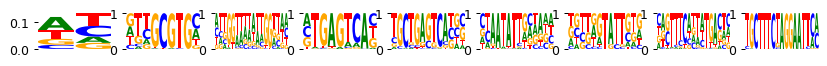

verbose=2
current kernel 0

### next filter to optimize 0 (intercept)

FREEZING KERNELS
optimizing feature type mono
next kernels {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49}
filters mask None
optimizer:  Adam , criterion: PoissonLoss 
epochs: 15 
early_stopping: 250
lr= 0.01, weight_decay= 0, dir weight= 0


 47%|██████████████████████████████████████████████████████████████████████████████████████████                                                                                                       | 7/15 [02:03<02:21, 17.64s/it]

: 

In [ ]:
import anndata
anndata.__version__

'0.10.7'